In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
cd /content/drive/My Drive

/content/drive/My Drive


In [ ]:
import pandas as pd
import nltk
from nltk.corpus import stopwords
from nltk.tokenize import word_tokenize
from nltk.stem import WordNetLemmatizer
from sklearn.metrics.pairwise import cosine_similarity
from sklearn.feature_extraction.text import CountVectorizer, TfidfVectorizer
from sklearn.metrics.pairwise import cosine_similarity
from sklearn.decomposition import TruncatedSVD
import re
import string
import seaborn as sns
import matplotlib.pyplot as plt


**Question 2**

In [ ]:
# Load the file into a pandas DataFrame
df = pd.read_csv('imdb_top_1000.csv')

In [ ]:
df.head(10)

,Poster_Link,Series_Title,Released_Year,Certificate,Runtime,Genre,IMDB_Rating,Overview,Meta_score,Director,Star1,Star2,Star3,Star4
0,https://m.media-amazon.com/images/M/MV5BMDFkYT...,The Shawshank Redemption,1994,A,142 min,Drama,9.3,Two imprisoned men bond over a number of years...,80.0,Frank Darabont,Tim Robbins,Morgan Freeman,Bob Gunton,William Sadler
1,https://m.media-amazon.com/images/M/MV5BM2MyNj...,The Godfather,1972,A,175 min,"Crime, Drama",9.2,An organized crime dynasty's aging patriarch t...,100.0,Francis Ford Coppola,Marlon Brando,Al Pacino,James Caan,Diane Keaton
2,https://m.media-amazon.com/images/M/MV5BMTMxNT...,The Dark Knight,2008,UA,152 min,"Action, Crime, Drama",9.0,When the menace known as the Joker wreaks havo...,84.0,Christopher Nolan,Christian Bale,Heath Ledger,Aaron Eckhart,Michael Caine
3,https://m.media-amazon.com/images/M/MV5BMWMwMG...,The Godfather: Part II,1974,A,202 min,"Crime, Drama",9.0,The early life and career of Vito Corleone in ...,90.0,Francis Ford Coppola,Al Pacino,Robert De Niro,Robert Duvall,Diane Keaton
4,https://m.media-amazon.com/images/M/MV5BMWU4N2...,12 Angry Men,1957,U,96 min,"Crime, Drama",9.0,A jury holdout attempts to prevent a miscarria...,96.0,Sidney Lumet,Henry Fonda,Lee J. Cobb,Martin Balsam,John Fiedler
5,https://m.media-amazon.com/images/M/MV5BNzA5ZD...,The Lord of the Rings: The Return of the King,2003,U,201 min,"Action, Adventure, Drama",8.9,Gandalf and Aragorn lead the World of Men agai...,94.0,Peter Jackson,Elijah Wood,Viggo Mortensen,Ian McKellen,Orlando Bloom
6,https://m.media-amazon.com/images/M/MV5BNGNhMD...,Pulp Fiction,1994,A,154 min,"Crime, Drama",8.9,"The lives of two mob hitmen, a boxer, a gangst...",94.0,Quentin Tarantino,John Travolta,Uma Thurman,Samuel L. Jackson,Bruce Willis
7,https://m.media-amazon.com/images/M/MV5BNDE4OT...,Schindler's List,1993,A,195 min,"Biography, Drama, History",8.9,"In German-occupied Poland during World War II,...",94.0,Steven Spielberg,Liam Neeson,Ralph Fiennes,Ben Kingsley,Caroline Goodall
8,https://m.media-amazon.com/images/M/MV5BMjAxMz...,Inception,2010,UA,148 min,"Action, Adventure, Sci-Fi",8.8,A thief who steals corporate secrets through t...,74.0,Christopher Nolan,Leonardo DiCaprio,Joseph Gordon-Levitt,Elliot Page,Ken Watanabe
9,https://m.media-amazon.com/images/M/MV5BMmEzNT...,Fight Club,1999,A,139 min,Drama,8.8,An insomniac office worker and a devil-may-car...,66.0,David Fincher,Brad Pitt,Edward Norton,Meat Loaf,Zach Grenier


**Question 3**

In [ ]:
# Download necessary resources
nltk.download('punkt')  # For tokenization
nltk.download('stopwords')  # For stopword removal
nltk.download('wordnet')  # For lemmatization
nltk.download('punkt_tab')

[nltk_data] Downloading package punkt to /root/nltk_data...
[nltk_data]   Unzipping tokenizers/punkt.zip.
[nltk_data] Downloading package stopwords to /root/nltk_data...
[nltk_data]   Unzipping corpora/stopwords.zip.
[nltk_data] Downloading package wordnet to /root/nltk_data...
[nltk_data] Downloading package punkt_tab to /root/nltk_data...
[nltk_data]   Unzipping tokenizers/punkt_tab.zip.


True

In [ ]:
# Load the stopwords
stop_words = set(stopwords.words('english'))

# Initialize the lemmatizer
lemmatizer = WordNetLemmatizer()

In [ ]:
def text_preprocess(text):
    # Tokenization
    tokens = word_tokenize(text)

    # Lowercasing
    tokens = [token.lower() for token in tokens]

    # Punctuation removal
    tokens = [token for token in tokens if token not in string.punctuation]

    # Stopword removal
    stop_words = set(stopwords.words('english'))
    tokens = [token for token in tokens if token not in stop_words]

    # Lemmatization
    lemmatizer = WordNetLemmatizer()
    tokens = [lemmatizer.lemmatize(token) for token in tokens]

    # Remove numbers
    number_pattern = r'\b(?:zero|one|two|three|four|five|six|seven|eight|nine|ten|eleven|twelve|thirteen|fourteen|fifteen|sixteen|seventeen|eighteen|nineteen|twenty|thirty|forty|fifty|sixty|seventy|eighty|ninety|hundred|thousand|\d+)\b'
    tokens = [re.sub(number_pattern, '', token) for token in tokens]

    # Join tokens back into a single string
    preprocessed_text = ' '.join(tokens)

    # Remove additional whitespace
    preprocessed_text = re.sub(r'\s+', ' ', preprocessed_text)

    return preprocessed_text.strip()


In [ ]:
# Apply preprocessing to the 'Overview' column
df['Preprocessed_Overview'] = df['Overview'].apply(text_preprocess)

In [ ]:
df['Overview'][10]

'A meek Hobbit from the Shire and eight companions set out on a journey to destroy the powerful One Ring and save Middle-earth from the Dark Lord Sauron.'

In [ ]:
df['Preprocessed_Overview'][10]

'meek hobbit shire companion set journey destroy powerful ring save middle-earth dark lord sauron'

***Recommendations based on Overview , Director , Star1 , Star 2 , Star 3 ***

In [ ]:
import pandas as pd
import numpy as np
from sklearn.feature_extraction.text import TfidfVectorizer
from sklearn.metrics.pairwise import cosine_similarity
import matplotlib.pyplot as plt
import seaborn as sns
import re

def text_preprocess(text):
    """Clean and normalize text"""
    if pd.isna(text):
        return ""
    # Convert to lowercase and remove extra spaces
    text = str(text).lower().strip()
    # Remove punctuation and special characters (optional)
    text = re.sub(r'[^\w\s]', ' ', text)
    # Remove extra whitespaces
    text = re.sub(r'\s+', ' ', text)
    return text

def prepare_movie_features(df):
    """
    Prepare and combine movie features without using weights

    Parameters:
    df (pandas.DataFrame): DataFrame containing movie data

    Returns:
    tuple: Combined feature matrix and indices mapping
    """
    # Preprocess each feature
    df['Overview_Clean'] = df['Overview'].apply(text_preprocess)
    df['Director_Clean'] = df['Director'].apply(text_preprocess)

    # Combine all stars into a single feature
    df['Stars_Combined'] = df.apply(
        lambda row: ' '.join(filter(None, [
            text_preprocess(row.get('Star1', '')),
            text_preprocess(row.get('Star2', '')),
            text_preprocess(row.get('Star3', ''))
        ])),
        axis=1
    )

    # Create a single combined content column
    # We're simply concatenating all features with spaces
    df['Combined_Features'] = df.apply(
        lambda row: ' '.join(filter(None, [
            row['Overview_Clean'],
            row['Director_Clean'],
            row['Stars_Combined']
        ])),
        axis=1
    )

    # Create TF-IDF vectors for the combined features
    tfidf = TfidfVectorizer(stop_words='english')
    feature_matrix = tfidf.fit_transform(df['Combined_Features'])

    # Calculate cosine similarity matrix
    cosine_sim = cosine_similarity(feature_matrix)

    # Create indices mapping for lookups
    indices = pd.Series(df.index, index=df['Series_Title']).drop_duplicates()

    return cosine_sim, indices

def get_recommendations(title, similarity_matrix, indices, df, top_n=10):
    """
    Get movie recommendations based on similarity

    Parameters:
    title (str): Movie title to get recommendations for
    similarity_matrix (numpy.ndarray): Similarity matrix
    indices (pandas.Series): Series mapping movie titles to indices
    df (pandas.DataFrame): Original dataframe with movie data
    top_n (int): Number of recommendations to return

    Returns:
    pandas.DataFrame: DataFrame with recommended movies and their similarity scores
    """
    # Get the index of the movie
    try:
        idx = indices[title]
    except KeyError:
        return f"Movie '{title}' not found in the database."

    # Get similarity scores for all movies with the target movie
    sim_scores = list(enumerate(similarity_matrix[idx]))

    # Sort movies based on similarity scores
    sim_scores = sorted(sim_scores, key=lambda x: x[1], reverse=True)

    # Get top N most similar movies (excluding the movie itself)
    sim_scores = sim_scores[1:top_n+1]

    # Get movie indices
    movie_indices = [i[0] for i in sim_scores]

    # Return recommended movies with similarity scores
    recommendations = df.iloc[movie_indices][['Series_Title', 'Overview', 'Director', 'Star1', 'Star2', 'Star3']]

    # Add similarity scores to the output
    recommendations['Similarity_Score'] = [i[1] for i in sim_scores]

    return recommendations

def visualize_recommendations(recommendations, title):
    """
    Create a bar chart visualization of movie recommendations based on similarity scores

    Parameters:
    recommendations (pandas.DataFrame): DataFrame containing recommended movies and similarity scores
    title (str): Original movie title used for recommendations
    """
    # Check if recommendations is a DataFrame (successful recommendation)
    if not isinstance(recommendations, pd.DataFrame):
        print(recommendations)  # Print error message if not a DataFrame
        return

    # Create a figure with appropriate size
    plt.figure(figsize=(12, 8))

    # Sort by similarity score (highest first)
    recommendations_sorted = recommendations.sort_values('Similarity_Score', ascending=False)

    # Create a bar chart using seaborn for better aesthetics
    ax = sns.barplot(
        x='Similarity_Score',
        y='Series_Title',
        data=recommendations_sorted,
        palette='viridis'
    )

    # Add values on the bars
    for i, v in enumerate(recommendations_sorted['Similarity_Score']):
        ax.text(v + 0.01, i, f'{v:.3f}', va='center')

    # Set plot title and labels
    plt.title(f'Movies Similar to "{title}"', fontsize=16, pad=20)
    plt.xlabel('Similarity Score', fontsize=12)
    plt.ylabel('Movie Title', fontsize=12)
    plt.xlim(0, max(recommendations_sorted['Similarity_Score']) * 1.15)  # Add some padding

    # Adjust layout and display
    plt.tight_layout()
    plt.grid(axis='x', linestyle='--', alpha=0.7)
    plt.show()

# Full example of how to use the system
def run_movie_recommender(df, movie_title="The Dark Knight", top_n=20):
    """
    Run the movie recommender system for a given title

    Parameters:
    df (pandas.DataFrame): DataFrame containing movie data
    movie_title (str): Movie title to get recommendations for
    top_n (int): Number of recommendations to return

    Returns:
    pandas.DataFrame: DataFrame with recommended movies
    """
    # Prepare features and calculate similarity
    similarity_matrix, indices = prepare_movie_features(df)

    # Get and display recommendations
    recommendations = get_recommendations(movie_title, similarity_matrix, indices, df, top_n)

    # Print tabular results
    if isinstance(recommendations, pd.DataFrame):
        print(f"Top {top_n} movies similar to '{movie_title}':")
        print(recommendations[['Series_Title', 'Similarity_Score']].to_string(index=False))

        # Visualize the recommendations
        visualize_recommendations(recommendations, movie_title)
    else:
        print(recommendations)  # Print error message

    return recommendations




Top 20 movies similar to 'Prisoners':
              Series_Title  Similarity_Score
         Blade Runner 2049          0.136844
                     Logan          0.110356
        Brokeback Mountain          0.103090
              End of Watch          0.100548
                   Arrival          0.099522
                 Incendies          0.096806
              The Prestige          0.093602
X-Men: Days of Future Past          0.089850
                   Sicario          0.089619
               October Sky          0.082211
              Nightcrawler          0.082173
                  The Help          0.081309
       Edward Scissorhands          0.077251
              Donnie Darko          0.076208
                 Searching          0.071613
                    Zodiac          0.070495
                   Kahaani          0.061553
              Paddington 2          0.057516
           American Beauty          0.057026
            Kelly's Heroes          0.054218


<ipython-input-11-6f28ab141b3a>:128: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  ax = sns.barplot(


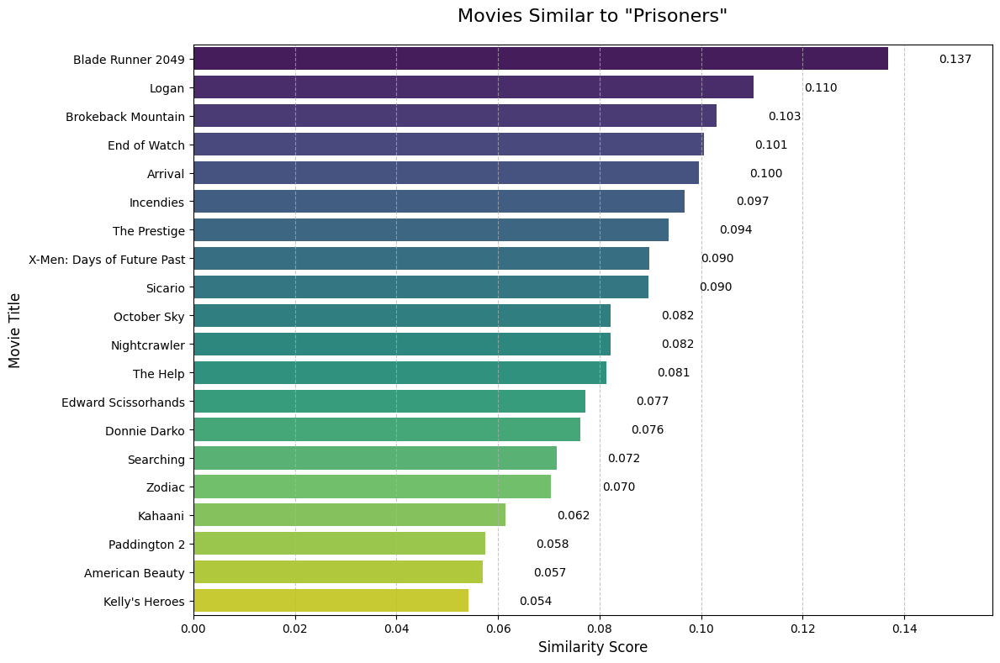

,Series_Title,Overview,Director,Star1,Star2,Star3,Similarity_Score
340,Blade Runner 2049,Young Blade Runner K's discovery of a long-bur...,Denis Villeneuve,Harrison Ford,Ryan Gosling,Ana de Armas,0.136844
202,Logan,"In a future where mutants are nearly extinct, ...",James Mangold,Hugh Jackman,Patrick Stewart,Dafne Keen,0.110356
773,Brokeback Mountain,The story of a forbidden and secretive relatio...,Ang Lee,Jake Gyllenhaal,Heath Ledger,Michelle Williams,0.103090
901,End of Watch,"Shot documentary-style, this film follows the ...",David Ayer,Jake Gyllenhaal,Michael Peña,Anna Kendrick,0.100548
476,Arrival,A linguist works with the military to communic...,Denis Villeneuve,Amy Adams,Jeremy Renner,Forest Whitaker,0.099522
90,Incendies,Twins journey to the Middle East to discover t...,Denis Villeneuve,Lubna Azabal,Mélissa Désormeaux-Poulin,Maxim Gaudette,0.096806
36,The Prestige,"After a tragic accident, two stage magicians e...",Christopher Nolan,Christian Bale,Hugh Jackman,Scarlett Johansson,0.093602
479,X-Men: Days of Future Past,The X-Men send Wolverine to the past in a desp...,Bryan Singer,Patrick Stewart,Ian McKellen,Hugh Jackman,0.089850
893,Sicario,An idealistic FBI agent is enlisted by a gover...,Denis Villeneuve,Emily Blunt,Josh Brolin,Benicio Del Toro,0.089619
650,October Sky,"The true story of Homer Hickam, a coal miner's...",Joe Johnston,Jake Gyllenhaal,Chris Cooper,Laura Dern,0.082211


In [ ]:
run_movie_recommender(df, "Prisoners", 20)

Using Siamese Neural Networks

In [ ]:
import pandas as pd

# Load the file into a pandas DataFrame
df = pd.read_csv('imdb_top_1000.csv')

df.head(10)


,Poster_Link,Series_Title,Released_Year,Certificate,Runtime,Genre,IMDB_Rating,Overview,Meta_score,Director,Star1,Star2,Star3,Star4
0,https://m.media-amazon.com/images/M/MV5BMDFkYT...,The Shawshank Redemption,1994,A,142 min,Drama,9.3,Two imprisoned men bond over a number of years...,80.0,Frank Darabont,Tim Robbins,Morgan Freeman,Bob Gunton,William Sadler
1,https://m.media-amazon.com/images/M/MV5BM2MyNj...,The Godfather,1972,A,175 min,"Crime, Drama",9.2,An organized crime dynasty's aging patriarch t...,100.0,Francis Ford Coppola,Marlon Brando,Al Pacino,James Caan,Diane Keaton
2,https://m.media-amazon.com/images/M/MV5BMTMxNT...,The Dark Knight,2008,UA,152 min,"Action, Crime, Drama",9.0,When the menace known as the Joker wreaks havo...,84.0,Christopher Nolan,Christian Bale,Heath Ledger,Aaron Eckhart,Michael Caine
3,https://m.media-amazon.com/images/M/MV5BMWMwMG...,The Godfather: Part II,1974,A,202 min,"Crime, Drama",9.0,The early life and career of Vito Corleone in ...,90.0,Francis Ford Coppola,Al Pacino,Robert De Niro,Robert Duvall,Diane Keaton
4,https://m.media-amazon.com/images/M/MV5BMWU4N2...,12 Angry Men,1957,U,96 min,"Crime, Drama",9.0,A jury holdout attempts to prevent a miscarria...,96.0,Sidney Lumet,Henry Fonda,Lee J. Cobb,Martin Balsam,John Fiedler
5,https://m.media-amazon.com/images/M/MV5BNzA5ZD...,The Lord of the Rings: The Return of the King,2003,U,201 min,"Action, Adventure, Drama",8.9,Gandalf and Aragorn lead the World of Men agai...,94.0,Peter Jackson,Elijah Wood,Viggo Mortensen,Ian McKellen,Orlando Bloom
6,https://m.media-amazon.com/images/M/MV5BNGNhMD...,Pulp Fiction,1994,A,154 min,"Crime, Drama",8.9,"The lives of two mob hitmen, a boxer, a gangst...",94.0,Quentin Tarantino,John Travolta,Uma Thurman,Samuel L. Jackson,Bruce Willis
7,https://m.media-amazon.com/images/M/MV5BNDE4OT...,Schindler's List,1993,A,195 min,"Biography, Drama, History",8.9,"In German-occupied Poland during World War II,...",94.0,Steven Spielberg,Liam Neeson,Ralph Fiennes,Ben Kingsley,Caroline Goodall
8,https://m.media-amazon.com/images/M/MV5BMjAxMz...,Inception,2010,UA,148 min,"Action, Adventure, Sci-Fi",8.8,A thief who steals corporate secrets through t...,74.0,Christopher Nolan,Leonardo DiCaprio,Joseph Gordon-Levitt,Elliot Page,Ken Watanabe
9,https://m.media-amazon.com/images/M/MV5BMmEzNT...,Fight Club,1999,A,139 min,Drama,8.8,An insomniac office worker and a devil-may-car...,66.0,David Fincher,Brad Pitt,Edward Norton,Meat Loaf,Zach Grenier


In [ ]:
import random

def calculate_similarity(movie1, movie2):
    """
    Calculate similarity between two movies by counting matching features
    Without weights - all features are treated equally
    """
    similarity = 0
    if movie1['Overview'] == movie2['Overview']:
        similarity += 1
    if movie1['Star1'] == movie2['Star1']:
        similarity += 1
    if movie1['Director'] == movie2['Director']:
        similarity += 1
    if movie1['Star2'] == movie2['Star2']:
        similarity += 1
    if movie1['Star3'] == movie2['Star3']:
        similarity += 1

    return similarity

def create_movie_pairs(df):
    """
    Create pairs of similar and dissimilar movies for training
    All features are treated equally (no weights)
    """
    movie_pairs = []
    labels = []

    # Group movies by genre
    grouped_movies = df.groupby('Genre')

    # Total number of features we're comparing
    total_features = 5  # Overview, Star1, Director, Star2, Star3

    # Threshold is now half of total features (without weights)
    similarity_threshold = total_features / 2

    for genre, movies in grouped_movies:
        for i in range(len(movies)):
            movie1 = movies.iloc[i]
            for j in range(i + 1, len(movies)):
                movie2 = movies.iloc[j]
                similarity = calculate_similarity(movie1, movie2)

                # Consider movies similar if they match on at least half of features
                if similarity >= similarity_threshold:
                    movie_pairs.append((movie1['Series_Title'], movie2['Series_Title']))
                    labels.append(1)

    # Create negative pairs (dissimilar movies)
    movie_titles = df['Series_Title'].unique()
    for _ in range(len(movie_pairs)):
        title1, title2 = random.sample(list(movie_titles), 2)
        movie1 = df[df['Series_Title'] == title1].iloc[0]
        movie2 = df[df['Series_Title'] == title2].iloc[0]
        if movie1['Genre'] != movie2['Genre']:
            movie_pairs.append((title1, title2))
            labels.append(0)

    return movie_pairs, labels

# Generate pairs and labels
movie_pairs, labels = create_movie_pairs(df)




In [ ]:
from transformers import BertModel, BertTokenizer
import torch
import torch.nn as nn
import torch.nn.functional as F
from torch.utils.data import DataLoader, Dataset

# Define a dataset class
class MoviePairDataset(Dataset):
    def __init__(self, movie_pairs, labels, df, tokenizer, model):
        self.movie_pairs = movie_pairs
        self.labels = labels
        self.df = df
        self.tokenizer = tokenizer
        self.model = model

    def __len__(self):
        return len(self.movie_pairs)

    def __getitem__(self, idx):
        title1, title2 = self.movie_pairs[idx]
        label = self.labels[idx]

        movie1 = self.df[self.df['Series_Title'] == title1].iloc[0]
        movie2 = self.df[self.df['Series_Title'] == title2].iloc[0]

        embedding1 = self.get_movie_embedding(movie1)
        embedding2 = self.get_movie_embedding(movie2)

        return embedding1, embedding2, label

    def get_movie_embedding(self, movie):
        text = f"{movie['Series_Title']} {movie['Overview']} {movie['Star1']} {movie['Director']} {movie['Star2']} {movie['Star3']}"
        inputs = self.tokenizer(text, return_tensors='pt', max_length=128, truncation=True, padding='max_length')
        outputs = self.model(**inputs)
        embedding = outputs.last_hidden_state[:, 0, :]
        return embedding

# Load pre-trained BERT model and tokenizer
model_name = 'bert-base-uncased'
tokenizer = BertTokenizer.from_pretrained(model_name)
model = BertModel.from_pretrained(model_name)

# Create the dataset and dataloader
dataset = MoviePairDataset(movie_pairs, labels, df, tokenizer, model)
dataloader = DataLoader(dataset, batch_size=32, shuffle=True)

# Define the Siamese Network
class SiameseNetwork(nn.Module):
    def __init__(self, embedding_dim):
        super(SiameseNetwork, self).__init__()
        self.fc = nn.Sequential(
            nn.Linear(embedding_dim, 128),
            nn.ReLU(),
            nn.Linear(128, 64),
            nn.ReLU(),
            nn.Linear(64, 32)
        )

    def forward(self, x):
        return self.fc(x)

embedding_dim = 768  # BERT embedding dimension
siamese_network = SiameseNetwork(embedding_dim)

# Define the training loop
def train_siamese_network(dataloader, siamese_network, epochs=3 ):
    optimizer = torch.optim.Adam(siamese_network.parameters(), lr=0.001)
    for epoch in range(epochs):
        total_loss = 0
        for embedding1, embedding2, label in dataloader:
            optimizer.zero_grad()
            output1 = siamese_network(embedding1)
            output2 = siamese_network(embedding2)
            loss = contrastive_loss(output1, output2, label)
            loss.backward()
            optimizer.step()
            total_loss += loss.item()
        print(f"Epoch {epoch+1}/{epochs}, Loss: {total_loss/len(dataloader)}")

# Contrastive loss function
def contrastive_loss(embedding1, embedding2, label, margin=1.0):
    distance = F.pairwise_distance(embedding1, embedding2)
    loss = (label) * torch.pow(distance, 2) + \
           (1 - label) * torch.pow(torch.clamp(margin - distance, min=0.0), 2)
    return loss.mean()

# Train the model
train_siamese_network(dataloader, siamese_network)


/usr/local/lib/python3.11/dist-packages/huggingface_hub/utils/_auth.py:94: UserWarning: 
The secret `HF_TOKEN` does not exist in your Colab secrets.
To authenticate with the Hugging Face Hub, create a token in your settings tab (https://huggingface.co/settings/tokens), set it as secret in your Google Colab and restart your session.
You will be able to reuse this secret in all of your notebooks.
Please note that authentication is recommended but still optional to access public models or datasets.
  warnings.warn(


tokenizer_config.json:   0%|          | 0.00/48.0 [00:00<?, ?B/s]

vocab.txt:   0%|          | 0.00/232k [00:00<?, ?B/s]

tokenizer.json:   0%|          | 0.00/466k [00:00<?, ?B/s]

config.json:   0%|          | 0.00/570 [00:00<?, ?B/s]

Xet Storage is enabled for this repo, but the 'hf_xet' package is not installed. Falling back to regular HTTP download. For better performance, install the package with: `pip install huggingface_hub[hf_xet]` or `pip install hf_xet`


model.safetensors:   0%|          | 0.00/440M [00:00<?, ?B/s]

Epoch 1/3, Loss: 0.36169275641441345
Epoch 2/3, Loss: 0.320788636803627
Epoch 3/3, Loss: 0.27497154474258423


In [ ]:
def recommend_movies(input_movie_name, df, siamese_network, tokenizer, model):
    input_movie = df[df['Series_Title'] == input_movie_name].iloc[0]
    input_embedding = get_movie_embedding(input_movie, tokenizer, model)
    input_embedding = siamese_network(input_embedding)

    similarities = []
    for _, movie in df.iterrows():
        if movie['Genre'] == input_movie['Genre']:  # Ensure the same genre
            movie_embedding = get_movie_embedding(movie, tokenizer, model)
            movie_embedding = siamese_network(movie_embedding)
            similarity = F.cosine_similarity(input_embedding, movie_embedding).item()
            similarities.append((movie['Series_Title'], similarity))

    # Sort by similarity
    similarities.sort(key=lambda x: x[1], reverse=True)

    # Create a DataFrame for the top 20 recommendations
    recommendations_df = pd.DataFrame(similarities[:20], columns=['Series_Title', 'Cosine Similarity'])
    return recommendations_df

def get_movie_embedding(movie, tokenizer, model):
    text = f"{movie['Series_Title']} {movie['Overview']} {movie['Star1']} {movie['Director']} {movie['Star2']} {movie['Star3']}"
    inputs = tokenizer(text, return_tensors='pt', max_length=128, truncation=True, padding='max_length')
    outputs = model(**inputs)
    embedding = outputs.last_hidden_state[:, 0, :]
    return embedding







In [ ]:
# Example usage
input_movie_name = "Prisoners"
recommended_movies_df = recommend_movies(input_movie_name, df, siamese_network, tokenizer, model)
print(recommended_movies_df)

                       Series_Title  Cosine Similarity
0                         Prisoners           1.000000
1                        Wind River           0.993362
2                       Primal Fear           0.993122
3               Anatomy of a Murder           0.992542
4                        Inside Man           0.991728
5   The Girl with the Dragon Tattoo           0.990764
6                 Der Name der Rose           0.990084
7       Witness for the Prosecution           0.989033
8                    Gone Baby Gone           0.988585
9                      Contratiempo           0.983175
10            Män som hatar kvinnor           0.983172
11                             Rope           0.983147
12                           Zodiac           0.983041
13                            Se7en           0.982131
14              Glengarry Glen Ross           0.982056
15                      Le samouraï           0.981899
16                     Mystic River           0.981597
17        

**Movie recommendation for porsline**

Soroush Bajogli

 Popstar: Never Stop Never Stopping فیلم حنثی

based on good score

Top 20 movies similar to 'Groundhog Day':
              Series_Title  Similarity_Score
                Short Cuts          0.276379
          Harold and Maude          0.101445
             The Gold Rush          0.096163
          Edge of Tomorrow          0.077844
               The Visitor          0.075747
              Mary and Max          0.073189
          The Long Goodbye          0.071714
            A Star Is Born          0.069444
         Midnight in Paris          0.065974
                  Rushmore          0.065383
              Ghostbusters          0.061292
             Despicable Me          0.060371
       Lost in Translation          0.058236
         Fantastic Mr. Fox          0.056062
                   Platoon          0.055298
  The Grand Budapest Hotel          0.047416
           Smultronstället          0.046832
             La dolce vita          0.046161
                   Amadeus          0.045008
La double vie de Véronique          0.043567


<ipython-input-11-6f28ab141b3a>:128: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  ax = sns.barplot(


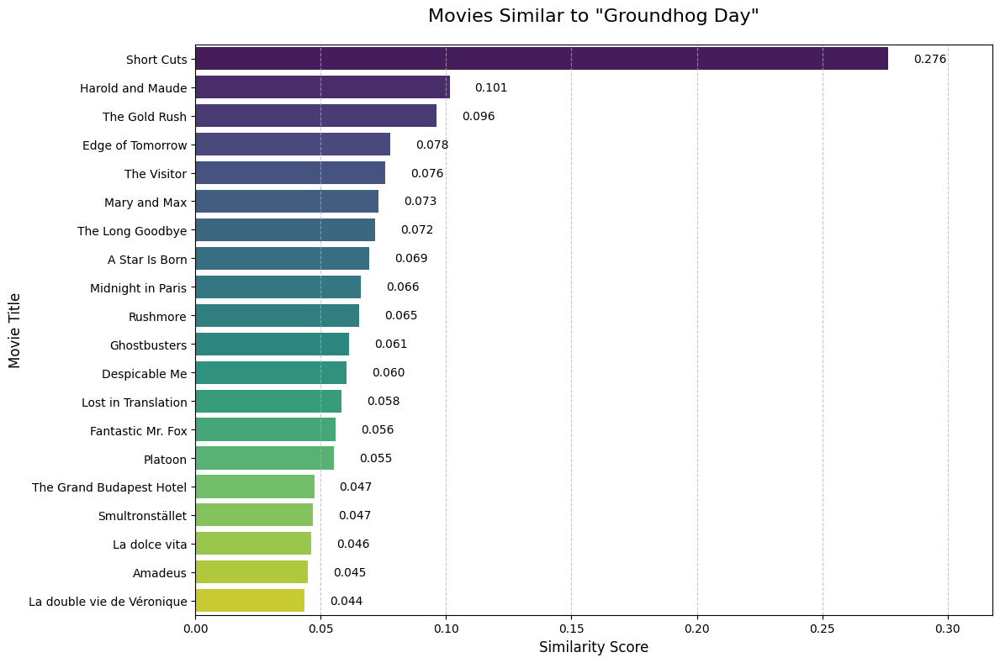

,Series_Title,Overview,Director,Star1,Star2,Star3,Similarity_Score
817,Short Cuts,The day-to-day lives of several suburban Los A...,Robert Altman,Andie MacDowell,Julianne Moore,Tim Robbins,0.276379
541,Harold and Maude,"Young, rich, and obsessed with death, Harold f...",Hal Ashby,Ruth Gordon,Bud Cort,Vivian Pickles,0.101445
193,The Gold Rush,A prospector goes to the Klondike in search of...,Charles Chaplin,Charles Chaplin,Mack Swain,Tom Murray,0.096163
482,Edge of Tomorrow,A soldier fighting aliens gets to relive the s...,Doug Liman,Tom Cruise,Emily Blunt,Bill Paxton,0.077844
916,The Visitor,A college professor travels to New York City t...,Tom McCarthy,Richard Jenkins,Haaz Sleiman,Danai Gurira,0.075747
229,Mary and Max,A tale of friendship between two unlikely pen ...,Adam Elliot,Toni Collette,Philip Seymour Hoffman,Eric Bana,0.073189
989,The Long Goodbye,Private investigator Philip Marlowe helps a fr...,Robert Altman,Elliott Gould,Nina van Pallandt,Sterling Hayden,0.071714
903,A Star Is Born,A musician helps a young singer find fame as a...,Bradley Cooper,Lady Gaga,Bradley Cooper,Sam Elliott,0.069444
743,Midnight in Paris,While on a trip to Paris with his fiancée's fa...,Woody Allen,Owen Wilson,Rachel McAdams,Kathy Bates,0.065974
803,Rushmore,The extracurricular king of Rushmore Preparato...,Wes Anderson,Jason Schwartzman,Bill Murray,Olivia Williams,0.065383


In [ ]:

run_movie_recommender(df, 'Groundhog Day', 20)

In [ ]:
# Example usage
input_movie_name = "Groundhog Day"
recommended_movies_df = recommend_movies(input_movie_name, df, siamese_network, tokenizer, model)
print(recommended_movies_df)

               Series_Title  Cosine Similarity
0             Groundhog Day           1.000000
1  The Purple Rose of Cairo           0.961083
2         Midnight in Paris           0.953006


In [ ]:
def get_optimal_recommendation(input_movie_name, df, siamese_network, tokenizer, model):
    """
    Compare recommendations from both approaches and return the first common movie
    or the top Siamese recommendation if there's no match.

    Parameters:
    input_movie_name (str): Movie title to get recommendations for
    df (pandas.DataFrame): DataFrame containing movie data
    siamese_network: The trained Siamese neural network
    tokenizer: BERT tokenizer for text processing
    model: BERT model for embeddings

    Returns:
    dict: Recommended movie information
    """
    # Get Siamese network recommendations
    siamese_recommendations = recommend_movies(input_movie_name, df, siamese_network, tokenizer, model)

    # Get content-based recommendations without visualization
    # Prepare features and calculate similarity
    similarity_matrix, indices = prepare_movie_features(df)
    content_based_recommendations = get_recommendations(input_movie_name, similarity_matrix, indices, df, top_n=20)

    # Extract movie titles from both recommendation sets
    siamese_titles = siamese_recommendations['Series_Title'].tolist()

    if isinstance(content_based_recommendations, pd.DataFrame):
        content_based_titles = content_based_recommendations['Series_Title'].tolist()
    else:
        # Handle the case where content-based returns an error message
        content_based_titles = []

    # Find common movies (excluding the input movie itself)
    common_movies = []
    for title in siamese_titles:
        if title in content_based_titles and title != input_movie_name:
            common_movies.append(title)

    # If there are common movies, return the first one
    if common_movies:
        # Get the similarity score from Siamese recommendations
        similarity = siamese_recommendations[siamese_recommendations['Series_Title'] == common_movies[0]]['Cosine Similarity'].values[0]
        return {
            "title": common_movies[0],
            "similarity_score": similarity,
            "source": "Both approaches"
        }

    # If no common movie exists, return the top Siamese recommendation (excluding the input movie)
    for title, similarity in zip(siamese_titles, siamese_recommendations['Cosine Similarity']):
        if title != input_movie_name:
            return {
                "title": title,
                "similarity_score": similarity,
                "source": "Siamese network"
            }

    # Fallback if nothing suitable found
    return None

# Example usage
if __name__ == "__main__":
    # Assume df, siamese_network, tokenizer, and model are already loaded
    movie_query = "Groundhog Day"

    recommendation = get_optimal_recommendation(movie_query, df, siamese_network, tokenizer, model)

    if recommendation:
        print(f"\nOptimal recommendation for '{movie_query}':")
        print(f"Recommended movie: {recommendation['title']}")
        print(f"Similarity score: {recommendation['similarity_score']:.4f}")
        print(f"Source: {recommendation['source']}")
    else:
        print(f"\nNo recommendations available for '{movie_query}'.")


Optimal recommendation for 'Groundhog Day':
Recommended movie: Midnight in Paris
Similarity score: 0.9530
Source: Both approaches


Based on bad scores

Top 20 movies similar to 'Shaun of the Dead':
                         Series_Title  Similarity_Score
                             Hot Fuzz          0.414443
                            Star Trek          0.106522
                          Baby Driver          0.105393
                 The Bourne Ultimatum          0.078923
                            Tombstone          0.070044
                         The Notebook          0.067412
                          Frost/Nixon          0.065657
                    Finding Neverland          0.063072
Eternal Sunshine of the Spotless Mind          0.059537
                         Vikram Vedha          0.059141
                              Yip Man          0.058659
                         The Thin Man          0.058628
                              Titanic          0.056015
                    The Thin Red Line          0.054869
                           Zombieland          0.054162
                         Forrest Gump          0.053568
  

<ipython-input-11-6f28ab141b3a>:128: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  ax = sns.barplot(


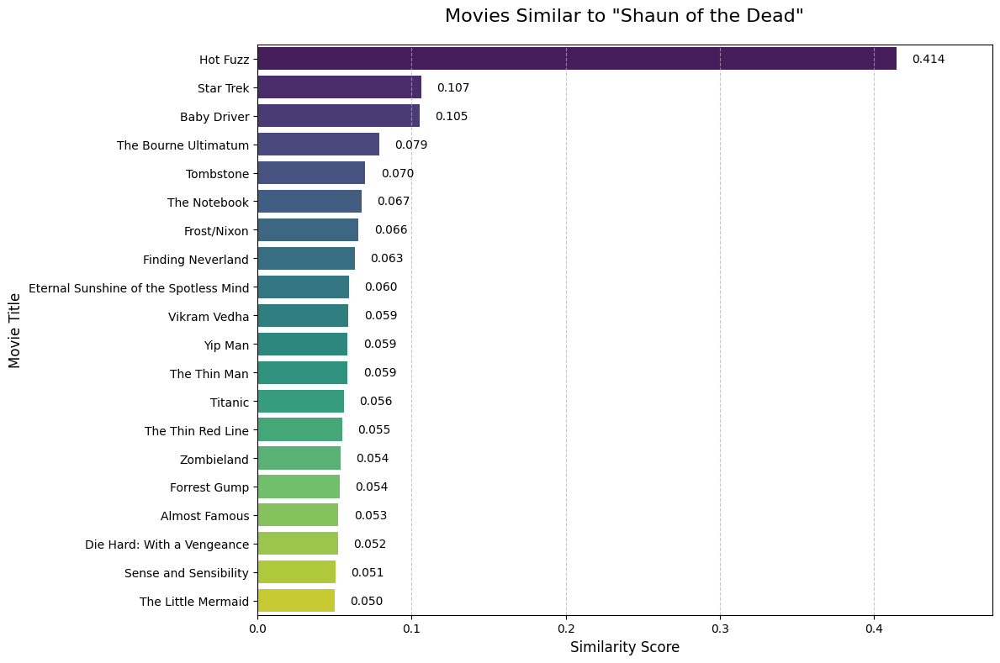

,Series_Title,Overview,Director,Star1,Star2,Star3,Similarity_Score
627,Hot Fuzz,A skilled London police officer is transferred...,Edgar Wright,Simon Pegg,Nick Frost,Martin Freeman,0.414443
493,Star Trek,The brash James T. Kirk tries to live up to hi...,J.J. Abrams,Chris Pine,Zachary Quinto,Simon Pegg,0.106522
888,Baby Driver,After being coerced into working for a crime b...,Edgar Wright,Ansel Elgort,Jon Bernthal,Jon Hamm,0.105393
362,The Bourne Ultimatum,Jason Bourne dodges a ruthless C.I.A. official...,Paul Greengrass,Matt Damon,Edgar Ramírez,Joan Allen,0.078923
659,Tombstone,A successful lawman's plans to retire anonymou...,George P. Cosmatos,Kevin Jarre,Kurt Russell,Val Kilmer,0.070044
637,The Notebook,A poor yet passionate young man falls in love ...,Nick Cassavetes,Gena Rowlands,James Garner,Rachel McAdams,0.067412
757,Frost/Nixon,A dramatic retelling of the post-Watergate tel...,Ron Howard,Frank Langella,Michael Sheen,Kevin Bacon,0.065657
940,Finding Neverland,The story of Sir J.M. Barrie's friendship with...,Marc Forster,Johnny Depp,Kate Winslet,Julie Christie,0.063072
94,Eternal Sunshine of the Spotless Mind,"When their relationship turns sour, a couple u...",Michel Gondry,Jim Carrey,Kate Winslet,Tom Wilkinson,0.059537
55,Vikram Vedha,"Vikram, a no-nonsense police officer, accompan...",Gayatri,Pushkar,Madhavan,Vijay Sethupathi,0.059141


In [ ]:

run_movie_recommender(df, "Shaun of the Dead", 20)

In [ ]:
# Example usage
input_movie_name = "Shaun of the Dead"
recommended_movies_df = recommend_movies(input_movie_name, df, siamese_network, tokenizer, model)
print(recommended_movies_df)

                Series_Title  Cosine Similarity
0          Shaun of the Dead           1.000000
1  What We Do in the Shadows           0.791759


In [ ]:
def get_optimal_recommendation(input_movie_name, df, siamese_network, tokenizer, model):
    """
    Compare recommendations from both approaches and return the first common movie
    or the top Siamese recommendation if there's no match.

    Parameters:
    input_movie_name (str): Movie title to get recommendations for
    df (pandas.DataFrame): DataFrame containing movie data
    siamese_network: The trained Siamese neural network
    tokenizer: BERT tokenizer for text processing
    model: BERT model for embeddings

    Returns:
    dict: Recommended movie information
    """
    # Get Siamese network recommendations
    siamese_recommendations = recommend_movies(input_movie_name, df, siamese_network, tokenizer, model)

    # Get content-based recommendations without visualization
    # Prepare features and calculate similarity
    similarity_matrix, indices = prepare_movie_features(df)
    content_based_recommendations = get_recommendations(input_movie_name, similarity_matrix, indices, df, top_n=20)

    # Extract movie titles from both recommendation sets
    siamese_titles = siamese_recommendations['Series_Title'].tolist()

    if isinstance(content_based_recommendations, pd.DataFrame):
        content_based_titles = content_based_recommendations['Series_Title'].tolist()
    else:
        # Handle the case where content-based returns an error message
        content_based_titles = []

    # Find common movies (excluding the input movie itself)
    common_movies = []
    for title in siamese_titles:
        if title in content_based_titles and title != input_movie_name:
            common_movies.append(title)

    # If there are common movies, return the first one
    if common_movies:
        # Get the similarity score from Siamese recommendations
        similarity = siamese_recommendations[siamese_recommendations['Series_Title'] == common_movies[0]]['Cosine Similarity'].values[0]
        return {
            "title": common_movies[0],
            "similarity_score": similarity,
            "source": "Both approaches"
        }

    # If no common movie exists, return the top Siamese recommendation (excluding the input movie)
    for title, similarity in zip(siamese_titles, siamese_recommendations['Cosine Similarity']):
        if title != input_movie_name:
            return {
                "title": title,
                "similarity_score": similarity,
                "source": "Siamese network"
            }

    # Fallback if nothing suitable found
    return None

# Example usage
if __name__ == "__main__":
    # Assume df, siamese_network, tokenizer, and model are already loaded
    movie_query = "Shaun of the Dead"

    recommendation = get_optimal_recommendation(movie_query, df, siamese_network, tokenizer, model)

    if recommendation:
        print(f"\nOptimal recommendation for '{movie_query}':")
        print(f"Recommended movie: {recommendation['title']}")
        print(f"Similarity score: {recommendation['similarity_score']:.4f}")
        print(f"Source: {recommendation['source']}")
    else:
        print(f"\nNo recommendations available for '{movie_query}'.")


Optimal recommendation for 'Shaun of the Dead':
Recommended movie: What We Do in the Shadows
Similarity score: 0.7918
Source: Siamese network


الهه مرادی

good movies

In [ ]:
# Example usage
input_movie_name = "Full Metal Jacket"
recommended_movies_df = recommend_movies(input_movie_name, df, siamese_network, tokenizer, model)
print(recommended_movies_df)

                      Series_Title  Cosine Similarity
0                Full Metal Jacket           1.000000
1                          Platoon           0.996205
2              Saving Private Ryan           0.995296
3                   Paths of Glory           0.985311
4                  The Deer Hunter           0.984640
5            Judgment at Nuremberg           0.980605
6                  Ivanovo detstvo           0.980222
7               La Grande Illusion           0.973507
8                The Thin Red Line           0.972474
9           La battaglia di Algeri           0.969481
10                     Mandariinid           0.969110
11             Beasts of No Nation           0.968449
12  All Quiet on the Western Front           0.966308
13           Au revoir les enfants           0.966274
14                        Lifeboat           0.963843


Top 20 movies similar to 'Full Metal Jacket':
                                                        Series_Title  Similarity_Score
                                        Kingsman: The Secret Service          0.137691
                                                               Glory          0.086712
                                                    The Great Escape          0.084706
Dr. Strangelove or: How I Learned to Stop Worrying and Love the Bomb          0.083620
                                                           Spartacus          0.075948
                                                  The Imitation Game          0.075147
                                      The Boy in the Striped Pyjamas          0.071024
                                                  A Clockwork Orange          0.067626
                                                         The Killing          0.067515
                                                      Paths of Glory          0.0668

<ipython-input-11-6f28ab141b3a>:128: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  ax = sns.barplot(


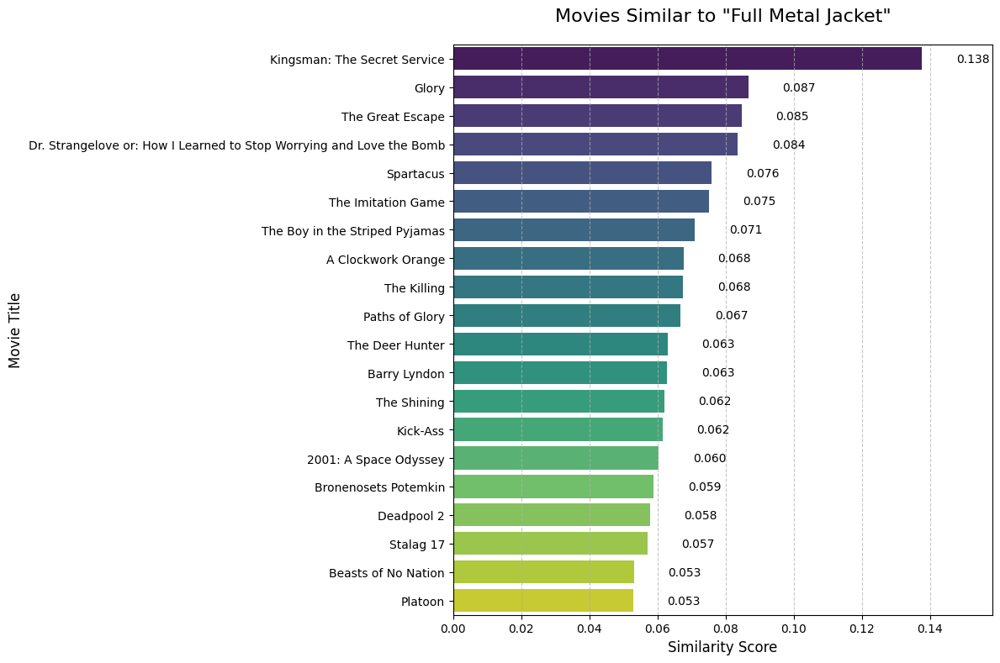

,Series_Title,Overview,Director,Star1,Star2,Star3,Similarity_Score
730,Kingsman: The Secret Service,A spy organisation recruits a promising street...,Matthew Vaughn,Colin Firth,Taron Egerton,Samuel L. Jackson,0.137691
673,Glory,Robert Gould Shaw leads the U.S. Civil War's f...,Edward Zwick,Matthew Broderick,Denzel Washington,Cary Elwes,0.086712
179,The Great Escape,Allied prisoners of war plan for several hundr...,John Sturges,Steve McQueen,James Garner,Richard Attenborough,0.084706
78,Dr. Strangelove or: How I Learned to Stop Worr...,An insane general triggers a path to nuclear h...,Stanley Kubrick,Peter Sellers,George C. Scott,Sterling Hayden,0.083620
549,Spartacus,The slave Spartacus leads a violent revolt aga...,Stanley Kubrick,Kirk Douglas,Laurence Olivier,Jean Simmons,0.075948
338,The Imitation Game,"During World War II, the English mathematical ...",Morten Tyldum,Benedict Cumberbatch,Keira Knightley,Matthew Goode,0.075147
616,The Boy in the Striped Pyjamas,"Through the innocent eyes of Bruno, the eight-...",Mark Herman,Asa Butterfield,David Thewlis,Rupert Friend,0.071024
113,A Clockwork Orange,"In the future, a sadistic gang leader is impri...",Stanley Kubrick,Malcolm McDowell,Patrick Magee,Michael Bates,0.067626
441,The Killing,Crook Johnny Clay assembles a five man team to...,Stanley Kubrick,Sterling Hayden,Coleen Gray,Vince Edwards,0.067515
80,Paths of Glory,"After refusing to attack an enemy position, a ...",Stanley Kubrick,Kirk Douglas,Ralph Meeker,Adolphe Menjou,0.066835


In [ ]:

run_movie_recommender(df, "Full Metal Jacket", 20)

In [ ]:
def get_optimal_recommendation(input_movie_name, df, siamese_network, tokenizer, model):
    """
    Compare recommendations from both approaches and return the first common movie
    or the top Siamese recommendation if there's no match.

    Parameters:
    input_movie_name (str): Movie title to get recommendations for
    df (pandas.DataFrame): DataFrame containing movie data
    siamese_network: The trained Siamese neural network
    tokenizer: BERT tokenizer for text processing
    model: BERT model for embeddings

    Returns:
    dict: Recommended movie information
    """
    # Get Siamese network recommendations
    siamese_recommendations = recommend_movies(input_movie_name, df, siamese_network, tokenizer, model)

    # Get content-based recommendations without visualization
    # Prepare features and calculate similarity
    similarity_matrix, indices = prepare_movie_features(df)
    content_based_recommendations = get_recommendations(input_movie_name, similarity_matrix, indices, df, top_n=20)

    # Extract movie titles from both recommendation sets
    siamese_titles = siamese_recommendations['Series_Title'].tolist()

    if isinstance(content_based_recommendations, pd.DataFrame):
        content_based_titles = content_based_recommendations['Series_Title'].tolist()
    else:
        # Handle the case where content-based returns an error message
        content_based_titles = []

    # Find common movies (excluding the input movie itself)
    common_movies = []
    for title in siamese_titles:
        if title in content_based_titles and title != input_movie_name:
            common_movies.append(title)

    # If there are common movies, return the first one
    if common_movies:
        # Get the similarity score from Siamese recommendations
        similarity = siamese_recommendations[siamese_recommendations['Series_Title'] == common_movies[0]]['Cosine Similarity'].values[0]
        return {
            "title": common_movies[0],
            "similarity_score": similarity,
            "source": "Both approaches"
        }

    # If no common movie exists, return the top Siamese recommendation (excluding the input movie)
    for title, similarity in zip(siamese_titles, siamese_recommendations['Cosine Similarity']):
        if title != input_movie_name:
            return {
                "title": title,
                "similarity_score": similarity,
                "source": "Siamese network"
            }

    # Fallback if nothing suitable found
    return None

# Example usage
if __name__ == "__main__":
    # Assume df, siamese_network, tokenizer, and model are already loaded
    movie_query = "Full Metal Jacket"

    recommendation = get_optimal_recommendation(movie_query, df, siamese_network, tokenizer, model)

    if recommendation:
        print(f"\nOptimal recommendation for '{movie_query}':")
        print(f"Recommended movie: {recommendation['title']}")
        print(f"Similarity score: {recommendation['similarity_score']:.4f}")
        print(f"Source: {recommendation['source']}")
    else:
        print(f"\nNo recommendations available for '{movie_query}'.")


Optimal recommendation for 'Full Metal Jacket':
Recommended movie: Platoon
Similarity score: 0.9962
Source: Both approaches


Bad Movies

In [ ]:
# Example usage
input_movie_name = "All Quiet on the Western Front"
recommended_movies_df = recommend_movies(input_movie_name, df, siamese_network, tokenizer, model)
print(recommended_movies_df)

                      Series_Title  Cosine Similarity
0   All Quiet on the Western Front           1.000000
1            Judgment at Nuremberg           0.991182
2               La Grande Illusion           0.990761
3                The Thin Red Line           0.989365
4                   Paths of Glory           0.988462
5                  Ivanovo detstvo           0.980567
6           La battaglia di Algeri           0.973879
7                  The Deer Hunter           0.972868
8                Full Metal Jacket           0.966308
9              Beasts of No Nation           0.963514
10                         Platoon           0.963338
11             Saving Private Ryan           0.961833
12           Au revoir les enfants           0.948317
13                     Mandariinid           0.947019
14                        Lifeboat           0.923427


Top 20 movies similar to 'All Quiet on the Western Front':
              Series_Title  Similarity_Score
          The Great Escape          0.110746
           The Longest Day          0.088189
              Under sandet          0.087118
  The Last of the Mohicans          0.066065
                 Stalag 17          0.063108
                   Dunkirk          0.062807
     Au revoir les enfants          0.061934
           The Dirty Dozen          0.059726
         Empire of the Sun          0.059584
          Schindler's List          0.058614
              Idi i smotri          0.058131
        The Imitation Game          0.057780
             The Searchers          0.056738
              Nightcrawler          0.056629
Die Hard: With a Vengeance          0.056454
    Diarios de motocicleta          0.049734
                     Rocky          0.049320
                 King Kong          0.047438
                      Coco          0.047074
                  Das Boot          0.046

<ipython-input-11-6f28ab141b3a>:128: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  ax = sns.barplot(


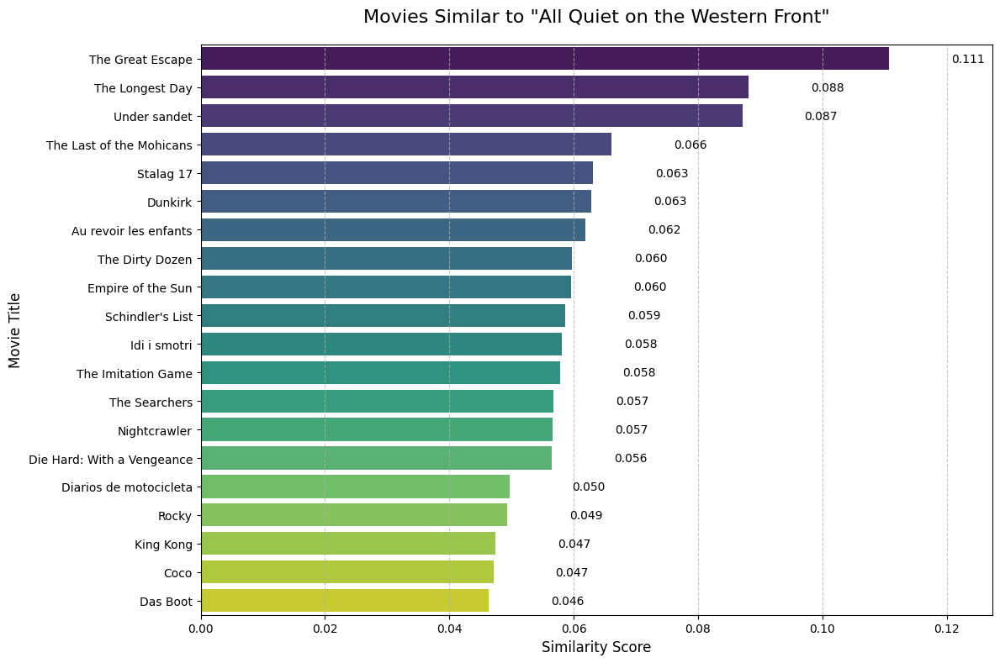

,Series_Title,Overview,Director,Star1,Star2,Star3,Similarity_Score
179,The Great Escape,Allied prisoners of war plan for several hundr...,John Sturges,Steve McQueen,James Garner,Richard Attenborough,0.110746
705,The Longest Day,"The events of D-Day, told on a grand scale fro...",Ken Annakin,Andrew Marton,Gerd Oswald,Bernhard Wicki,0.088189
581,Under sandet,"In post-World War II Denmark, a group of young...",Martin Zandvliet,Roland Møller,Louis Hofmann,Joel Basman,0.087118
821,The Last of the Mohicans,Three trappers protect the daughters of a Brit...,Michael Mann,Daniel Day-Lewis,Madeleine Stowe,Russell Means,0.066065
445,Stalag 17,When two escaping American World War II prison...,Billy Wilder,William Holden,Don Taylor,Otto Preminger,0.063108
573,Dunkirk,"Allied soldiers from Belgium, the British Empi...",Christopher Nolan,Fionn Whitehead,Barry Keoghan,Mark Rylance,0.062807
408,Au revoir les enfants,A French boarding school run by priests seems ...,Louis Malle,Gaspard Manesse,Raphael Fejtö,Francine Racette,0.061934
856,The Dirty Dozen,"During World War II, a rebellious U.S. Army Ma...",Robert Aldrich,Lee Marvin,Ernest Borgnine,Charles Bronson,0.059726
832,Empire of the Sun,A young English boy struggles to survive under...,Steven Spielberg,Christian Bale,John Malkovich,Miranda Richardson,0.059584
7,Schindler's List,"In German-occupied Poland during World War II,...",Steven Spielberg,Liam Neeson,Ralph Fiennes,Ben Kingsley,0.058614


In [ ]:

run_movie_recommender(df, "All Quiet on the Western Front", 20)

In [ ]:
def get_optimal_recommendation(input_movie_name, df, siamese_network, tokenizer, model):
    """
    Compare recommendations from both approaches and return the first common movie
    or the top Siamese recommendation if there's no match.

    Parameters:
    input_movie_name (str): Movie title to get recommendations for
    df (pandas.DataFrame): DataFrame containing movie data
    siamese_network: The trained Siamese neural network
    tokenizer: BERT tokenizer for text processing
    model: BERT model for embeddings

    Returns:
    dict: Recommended movie information
    """
    # Get Siamese network recommendations
    siamese_recommendations = recommend_movies(input_movie_name, df, siamese_network, tokenizer, model)

    # Get content-based recommendations without visualization
    # Prepare features and calculate similarity
    similarity_matrix, indices = prepare_movie_features(df)
    content_based_recommendations = get_recommendations(input_movie_name, similarity_matrix, indices, df, top_n=20)

    # Extract movie titles from both recommendation sets
    siamese_titles = siamese_recommendations['Series_Title'].tolist()

    if isinstance(content_based_recommendations, pd.DataFrame):
        content_based_titles = content_based_recommendations['Series_Title'].tolist()
    else:
        # Handle the case where content-based returns an error message
        content_based_titles = []

    # Find common movies (excluding the input movie itself)
    common_movies = []
    for title in siamese_titles:
        if title in content_based_titles and title != input_movie_name:
            common_movies.append(title)

    # If there are common movies, return the first one
    if common_movies:
        # Get the similarity score from Siamese recommendations
        similarity = siamese_recommendations[siamese_recommendations['Series_Title'] == common_movies[0]]['Cosine Similarity'].values[0]
        return {
            "title": common_movies[0],
            "similarity_score": similarity,
            "source": "Both approaches"
        }

    # If no common movie exists, return the top Siamese recommendation (excluding the input movie)
    for title, similarity in zip(siamese_titles, siamese_recommendations['Cosine Similarity']):
        if title != input_movie_name:
            return {
                "title": title,
                "similarity_score": similarity,
                "source": "Siamese network"
            }

    # Fallback if nothing suitable found
    return None

# Example usage
if __name__ == "__main__":
    # Assume df, siamese_network, tokenizer, and model are already loaded
    movie_query = "All Quiet on the Western Front"

    recommendation = get_optimal_recommendation(movie_query, df, siamese_network, tokenizer, model)

    if recommendation:
        print(f"\nOptimal recommendation for '{movie_query}':")
        print(f"Recommended movie: {recommendation['title']}")
        print(f"Similarity score: {recommendation['similarity_score']:.4f}")
        print(f"Source: {recommendation['source']}")
    else:
        print(f"\nNo recommendations available for '{movie_query}'.")


Optimal recommendation for 'All Quiet on the Western Front':
Recommended movie: Au revoir les enfants
Similarity score: 0.9483
Source: Both approaches


Amir Hashemi

The Man from Earth

Top 20 movies similar to 'Watchmen':
                       Series_Title  Similarity_Score
         X-Men: Days of Future Past          0.098610
                                300          0.096108
                          Andhadhun          0.075592
                              Giant          0.056300
                    The Incredibles          0.055838
                    The Sixth Sense          0.054799
       Batman: Mask of the Phantasm          0.051062
                            The Kid          0.048402
           The Peanut Butter Falcon          0.048014
                        The Hustler          0.046950
                        Blue Velvet          0.043787
Interstate 60: Episodes of the Road          0.042228
         Back to the Future Part II          0.041480
    Who's Afraid of Virginia Woolf?          0.040929
                  Midnight in Paris          0.039548
                 Dallas Buyers Club          0.039280
                               Moon          

<ipython-input-11-6f28ab141b3a>:128: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  ax = sns.barplot(


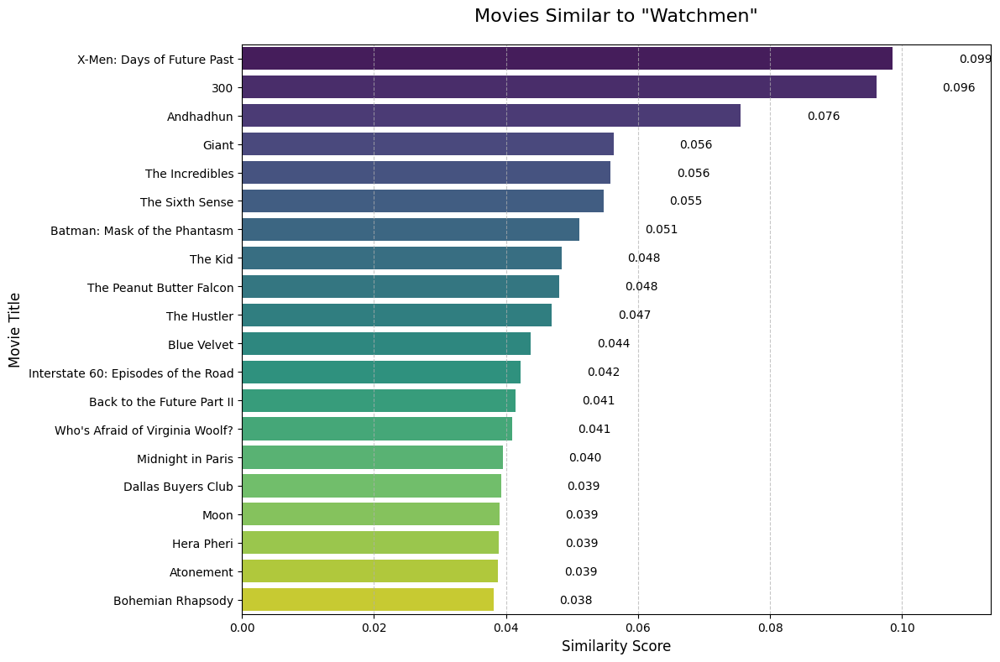

,Series_Title,Overview,Director,Star1,Star2,Star3,Similarity_Score
479,X-Men: Days of Future Past,The X-Men send Wolverine to the past in a desp...,Bryan Singer,Patrick Stewart,Ian McKellen,Hugh Jackman,0.098610
928,300,King Leonidas of Sparta and a force of 300 men...,Zack Snyder,Gerard Butler,Lena Headey,David Wenham,0.096108
86,Andhadhun,A series of mysterious events change the life ...,Sriram Raghavan,Ayushmann Khurrana,Tabu,Radhika Apte,0.075592
996,Giant,Sprawling epic covering the life of a Texas ca...,George Stevens,Elizabeth Taylor,Rock Hudson,James Dean,0.056300
378,The Incredibles,"A family of undercover superheroes, while tryi...",Brad Bird,Craig T. Nelson,Samuel L. Jackson,Holly Hunter,0.055838
248,The Sixth Sense,A boy who communicates with spirits seeks the ...,M. Night Shyamalan,Bruce Willis,Haley Joel Osment,Toni Collette,0.054799
665,Batman: Mask of the Phantasm,Batman is wrongly implicated in a series of mu...,Kevin Altieri,Boyd Kirkland,Frank Paur,Dan Riba,0.051062
127,The Kid,"The Tramp cares for an abandoned child, but ev...",Charles Chaplin,Charles Chaplin,Edna Purviance,Jackie Coogan,0.048402
884,The Peanut Butter Falcon,Zak runs away from his care home to make his d...,Tyler Nilson,Michael Schwartz,Zack Gottsagen,Ann Owens,0.048014
434,The Hustler,An up-and-coming pool player plays a long-time...,Robert Rossen,Paul Newman,Jackie Gleason,Piper Laurie,0.046950


In [ ]:

run_movie_recommender(df, "Watchmen", 20)

In [ ]:
# Example usage
input_movie_name = "Watchmen"
recommended_movies_df = recommend_movies(input_movie_name, df, siamese_network, tokenizer, model)
print(recommended_movies_df)

        Series_Title  Cosine Similarity
0           Watchmen           1.000000
1           The Game           0.988088
2            Seppuku           0.983502
3  Blade Runner 2049           0.970438
4           Oldeuboi           0.867450


In [ ]:
def get_optimal_recommendation(input_movie_name, df, siamese_network, tokenizer, model):
    """
    Compare recommendations from both approaches and return the first common movie
    or the top Siamese recommendation if there's no match.

    Parameters:
    input_movie_name (str): Movie title to get recommendations for
    df (pandas.DataFrame): DataFrame containing movie data
    siamese_network: The trained Siamese neural network
    tokenizer: BERT tokenizer for text processing
    model: BERT model for embeddings

    Returns:
    dict: Recommended movie information
    """
    # Get Siamese network recommendations
    siamese_recommendations = recommend_movies(input_movie_name, df, siamese_network, tokenizer, model)

    # Get content-based recommendations without visualization
    # Prepare features and calculate similarity
    similarity_matrix, indices = prepare_movie_features(df)
    content_based_recommendations = get_recommendations(input_movie_name, similarity_matrix, indices, df, top_n=20)

    # Extract movie titles from both recommendation sets
    siamese_titles = siamese_recommendations['Series_Title'].tolist()

    if isinstance(content_based_recommendations, pd.DataFrame):
        content_based_titles = content_based_recommendations['Series_Title'].tolist()
    else:
        # Handle the case where content-based returns an error message
        content_based_titles = []

    # Find common movies (excluding the input movie itself)
    common_movies = []
    for title in siamese_titles:
        if title in content_based_titles and title != input_movie_name:
            common_movies.append(title)

    # If there are common movies, return the first one
    if common_movies:
        # Get the similarity score from Siamese recommendations
        similarity = siamese_recommendations[siamese_recommendations['Series_Title'] == common_movies[0]]['Cosine Similarity'].values[0]
        return {
            "title": common_movies[0],
            "similarity_score": similarity,
            "source": "Both approaches"
        }

    # If no common movie exists, return the top Siamese recommendation (excluding the input movie)
    for title, similarity in zip(siamese_titles, siamese_recommendations['Cosine Similarity']):
        if title != input_movie_name:
            return {
                "title": title,
                "similarity_score": similarity,
                "source": "Siamese network"
            }

    # Fallback if nothing suitable found
    return None

# Example usage
if __name__ == "__main__":
    # Assume df, siamese_network, tokenizer, and model are already loaded
    movie_query = "Watchmen"

    recommendation = get_optimal_recommendation(movie_query, df, siamese_network, tokenizer, model)

    if recommendation:
        print(f"\nOptimal recommendation for '{movie_query}':")
        print(f"Recommended movie: {recommendation['title']}")
        print(f"Similarity score: {recommendation['similarity_score']:.4f}")
        print(f"Source: {recommendation['source']}")
    else:
        print(f"\nNo recommendations available for '{movie_query}'.")


Optimal recommendation for 'Watchmen':
Recommended movie: The Game
Similarity score: 0.9881
Source: Siamese network


Top 20 movies similar to 'Donnie Darko':
           Series_Title  Similarity_Score
     Brokeback Mountain          0.097099
           Nightcrawler          0.089177
        Minority Report          0.083788
    Singin' in the Rain          0.081542
  Judgment at Nuremberg          0.078034
            October Sky          0.077434
              Prisoners          0.076208
     Dances with Wolves          0.075968
           End of Watch          0.071171
                 Zodiac          0.066398
  Rebel Without a Cause          0.057678
                 Harvey          0.056403
           Philadelphia          0.053505
               Drishyam          0.052112
              Repulsion          0.051666
      Where Eagles Dare          0.051063
              Stalag 17          0.050482
Who Framed Roger Rabbit          0.050449
              True Grit          0.050102
       The Intouchables          0.049683


<ipython-input-11-6f28ab141b3a>:128: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  ax = sns.barplot(


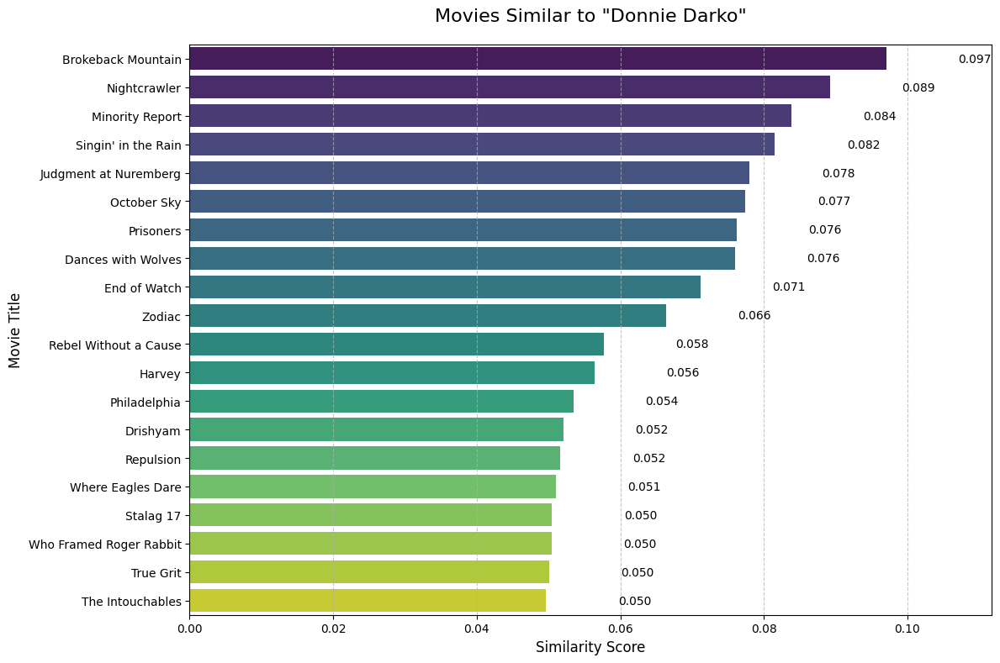

,Series_Title,Overview,Director,Star1,Star2,Star3,Similarity_Score
773,Brokeback Mountain,The story of a forbidden and secretive relatio...,Ang Lee,Jake Gyllenhaal,Heath Ledger,Michelle Williams,0.097099
474,Nightcrawler,"When Louis Bloom, a con man desperate for work...",Dan Gilroy,Jake Gyllenhaal,Rene Russo,Bill Paxton,0.089177
951,Minority Report,In a future where a special police unit is abl...,Steven Spielberg,Tom Cruise,Colin Farrell,Samantha Morton,0.083788
120,Singin' in the Rain,A silent film production company and cast make...,Stanley Donen,Gene Kelly,Gene Kelly,Donald O'Connor,0.081542
182,Judgment at Nuremberg,"In 1948, an American court in occupied Germany...",Stanley Kramer,Spencer Tracy,Burt Lancaster,Richard Widmark,0.078034
650,October Sky,"The true story of Homer Hickam, a coal miner's...",Joe Johnston,Jake Gyllenhaal,Chris Cooper,Laura Dern,0.077434
222,Prisoners,When Keller Dover's daughter and her friend go...,Denis Villeneuve,Hugh Jackman,Jake Gyllenhaal,Viola Davis,0.076208
402,Dances with Wolves,"Lieutenant John Dunbar, assigned to a remote w...",Kevin Costner,Kevin Costner,Mary McDonnell,Graham Greene,0.075968
901,End of Watch,"Shot documentary-style, this film follows the ...",David Ayer,Jake Gyllenhaal,Michael Peña,Anna Kendrick,0.071171
767,Zodiac,"In the late 1960s/early 1970s, a San Francisco...",David Fincher,Jake Gyllenhaal,Robert Downey Jr.,Mark Ruffalo,0.066398


In [ ]:

run_movie_recommender(df, "Donnie Darko", 20)

In [ ]:
# Example usage
input_movie_name = "Donnie Darko"
recommended_movies_df = recommend_movies(input_movie_name, df, siamese_network, tokenizer, model)
print(recommended_movies_df)

    Series_Title  Cosine Similarity
0   Donnie Darko           1.000000
1   The Prestige           0.995338
2        Solaris           0.989076
3  Abre los ojos           0.959473
4           Moon           0.942704


In [ ]:
def get_optimal_recommendation(input_movie_name, df, siamese_network, tokenizer, model):
    """
    Compare recommendations from both approaches and return the first common movie
    or the top Siamese recommendation if there's no match.

    Parameters:
    input_movie_name (str): Movie title to get recommendations for
    df (pandas.DataFrame): DataFrame containing movie data
    siamese_network: The trained Siamese neural network
    tokenizer: BERT tokenizer for text processing
    model: BERT model for embeddings

    Returns:
    dict: Recommended movie information
    """
    # Get Siamese network recommendations
    siamese_recommendations = recommend_movies(input_movie_name, df, siamese_network, tokenizer, model)

    # Get content-based recommendations without visualization
    # Prepare features and calculate similarity
    similarity_matrix, indices = prepare_movie_features(df)
    content_based_recommendations = get_recommendations(input_movie_name, similarity_matrix, indices, df, top_n=20)

    # Extract movie titles from both recommendation sets
    siamese_titles = siamese_recommendations['Series_Title'].tolist()

    if isinstance(content_based_recommendations, pd.DataFrame):
        content_based_titles = content_based_recommendations['Series_Title'].tolist()
    else:
        # Handle the case where content-based returns an error message
        content_based_titles = []

    # Find common movies (excluding the input movie itself)
    common_movies = []
    for title in siamese_titles:
        if title in content_based_titles and title != input_movie_name:
            common_movies.append(title)

    # If there are common movies, return the first one
    if common_movies:
        # Get the similarity score from Siamese recommendations
        similarity = siamese_recommendations[siamese_recommendations['Series_Title'] == common_movies[0]]['Cosine Similarity'].values[0]
        return {
            "title": common_movies[0],
            "similarity_score": similarity,
            "source": "Both approaches"
        }

    # If no common movie exists, return the top Siamese recommendation (excluding the input movie)
    for title, similarity in zip(siamese_titles, siamese_recommendations['Cosine Similarity']):
        if title != input_movie_name:
            return {
                "title": title,
                "similarity_score": similarity,
                "source": "Siamese network"
            }

    # Fallback if nothing suitable found
    return None

# Example usage
if __name__ == "__main__":
    # Assume df, siamese_network, tokenizer, and model are already loaded
    movie_query = "Donnie Darko"

    recommendation = get_optimal_recommendation(movie_query, df, siamese_network, tokenizer, model)

    if recommendation:
        print(f"\nOptimal recommendation for '{movie_query}':")
        print(f"Recommended movie: {recommendation['title']}")
        print(f"Similarity score: {recommendation['similarity_score']:.4f}")
        print(f"Source: {recommendation['source']}")
    else:
        print(f"\nNo recommendations available for '{movie_query}'.")


Optimal recommendation for 'Donnie Darko':
Recommended movie: The Prestige
Similarity score: 0.9953
Source: Siamese network


Maryam Safaee pour

Before We Go

Top 20 movies similar to 'Atonement':
             Series_Title  Similarity_Score
        Pride & Prejudice          0.199224
       The Imitation Game          0.091870
              The Fighter          0.088530
      The Lives of Others          0.086760
In the Name of the Father          0.086053
            Kal Ho Naa Ho          0.083718
           Secrets & Lies          0.082958
             The Graduate          0.082565
               Capharnaüm          0.080786
     Call Me by Your Name          0.073146
               Home Alone          0.072859
                  Warrior          0.069862
The Last King of Scotland          0.067664
                 Drishyam          0.065963
             Mary and Max          0.065771
   Hannah and Her Sisters          0.062175
              Baby Driver          0.058543
                  Titanic          0.057318
           X: First Class          0.056148
           Paths of Glory          0.055962


<ipython-input-11-6f28ab141b3a>:128: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  ax = sns.barplot(


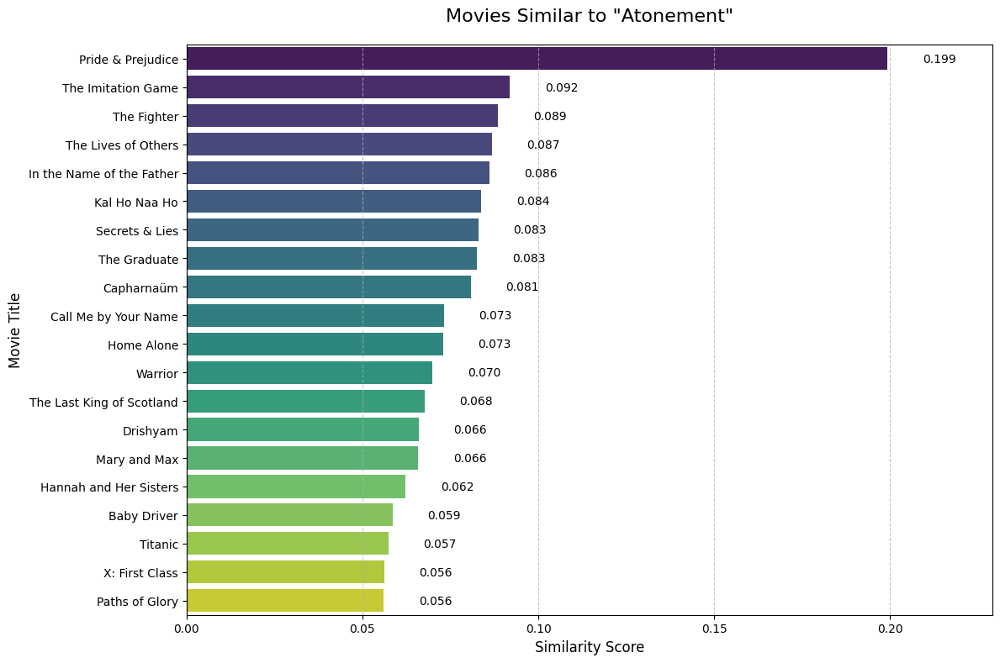

,Series_Title,Overview,Director,Star1,Star2,Star3,Similarity_Score
631,Pride & Prejudice,Sparks fly when spirited Elizabeth Bennet meet...,Joe Wright,Keira Knightley,Matthew Macfadyen,Brenda Blethyn,0.199224
338,The Imitation Game,"During World War II, the English mathematical ...",Morten Tyldum,Benedict Cumberbatch,Keira Knightley,Matthew Goode,0.091870
614,The Fighter,"Based on the story of Micky Ward, a fledgling ...",David O. Russell,Mark Wahlberg,Christian Bale,Amy Adams,0.088530
67,The Lives of Others,"In 1984 East Berlin, an agent of the secret po...",Florian Henckel von Donnersmarck,Ulrich Mühe,Martina Gedeck,Sebastian Koch,0.086760
263,In the Name of the Father,A man's coerced confession to an I.R.A. bombin...,Jim Sheridan,Daniel Day-Lewis,Pete Postlethwaite,Alison Crosbie,0.086053
374,Kal Ho Naa Ho,"Naina, an introverted, perpetually depressed g...",Nikkhil Advani,Preity Zinta,Shah Rukh Khan,Saif Ali Khan,0.083718
392,Secrets & Lies,"Following the death of her adoptive parents, a...",Mike Leigh,Timothy Spall,Brenda Blethyn,Phyllis Logan,0.082958
427,The Graduate,A disillusioned college graduate finds himself...,Mike Nichols,Dustin Hoffman,Anne Bancroft,Katharine Ross,0.082565
53,Capharnaüm,While serving a five-year sentence for a viole...,Nadine Labaki,Zain Al Rafeea,Yordanos Shiferaw,Boluwatife Treasure Bankole,0.080786
467,Call Me by Your Name,"In 1980s Italy, romance blossoms between a sev...",Luca Guadagnino,Armie Hammer,Timothée Chalamet,Michael Stuhlbarg,0.073146


In [ ]:

run_movie_recommender(df, "Atonement", 20)

In [ ]:
# Example usage
input_movie_name = "Atonement"
recommended_movies_df = recommend_movies(input_movie_name, df, siamese_network, tokenizer, model)
print(recommended_movies_df)

                      Series_Title  Cosine Similarity
0                        Atonement           1.000000
1  Un long dimanche de fiançailles           0.994557
2                   Hable con ella           0.985720
3            Trois couleurs: Rouge           0.981134
4           El secreto de sus ojos           0.969382
5                          Rebecca           0.967887


In [ ]:
def get_optimal_recommendation(input_movie_name, df, siamese_network, tokenizer, model):
    """
    Compare recommendations from both approaches and return the first common movie
    or the top Siamese recommendation if there's no match.

    Parameters:
    input_movie_name (str): Movie title to get recommendations for
    df (pandas.DataFrame): DataFrame containing movie data
    siamese_network: The trained Siamese neural network
    tokenizer: BERT tokenizer for text processing
    model: BERT model for embeddings

    Returns:
    dict: Recommended movie information
    """
    # Get Siamese network recommendations
    siamese_recommendations = recommend_movies(input_movie_name, df, siamese_network, tokenizer, model)

    # Get content-based recommendations without visualization
    # Prepare features and calculate similarity
    similarity_matrix, indices = prepare_movie_features(df)
    content_based_recommendations = get_recommendations(input_movie_name, similarity_matrix, indices, df, top_n=20)

    # Extract movie titles from both recommendation sets
    siamese_titles = siamese_recommendations['Series_Title'].tolist()

    if isinstance(content_based_recommendations, pd.DataFrame):
        content_based_titles = content_based_recommendations['Series_Title'].tolist()
    else:
        # Handle the case where content-based returns an error message
        content_based_titles = []

    # Find common movies (excluding the input movie itself)
    common_movies = []
    for title in siamese_titles:
        if title in content_based_titles and title != input_movie_name:
            common_movies.append(title)

    # If there are common movies, return the first one
    if common_movies:
        # Get the similarity score from Siamese recommendations
        similarity = siamese_recommendations[siamese_recommendations['Series_Title'] == common_movies[0]]['Cosine Similarity'].values[0]
        return {
            "title": common_movies[0],
            "similarity_score": similarity,
            "source": "Both approaches"
        }

    # If no common movie exists, return the top Siamese recommendation (excluding the input movie)
    for title, similarity in zip(siamese_titles, siamese_recommendations['Cosine Similarity']):
        if title != input_movie_name:
            return {
                "title": title,
                "similarity_score": similarity,
                "source": "Siamese network"
            }

    # Fallback if nothing suitable found
    return None

# Example usage
if __name__ == "__main__":
    # Assume df, siamese_network, tokenizer, and model are already loaded
    movie_query = "Atonement"

    recommendation = get_optimal_recommendation(movie_query, df, siamese_network, tokenizer, model)

    if recommendation:
        print(f"\nOptimal recommendation for '{movie_query}':")
        print(f"Recommended movie: {recommendation['title']}")
        print(f"Similarity score: {recommendation['similarity_score']:.4f}")
        print(f"Source: {recommendation['source']}")
    else:
        print(f"\nNo recommendations available for '{movie_query}'.")


Optimal recommendation for 'Atonement':
Recommended movie: Un long dimanche de fiançailles
Similarity score: 0.9946
Source: Siamese network


In [ ]:
# Example usage
input_movie_name = "Eternal Sunshine of the Spotless Mind"
recommended_movies_df = recommend_movies(input_movie_name, df, siamese_network, tokenizer, model)
print(recommended_movies_df)

                            Series_Title  Cosine Similarity
0  Eternal Sunshine of the Spotless Mind           1.000000
1                                    Her           0.990091


Top 20 movies similar to 'Eternal Sunshine of the Spotless Mind':
            Series_Title  Similarity_Score
         The Truman Show          0.122196
       Finding Neverland          0.118185
                 Titanic          0.104962
   Sense and Sensibility          0.094648
              The Artist          0.090308
               Cast Away          0.088941
               Apollo 13          0.072637
The Theory of Everything          0.072190
             Down by Law          0.067843
             The Visitor          0.064793
             The Verdict          0.062377
                   Amour          0.061341
       Shaun of the Dead          0.059537
          On Golden Pond          0.057716
           Belle de jour          0.054337
                      8½          0.053694
   The Day of the Jackal          0.052240
               Dark City          0.050565
          Gone Baby Gone          0.050439
     Saving Private Ryan          0.049671


<ipython-input-11-6f28ab141b3a>:128: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  ax = sns.barplot(


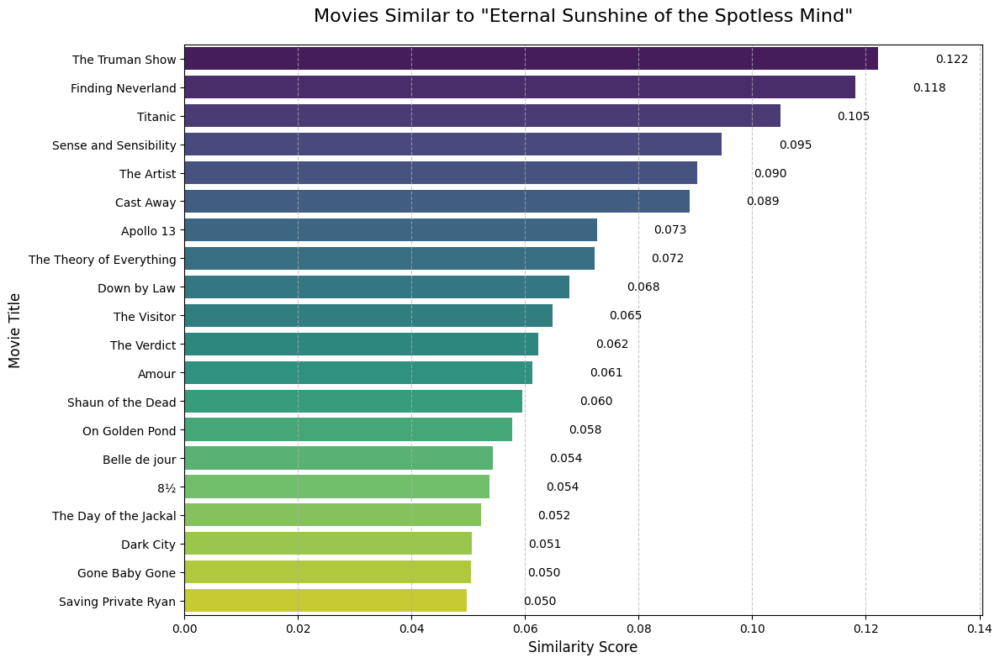

,Series_Title,Overview,Director,Star1,Star2,Star3,Similarity_Score
250,The Truman Show,An insurance salesman discovers his whole life...,Peter Weir,Jim Carrey,Ed Harris,Laura Linney,0.122196
940,Finding Neverland,The story of Sir J.M. Barrie's friendship with...,Marc Forster,Johnny Depp,Kate Winslet,Julie Christie,0.118185
652,Titanic,A seventeen-year-old aristocrat falls in love ...,James Cameron,Leonardo DiCaprio,Kate Winslet,Billy Zane,0.104962
962,Sense and Sensibility,"Rich Mr. Dashwood dies, leaving his second wif...",Ang Lee,Emma Thompson,Kate Winslet,James Fleet,0.094648
481,The Artist,An egomaniacal film star develops a relationsh...,Michel Hazanavicius,Jean Dujardin,Bérénice Bejo,John Goodman,0.090308
647,Cast Away,A FedEx executive undergoes a physical and emo...,Robert Zemeckis,Tom Hanks,Helen Hunt,Paul Sanchez,0.088941
966,Apollo 13,NASA must devise a strategy to return Apollo 1...,Ron Howard,Tom Hanks,Bill Paxton,Kevin Bacon,0.072637
729,The Theory of Everything,A look at the relationship between the famous ...,James Marsh,Eddie Redmayne,Felicity Jones,Tom Prior,0.072190
680,Down by Law,"Two men are framed and sent to jail, where the...",Jim Jarmusch,Tom Waits,John Lurie,Roberto Benigni,0.067843
916,The Visitor,A college professor travels to New York City t...,Tom McCarthy,Richard Jenkins,Haaz Sleiman,Danai Gurira,0.064793


In [ ]:

run_movie_recommender(df, "Eternal Sunshine of the Spotless Mind", 20)

In [ ]:
def get_optimal_recommendation(input_movie_name, df, siamese_network, tokenizer, model):
    """
    Compare recommendations from both approaches and return the first common movie
    or the top Siamese recommendation if there's no match.

    Parameters:
    input_movie_name (str): Movie title to get recommendations for
    df (pandas.DataFrame): DataFrame containing movie data
    siamese_network: The trained Siamese neural network
    tokenizer: BERT tokenizer for text processing
    model: BERT model for embeddings

    Returns:
    dict: Recommended movie information
    """
    # Get Siamese network recommendations
    siamese_recommendations = recommend_movies(input_movie_name, df, siamese_network, tokenizer, model)

    # Get content-based recommendations without visualization
    # Prepare features and calculate similarity
    similarity_matrix, indices = prepare_movie_features(df)
    content_based_recommendations = get_recommendations(input_movie_name, similarity_matrix, indices, df, top_n=20)

    # Extract movie titles from both recommendation sets
    siamese_titles = siamese_recommendations['Series_Title'].tolist()

    if isinstance(content_based_recommendations, pd.DataFrame):
        content_based_titles = content_based_recommendations['Series_Title'].tolist()
    else:
        # Handle the case where content-based returns an error message
        content_based_titles = []

    # Find common movies (excluding the input movie itself)
    common_movies = []
    for title in siamese_titles:
        if title in content_based_titles and title != input_movie_name:
            common_movies.append(title)

    # If there are common movies, return the first one
    if common_movies:
        # Get the similarity score from Siamese recommendations
        similarity = siamese_recommendations[siamese_recommendations['Series_Title'] == common_movies[0]]['Cosine Similarity'].values[0]
        return {
            "title": common_movies[0],
            "similarity_score": similarity,
            "source": "Both approaches"
        }

    # If no common movie exists, return the top Siamese recommendation (excluding the input movie)
    for title, similarity in zip(siamese_titles, siamese_recommendations['Cosine Similarity']):
        if title != input_movie_name:
            return {
                "title": title,
                "similarity_score": similarity,
                "source": "Siamese network"
            }

    # Fallback if nothing suitable found
    return None

# Example usage
if __name__ == "__main__":
    # Assume df, siamese_network, tokenizer, and model are already loaded
    movie_query = "Eternal Sunshine of the Spotless Mind"

    recommendation = get_optimal_recommendation(movie_query, df, siamese_network, tokenizer, model)

    if recommendation:
        print(f"\nOptimal recommendation for '{movie_query}':")
        print(f"Recommended movie: {recommendation['title']}")
        print(f"Similarity score: {recommendation['similarity_score']:.4f}")
        print(f"Source: {recommendation['source']}")
    else:
        print(f"\nNo recommendations available for '{movie_query}'.")


Optimal recommendation for 'Eternal Sunshine of the Spotless Mind':
Recommended movie: Her
Similarity score: 0.9901
Source: Siamese network


Maryam kazemi

The Secret Life of Walter Mitty

In [ ]:
# Example usage
input_movie_name = "Paths of Glory"
recommended_movies_df = recommend_movies(input_movie_name, df, siamese_network, tokenizer, model)
print(recommended_movies_df)

                      Series_Title  Cosine Similarity
0                   Paths of Glory           1.000000
1            Judgment at Nuremberg           0.996112
2               La Grande Illusion           0.990570
3                  Ivanovo detstvo           0.989087
4   All Quiet on the Western Front           0.988462
5                The Thin Red Line           0.986856
6              Saving Private Ryan           0.986419
7                Full Metal Jacket           0.985311
8                          Platoon           0.982268
9           La battaglia di Algeri           0.977951
10                 The Deer Hunter           0.974141
11             Beasts of No Nation           0.967802
12                     Mandariinid           0.962884
13           Au revoir les enfants           0.955672
14                        Lifeboat           0.943624


Top 20 movies similar to 'Paths of Glory':
                                                        Series_Title  Similarity_Score
                                                           Spartacus          0.184190
                                                        Barry Lyndon          0.125247
Dr. Strangelove or: How I Learned to Stop Worrying and Love the Bomb          0.120333
                                                Shichinin no samurai          0.096707
                                        Kakushi-toride no san-akunin          0.088362
                                                      Kelly's Heroes          0.084960
                                                 Saving Private Ryan          0.081072
                                                   The African Queen          0.078250
                                                  A Clockwork Orange          0.076949
                                                         The Killing          0.076822


<ipython-input-11-6f28ab141b3a>:128: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  ax = sns.barplot(


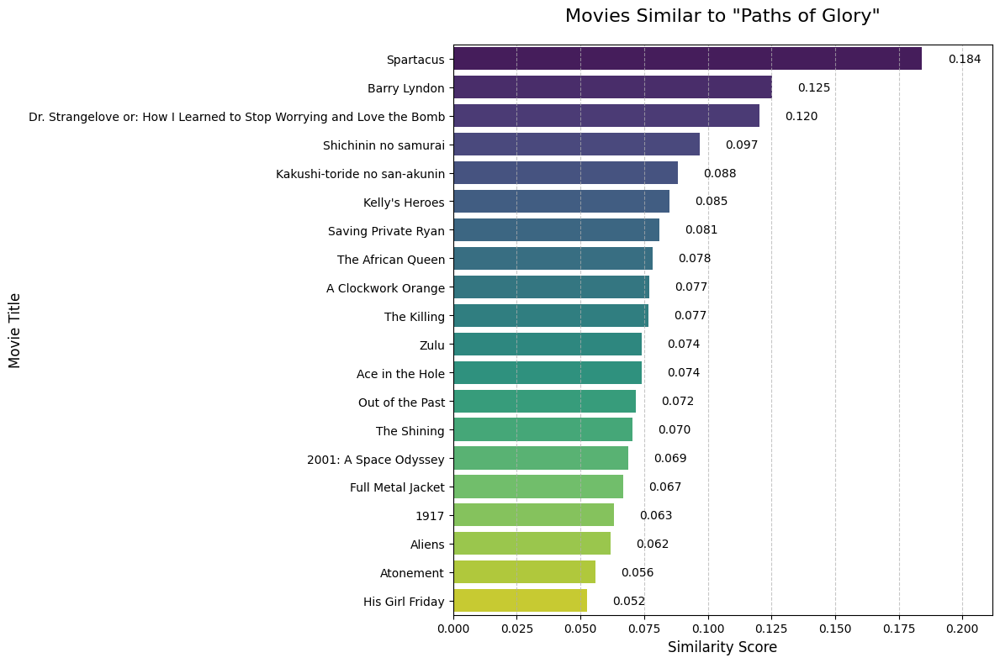

,Series_Title,Overview,Director,Star1,Star2,Star3,Similarity_Score
549,Spartacus,The slave Spartacus leads a violent revolt aga...,Stanley Kubrick,Kirk Douglas,Laurence Olivier,Jean Simmons,0.184190
281,Barry Lyndon,An Irish rogue wins the heart of a rich widow ...,Stanley Kubrick,Ryan O'Neal,Marisa Berenson,Patrick Magee,0.125247
78,Dr. Strangelove or: How I Learned to Stop Worr...,An insane general triggers a path to nuclear h...,Stanley Kubrick,Peter Sellers,George C. Scott,Sterling Hayden,0.120333
31,Shichinin no samurai,A poor village under attack by bandits recruit...,Akira Kurosawa,Toshirô Mifune,Takashi Shimura,Keiko Tsushima,0.096707
301,Kakushi-toride no san-akunin,"Lured by gold, two greedy peasants unknowingly...",Akira Kurosawa,Toshirô Mifune,Misa Uehara,Minoru Chiaki,0.088362
991,Kelly's Heroes,A group of U.S. soldiers sneaks across enemy l...,Brian G. Hutton,Clint Eastwood,Telly Savalas,Don Rickles,0.084960
24,Saving Private Ryan,"Following the Normandy Landings, a group of U....",Steven Spielberg,Tom Hanks,Matt Damon,Tom Sizemore,0.081072
873,The African Queen,"In WWI Africa, a gin-swilling riverboat captai...",John Huston,Humphrey Bogart,Katharine Hepburn,Robert Morley,0.078250
113,A Clockwork Orange,"In the future, a sadistic gang leader is impri...",Stanley Kubrick,Malcolm McDowell,Patrick Magee,Michael Bates,0.076949
441,The Killing,Crook Johnny Clay assembles a five man team to...,Stanley Kubrick,Sterling Hayden,Coleen Gray,Vince Edwards,0.076822


In [ ]:

run_movie_recommender(df, "Paths of Glory", 20)

In [ ]:
def get_optimal_recommendation(input_movie_name, df, siamese_network, tokenizer, model):
    """
    Compare recommendations from both approaches and return the first common movie
    or the top Siamese recommendation if there's no match.

    Parameters:
    input_movie_name (str): Movie title to get recommendations for
    df (pandas.DataFrame): DataFrame containing movie data
    siamese_network: The trained Siamese neural network
    tokenizer: BERT tokenizer for text processing
    model: BERT model for embeddings

    Returns:
    dict: Recommended movie information
    """
    # Get Siamese network recommendations
    siamese_recommendations = recommend_movies(input_movie_name, df, siamese_network, tokenizer, model)

    # Get content-based recommendations without visualization
    # Prepare features and calculate similarity
    similarity_matrix, indices = prepare_movie_features(df)
    content_based_recommendations = get_recommendations(input_movie_name, similarity_matrix, indices, df, top_n=20)

    # Extract movie titles from both recommendation sets
    siamese_titles = siamese_recommendations['Series_Title'].tolist()

    if isinstance(content_based_recommendations, pd.DataFrame):
        content_based_titles = content_based_recommendations['Series_Title'].tolist()
    else:
        # Handle the case where content-based returns an error message
        content_based_titles = []

    # Find common movies (excluding the input movie itself)
    common_movies = []
    for title in siamese_titles:
        if title in content_based_titles and title != input_movie_name:
            common_movies.append(title)

    # If there are common movies, return the first one
    if common_movies:
        # Get the similarity score from Siamese recommendations
        similarity = siamese_recommendations[siamese_recommendations['Series_Title'] == common_movies[0]]['Cosine Similarity'].values[0]
        return {
            "title": common_movies[0],
            "similarity_score": similarity,
            "source": "Both approaches"
        }

    # If no common movie exists, return the top Siamese recommendation (excluding the input movie)
    for title, similarity in zip(siamese_titles, siamese_recommendations['Cosine Similarity']):
        if title != input_movie_name:
            return {
                "title": title,
                "similarity_score": similarity,
                "source": "Siamese network"
            }

    # Fallback if nothing suitable found
    return None

# Example usage
if __name__ == "__main__":
    # Assume df, siamese_network, tokenizer, and model are already loaded
    movie_query = "Paths of Glory"

    recommendation = get_optimal_recommendation(movie_query, df, siamese_network, tokenizer, model)

    if recommendation:
        print(f"\nOptimal recommendation for '{movie_query}':")
        print(f"Recommended movie: {recommendation['title']}")
        print(f"Similarity score: {recommendation['similarity_score']:.4f}")
        print(f"Source: {recommendation['source']}")
    else:
        print(f"\nNo recommendations available for '{movie_query}'.")


Optimal recommendation for 'Paths of Glory':
Recommended movie: Saving Private Ryan
Similarity score: 0.9864
Source: Both approaches


Bad Movie

In [ ]:
# Example usage
input_movie_name = "Dead Man"
recommended_movies_df = recommend_movies(input_movie_name, df, siamese_network, tokenizer, model)
print(recommended_movies_df)

                                   Series_Title  Cosine Similarity
0                                      Dead Man           1.000000
1                                      Big Fish           0.996121
2                            La montaña sagrada           0.990683
3                                    Life of Pi           0.986805
4  Harry Potter and the Deathly Hallows: Part 2           0.982808
5                                      The Fall           0.972520


Top 20 movies similar to 'Dead Man':
                                   Series_Title  Similarity_Score
                            Edward Scissorhands          0.111267
                                 Night on Earth          0.105414
                                    Down by Law          0.096664
                    What's Eating Gilbert Grape          0.095441
                              God's Own Country          0.092863
                                           Blow          0.091373
                         Breakfast at Tiffany's          0.089383
                              Finding Neverland          0.085276
                                  Lethal Weapon          0.084029
                                         Psycho          0.082780
                                  Donnie Brasco          0.081753
                         The Outlaw Josey Wales          0.077610
                 Fear and Loathing in Las Vegas          0.076748
                                       

<ipython-input-11-6f28ab141b3a>:128: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  ax = sns.barplot(


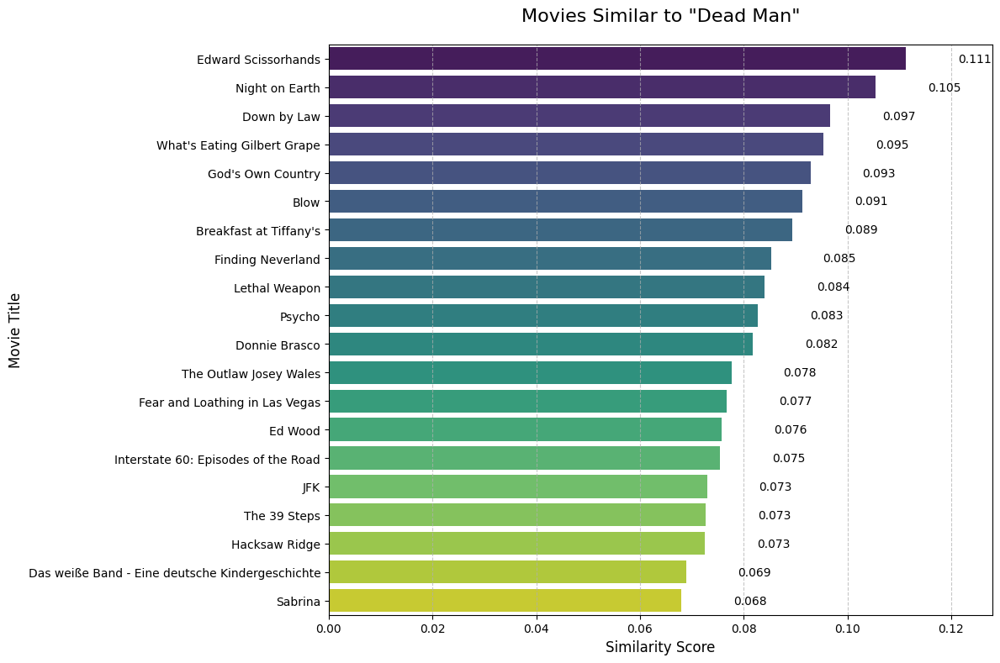

,Series_Title,Overview,Director,Star1,Star2,Star3,Similarity_Score
524,Edward Scissorhands,"An artificial man, who was incompletely constr...",Tim Burton,Johnny Depp,Winona Ryder,Dianne Wiest,0.111267
667,Night on Earth,An anthology of 5 different cab drivers in 5 A...,Jim Jarmusch,Winona Ryder,Gena Rowlands,Lisanne Falk,0.105414
680,Down by Law,"Two men are framed and sent to jail, where the...",Jim Jarmusch,Tom Waits,John Lurie,Roberto Benigni,0.096664
658,What's Eating Gilbert Grape,A young man in a small Midwestern town struggl...,Lasse Hallström,Johnny Depp,Leonardo DiCaprio,Juliette Lewis,0.095441
721,God's Own Country,Spring. Yorkshire. Young farmer Johnny Saxby n...,Francis Lee,Josh O'Connor,Alec Secareanu,Gemma Jones,0.092863
949,Blow,"The story of how George Jung, along with the M...",Ted Demme,Johnny Depp,Penélope Cruz,Franka Potente,0.091373
995,Breakfast at Tiffany's,A young New York socialite becomes interested ...,Blake Edwards,Audrey Hepburn,George Peppard,Patricia Neal,0.089383
940,Finding Neverland,The story of Sir J.M. Barrie's friendship with...,Marc Forster,Johnny Depp,Kate Winslet,Julie Christie,0.085276
979,Lethal Weapon,Two newly paired cops who are complete opposit...,Richard Donner,Mel Gibson,Danny Glover,Gary Busey,0.084029
49,Psycho,"A Phoenix secretary embezzles $40,000 from her...",Alfred Hitchcock,Anthony Perkins,Janet Leigh,Vera Miles,0.082780


In [ ]:

run_movie_recommender(df, "Dead Man", 20)

In [ ]:
def get_optimal_recommendation(input_movie_name, df, siamese_network, tokenizer, model):
    """
    Compare recommendations from both approaches and return the first common movie
    or the top Siamese recommendation if there's no match.

    Parameters:
    input_movie_name (str): Movie title to get recommendations for
    df (pandas.DataFrame): DataFrame containing movie data
    siamese_network: The trained Siamese neural network
    tokenizer: BERT tokenizer for text processing
    model: BERT model for embeddings

    Returns:
    dict: Recommended movie information
    """
    # Get Siamese network recommendations
    siamese_recommendations = recommend_movies(input_movie_name, df, siamese_network, tokenizer, model)

    # Get content-based recommendations without visualization
    # Prepare features and calculate similarity
    similarity_matrix, indices = prepare_movie_features(df)
    content_based_recommendations = get_recommendations(input_movie_name, similarity_matrix, indices, df, top_n=20)

    # Extract movie titles from both recommendation sets
    siamese_titles = siamese_recommendations['Series_Title'].tolist()

    if isinstance(content_based_recommendations, pd.DataFrame):
        content_based_titles = content_based_recommendations['Series_Title'].tolist()
    else:
        # Handle the case where content-based returns an error message
        content_based_titles = []

    # Find common movies (excluding the input movie itself)
    common_movies = []
    for title in siamese_titles:
        if title in content_based_titles and title != input_movie_name:
            common_movies.append(title)

    # If there are common movies, return the first one
    if common_movies:
        # Get the similarity score from Siamese recommendations
        similarity = siamese_recommendations[siamese_recommendations['Series_Title'] == common_movies[0]]['Cosine Similarity'].values[0]
        return {
            "title": common_movies[0],
            "similarity_score": similarity,
            "source": "Both approaches"
        }

    # If no common movie exists, return the top Siamese recommendation (excluding the input movie)
    for title, similarity in zip(siamese_titles, siamese_recommendations['Cosine Similarity']):
        if title != input_movie_name:
            return {
                "title": title,
                "similarity_score": similarity,
                "source": "Siamese network"
            }

    # Fallback if nothing suitable found
    return None

# Example usage
if __name__ == "__main__":
    # Assume df, siamese_network, tokenizer, and model are already loaded
    movie_query = "Dead Man"

    recommendation = get_optimal_recommendation(movie_query, df, siamese_network, tokenizer, model)

    if recommendation:
        print(f"\nOptimal recommendation for '{movie_query}':")
        print(f"Recommended movie: {recommendation['title']}")
        print(f"Similarity score: {recommendation['similarity_score']:.4f}")
        print(f"Source: {recommendation['source']}")
    else:
        print(f"\nNo recommendations available for '{movie_query}'.")


Optimal recommendation for 'Dead Man':
Recommended movie: Big Fish
Similarity score: 0.9961
Source: Siamese network


Maryam Kazemi

In the Loop

Top 20 movies similar to 'Eternal Sunshine of the Spotless Mind':
            Series_Title  Similarity_Score
         The Truman Show          0.122196
       Finding Neverland          0.118185
                 Titanic          0.104962
   Sense and Sensibility          0.094648
              The Artist          0.090308
               Cast Away          0.088941
               Apollo 13          0.072637
The Theory of Everything          0.072190
             Down by Law          0.067843
             The Visitor          0.064793
             The Verdict          0.062377
                   Amour          0.061341
       Shaun of the Dead          0.059537
          On Golden Pond          0.057716
           Belle de jour          0.054337
                      8½          0.053694
   The Day of the Jackal          0.052240
               Dark City          0.050565
          Gone Baby Gone          0.050439
     Saving Private Ryan          0.049671


<ipython-input-11-6f28ab141b3a>:128: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  ax = sns.barplot(


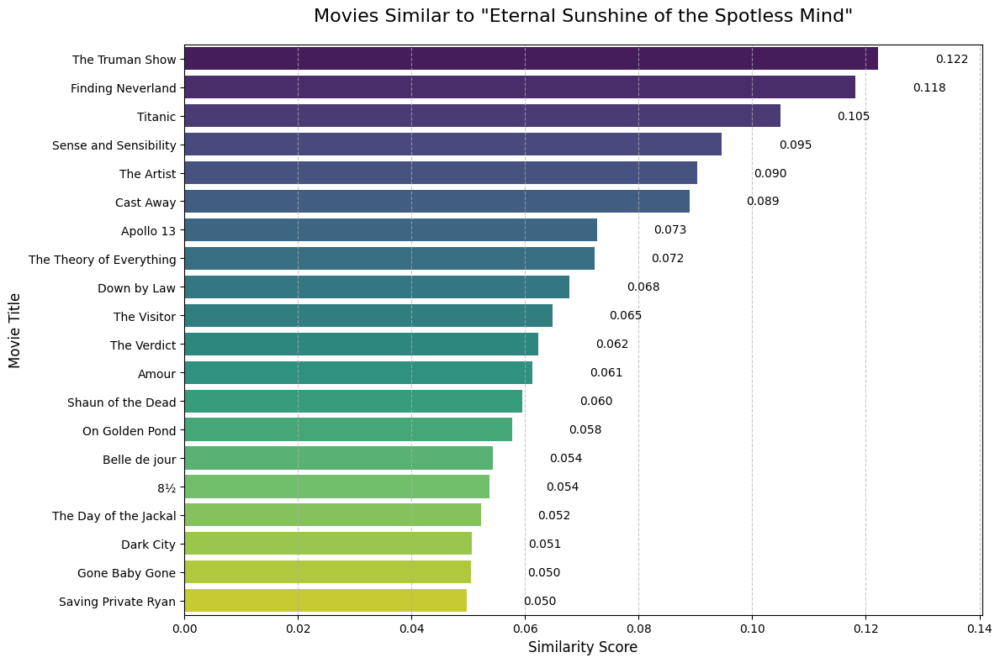

,Series_Title,Overview,Director,Star1,Star2,Star3,Similarity_Score
250,The Truman Show,An insurance salesman discovers his whole life...,Peter Weir,Jim Carrey,Ed Harris,Laura Linney,0.122196
940,Finding Neverland,The story of Sir J.M. Barrie's friendship with...,Marc Forster,Johnny Depp,Kate Winslet,Julie Christie,0.118185
652,Titanic,A seventeen-year-old aristocrat falls in love ...,James Cameron,Leonardo DiCaprio,Kate Winslet,Billy Zane,0.104962
962,Sense and Sensibility,"Rich Mr. Dashwood dies, leaving his second wif...",Ang Lee,Emma Thompson,Kate Winslet,James Fleet,0.094648
481,The Artist,An egomaniacal film star develops a relationsh...,Michel Hazanavicius,Jean Dujardin,Bérénice Bejo,John Goodman,0.090308
647,Cast Away,A FedEx executive undergoes a physical and emo...,Robert Zemeckis,Tom Hanks,Helen Hunt,Paul Sanchez,0.088941
966,Apollo 13,NASA must devise a strategy to return Apollo 1...,Ron Howard,Tom Hanks,Bill Paxton,Kevin Bacon,0.072637
729,The Theory of Everything,A look at the relationship between the famous ...,James Marsh,Eddie Redmayne,Felicity Jones,Tom Prior,0.072190
680,Down by Law,"Two men are framed and sent to jail, where the...",Jim Jarmusch,Tom Waits,John Lurie,Roberto Benigni,0.067843
916,The Visitor,A college professor travels to New York City t...,Tom McCarthy,Richard Jenkins,Haaz Sleiman,Danai Gurira,0.064793


In [ ]:

run_movie_recommender(df, "Eternal Sunshine of the Spotless Mind", 20)

In [ ]:
# Example usage
input_movie_name = "Eternal Sunshine of the Spotless Mind"
recommended_movies_df = recommend_movies(input_movie_name, df, siamese_network, tokenizer, model)
print(recommended_movies_df)

                            Series_Title  Cosine Similarity
0  Eternal Sunshine of the Spotless Mind           1.000000
1                                    Her           0.990091


In [ ]:
def get_optimal_recommendation(input_movie_name, df, siamese_network, tokenizer, model):
    """
    Compare recommendations from both approaches and return the first common movie
    or the top Siamese recommendation if there's no match.

    Parameters:
    input_movie_name (str): Movie title to get recommendations for
    df (pandas.DataFrame): DataFrame containing movie data
    siamese_network: The trained Siamese neural network
    tokenizer: BERT tokenizer for text processing
    model: BERT model for embeddings

    Returns:
    dict: Recommended movie information
    """
    # Get Siamese network recommendations
    siamese_recommendations = recommend_movies(input_movie_name, df, siamese_network, tokenizer, model)

    # Get content-based recommendations without visualization
    # Prepare features and calculate similarity
    similarity_matrix, indices = prepare_movie_features(df)
    content_based_recommendations = get_recommendations(input_movie_name, similarity_matrix, indices, df, top_n=20)

    # Extract movie titles from both recommendation sets
    siamese_titles = siamese_recommendations['Series_Title'].tolist()

    if isinstance(content_based_recommendations, pd.DataFrame):
        content_based_titles = content_based_recommendations['Series_Title'].tolist()
    else:
        # Handle the case where content-based returns an error message
        content_based_titles = []

    # Find common movies (excluding the input movie itself)
    common_movies = []
    for title in siamese_titles:
        if title in content_based_titles and title != input_movie_name:
            common_movies.append(title)

    # If there are common movies, return the first one
    if common_movies:
        # Get the similarity score from Siamese recommendations
        similarity = siamese_recommendations[siamese_recommendations['Series_Title'] == common_movies[0]]['Cosine Similarity'].values[0]
        return {
            "title": common_movies[0],
            "similarity_score": similarity,
            "source": "Both approaches"
        }

    # If no common movie exists, return the top Siamese recommendation (excluding the input movie)
    for title, similarity in zip(siamese_titles, siamese_recommendations['Cosine Similarity']):
        if title != input_movie_name:
            return {
                "title": title,
                "similarity_score": similarity,
                "source": "Siamese network"
            }

    # Fallback if nothing suitable found
    return None

# Example usage
if __name__ == "__main__":
    # Assume df, siamese_network, tokenizer, and model are already loaded
    movie_query = "Eternal Sunshine of the Spotless Mind"

    recommendation = get_optimal_recommendation(movie_query, df, siamese_network, tokenizer, model)

    if recommendation:
        print(f"\nOptimal recommendation for '{movie_query}':")
        print(f"Recommended movie: {recommendation['title']}")
        print(f"Similarity score: {recommendation['similarity_score']:.4f}")
        print(f"Source: {recommendation['source']}")
    else:
        print(f"\nNo recommendations available for '{movie_query}'.")


Optimal recommendation for 'Eternal Sunshine of the Spotless Mind':
Recommended movie: Her
Similarity score: 0.9901
Source: Siamese network


محبوبه مظاهری

In the loop

Faezeh Abedi nia

In [ ]:
# Example usage
input_movie_name = "Office Space"
recommended_movies_df = recommend_movies(input_movie_name, df, siamese_network, tokenizer, model)
print(recommended_movies_df)

                                         Series_Title  Cosine Similarity
0                                        Office Space           1.000000
1                                        The Hangover           0.993590
2                                      The Odd Couple           0.989838
3                 Le charme discret de la bourgeoisie           0.988580
4                                              Clerks           0.987590
5                            Ferris Bueller's Day Off           0.985196
6                                  Dazed and Confused           0.977185
7                                           Airplane!           0.976557
8                                    Le dîner de cons           0.975221
9                                               Zelig           0.971068
10                                 Young Frankenstein           0.962009
11                                      Life of Brian           0.956832
12  Dr. Strangelove or: How I Learned to Stop Worr.

Top 20 movies similar to 'Office Space':
                                Series_Title  Similarity_Score
                              The Iron Giant          0.111273
                          La planète sauvage          0.089766
                            A Beautiful Mind          0.084651
              The Boy in the Striped Pyjamas          0.078617
                          Dallas Buyers Club          0.074960
                           Kill Bill: Vol. 2          0.073630
                       Trois couleurs: Rouge          0.071158
               Sunrise: A Song of Two Humans          0.070882
                Kakushi-toride no san-akunin          0.069322
                                 The Sandlot          0.067462
Harry Potter and the Deathly Hallows: Part 2          0.062799
                                 Frost/Nixon          0.062233
                                       Naked          0.061862
Harry Potter and the Deathly Hallows: Part 1          0.060984
              

<ipython-input-11-6f28ab141b3a>:128: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  ax = sns.barplot(


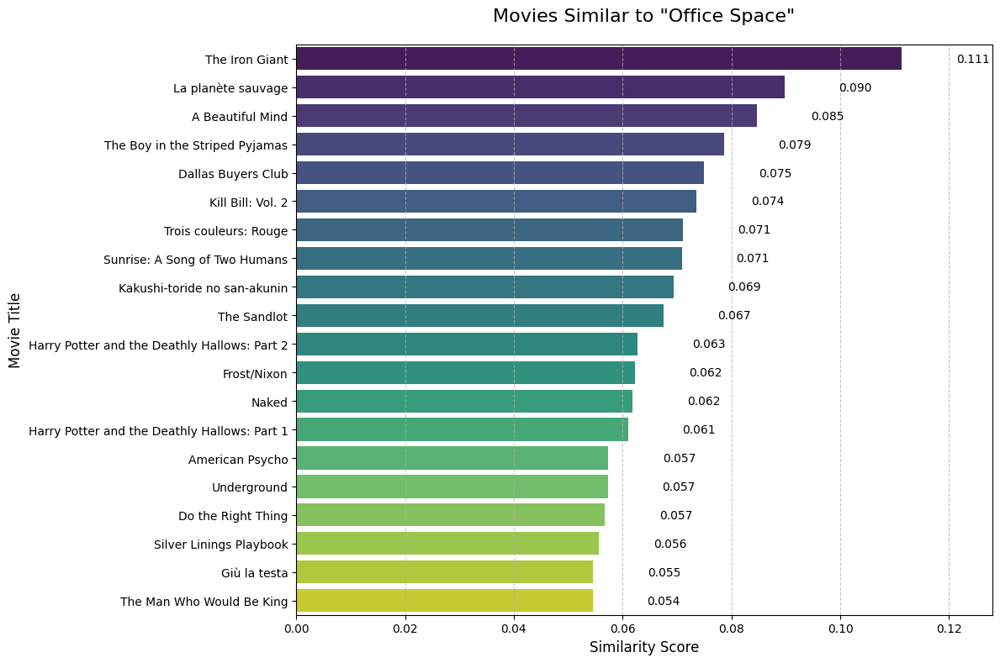

,Series_Title,Overview,Director,Star1,Star2,Star3,Similarity_Score
389,The Iron Giant,A young boy befriends a giant robot from outer...,Brad Bird,Eli Marienthal,Harry Connick Jr.,Jennifer Aniston,0.111273
694,La planète sauvage,"On a faraway planet where blue giants rule, op...",René Laloux,Barry Bostwick,Jennifer Drake,Eric Baugin,0.089766
159,A Beautiful Mind,"After John Nash, a brilliant but asocial mathe...",Ron Howard,Russell Crowe,Ed Harris,Jennifer Connelly,0.084651
616,The Boy in the Striped Pyjamas,"Through the innocent eyes of Bruno, the eight-...",Mark Herman,Asa Butterfield,David Thewlis,Rupert Friend,0.078617
359,Dallas Buyers Club,"In 1985 Dallas, electrician and hustler Ron Wo...",Jean-Marc Vallée,Matthew McConaughey,Jennifer Garner,Jared Leto,0.074960
369,Kill Bill: Vol. 2,The Bride continues her quest of vengeance aga...,Quentin Tarantino,Uma Thurman,David Carradine,Michael Madsen,0.073630
260,Trois couleurs: Rouge,A model discovers a retired judge is keen on i...,Krzysztof Kieslowski,Irène Jacob,Jean-Louis Trintignant,Frédérique Feder,0.071158
319,Sunrise: A Song of Two Humans,An allegorical tale about a man fighting the g...,F.W. Murnau,George O'Brien,Janet Gaynor,Margaret Livingston,0.070882
301,Kakushi-toride no san-akunin,"Lured by gold, two greedy peasants unknowingly...",Akira Kurosawa,Toshirô Mifune,Misa Uehara,Minoru Chiaki,0.069322
660,The Sandlot,"In the summer of 1962, a new kid in town is ta...",David Mickey Evans,Tom Guiry,Mike Vitar,Art LaFleur,0.067462


In [ ]:

run_movie_recommender(df, "Office Space", 20)

In [ ]:
def get_optimal_recommendation(input_movie_name, df, siamese_network, tokenizer, model):
    """
    Compare recommendations from both approaches and return the first common movie
    or the top Siamese recommendation if there's no match.

    Parameters:
    input_movie_name (str): Movie title to get recommendations for
    df (pandas.DataFrame): DataFrame containing movie data
    siamese_network: The trained Siamese neural network
    tokenizer: BERT tokenizer for text processing
    model: BERT model for embeddings

    Returns:
    dict: Recommended movie information
    """
    # Get Siamese network recommendations
    siamese_recommendations = recommend_movies(input_movie_name, df, siamese_network, tokenizer, model)

    # Get content-based recommendations without visualization
    # Prepare features and calculate similarity
    similarity_matrix, indices = prepare_movie_features(df)
    content_based_recommendations = get_recommendations(input_movie_name, similarity_matrix, indices, df, top_n=20)

    # Extract movie titles from both recommendation sets
    siamese_titles = siamese_recommendations['Series_Title'].tolist()

    if isinstance(content_based_recommendations, pd.DataFrame):
        content_based_titles = content_based_recommendations['Series_Title'].tolist()
    else:
        # Handle the case where content-based returns an error message
        content_based_titles = []

    # Find common movies (excluding the input movie itself)
    common_movies = []
    for title in siamese_titles:
        if title in content_based_titles and title != input_movie_name:
            common_movies.append(title)

    # If there are common movies, return the first one
    if common_movies:
        # Get the similarity score from Siamese recommendations
        similarity = siamese_recommendations[siamese_recommendations['Series_Title'] == common_movies[0]]['Cosine Similarity'].values[0]
        return {
            "title": common_movies[0],
            "similarity_score": similarity,
            "source": "Both approaches"
        }

    # If no common movie exists, return the top Siamese recommendation (excluding the input movie)
    for title, similarity in zip(siamese_titles, siamese_recommendations['Cosine Similarity']):
        if title != input_movie_name:
            return {
                "title": title,
                "similarity_score": similarity,
                "source": "Siamese network"
            }

    # Fallback if nothing suitable found
    return None

# Example usage
if __name__ == "__main__":
    # Assume df, siamese_network, tokenizer, and model are already loaded
    movie_query = "Office Space"

    recommendation = get_optimal_recommendation(movie_query, df, siamese_network, tokenizer, model)

    if recommendation:
        print(f"\nOptimal recommendation for '{movie_query}':")
        print(f"Recommended movie: {recommendation['title']}")
        print(f"Similarity score: {recommendation['similarity_score']:.4f}")
        print(f"Source: {recommendation['source']}")
    else:
        print(f"\nNo recommendations available for '{movie_query}'.")


Optimal recommendation for 'Office Space':
Recommended movie: The Hangover
Similarity score: 0.9936
Source: Siamese network


Top 20 movies similar to 'The King of Comedy':
           Series_Title  Similarity_Score
           The Irishman          0.119793
            Raging Bull          0.116800
              Gone Girl          0.107835
           A Bronx Tale          0.102529
             Goodfellas          0.091585
                 Casino          0.086060
            Taxi Driver          0.084015
         Shutter Island          0.066806
           The Departed          0.066749
          Walk the Line          0.061973
              Airplane!          0.060628
 The Godfather: Part II          0.059046
The Wolf of Wall Street          0.056712
            After Hours          0.056205
           The Notebook          0.054000
                 Brazil          0.053814
               Kick-Ass          0.048946
        The Deer Hunter          0.048493
             Awakenings          0.047155
    Boksuneun naui geot          0.047050


<ipython-input-11-6f28ab141b3a>:128: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  ax = sns.barplot(


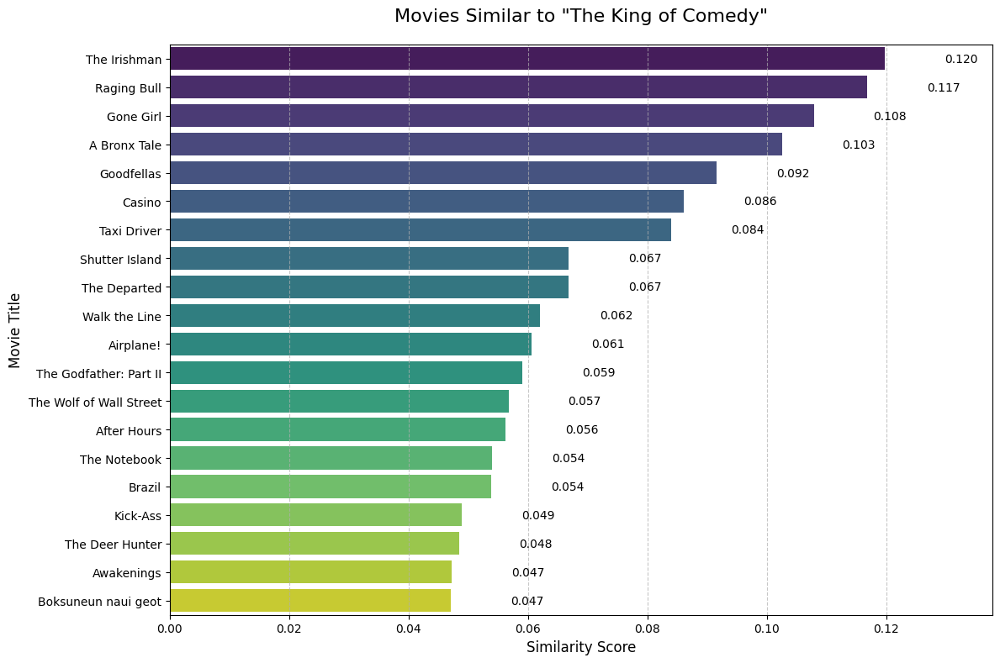

,Series_Title,Overview,Director,Star1,Star2,Star3,Similarity_Score
484,The Irishman,An old man recalls his time painting houses fo...,Martin Scorsese,Robert De Niro,Al Pacino,Joe Pesci,0.119793
173,Raging Bull,"The life of boxer Jake LaMotta, whose violence...",Martin Scorsese,Robert De Niro,Cathy Moriarty,Joe Pesci,0.116800
210,Gone Girl,With his wife's disappearance having become th...,David Fincher,Ben Affleck,Rosamund Pike,Neil Patrick Harris,0.107835
664,A Bronx Tale,A father becomes worried when a local gangster...,Robert De Niro,Robert De Niro,Chazz Palminteri,Lillo Brancato,0.102529
15,Goodfellas,The story of Henry Hill and his life in the mo...,Martin Scorsese,Robert De Niro,Ray Liotta,Joe Pesci,0.091585
165,Casino,"A tale of greed, deception, money, power, and ...",Martin Scorsese,Robert De Niro,Sharon Stone,Joe Pesci,0.086060
111,Taxi Driver,A mentally unstable veteran works as a nightti...,Martin Scorsese,Robert De Niro,Jodie Foster,Cybill Shepherd,0.084015
145,Shutter Island,"In 1954, a U.S. Marshal investigates the disap...",Martin Scorsese,Leonardo DiCaprio,Emily Mortimer,Mark Ruffalo,0.066806
37,The Departed,An undercover cop and a mole in the police att...,Martin Scorsese,Leonardo DiCaprio,Matt Damon,Jack Nicholson,0.066749
635,Walk the Line,A chronicle of country music legend Johnny Cas...,James Mangold,Joaquin Phoenix,Reese Witherspoon,Ginnifer Goodwin,0.061973


In [ ]:

run_movie_recommender(df, "The King of Comedy", 20)

In [ ]:
# Example usage
input_movie_name = "The King of Comedy"
recommended_movies_df = recommend_movies(input_movie_name, df, siamese_network, tokenizer, model)
print(recommended_movies_df)

                                 Series_Title  Cosine Similarity
0                          The King of Comedy           1.000000
1                                 After Hours           0.984236
2   Three Billboards Outside Ebbing, Missouri           0.982490
3                                  Paper Moon           0.979490
4                            The Long Goodbye           0.979201
5                                 Down by Law           0.978117
6                                   The Sting           0.976628
7                             Rang De Basanti           0.974135
8                                   In Bruges           0.966535
9                                 Adams æbler           0.965288
10                            American Psycho           0.962566
11                                 Knives Out           0.957753
12                              Do lok tin si           0.956192
13                             Dom za vesanje           0.955200
14                       

In [ ]:
def get_optimal_recommendation(input_movie_name, df, siamese_network, tokenizer, model):
    """
    Compare recommendations from both approaches and return the first common movie
    or the top Siamese recommendation if there's no match.

    Parameters:
    input_movie_name (str): Movie title to get recommendations for
    df (pandas.DataFrame): DataFrame containing movie data
    siamese_network: The trained Siamese neural network
    tokenizer: BERT tokenizer for text processing
    model: BERT model for embeddings

    Returns:
    dict: Recommended movie information
    """
    # Get Siamese network recommendations
    siamese_recommendations = recommend_movies(input_movie_name, df, siamese_network, tokenizer, model)

    # Get content-based recommendations without visualization
    # Prepare features and calculate similarity
    similarity_matrix, indices = prepare_movie_features(df)
    content_based_recommendations = get_recommendations(input_movie_name, similarity_matrix, indices, df, top_n=20)

    # Extract movie titles from both recommendation sets
    siamese_titles = siamese_recommendations['Series_Title'].tolist()

    if isinstance(content_based_recommendations, pd.DataFrame):
        content_based_titles = content_based_recommendations['Series_Title'].tolist()
    else:
        # Handle the case where content-based returns an error message
        content_based_titles = []

    # Find common movies (excluding the input movie itself)
    common_movies = []
    for title in siamese_titles:
        if title in content_based_titles and title != input_movie_name:
            common_movies.append(title)

    # If there are common movies, return the first one
    if common_movies:
        # Get the similarity score from Siamese recommendations
        similarity = siamese_recommendations[siamese_recommendations['Series_Title'] == common_movies[0]]['Cosine Similarity'].values[0]
        return {
            "title": common_movies[0],
            "similarity_score": similarity,
            "source": "Both approaches"
        }

    # If no common movie exists, return the top Siamese recommendation (excluding the input movie)
    for title, similarity in zip(siamese_titles, siamese_recommendations['Cosine Similarity']):
        if title != input_movie_name:
            return {
                "title": title,
                "similarity_score": similarity,
                "source": "Siamese network"
            }

    # Fallback if nothing suitable found
    return None

# Example usage
if __name__ == "__main__":
    # Assume df, siamese_network, tokenizer, and model are already loaded
    movie_query = "The King of Comedy"

    recommendation = get_optimal_recommendation(movie_query, df, siamese_network, tokenizer, model)

    if recommendation:
        print(f"\nOptimal recommendation for '{movie_query}':")
        print(f"Recommended movie: {recommendation['title']}")
        print(f"Similarity score: {recommendation['similarity_score']:.4f}")
        print(f"Source: {recommendation['source']}")
    else:
        print(f"\nNo recommendations available for '{movie_query}'.")


Optimal recommendation for 'The King of Comedy':
Recommended movie: After Hours
Similarity score: 0.9842
Source: Both approaches


Fatemeh Ahmadi

Master and Commander: The Far Side of the World

Top 20 movies similar to 'Slumdog Millionaire':
              Series_Title  Similarity_Score
                      Lion          0.135643
          28 Days Later...          0.094620
             Trainspotting          0.085967
              Little Women          0.078781
    Swades: We, the People          0.068732
                 Gully Boy          0.060271
          The Big Lebowski          0.056581
The Muppet Christmas Carol          0.056314
                 True Grit          0.055725
                  Coraline          0.055436
                     Black          0.055404
              The Lunchbox          0.055196
                    Gandhi          0.051523
             The Lion King          0.048385
          Inherit the Wind          0.048101
            The Iron Giant          0.048092
            Wreck-It Ralph          0.047660
          Eastern Promises          0.046885
              Donnie Darko          0.045670
       Todo sobre mi madre          0.043570


<ipython-input-11-6f28ab141b3a>:128: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  ax = sns.barplot(


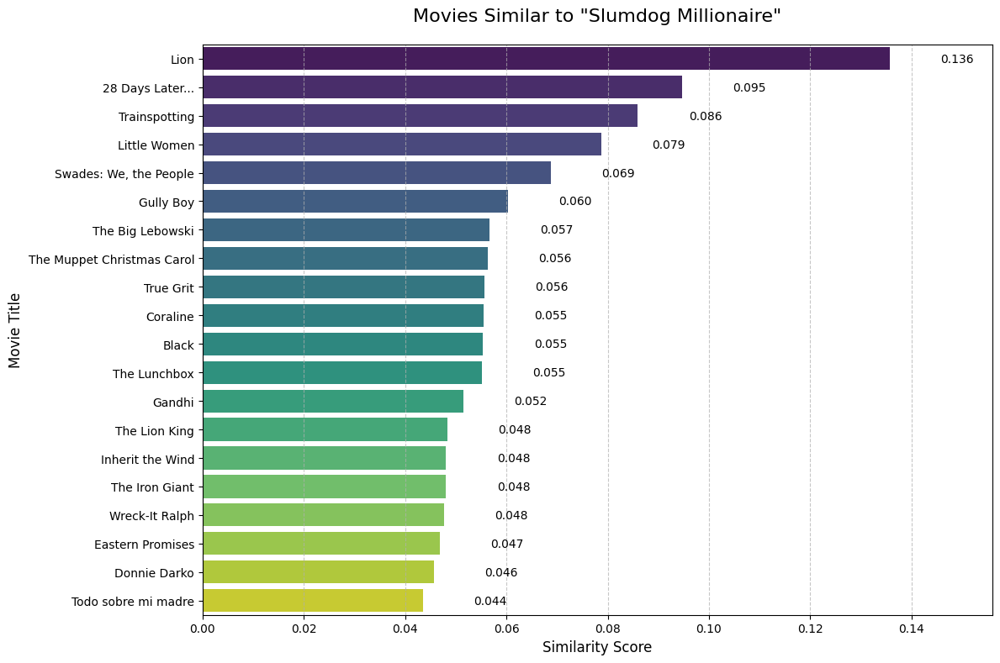

,Series_Title,Overview,Director,Star1,Star2,Star3,Similarity_Score
328,Lion,A five-year-old Indian boy is adopted by an Au...,Garth Davis,Dev Patel,Nicole Kidman,Rooney Mara,0.135643
943,28 Days Later...,"Four weeks after a mysterious, incurable virus...",Danny Boyle,Cillian Murphy,Naomie Harris,Christopher Eccleston,0.094620
254,Trainspotting,"Renton, deeply immersed in the Edinburgh drug ...",Danny Boyle,Ewan McGregor,Ewen Bremner,Jonny Lee Miller,0.085967
585,Little Women,"Jo March reflects back and forth on her life, ...",Greta Gerwig,Saoirse Ronan,Emma Watson,Florence Pugh,0.078781
156,"Swades: We, the People",A successful Indian scientist returns to an In...,Ashutosh Gowariker,Shah Rukh Khan,Gayatri Joshi,Kishori Ballal,0.068732
334,Gully Boy,A coming-of-age story based on the lives of st...,Zoya Akhtar,Vijay Varma,Nakul Roshan Sahdev,Ranveer Singh,0.060271
252,The Big Lebowski,"Jeff ""The Dude"" Lebowski, mistaken for a milli...",Joel Coen,Ethan Coen,Jeff Bridges,John Goodman,0.056581
819,The Muppet Christmas Carol,The Muppet characters tell their version of th...,Brian Henson,Michael Caine,Kermit the Frog,Dave Goelz,0.056314
904,True Grit,A stubborn teenager enlists the help of a toug...,Ethan Coen,Joel Coen,Jeff Bridges,Matt Damon,0.055725
783,Coraline,An adventurous 11-year-old girl finds another ...,Henry Selick,Dakota Fanning,Teri Hatcher,John Hodgman,0.055436


In [ ]:

run_movie_recommender(df, "Slumdog Millionaire", 20)

In [ ]:
# Example usage
input_movie_name = "Slumdog Millionaire"
recommended_movies_df = recommend_movies(input_movie_name, df, siamese_network, tokenizer, model)
print(recommended_movies_df)

                         Series_Title  Cosine Similarity
0                 Slumdog Millionaire           1.000000
1               The Last Picture Show           0.972591
2         Dilwale Dulhania Le Jayenge           0.969549
3                        The Lunchbox           0.969357
4                   Good Will Hunting           0.967504
5                      Gegen die Wand           0.966481
6                               Dev.D           0.966191
7                        Jules et Jim           0.965165
8                             Titanic           0.963018
9                    Fa yeung nin wah           0.959940
10                Hiroshima mon amour           0.958687
11              Nuovo Cinema Paradiso           0.956743
12                              Amour           0.954856
13                     La vie d'Adèle           0.952977
14                       Forrest Gump           0.952283
15                      Belle de jour           0.951696
16                    Brief Enc

In [ ]:
def get_optimal_recommendation(input_movie_name, df, siamese_network, tokenizer, model):
    """
    Compare recommendations from both approaches and return the first common movie
    or the top Siamese recommendation if there's no match.

    Parameters:
    input_movie_name (str): Movie title to get recommendations for
    df (pandas.DataFrame): DataFrame containing movie data
    siamese_network: The trained Siamese neural network
    tokenizer: BERT tokenizer for text processing
    model: BERT model for embeddings

    Returns:
    dict: Recommended movie information
    """
    # Get Siamese network recommendations
    siamese_recommendations = recommend_movies(input_movie_name, df, siamese_network, tokenizer, model)

    # Get content-based recommendations without visualization
    # Prepare features and calculate similarity
    similarity_matrix, indices = prepare_movie_features(df)
    content_based_recommendations = get_recommendations(input_movie_name, similarity_matrix, indices, df, top_n=20)

    # Extract movie titles from both recommendation sets
    siamese_titles = siamese_recommendations['Series_Title'].tolist()

    if isinstance(content_based_recommendations, pd.DataFrame):
        content_based_titles = content_based_recommendations['Series_Title'].tolist()
    else:
        # Handle the case where content-based returns an error message
        content_based_titles = []

    # Find common movies (excluding the input movie itself)
    common_movies = []
    for title in siamese_titles:
        if title in content_based_titles and title != input_movie_name:
            common_movies.append(title)

    # If there are common movies, return the first one
    if common_movies:
        # Get the similarity score from Siamese recommendations
        similarity = siamese_recommendations[siamese_recommendations['Series_Title'] == common_movies[0]]['Cosine Similarity'].values[0]
        return {
            "title": common_movies[0],
            "similarity_score": similarity,
            "source": "Both approaches"
        }

    # If no common movie exists, return the top Siamese recommendation (excluding the input movie)
    for title, similarity in zip(siamese_titles, siamese_recommendations['Cosine Similarity']):
        if title != input_movie_name:
            return {
                "title": title,
                "similarity_score": similarity,
                "source": "Siamese network"
            }

    # Fallback if nothing suitable found
    return None

# Example usage
if __name__ == "__main__":
    # Assume df, siamese_network, tokenizer, and model are already loaded
    movie_query = "Slumdog Millionaire"

    recommendation = get_optimal_recommendation(movie_query, df, siamese_network, tokenizer, model)

    if recommendation:
        print(f"\nOptimal recommendation for '{movie_query}':")
        print(f"Recommended movie: {recommendation['title']}")
        print(f"Similarity score: {recommendation['similarity_score']:.4f}")
        print(f"Source: {recommendation['source']}")
    else:
        print(f"\nNo recommendations available for '{movie_query}'.")


Optimal recommendation for 'Slumdog Millionaire':
Recommended movie: The Lunchbox
Similarity score: 0.9694
Source: Both approaches


Bad movie

Top 20 movies similar to 'Lifeboat':
          Series_Title  Similarity_Score
              Serenity          0.176501
      The Great Escape          0.104211
          Blade Runner          0.100431
                 Alien          0.091605
     Empire of the Sun          0.090500
  To Have and Have Not          0.088126
                  Rope          0.085400
      Captain Phillips          0.080705
     Dial M for Murder          0.078895
             Notorious          0.075260
  Strangers on a Train          0.074232
           Rear Window          0.070930
               Vertigo          0.070439
The Remains of the Day          0.069776
     The Lady Vanishes          0.069079
    North by Northwest          0.068413
                Patton          0.067809
        Hotaru no haka          0.065619
           The Pianist          0.063528
               Rebecca          0.063251


<ipython-input-11-6f28ab141b3a>:128: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  ax = sns.barplot(


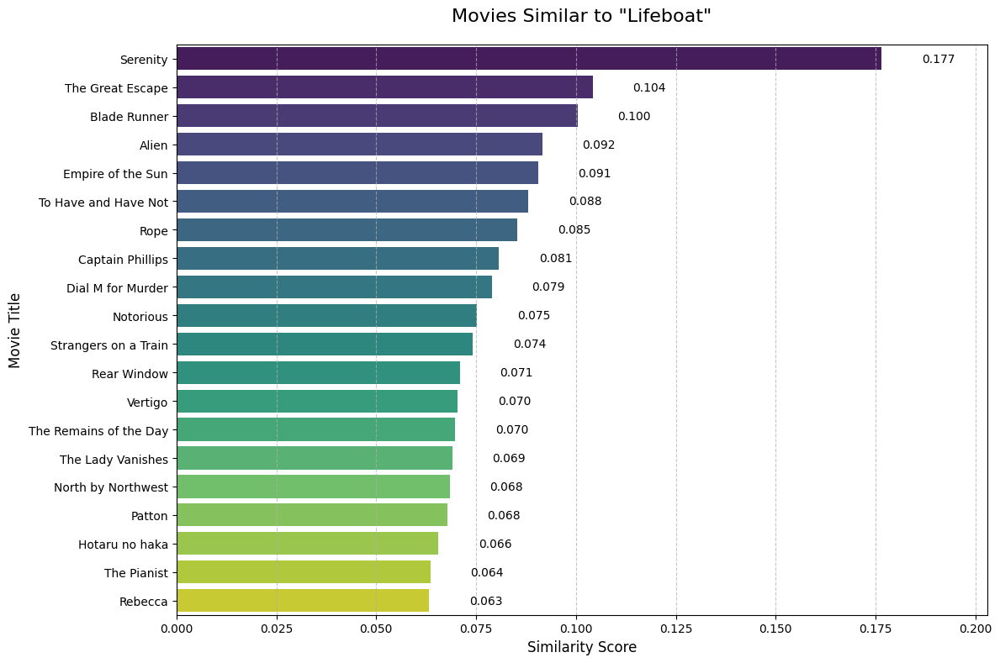

,Series_Title,Overview,Director,Star1,Star2,Star3,Similarity_Score
634,Serenity,The crew of the ship Serenity try to evade an ...,Joss Whedon,Nathan Fillion,Gina Torres,Chiwetel Ejiofor,0.176501
179,The Great Escape,Allied prisoners of war plan for several hundr...,John Sturges,Steve McQueen,James Garner,Richard Attenborough,0.104211
275,Blade Runner,A blade runner must pursue and terminate four ...,Ridley Scott,Harrison Ford,Rutger Hauer,Sean Young,0.100431
75,Alien,After a space merchant vessel receives an unkn...,Ridley Scott,Sigourney Weaver,Tom Skerritt,John Hurt,0.091605
832,Empire of the Sun,A young English boy struggles to survive under...,Steven Spielberg,Christian Bale,John Malkovich,Miranda Richardson,0.090500
711,To Have and Have Not,"During World War II, American expatriate Harry...",Howard Hawks,Humphrey Bogart,Lauren Bacall,Walter Brennan,0.088126
450,Rope,Two men attempt to prove they committed the pe...,Alfred Hitchcock,James Stewart,John Dall,Farley Granger,0.085400
604,Captain Phillips,The true story of Captain Richard Phillips and...,Paul Greengrass,Tom Hanks,Barkhad Abdi,Barkhad Abdirahman,0.080705
187,Dial M for Murder,A former tennis player tries to arrange his wi...,Alfred Hitchcock,Ray Milland,Grace Kelly,Robert Cummings,0.078895
559,Notorious,A woman is asked to spy on a group of Nazi fri...,Alfred Hitchcock,Cary Grant,Ingrid Bergman,Claude Rains,0.075260


In [ ]:

run_movie_recommender(df, "Lifeboat", 20)

In [ ]:
# Example usage
input_movie_name = "Lifeboat"
recommended_movies_df = recommend_movies(input_movie_name, df, siamese_network, tokenizer, model)
print(recommended_movies_df)

                      Series_Title  Cosine Similarity
0                         Lifeboat           1.000000
1                      Mandariinid           0.982220
2            Au revoir les enfants           0.970431
3                  Ivanovo detstvo           0.968666
4                          Platoon           0.965414
5              Saving Private Ryan           0.964722
6                Full Metal Jacket           0.963843
7                  The Deer Hunter           0.954801
8               La Grande Illusion           0.947257
9           La battaglia di Algeri           0.945159
10           Judgment at Nuremberg           0.944726
11                  Paths of Glory           0.943624
12             Beasts of No Nation           0.939292
13  All Quiet on the Western Front           0.923427
14               The Thin Red Line           0.917800


In [ ]:
def get_optimal_recommendation(input_movie_name, df, siamese_network, tokenizer, model):
    """
    Compare recommendations from both approaches and return the first common movie
    or the top Siamese recommendation if there's no match.

    Parameters:
    input_movie_name (str): Movie title to get recommendations for
    df (pandas.DataFrame): DataFrame containing movie data
    siamese_network: The trained Siamese neural network
    tokenizer: BERT tokenizer for text processing
    model: BERT model for embeddings

    Returns:
    dict: Recommended movie information
    """
    # Get Siamese network recommendations
    siamese_recommendations = recommend_movies(input_movie_name, df, siamese_network, tokenizer, model)

    # Get content-based recommendations without visualization
    # Prepare features and calculate similarity
    similarity_matrix, indices = prepare_movie_features(df)
    content_based_recommendations = get_recommendations(input_movie_name, similarity_matrix, indices, df, top_n=20)

    # Extract movie titles from both recommendation sets
    siamese_titles = siamese_recommendations['Series_Title'].tolist()

    if isinstance(content_based_recommendations, pd.DataFrame):
        content_based_titles = content_based_recommendations['Series_Title'].tolist()
    else:
        # Handle the case where content-based returns an error message
        content_based_titles = []

    # Find common movies (excluding the input movie itself)
    common_movies = []
    for title in siamese_titles:
        if title in content_based_titles and title != input_movie_name:
            common_movies.append(title)

    # If there are common movies, return the first one
    if common_movies:
        # Get the similarity score from Siamese recommendations
        similarity = siamese_recommendations[siamese_recommendations['Series_Title'] == common_movies[0]]['Cosine Similarity'].values[0]
        return {
            "title": common_movies[0],
            "similarity_score": similarity,
            "source": "Both approaches"
        }

    # If no common movie exists, return the top Siamese recommendation (excluding the input movie)
    for title, similarity in zip(siamese_titles, siamese_recommendations['Cosine Similarity']):
        if title != input_movie_name:
            return {
                "title": title,
                "similarity_score": similarity,
                "source": "Siamese network"
            }

    # Fallback if nothing suitable found
    return None

# Example usage
if __name__ == "__main__":
    # Assume df, siamese_network, tokenizer, and model are already loaded
    movie_query = "Lifeboat"

    recommendation = get_optimal_recommendation(movie_query, df, siamese_network, tokenizer, model)

    if recommendation:
        print(f"\nOptimal recommendation for '{movie_query}':")
        print(f"Recommended movie: {recommendation['title']}")
        print(f"Similarity score: {recommendation['similarity_score']:.4f}")
        print(f"Source: {recommendation['source']}")
    else:
        print(f"\nNo recommendations available for '{movie_query}'.")

NameError: name 'recommend_movies' is not defined

یوسف امینی

The raid : Redemption

In [ ]:
# Example usage
input_movie_name = "The Game"
recommended_movies_df = recommend_movies(input_movie_name, df, siamese_network, tokenizer, model)
print(recommended_movies_df)

        Series_Title  Cosine Similarity
0           The Game           1.000000
1           Watchmen           0.963977
2            Seppuku           0.908444
3  Blade Runner 2049           0.872963
4           Oldeuboi           0.759136


Top 20 movies similar to 'The Game':
                       Series_Title  Similarity_Score
                      The Hurricane          0.152955
                     Jeux d'enfants          0.114381
                      Casino Royale          0.104294
                          Gone Girl          0.101433
                       Mystic River          0.093852
                 Enemy at the Gates          0.086027
  Lagaan: Once Upon a Time in India          0.081741
                     Wreck-It Ralph          0.080896
                                Saw          0.076086
                      Carlito's Way          0.075859
                           21 Grams          0.073902
                  The Thin Red Line          0.072470
                           I Am Sam          0.068507
The Curious Case of Benjamin Button          0.067706
                    The Truman Show          0.066350
                     The Green Mile          0.066262
 Close Encounters of the Third Kind          

<ipython-input-13-6f28ab141b3a>:128: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  ax = sns.barplot(


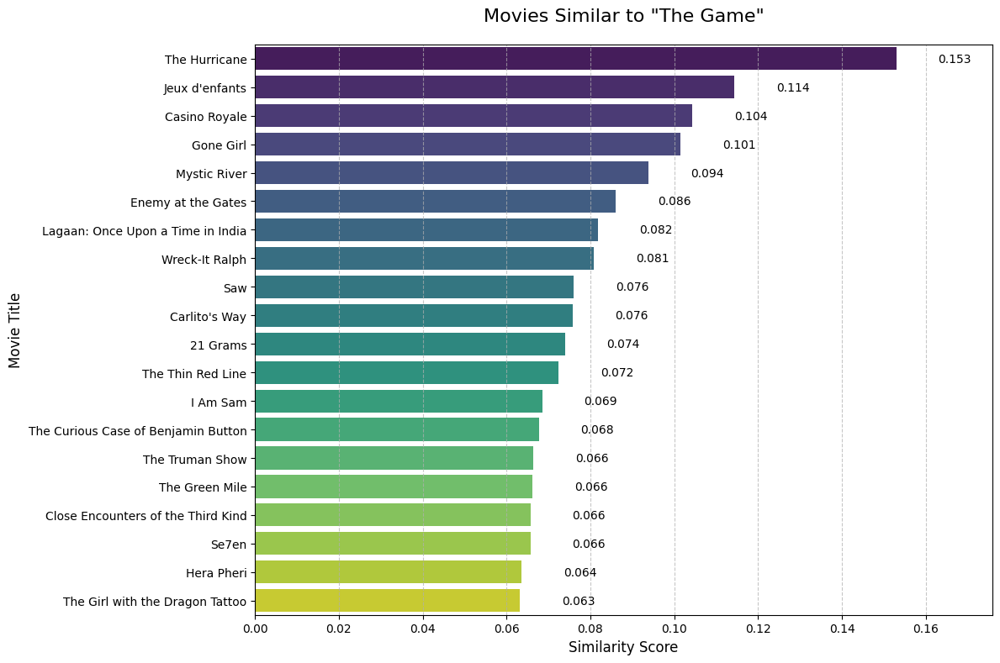

,Series_Title,Overview,Director,Star1,Star2,Star3,Similarity_Score
952,The Hurricane,"The story of Rubin 'Hurricane' Carter, a boxer...",Norman Jewison,Denzel Washington,Vicellous Shannon,Deborah Kara Unger,0.152955
935,Jeux d'enfants,"As adults, best friends Julien and Sophie cont...",Yann Samuell,Guillaume Canet,Marion Cotillard,Thibault Verhaeghe,0.114381
368,Casino Royale,"After earning 00 status and a licence to kill,...",Martin Campbell,Daniel Craig,Eva Green,Judi Dench,0.104294
210,Gone Girl,With his wife's disappearance having become th...,David Fincher,Ben Affleck,Rosamund Pike,Neil Patrick Harris,0.101433
505,Mystic River,The lives of three men who were childhood frie...,Clint Eastwood,Sean Penn,Tim Robbins,Kevin Bacon,0.093852
950,Enemy at the Gates,A Russian and a German sniper play a game of c...,Jean-Jacques Annaud,Jude Law,Ed Harris,Joseph Fiennes,0.086027
247,Lagaan: Once Upon a Time in India,The people of a small village in Victorian Ind...,Ashutosh Gowariker,Aamir Khan,Raghuvir Yadav,Gracy Singh,0.081741
740,Wreck-It Ralph,A video game villain wants to be a hero and se...,Rich Moore,John C. Reilly,Jack McBrayer,Jane Lynch,0.080896
932,Saw,Two strangers awaken in a room with no recolle...,James Wan,Cary Elwes,Leigh Whannell,Danny Glover,0.076086
523,Carlito's Way,"A Puerto Rican former convict, just released f...",Brian De Palma,Al Pacino,Sean Penn,Penelope Ann Miller,0.075859


In [ ]:

run_movie_recommender(df, "The Game", 20)

In [ ]:
def get_optimal_recommendation(input_movie_name, df, siamese_network, tokenizer, model):
    """
    Compare recommendations from both approaches and return the first common movie
    or the top Siamese recommendation if there's no match.

    Parameters:
    input_movie_name (str): Movie title to get recommendations for
    df (pandas.DataFrame): DataFrame containing movie data
    siamese_network: The trained Siamese neural network
    tokenizer: BERT tokenizer for text processing
    model: BERT model for embeddings

    Returns:
    dict: Recommended movie information
    """
    # Get Siamese network recommendations
    siamese_recommendations = recommend_movies(input_movie_name, df, siamese_network, tokenizer, model)

    # Get content-based recommendations without visualization
    # Prepare features and calculate similarity
    similarity_matrix, indices = prepare_movie_features(df)
    content_based_recommendations = get_recommendations(input_movie_name, similarity_matrix, indices, df, top_n=20)

    # Extract movie titles from both recommendation sets
    siamese_titles = siamese_recommendations['Series_Title'].tolist()

    if isinstance(content_based_recommendations, pd.DataFrame):
        content_based_titles = content_based_recommendations['Series_Title'].tolist()
    else:
        # Handle the case where content-based returns an error message
        content_based_titles = []

    # Find common movies (excluding the input movie itself)
    common_movies = []
    for title in siamese_titles:
        if title in content_based_titles and title != input_movie_name:
            common_movies.append(title)

    # If there are common movies, return the first one
    if common_movies:
        # Get the similarity score from Siamese recommendations
        similarity = siamese_recommendations[siamese_recommendations['Series_Title'] == common_movies[0]]['Cosine Similarity'].values[0]
        return {
            "title": common_movies[0],
            "similarity_score": similarity,
            "source": "Both approaches"
        }

    # If no common movie exists, return the top Siamese recommendation (excluding the input movie)
    for title, similarity in zip(siamese_titles, siamese_recommendations['Cosine Similarity']):
        if title != input_movie_name:
            return {
                "title": title,
                "similarity_score": similarity,
                "source": "Siamese network"
            }

    # Fallback if nothing suitable found
    return None

# Example usage
if __name__ == "__main__":
    # Assume df, siamese_network, tokenizer, and model are already loaded
    movie_query = "The Game"

    recommendation = get_optimal_recommendation(movie_query, df, siamese_network, tokenizer, model)

    if recommendation:
        print(f"\nOptimal recommendation for '{movie_query}':")
        print(f"Recommended movie: {recommendation['title']}")
        print(f"Similarity score: {recommendation['similarity_score']:.4f}")
        print(f"Source: {recommendation['source']}")
    else:
        print(f"\nNo recommendations available for '{movie_query}'.")


Optimal recommendation for 'The Game':
Recommended movie: Watchmen
Similarity score: 0.9640
Source: Siamese network


In [ ]:
# Example usage
input_movie_name = "The Fifth Element"
recommended_movies_df = recommend_movies(input_movie_name, df, siamese_network, tokenizer, model)
print(recommended_movies_df)

                                  Series_Title  Cosine Similarity
0                            The Fifth Element           1.000000
1                               X: First Class           0.982029
2                                    Inception           0.976391
3                           Mad Max: Fury Road           0.974820
4                                Jurassic Park           0.970599
5                   X-Men: Days of Future Past           0.963123
6                                    Star Trek           0.963057
7                                     Iron Man           0.957255
8              Star Trek II: The Wrath of Khan           0.951978
9   Star Wars: Episode VII - The Force Awakens           0.944900
10                                    Predator           0.942876
11                                   Mad Max 2           0.938912
12                     Star Trek Into Darkness           0.931349
13                                      Aliens           0.928386
14        

Top 20 movies similar to 'The Fifth Element':
                        Series_Title  Similarity_Score
                                Léon          0.153542
                    Moonrise Kingdom          0.109757
                      Twelve Monkeys          0.104066
                     The Sixth Sense          0.084575
                                 JFK          0.080216
                            Die Hard          0.074877
          Die Hard: With a Vengeance          0.071839
                   Pride & Prejudice          0.066597
              Tenkû no shiro Rapyuta          0.065348
      Dawn of the Planet of the Apes          0.064898
                           Star Trek          0.064247
 Interstate 60: Episodes of the Road          0.062794
                            Predator          0.059434
                     Minority Report          0.056352
                           Toy Story          0.052103
                  The Blues Brothers          0.049414
Vivre sa vie: Film 

<ipython-input-13-6f28ab141b3a>:128: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  ax = sns.barplot(


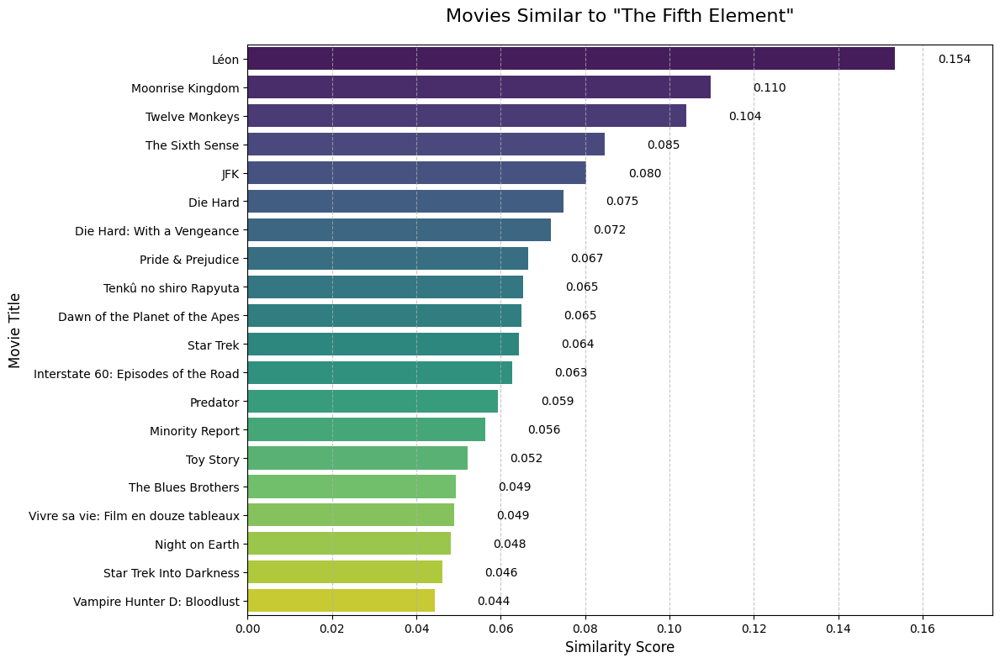

,Series_Title,Overview,Director,Star1,Star2,Star3,Similarity_Score
42,Léon,"Mathilda, a 12-year-old girl, is reluctantly t...",Luc Besson,Jean Reno,Gary Oldman,Natalie Portman,0.153542
598,Moonrise Kingdom,A pair of young lovers flee their New England ...,Wes Anderson,Jared Gilman,Kara Hayward,Bruce Willis,0.109757
393,Twelve Monkeys,"In a future world devastated by disease, a con...",Terry Gilliam,Bruce Willis,Madeleine Stowe,Brad Pitt,0.104066
248,The Sixth Sense,A boy who communicates with spirits seeks the ...,M. Night Shyamalan,Bruce Willis,Haley Joel Osment,Toni Collette,0.084575
400,JFK,New Orleans District Attorney Jim Garrison dis...,Oliver Stone,Kevin Costner,Gary Oldman,Jack Lemmon,0.080216
171,Die Hard,An NYPD officer tries to save his wife and sev...,John McTiernan,Bruce Willis,Alan Rickman,Bonnie Bedelia,0.074877
963,Die Hard: With a Vengeance,John McClane and a Harlem store owner are targ...,John McTiernan,Bruce Willis,Jeremy Irons,Samuel L. Jackson,0.071839
631,Pride & Prejudice,Sparks fly when spirited Elizabeth Bennet meet...,Joe Wright,Keira Knightley,Matthew Macfadyen,Brenda Blethyn,0.066597
409,Tenkû no shiro Rapyuta,A young boy and a girl with a magic crystal mu...,Hayao Miyazaki,Mayumi Tanaka,Keiko Yokozawa,Kotoe Hatsui,0.065348
898,Dawn of the Planet of the Apes,A growing nation of genetically evolved apes l...,Matt Reeves,Gary Oldman,Keri Russell,Andy Serkis,0.064898


In [ ]:

run_movie_recommender(df, "The Fifth Element", 20)

In [ ]:
def get_optimal_recommendation(input_movie_name, df, siamese_network, tokenizer, model):
    """
    Compare recommendations from both approaches and return the first common movie
    or the top Siamese recommendation if there's no match.

    Parameters:
    input_movie_name (str): Movie title to get recommendations for
    df (pandas.DataFrame): DataFrame containing movie data
    siamese_network: The trained Siamese neural network
    tokenizer: BERT tokenizer for text processing
    model: BERT model for embeddings

    Returns:
    dict: Recommended movie information
    """
    # Get Siamese network recommendations
    siamese_recommendations = recommend_movies(input_movie_name, df, siamese_network, tokenizer, model)

    # Get content-based recommendations without visualization
    # Prepare features and calculate similarity
    similarity_matrix, indices = prepare_movie_features(df)
    content_based_recommendations = get_recommendations(input_movie_name, similarity_matrix, indices, df, top_n=20)

    # Extract movie titles from both recommendation sets
    siamese_titles = siamese_recommendations['Series_Title'].tolist()

    if isinstance(content_based_recommendations, pd.DataFrame):
        content_based_titles = content_based_recommendations['Series_Title'].tolist()
    else:
        # Handle the case where content-based returns an error message
        content_based_titles = []

    # Find common movies (excluding the input movie itself)
    common_movies = []
    for title in siamese_titles:
        if title in content_based_titles and title != input_movie_name:
            common_movies.append(title)

    # If there are common movies, return the first one
    if common_movies:
        # Get the similarity score from Siamese recommendations
        similarity = siamese_recommendations[siamese_recommendations['Series_Title'] == common_movies[0]]['Cosine Similarity'].values[0]
        return {
            "title": common_movies[0],
            "similarity_score": similarity,
            "source": "Both approaches"
        }

    # If no common movie exists, return the top Siamese recommendation (excluding the input movie)
    for title, similarity in zip(siamese_titles, siamese_recommendations['Cosine Similarity']):
        if title != input_movie_name:
            return {
                "title": title,
                "similarity_score": similarity,
                "source": "Siamese network"
            }

    # Fallback if nothing suitable found
    return None

# Example usage
if __name__ == "__main__":
    # Assume df, siamese_network, tokenizer, and model are already loaded
    movie_query = "The Fifth Element"

    recommendation = get_optimal_recommendation(movie_query, df, siamese_network, tokenizer, model)

    if recommendation:
        print(f"\nOptimal recommendation for '{movie_query}':")
        print(f"Recommended movie: {recommendation['title']}")
        print(f"Similarity score: {recommendation['similarity_score']:.4f}")
        print(f"Source: {recommendation['source']}")
    else:
        print(f"\nNo recommendations available for '{movie_query}'.")


Optimal recommendation for 'The Fifth Element':
Recommended movie: Star Trek
Similarity score: 0.9631
Source: Both approaches


Noora Hoseini

In [ ]:
# Example usage
input_movie_name = "Primal Fear"
recommended_movies_df = recommend_movies(input_movie_name, df, siamese_network, tokenizer, model)
print(recommended_movies_df)

                       Series_Title  Cosine Similarity
0                       Primal Fear           1.000000
1               Anatomy of a Murder           0.992527
2                         Prisoners           0.980238
3             Män som hatar kvinnor           0.975905
4                        Inside Man           0.968982
5   The Girl with the Dragon Tattoo           0.968019
6                 Der Name der Rose           0.967579
7                        Wind River           0.965760
8                    Gone Baby Gone           0.963338
9               Glengarry Glen Ross           0.962372
10              La migliore offerta           0.959894
11      Witness for the Prosecution           0.959075
12         In the Heat of the Night           0.958139
13                             Rope           0.951183
14                   Salinui chueok           0.950999
15                            Se7en           0.946624
16                L.A. Confidential           0.945801
17        

Top 20 movies similar to 'Primal Fear':
                                   Series_Title  Similarity_Score
                                The Truman Show          0.135280
                             American History X          0.123249
                                   Isle of Dogs          0.116346
                                   The Fugitive          0.112536
          Harry Potter and the Sorcerer's Stone          0.102135
                            Hachi: A Dog's Tale          0.099257
                                     Fight Club          0.087242
                                The Illusionist          0.086264
                                 Days of Heaven          0.084178
Birdman or (The Unexpected Virtue of Ignorance)          0.082758
                                      25th Hour          0.074134
                                      Cape Fear          0.072902
                                    Adams æbler          0.064891
                                  Ro

<ipython-input-13-6f28ab141b3a>:128: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  ax = sns.barplot(


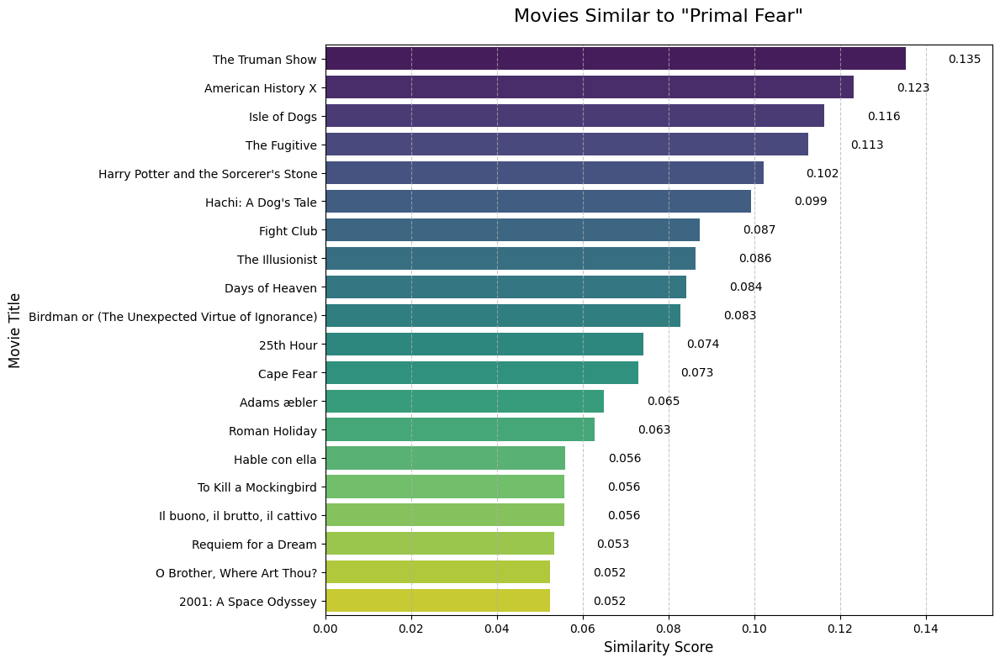

,Series_Title,Overview,Director,Star1,Star2,Star3,Similarity_Score
250,The Truman Show,An insurance salesman discovers his whole life...,Peter Weir,Jim Carrey,Ed Harris,Laura Linney,0.135280
40,American History X,A former neo-nazi skinhead tries to prevent hi...,Tony Kaye,Edward Norton,Edward Furlong,Beverly D'Angelo,0.123249
469,Isle of Dogs,"Set in Japan, Isle of Dogs follows a boy's ody...",Wes Anderson,Bryan Cranston,Koyu Rankin,Edward Norton,0.116346
663,The Fugitive,"Dr. Richard Kimble, unjustly accused of murder...",Andrew Davis,Harrison Ford,Tommy Lee Jones,Sela Ward,0.112536
947,Harry Potter and the Sorcerer's Stone,An orphaned boy enrolls in a school of wizardr...,Chris Columbus,Daniel Radcliffe,Rupert Grint,Richard Harris,0.102135
228,Hachi: A Dog's Tale,A college professor bonds with an abandoned do...,Lasse Hallström,Richard Gere,Joan Allen,Cary-Hiroyuki Tagawa,0.099257
9,Fight Club,An insomniac office worker and a devil-may-car...,David Fincher,Brad Pitt,Edward Norton,Meat Loaf,0.087242
925,The Illusionist,"In turn-of-the-century Vienna, a magician uses...",Neil Burger,Edward Norton,Jessica Biel,Paul Giamatti,0.086264
690,Days of Heaven,A hot-tempered farm laborer convinces the woma...,Terrence Malick,Richard Gere,Brooke Adams,Sam Shepard,0.084178
733,Birdman or (The Unexpected Virtue of Ignorance),A washed-up superhero actor attempts to revive...,Alejandro G. Iñárritu,Michael Keaton,Zach Galifianakis,Edward Norton,0.082758


In [ ]:

run_movie_recommender(df, "Primal Fear", 20)

In [ ]:
def get_optimal_recommendation(input_movie_name, df, siamese_network, tokenizer, model):
    """
    Compare recommendations from both approaches and return the first common movie
    or the top Siamese recommendation if there's no match.

    Parameters:
    input_movie_name (str): Movie title to get recommendations for
    df (pandas.DataFrame): DataFrame containing movie data
    siamese_network: The trained Siamese neural network
    tokenizer: BERT tokenizer for text processing
    model: BERT model for embeddings

    Returns:
    dict: Recommended movie information
    """
    # Get Siamese network recommendations
    siamese_recommendations = recommend_movies(input_movie_name, df, siamese_network, tokenizer, model)

    # Get content-based recommendations without visualization
    # Prepare features and calculate similarity
    similarity_matrix, indices = prepare_movie_features(df)
    content_based_recommendations = get_recommendations(input_movie_name, similarity_matrix, indices, df, top_n=20)

    # Extract movie titles from both recommendation sets
    siamese_titles = siamese_recommendations['Series_Title'].tolist()

    if isinstance(content_based_recommendations, pd.DataFrame):
        content_based_titles = content_based_recommendations['Series_Title'].tolist()
    else:
        # Handle the case where content-based returns an error message
        content_based_titles = []

    # Find common movies (excluding the input movie itself)
    common_movies = []
    for title in siamese_titles:
        if title in content_based_titles and title != input_movie_name:
            common_movies.append(title)

    # If there are common movies, return the first one
    if common_movies:
        # Get the similarity score from Siamese recommendations
        similarity = siamese_recommendations[siamese_recommendations['Series_Title'] == common_movies[0]]['Cosine Similarity'].values[0]
        return {
            "title": common_movies[0],
            "similarity_score": similarity,
            "source": "Both approaches"
        }

    # If no common movie exists, return the top Siamese recommendation (excluding the input movie)
    for title, similarity in zip(siamese_titles, siamese_recommendations['Cosine Similarity']):
        if title != input_movie_name:
            return {
                "title": title,
                "similarity_score": similarity,
                "source": "Siamese network"
            }

    # Fallback if nothing suitable found
    return None

# Example usage
if __name__ == "__main__":
    # Assume df, siamese_network, tokenizer, and model are already loaded
    movie_query = "Primal Fear"

    recommendation = get_optimal_recommendation(movie_query, df, siamese_network, tokenizer, model)

    if recommendation:
        print(f"\nOptimal recommendation for '{movie_query}':")
        print(f"Recommended movie: {recommendation['title']}")
        print(f"Similarity score: {recommendation['similarity_score']:.4f}")
        print(f"Source: {recommendation['source']}")
    else:
        print(f"\nNo recommendations available for '{movie_query}'.")


Optimal recommendation for 'Primal Fear':
Recommended movie: Anatomy of a Murder
Similarity score: 0.9925
Source: Siamese network


In [ ]:
# Example usage
input_movie_name = "Papillon"
recommended_movies_df = recommend_movies(input_movie_name, df, siamese_network, tokenizer, model)
print(recommended_movies_df)

                          Series_Title  Cosine Similarity
0                             Papillon           1.000000
1                         The Irishman           0.985155
2   Butch Cassidy and the Sundance Kid           0.975610
3                        Donnie Brasco           0.972161
4                  Catch Me If You Can           0.971398
5                              Serpico           0.965894
6                           Changeling           0.964657
7                    American Gangster           0.953235
8              The Wolf of Wall Street           0.948070
9            In the Name of the Father           0.945954
10                   Dog Day Afternoon           0.942223
11                          Goodfellas           0.941049
12                    Midnight Express           0.937170
13                          Just Mercy           0.887961
14                                Blow           0.882805
15                           Spotlight           0.858856


Top 20 movies similar to 'Papillon':
                       Series_Title  Similarity_Score
                   The Great Escape          0.145070
                             Patton          0.125321
                   12 Years a Slave          0.110605
                         Capharnaüm          0.102292
                       The Graduate          0.098152
              The Magnificent Seven          0.098028
                 Planet of the Apes          0.097916
                    Midnight Cowboy          0.085003
            All the President's Men          0.077500
                      Despicable Me          0.076502
                 Gone with the Wind          0.076389
                           Rain Man          0.074250
                        Un prophète          0.073455
                         White Heat          0.071093
Captain America: The Winter Soldier          0.068978
                     Cool Hand Luke          0.068803
               Escape from Alcatraz          

<ipython-input-13-6f28ab141b3a>:128: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  ax = sns.barplot(


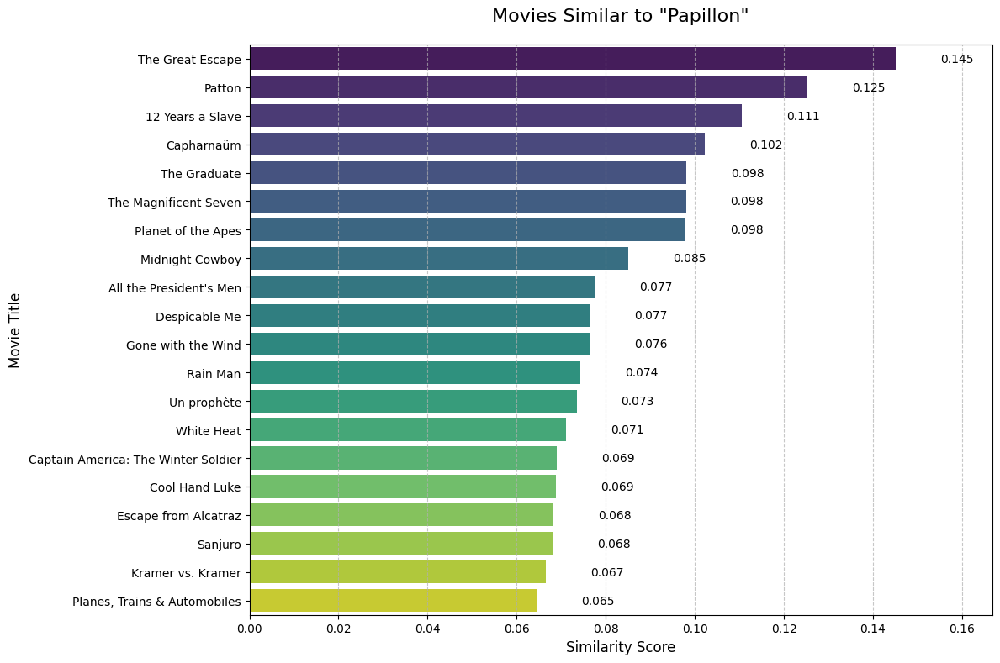

,Series_Title,Overview,Director,Star1,Star2,Star3,Similarity_Score
179,The Great Escape,Allied prisoners of war plan for several hundr...,John Sturges,Steve McQueen,James Garner,Richard Attenborough,0.145070
542,Patton,The World War II phase of the career of contro...,Franklin J. Schaffner,George C. Scott,Karl Malden,Stephen Young,0.125321
215,12 Years a Slave,"In the antebellum United States, Solomon North...",Steve McQueen,Chiwetel Ejiofor,Michael Kenneth Williams,Michael Fassbender,0.110605
53,Capharnaüm,While serving a five-year sentence for a viole...,Nadine Labaki,Zain Al Rafeea,Yordanos Shiferaw,Boluwatife Treasure Bankole,0.102292
427,The Graduate,A disillusioned college graduate finds himself...,Mike Nichols,Dustin Hoffman,Anne Bancroft,Katharine Ross,0.098152
865,The Magnificent Seven,Seven gunfighters are hired by Mexican peasant...,John Sturges,Yul Brynner,Steve McQueen,Charles Bronson,0.098028
426,Planet of the Apes,An astronaut crew crash-lands on a planet in t...,Franklin J. Schaffner,Charlton Heston,Roddy McDowall,Kim Hunter,0.097916
699,Midnight Cowboy,A naive hustler travels from Texas to New York...,John Schlesinger,Dustin Hoffman,Jon Voight,Sylvia Miles,0.085003
536,All the President's Men,"""The Washington Post"" reporters Bob Woodward a...",Alan J. Pakula,Dustin Hoffman,Robert Redford,Jack Warden,0.077500
906,Despicable Me,When a criminal mastermind uses a trio of orph...,Pierre Coffin,Chris Renaud,Steve Carell,Jason Segel,0.076502


In [ ]:

run_movie_recommender(df, "Papillon", 20)

In [ ]:
def get_optimal_recommendation(input_movie_name, df, siamese_network, tokenizer, model):
    """
    Compare recommendations from both approaches and return the first common movie
    or the top Siamese recommendation if there's no match.

    Parameters:
    input_movie_name (str): Movie title to get recommendations for
    df (pandas.DataFrame): DataFrame containing movie data
    siamese_network: The trained Siamese neural network
    tokenizer: BERT tokenizer for text processing
    model: BERT model for embeddings

    Returns:
    dict: Recommended movie information
    """
    # Get Siamese network recommendations
    siamese_recommendations = recommend_movies(input_movie_name, df, siamese_network, tokenizer, model)

    # Get content-based recommendations without visualization
    # Prepare features and calculate similarity
    similarity_matrix, indices = prepare_movie_features(df)
    content_based_recommendations = get_recommendations(input_movie_name, similarity_matrix, indices, df, top_n=20)

    # Extract movie titles from both recommendation sets
    siamese_titles = siamese_recommendations['Series_Title'].tolist()

    if isinstance(content_based_recommendations, pd.DataFrame):
        content_based_titles = content_based_recommendations['Series_Title'].tolist()
    else:
        # Handle the case where content-based returns an error message
        content_based_titles = []

    # Find common movies (excluding the input movie itself)
    common_movies = []
    for title in siamese_titles:
        if title in content_based_titles and title != input_movie_name:
            common_movies.append(title)

    # If there are common movies, return the first one
    if common_movies:
        # Get the similarity score from Siamese recommendations
        similarity = siamese_recommendations[siamese_recommendations['Series_Title'] == common_movies[0]]['Cosine Similarity'].values[0]
        return {
            "title": common_movies[0],
            "similarity_score": similarity,
            "source": "Both approaches"
        }

    # If no common movie exists, return the top Siamese recommendation (excluding the input movie)
    for title, similarity in zip(siamese_titles, siamese_recommendations['Cosine Similarity']):
        if title != input_movie_name:
            return {
                "title": title,
                "similarity_score": similarity,
                "source": "Siamese network"
            }

    # Fallback if nothing suitable found
    return None

# Example usage
if __name__ == "__main__":
    # Assume df, siamese_network, tokenizer, and model are already loaded
    movie_query = "Papillon"

    recommendation = get_optimal_recommendation(movie_query, df, siamese_network, tokenizer, model)

    if recommendation:
        print(f"\nOptimal recommendation for '{movie_query}':")
        print(f"Recommended movie: {recommendation['title']}")
        print(f"Similarity score: {recommendation['similarity_score']:.4f}")
        print(f"Source: {recommendation['source']}")
    else:
        print(f"\nNo recommendations available for '{movie_query}'.")


Optimal recommendation for 'Papillon':
Recommended movie: The Irishman
Similarity score: 0.9852
Source: Siamese network


Mehrsa Amin

In [ ]:
# Example usage
input_movie_name = "Watchmen"
recommended_movies_df = recommend_movies(input_movie_name, df, siamese_network, tokenizer, model)
print(recommended_movies_df)

        Series_Title  Cosine Similarity
0           Watchmen           1.000000
1           The Game           0.963977
2            Seppuku           0.939270
3  Blade Runner 2049           0.920094
4           Oldeuboi           0.856207


Top 20 movies similar to 'Watchmen':
                       Series_Title  Similarity_Score
         X-Men: Days of Future Past          0.098610
                                300          0.096108
                          Andhadhun          0.075592
                              Giant          0.056300
                    The Incredibles          0.055838
                    The Sixth Sense          0.054799
       Batman: Mask of the Phantasm          0.051062
                            The Kid          0.048402
           The Peanut Butter Falcon          0.048014
                        The Hustler          0.046950
                        Blue Velvet          0.043787
Interstate 60: Episodes of the Road          0.042228
         Back to the Future Part II          0.041480
    Who's Afraid of Virginia Woolf?          0.040929
                  Midnight in Paris          0.039548
                 Dallas Buyers Club          0.039280
                               Moon          

<ipython-input-13-6f28ab141b3a>:128: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  ax = sns.barplot(


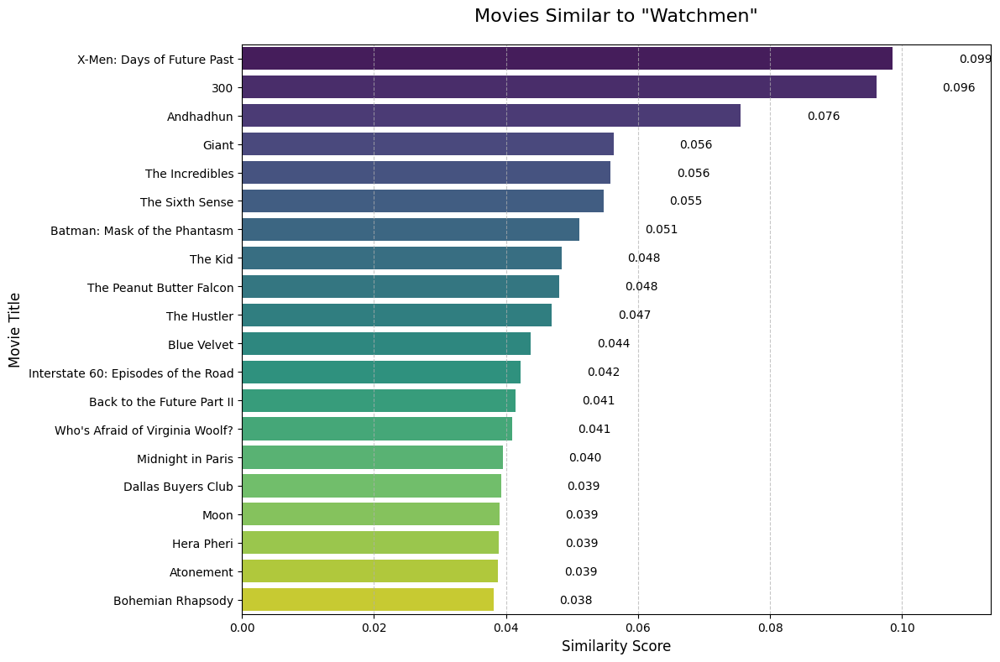

,Series_Title,Overview,Director,Star1,Star2,Star3,Similarity_Score
479,X-Men: Days of Future Past,The X-Men send Wolverine to the past in a desp...,Bryan Singer,Patrick Stewart,Ian McKellen,Hugh Jackman,0.098610
928,300,King Leonidas of Sparta and a force of 300 men...,Zack Snyder,Gerard Butler,Lena Headey,David Wenham,0.096108
86,Andhadhun,A series of mysterious events change the life ...,Sriram Raghavan,Ayushmann Khurrana,Tabu,Radhika Apte,0.075592
996,Giant,Sprawling epic covering the life of a Texas ca...,George Stevens,Elizabeth Taylor,Rock Hudson,James Dean,0.056300
378,The Incredibles,"A family of undercover superheroes, while tryi...",Brad Bird,Craig T. Nelson,Samuel L. Jackson,Holly Hunter,0.055838
248,The Sixth Sense,A boy who communicates with spirits seeks the ...,M. Night Shyamalan,Bruce Willis,Haley Joel Osment,Toni Collette,0.054799
665,Batman: Mask of the Phantasm,Batman is wrongly implicated in a series of mu...,Kevin Altieri,Boyd Kirkland,Frank Paur,Dan Riba,0.051062
127,The Kid,"The Tramp cares for an abandoned child, but ev...",Charles Chaplin,Charles Chaplin,Edna Purviance,Jackie Coogan,0.048402
884,The Peanut Butter Falcon,Zak runs away from his care home to make his d...,Tyler Nilson,Michael Schwartz,Zack Gottsagen,Ann Owens,0.048014
434,The Hustler,An up-and-coming pool player plays a long-time...,Robert Rossen,Paul Newman,Jackie Gleason,Piper Laurie,0.046950


In [ ]:

run_movie_recommender(df, "Watchmen", 20)

In [ ]:
def get_optimal_recommendation(input_movie_name, df, siamese_network, tokenizer, model):
    """
    Compare recommendations from both approaches and return the first common movie
    or the top Siamese recommendation if there's no match.

    Parameters:
    input_movie_name (str): Movie title to get recommendations for
    df (pandas.DataFrame): DataFrame containing movie data
    siamese_network: The trained Siamese neural network
    tokenizer: BERT tokenizer for text processing
    model: BERT model for embeddings

    Returns:
    dict: Recommended movie information
    """
    # Get Siamese network recommendations
    siamese_recommendations = recommend_movies(input_movie_name, df, siamese_network, tokenizer, model)

    # Get content-based recommendations without visualization
    # Prepare features and calculate similarity
    similarity_matrix, indices = prepare_movie_features(df)
    content_based_recommendations = get_recommendations(input_movie_name, similarity_matrix, indices, df, top_n=20)

    # Extract movie titles from both recommendation sets
    siamese_titles = siamese_recommendations['Series_Title'].tolist()

    if isinstance(content_based_recommendations, pd.DataFrame):
        content_based_titles = content_based_recommendations['Series_Title'].tolist()
    else:
        # Handle the case where content-based returns an error message
        content_based_titles = []

    # Find common movies (excluding the input movie itself)
    common_movies = []
    for title in siamese_titles:
        if title in content_based_titles and title != input_movie_name:
            common_movies.append(title)

    # If there are common movies, return the first one
    if common_movies:
        # Get the similarity score from Siamese recommendations
        similarity = siamese_recommendations[siamese_recommendations['Series_Title'] == common_movies[0]]['Cosine Similarity'].values[0]
        return {
            "title": common_movies[0],
            "similarity_score": similarity,
            "source": "Both approaches"
        }

    # If no common movie exists, return the top Siamese recommendation (excluding the input movie)
    for title, similarity in zip(siamese_titles, siamese_recommendations['Cosine Similarity']):
        if title != input_movie_name:
            return {
                "title": title,
                "similarity_score": similarity,
                "source": "Siamese network"
            }

    # Fallback if nothing suitable found
    return None

# Example usage
if __name__ == "__main__":
    # Assume df, siamese_network, tokenizer, and model are already loaded
    movie_query = "Watchmen"

    recommendation = get_optimal_recommendation(movie_query, df, siamese_network, tokenizer, model)

    if recommendation:
        print(f"\nOptimal recommendation for '{movie_query}':")
        print(f"Recommended movie: {recommendation['title']}")
        print(f"Similarity score: {recommendation['similarity_score']:.4f}")
        print(f"Source: {recommendation['source']}")
    else:
        print(f"\nNo recommendations available for '{movie_query}'.")


Optimal recommendation for 'Watchmen':
Recommended movie: The Game
Similarity score: 0.9640
Source: Siamese network


Top 20 movies similar to 'The Martian':
        Series_Title  Similarity_Score
        Interstellar          0.144051
        Blade Runner          0.116454
           Gladiator          0.083089
           True Grit          0.083000
        The Departed          0.081945
 Gake no ue no Ponyo          0.080309
   Good Will Hunting          0.079752
    Dawn of the Dead          0.079482
 Saving Private Ryan          0.076122
The Bourne Supremacy          0.075872
The Bourne Ultimatum          0.074038
                Moon          0.071970
   American Gangster          0.071403
 The Bourne Identity          0.068524
     Black Hawk Down          0.068054
               Alien          0.067457
             Gravity          0.066542
        The Avengers          0.061743
        The Revenant          0.059697
      Ford v Ferrari          0.055845


<ipython-input-13-6f28ab141b3a>:128: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  ax = sns.barplot(


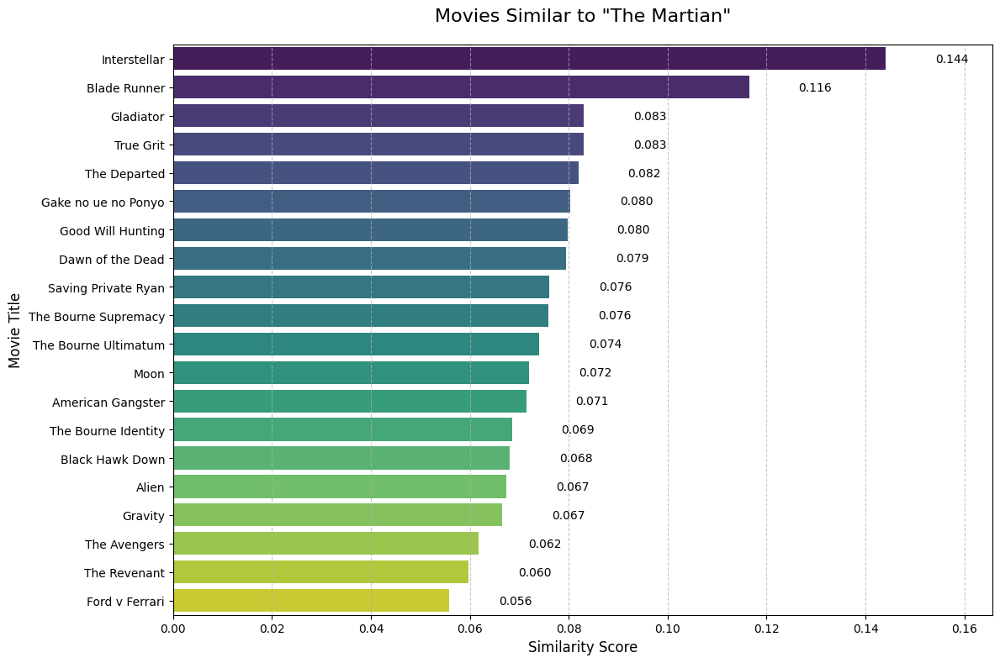

,Series_Title,Overview,Director,Star1,Star2,Star3,Similarity_Score
21,Interstellar,A team of explorers travel through a wormhole ...,Christopher Nolan,Matthew McConaughey,Anne Hathaway,Jessica Chastain,0.144051
275,Blade Runner,A blade runner must pursue and terminate four ...,Ridley Scott,Harrison Ford,Rutger Hauer,Sean Young,0.116454
39,Gladiator,A former Roman General sets out to exact venge...,Ridley Scott,Russell Crowe,Joaquin Phoenix,Connie Nielsen,0.083089
904,True Grit,A stubborn teenager enlists the help of a toug...,Ethan Coen,Joel Coen,Jeff Bridges,Matt Damon,0.083000
37,The Departed,An undercover cop and a mole in the police att...,Martin Scorsese,Leonardo DiCaprio,Matt Damon,Jack Nicholson,0.081945
756,Gake no ue no Ponyo,A five-year-old boy develops a relationship wi...,Hayao Miyazaki,Cate Blanchett,Matt Damon,Liam Neeson,0.080309
99,Good Will Hunting,"Will Hunting, a janitor at M.I.T., has a gift ...",Gus Van Sant,Robin Williams,Matt Damon,Ben Affleck,0.079752
535,Dawn of the Dead,Following an ever-growing epidemic of zombies ...,George A. Romero,David Emge,Ken Foree,Scott H. Reiniger,0.079482
24,Saving Private Ryan,"Following the Normandy Landings, a group of U....",Steven Spielberg,Tom Hanks,Matt Damon,Tom Sizemore,0.076122
777,The Bourne Supremacy,When Jason Bourne is framed for a CIA operatio...,Paul Greengrass,Matt Damon,Franka Potente,Joan Allen,0.075872


In [ ]:

run_movie_recommender(df, "The Martian", 20)

In [ ]:
# Example usage
input_movie_name = "The Martian"
recommended_movies_df = recommend_movies(input_movie_name, df, siamese_network, tokenizer, model)
print(recommended_movies_df)

      Series_Title  Cosine Similarity
0      The Martian           1.000000
1  Children of Men           0.925592
2     Interstellar           0.919989


In [ ]:
def get_optimal_recommendation(input_movie_name, df, siamese_network, tokenizer, model):
    """
    Compare recommendations from both approaches and return the first common movie
    or the top Siamese recommendation if there's no match.

    Parameters:
    input_movie_name (str): Movie title to get recommendations for
    df (pandas.DataFrame): DataFrame containing movie data
    siamese_network: The trained Siamese neural network
    tokenizer: BERT tokenizer for text processing
    model: BERT model for embeddings

    Returns:
    dict: Recommended movie information
    """
    # Get Siamese network recommendations
    siamese_recommendations = recommend_movies(input_movie_name, df, siamese_network, tokenizer, model)

    # Get content-based recommendations without visualization
    # Prepare features and calculate similarity
    similarity_matrix, indices = prepare_movie_features(df)
    content_based_recommendations = get_recommendations(input_movie_name, similarity_matrix, indices, df, top_n=20)

    # Extract movie titles from both recommendation sets
    siamese_titles = siamese_recommendations['Series_Title'].tolist()

    if isinstance(content_based_recommendations, pd.DataFrame):
        content_based_titles = content_based_recommendations['Series_Title'].tolist()
    else:
        # Handle the case where content-based returns an error message
        content_based_titles = []

    # Find common movies (excluding the input movie itself)
    common_movies = []
    for title in siamese_titles:
        if title in content_based_titles and title != input_movie_name:
            common_movies.append(title)

    # If there are common movies, return the first one
    if common_movies:
        # Get the similarity score from Siamese recommendations
        similarity = siamese_recommendations[siamese_recommendations['Series_Title'] == common_movies[0]]['Cosine Similarity'].values[0]
        return {
            "title": common_movies[0],
            "similarity_score": similarity,
            "source": "Both approaches"
        }

    # If no common movie exists, return the top Siamese recommendation (excluding the input movie)
    for title, similarity in zip(siamese_titles, siamese_recommendations['Cosine Similarity']):
        if title != input_movie_name:
            return {
                "title": title,
                "similarity_score": similarity,
                "source": "Siamese network"
            }

    # Fallback if nothing suitable found
    return None

# Example usage
if __name__ == "__main__":
    # Assume df, siamese_network, tokenizer, and model are already loaded
    movie_query = "The Martian"

    recommendation = get_optimal_recommendation(movie_query, df, siamese_network, tokenizer, model)

    if recommendation:
        print(f"\nOptimal recommendation for '{movie_query}':")
        print(f"Recommended movie: {recommendation['title']}")
        print(f"Similarity score: {recommendation['similarity_score']:.4f}")
        print(f"Source: {recommendation['source']}")
    else:
        print(f"\nNo recommendations available for '{movie_query}'.")


Optimal recommendation for 'The Martian':
Recommended movie: Interstellar
Similarity score: 0.9200
Source: Both approaches


Dr Noorbehbahani

Top 20 movies similar to 'Chinatown':
                    Series_Title  Similarity_Score
                    Le locataire          0.201096
                   The Big Sleep          0.180627
              The Maltese Falcon          0.155078
                 Rosemary's Baby          0.124814
                         Network          0.117726
The Treasure of the Sierra Madre          0.113603
                       Repulsion          0.112434
                  A Few Good Men          0.110695
                Bonnie and Clyde          0.104785
                     The Pianist          0.101171
                        Sin City          0.095470
                       Key Largo          0.091237
                         Serpico          0.088819
                    The Departed          0.087538
                           Laura          0.078919
                         Ben-Hur          0.077119
            Strangers on a Train          0.076915
                 Out of the Past          0.

<ipython-input-13-6f28ab141b3a>:128: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  ax = sns.barplot(


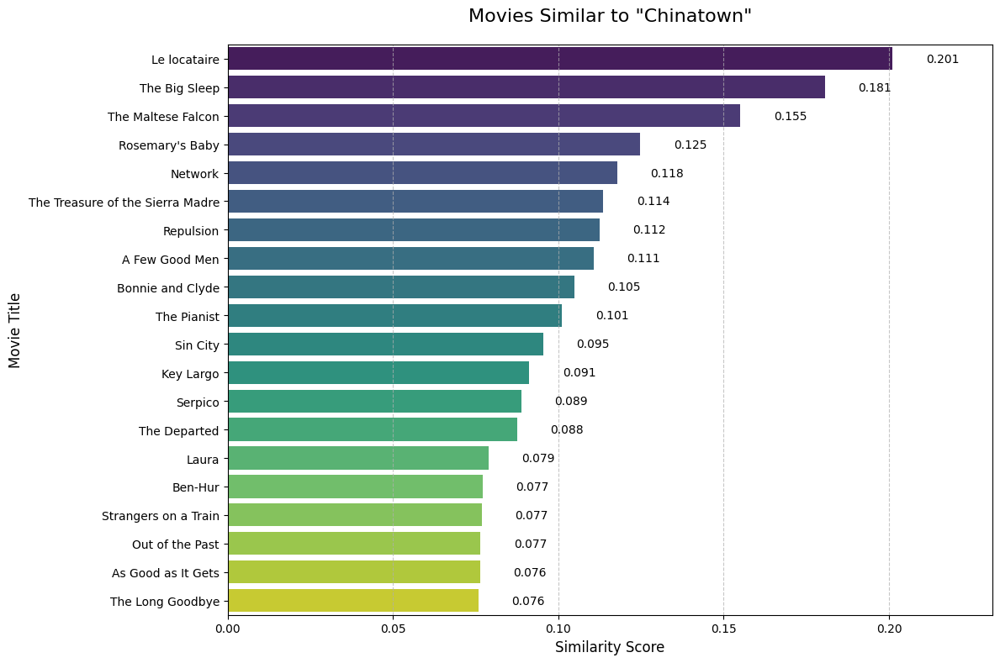

,Series_Title,Overview,Director,Star1,Star2,Star3,Similarity_Score
845,Le locataire,A bureaucrat rents a Paris apartment where he ...,Roman Polanski,Roman Polanski,Isabelle Adjani,Melvyn Douglas,0.201096
560,The Big Sleep,Private detective Philip Marlowe is hired by a...,Howard Hawks,Humphrey Bogart,Lauren Bacall,John Ridgely,0.180627
456,The Maltese Falcon,A private detective takes on a case that invol...,John Huston,Humphrey Bogart,Mary Astor,Gladys George,0.155078
425,Rosemary's Baby,A young couple trying for a baby move into a f...,Roman Polanski,Mia Farrow,John Cassavetes,Ruth Gordon,0.124814
280,Network,A television network cynically exploits a dera...,Sidney Lumet,Faye Dunaway,William Holden,Peter Finch,0.117726
191,The Treasure of the Sierra Madre,Two Americans searching for work in Mexico con...,John Huston,Humphrey Bogart,Walter Huston,Tim Holt,0.113603
859,Repulsion,A sex-repulsed woman who disapproves of her si...,Roman Polanski,Catherine Deneuve,Ian Hendry,John Fraser,0.112434
824,A Few Good Men,Military lawyer Lieutenant Daniel Kaffee defen...,Rob Reiner,Tom Cruise,Jack Nicholson,Demi Moore,0.110695
702,Bonnie and Clyde,Bored waitress Bonnie Parker falls in love wit...,Arthur Penn,Warren Beatty,Faye Dunaway,Michael J. Pollard,0.104785
38,The Pianist,A Polish Jewish musician struggles to survive ...,Roman Polanski,Adrien Brody,Thomas Kretschmann,Frank Finlay,0.101171


In [ ]:

run_movie_recommender(df, "Chinatown", 20)

In [ ]:
# Example usage
input_movie_name = "Chinatown"
recommended_movies_df = recommend_movies(input_movie_name, df, siamese_network, tokenizer, model)
print(recommended_movies_df)

          Series_Title  Cosine Similarity
0            Chinatown           1.000000
1          Blue Velvet           0.986750
2     The Conversation           0.969490
3       Mulholland Dr.           0.964050
4               Blowup           0.963908
5            Gone Girl           0.956110
6  The Lives of Others           0.956014
7      The Sixth Sense           0.933070
8            Searching           0.886085


In [ ]:
def get_optimal_recommendation(input_movie_name, df, siamese_network, tokenizer, model):
    """
    Compare recommendations from both approaches and return the first common movie
    or the top Siamese recommendation if there's no match.

    Parameters:
    input_movie_name (str): Movie title to get recommendations for
    df (pandas.DataFrame): DataFrame containing movie data
    siamese_network: The trained Siamese neural network
    tokenizer: BERT tokenizer for text processing
    model: BERT model for embeddings

    Returns:
    dict: Recommended movie information
    """
    # Get Siamese network recommendations
    siamese_recommendations = recommend_movies(input_movie_name, df, siamese_network, tokenizer, model)

    # Get content-based recommendations without visualization
    # Prepare features and calculate similarity
    similarity_matrix, indices = prepare_movie_features(df)
    content_based_recommendations = get_recommendations(input_movie_name, similarity_matrix, indices, df, top_n=20)

    # Extract movie titles from both recommendation sets
    siamese_titles = siamese_recommendations['Series_Title'].tolist()

    if isinstance(content_based_recommendations, pd.DataFrame):
        content_based_titles = content_based_recommendations['Series_Title'].tolist()
    else:
        # Handle the case where content-based returns an error message
        content_based_titles = []

    # Find common movies (excluding the input movie itself)
    common_movies = []
    for title in siamese_titles:
        if title in content_based_titles and title != input_movie_name:
            common_movies.append(title)

    # If there are common movies, return the first one
    if common_movies:
        # Get the similarity score from Siamese recommendations
        similarity = siamese_recommendations[siamese_recommendations['Series_Title'] == common_movies[0]]['Cosine Similarity'].values[0]
        return {
            "title": common_movies[0],
            "similarity_score": similarity,
            "source": "Both approaches"
        }

    # If no common movie exists, return the top Siamese recommendation (excluding the input movie)
    for title, similarity in zip(siamese_titles, siamese_recommendations['Cosine Similarity']):
        if title != input_movie_name:
            return {
                "title": title,
                "similarity_score": similarity,
                "source": "Siamese network"
            }

    # Fallback if nothing suitable found
    return None

# Example usage
if __name__ == "__main__":
    # Assume df, siamese_network, tokenizer, and model are already loaded
    movie_query = "Chinatown"

    recommendation = get_optimal_recommendation(movie_query, df, siamese_network, tokenizer, model)

    if recommendation:
        print(f"\nOptimal recommendation for '{movie_query}':")
        print(f"Recommended movie: {recommendation['title']}")
        print(f"Similarity score: {recommendation['similarity_score']:.4f}")
        print(f"Source: {recommendation['source']}")
    else:
        print(f"\nNo recommendations available for '{movie_query}'.")


Optimal recommendation for 'Chinatown':
Recommended movie: Blue Velvet
Similarity score: 0.9867
Source: Siamese network


Top 20 movies similar to 'Halloween':
                                   Series_Title  Similarity_Score
                         Hannah and Her Sisters          0.118226
               The Man Who Shot Liberty Valance          0.104764
                 The Nightmare Before Christmas          0.098063
                         Sweet Smell of Success          0.096502
                                The Deer Hunter          0.085624
                                Out of the Past          0.075742
                               Some Like It Hot          0.073185
                             The Man from Earth          0.072521
                                      The Thing          0.067592
                One Flew Over the Cuckoo's Nest          0.066184
Das weiße Band - Eine deutsche Kindergeschichte          0.064642
                                  The Quiet Man          0.063437
                                   The Fugitive          0.061332
                                      

<ipython-input-13-6f28ab141b3a>:128: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  ax = sns.barplot(


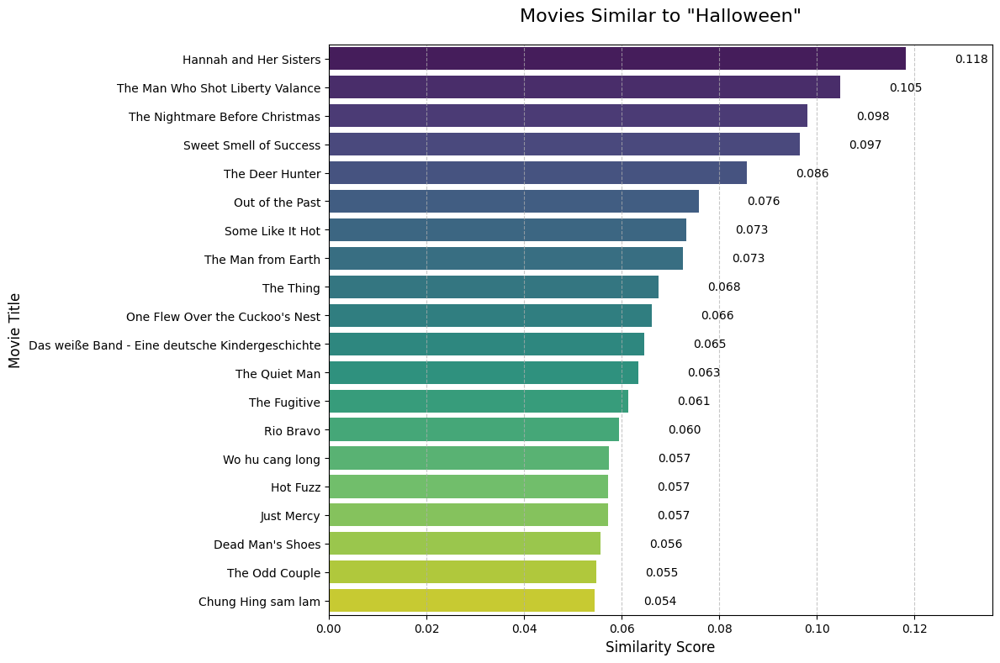

,Series_Title,Overview,Director,Star1,Star2,Star3,Similarity_Score
528,Hannah and Her Sisters,"Between two Thanksgivings two years apart, Han...",Woody Allen,Mia Farrow,Dianne Wiest,Michael Caine,0.118226
295,The Man Who Shot Liberty Valance,A senator returns to a western town for the fu...,John Ford,James Stewart,John Wayne,Vera Miles,0.104764
395,The Nightmare Before Christmas,"Jack Skellington, king of Halloween Town, disc...",Henry Selick,Danny Elfman,Chris Sarandon,Catherine O'Hara,0.098063
440,Sweet Smell of Success,Powerful but unethical Broadway columnist J.J....,Alexander Mackendrick,Burt Lancaster,Tony Curtis,Susan Harrison,0.096502
278,The Deer Hunter,An in-depth examination of the ways in which t...,Michael Cimino,Robert De Niro,Christopher Walken,John Cazale,0.085624
451,Out of the Past,A private eye escapes his past to run a gas st...,Jacques Tourneur,Robert Mitchum,Jane Greer,Kirk Douglas,0.075742
183,Some Like It Hot,"After two male musicians witness a mob hit, th...",Billy Wilder,Marilyn Monroe,Tony Curtis,Jack Lemmon,0.073185
495,The Man from Earth,An impromptu goodbye party for Professor John ...,Richard Schenkman,David Lee Smith,Tony Todd,John Billingsley,0.072521
271,The Thing,A research team in Antarctica is hunted by a s...,John Carpenter,Kurt Russell,Wilford Brimley,Keith David,0.067592
17,One Flew Over the Cuckoo's Nest,A criminal pleads insanity and is admitted to ...,Milos Forman,Jack Nicholson,Louise Fletcher,Michael Berryman,0.066184


In [ ]:

run_movie_recommender(df, "Halloween", 20)

In [ ]:
# Example usage
input_movie_name = "Halloween"
recommended_movies_df = recommend_movies(input_movie_name, df, siamese_network, tokenizer, model)
print(recommended_movies_df)

               Series_Title  Cosine Similarity
0                 Halloween           1.000000
1  Night of the Living Dead           0.969963


In [ ]:
def get_optimal_recommendation(input_movie_name, df, siamese_network, tokenizer, model):
    """
    Compare recommendations from both approaches and return the first common movie
    or the top Siamese recommendation if there's no match.

    Parameters:
    input_movie_name (str): Movie title to get recommendations for
    df (pandas.DataFrame): DataFrame containing movie data
    siamese_network: The trained Siamese neural network
    tokenizer: BERT tokenizer for text processing
    model: BERT model for embeddings

    Returns:
    dict: Recommended movie information
    """
    # Get Siamese network recommendations
    siamese_recommendations = recommend_movies(input_movie_name, df, siamese_network, tokenizer, model)

    # Get content-based recommendations without visualization
    # Prepare features and calculate similarity
    similarity_matrix, indices = prepare_movie_features(df)
    content_based_recommendations = get_recommendations(input_movie_name, similarity_matrix, indices, df, top_n=20)

    # Extract movie titles from both recommendation sets
    siamese_titles = siamese_recommendations['Series_Title'].tolist()

    if isinstance(content_based_recommendations, pd.DataFrame):
        content_based_titles = content_based_recommendations['Series_Title'].tolist()
    else:
        # Handle the case where content-based returns an error message
        content_based_titles = []

    # Find common movies (excluding the input movie itself)
    common_movies = []
    for title in siamese_titles:
        if title in content_based_titles and title != input_movie_name:
            common_movies.append(title)

    # If there are common movies, return the first one
    if common_movies:
        # Get the similarity score from Siamese recommendations
        similarity = siamese_recommendations[siamese_recommendations['Series_Title'] == common_movies[0]]['Cosine Similarity'].values[0]
        return {
            "title": common_movies[0],
            "similarity_score": similarity,
            "source": "Both approaches"
        }

    # If no common movie exists, return the top Siamese recommendation (excluding the input movie)
    for title, similarity in zip(siamese_titles, siamese_recommendations['Cosine Similarity']):
        if title != input_movie_name:
            return {
                "title": title,
                "similarity_score": similarity,
                "source": "Siamese network"
            }

    # Fallback if nothing suitable found
    return None

# Example usage
if __name__ == "__main__":
    # Assume df, siamese_network, tokenizer, and model are already loaded
    movie_query = "Halloween"

    recommendation = get_optimal_recommendation(movie_query, df, siamese_network, tokenizer, model)

    if recommendation:
        print(f"\nOptimal recommendation for '{movie_query}':")
        print(f"Recommended movie: {recommendation['title']}")
        print(f"Similarity score: {recommendation['similarity_score']:.4f}")
        print(f"Source: {recommendation['source']}")
    else:
        print(f"\nNo recommendations available for '{movie_query}'.")


Optimal recommendation for 'Halloween':
Recommended movie: Night of the Living Dead
Similarity score: 0.9700
Source: Siamese network


Kiana Noorbehbahani

Top 20 movies similar to 'Room':
            Series_Title  Similarity_Score
                  Wonder          0.115473
              Just Mercy          0.110068
           Short Term 12          0.101408
         Rang De Basanti          0.099430
                Iron Man          0.097078
            The Notebook          0.082541
       Kramer vs. Kramer          0.081295
            Blade Runner          0.078493
       Tengoku to jigoku          0.077458
          Manbiki kazoku          0.076996
                  Aliens          0.076195
          V for Vendetta          0.073161
           Carlito's Way          0.068284
          The Iron Giant          0.067847
     Fanny och Alexander          0.067403
             Joyeux Noël          0.063966
       Empire of the Sun          0.056395
The Grand Budapest Hotel          0.054671
          Hidden Figures          0.054670
   Män som hatar kvinnor          0.052639


<ipython-input-12-6f28ab141b3a>:128: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  ax = sns.barplot(


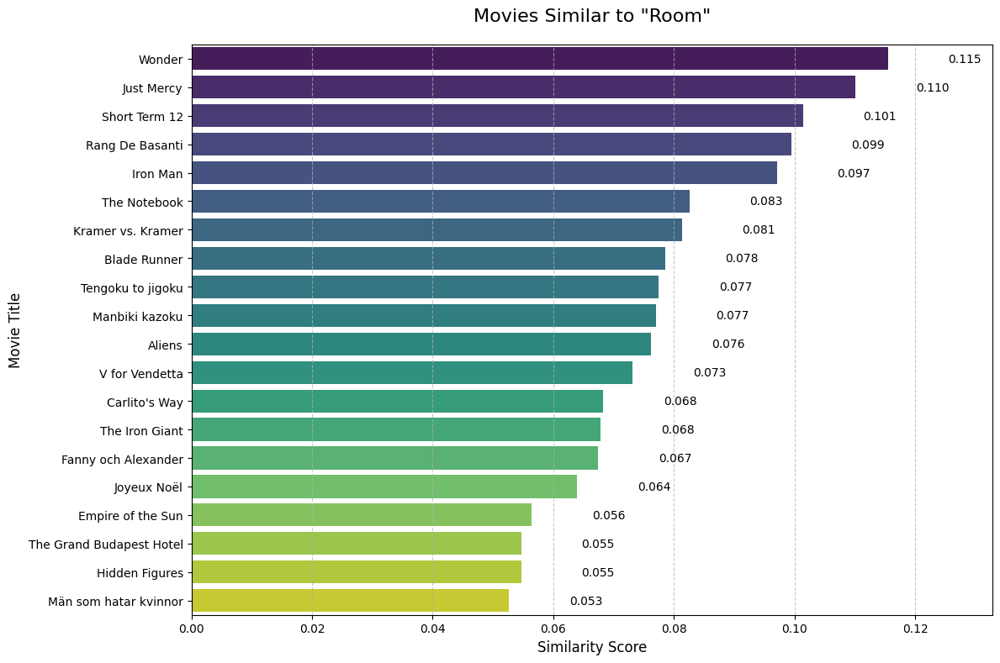

,Series_Title,Overview,Director,Star1,Star2,Star3,Similarity_Score
333,Wonder,"Based on the New York Times bestseller, this m...",Stephen Chbosky,Jacob Tremblay,Owen Wilson,Izabela Vidovic,0.115473
882,Just Mercy,World-renowned civil rights defense attorney B...,Destin Daniel Cretton,Michael B. Jordan,Jamie Foxx,Brie Larson,0.110068
336,Short Term 12,A 20-something supervising staff member of a r...,Destin Daniel Cretton,Brie Larson,Frantz Turner,John Gallagher Jr.,0.101408
153,Rang De Basanti,The story of six young Indians who assist an E...,Rakeysh Omprakash Mehra,Aamir Khan,Soha Ali Khan,Siddharth,0.099430
502,Iron Man,"After being held captive in an Afghan cave, bi...",Jon Favreau,Robert Downey Jr.,Gwyneth Paltrow,Terrence Howard,0.097078
637,The Notebook,A poor yet passionate young man falls in love ...,Nick Cassavetes,Gena Rowlands,James Garner,Rachel McAdams,0.082541
689,Kramer vs. Kramer,"Ted Kramer's wife leaves him, allowing for a l...",Robert Benton,Dustin Hoffman,Meryl Streep,Jane Alexander,0.081295
275,Blade Runner,A blade runner must pursue and terminate four ...,Ridley Scott,Harrison Ford,Rutger Hauer,Sean Young,0.078493
77,Tengoku to jigoku,An executive of a shoe company becomes a victi...,Akira Kurosawa,Toshirô Mifune,Yutaka Sada,Tatsuya Nakadai,0.077458
465,Manbiki kazoku,A family of small-time crooks take in a child ...,Hirokazu Koreeda,Lily Franky,Sakura Andô,Kirin Kiki,0.076996


In [ ]:

run_movie_recommender(df, "Room", 20)

In [ ]:
# Example usage
input_movie_name = "Room"
recommended_movies_df = recommend_movies(input_movie_name, df, siamese_network, tokenizer, model)
print(recommended_movies_df)

                Series_Title  Cosine Similarity
0                       Room           1.000000
1                     Misery           0.974974
2              The Machinist           0.965899
3              Amores perros           0.964272
4   The Manchurian Candidate           0.952942
5                  Cape Fear           0.952074
6                    Persona           0.952066
7             A Few Good Men           0.950559
8               Le locataire           0.943035
9                  Die Welle           0.933557
10                Black Swan           0.931382
11                  Kokuhaku           0.906824
12            Das Experiment           0.887286
13                      Pink           0.797735


In [ ]:
def get_optimal_recommendation(input_movie_name, df, siamese_network, tokenizer, model):
    """
    Compare recommendations from both approaches and return the first common movie
    or the top Siamese recommendation if there's no match.

    Parameters:
    input_movie_name (str): Movie title to get recommendations for
    df (pandas.DataFrame): DataFrame containing movie data
    siamese_network: The trained Siamese neural network
    tokenizer: BERT tokenizer for text processing
    model: BERT model for embeddings

    Returns:
    dict: Recommended movie information
    """
    # Get Siamese network recommendations
    siamese_recommendations = recommend_movies(input_movie_name, df, siamese_network, tokenizer, model)

    # Get content-based recommendations without visualization
    # Prepare features and calculate similarity
    similarity_matrix, indices = prepare_movie_features(df)
    content_based_recommendations = get_recommendations(input_movie_name, similarity_matrix, indices, df, top_n=20)

    # Extract movie titles from both recommendation sets
    siamese_titles = siamese_recommendations['Series_Title'].tolist()

    if isinstance(content_based_recommendations, pd.DataFrame):
        content_based_titles = content_based_recommendations['Series_Title'].tolist()
    else:
        # Handle the case where content-based returns an error message
        content_based_titles = []

    # Find common movies (excluding the input movie itself)
    common_movies = []
    for title in siamese_titles:
        if title in content_based_titles and title != input_movie_name:
            common_movies.append(title)

    # If there are common movies, return the first one
    if common_movies:
        # Get the similarity score from Siamese recommendations
        similarity = siamese_recommendations[siamese_recommendations['Series_Title'] == common_movies[0]]['Cosine Similarity'].values[0]
        return {
            "title": common_movies[0],
            "similarity_score": similarity,
            "source": "Both approaches"
        }

    # If no common movie exists, return the top Siamese recommendation (excluding the input movie)
    for title, similarity in zip(siamese_titles, siamese_recommendations['Cosine Similarity']):
        if title != input_movie_name:
            return {
                "title": title,
                "similarity_score": similarity,
                "source": "Siamese network"
            }

    # Fallback if nothing suitable found
    return None

# Example usage
if __name__ == "__main__":
    # Assume df, siamese_network, tokenizer, and model are already loaded
    movie_query = "Room"

    recommendation = get_optimal_recommendation(movie_query, df, siamese_network, tokenizer, model)

    if recommendation:
        print(f"\nOptimal recommendation for '{movie_query}':")
        print(f"Recommended movie: {recommendation['title']}")
        print(f"Similarity score: {recommendation['similarity_score']:.4f}")
        print(f"Source: {recommendation['source']}")
    else:
        print(f"\nNo recommendations available for '{movie_query}'.")


Optimal recommendation for 'Room':
Recommended movie: Misery
Similarity score: 0.9750
Source: Siamese network


Top 20 movies similar to 'Zodiac':
              Series_Title  Similarity_Score
                 The Birds          0.149366
           Sherlock Holmes          0.104188
                     Se7en          0.093516
               Dirty Harry          0.093485
        Brokeback Mountain          0.089819
                  Badlands          0.085448
Captain America: Civil War          0.084000
       Catch Me If You Can          0.083478
              End of Watch          0.082244
            Shutter Island          0.080853
              The Avengers          0.078454
    Avengers: Infinity War          0.074823
                  Iron Man          0.073495
              A Bronx Tale          0.073312
                      Roma          0.072217
               October Sky          0.071629
              Nightcrawler          0.071595
               Dark Waters          0.071152
                 Prisoners          0.070495
                   Vertigo          0.069851


<ipython-input-12-6f28ab141b3a>:128: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  ax = sns.barplot(


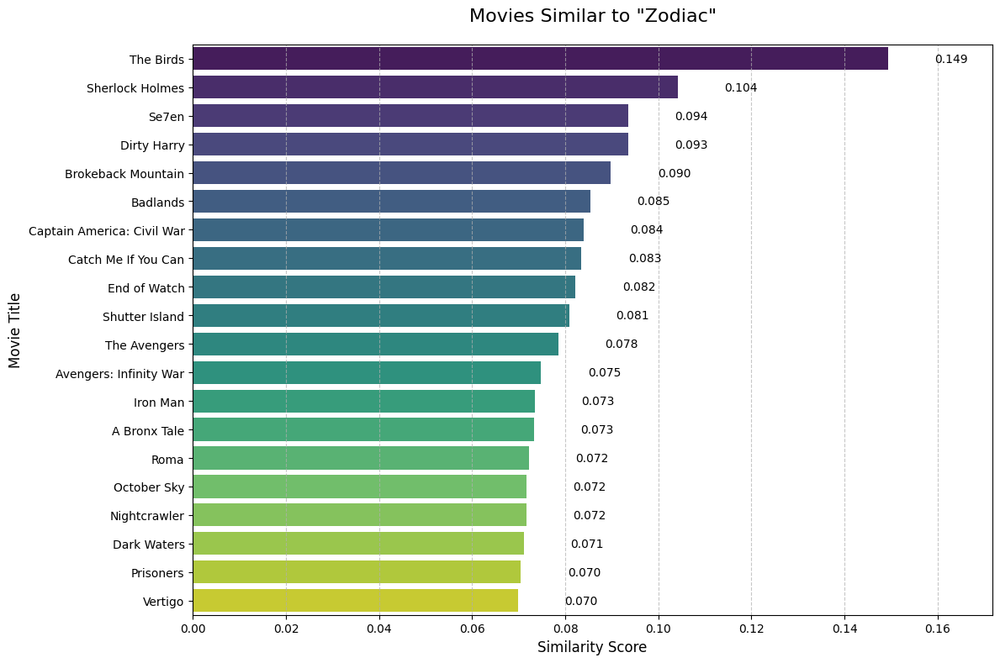

,Series_Title,Overview,Director,Star1,Star2,Star3,Similarity_Score
862,The Birds,A wealthy San Francisco socialite pursues a po...,Alfred Hitchcock,Rod Taylor,Tippi Hedren,Jessica Tandy,0.149366
914,Sherlock Holmes,Detective Sherlock Holmes and his stalwart par...,Guy Ritchie,Robert Downey Jr.,Jude Law,Rachel McAdams,0.104188
27,Se7en,"Two detectives, a rookie and a veteran, hunt a...",David Fincher,Morgan Freeman,Brad Pitt,Kevin Spacey,0.093516
853,Dirty Harry,"When a madman calling himself ""the Scorpio Kil...",Don Siegel,Clint Eastwood,Andrew Robinson,Harry Guardino,0.093485
773,Brokeback Mountain,The story of a forbidden and secretive relatio...,Ang Lee,Jake Gyllenhaal,Heath Ledger,Michelle Williams,0.089819
696,Badlands,An impressionable teenage girl from a dead-end...,Terrence Malick,Martin Sheen,Sissy Spacek,Warren Oates,0.085448
583,Captain America: Civil War,Political involvement in the Avengers' affairs...,Anthony Russo,Joe Russo,Chris Evans,Robert Downey Jr.,0.084000
243,Catch Me If You Can,"Barely 21 yet, Frank is a skilled forger who h...",Steven Spielberg,Leonardo DiCaprio,Tom Hanks,Christopher Walken,0.083478
901,End of Watch,"Shot documentary-style, this film follows the ...",David Ayer,Jake Gyllenhaal,Michael Peña,Anna Kendrick,0.082244
145,Shutter Island,"In 1954, a U.S. Marshal investigates the disap...",Martin Scorsese,Leonardo DiCaprio,Emily Mortimer,Mark Ruffalo,0.080853


In [ ]:

run_movie_recommender(df, "Zodiac", 20)

In [ ]:
# Example usage
input_movie_name = "Zodiac"
recommended_movies_df = recommend_movies(input_movie_name, df, siamese_network, tokenizer, model)
print(recommended_movies_df)

                       Series_Title  Cosine Similarity
0                            Zodiac           1.000000
1                 The Hateful Eight           0.982732
2   The Girl with the Dragon Tattoo           0.971562
3                             Se7en           0.970327
4                 L.A. Confidential           0.969236
5                         Prisoners           0.968111
6                        Inside Man           0.964887
7                      Mystic River           0.963741
8                    Gone Baby Gone           0.963733
9                              Rope           0.961540
10              Glengarry Glen Ross           0.949422
11                       Wind River           0.938327
12                Der Name der Rose           0.937326
13              Anatomy of a Murder           0.930234
14                     Contratiempo           0.928625
15              La migliore offerta           0.925151
16         In the Heat of the Night           0.922268
17        

In [ ]:
def get_optimal_recommendation(input_movie_name, df, siamese_network, tokenizer, model):
    """
    Compare recommendations from both approaches and return the first common movie
    or the top Siamese recommendation if there's no match.

    Parameters:
    input_movie_name (str): Movie title to get recommendations for
    df (pandas.DataFrame): DataFrame containing movie data
    siamese_network: The trained Siamese neural network
    tokenizer: BERT tokenizer for text processing
    model: BERT model for embeddings

    Returns:
    dict: Recommended movie information
    """
    # Get Siamese network recommendations
    siamese_recommendations = recommend_movies(input_movie_name, df, siamese_network, tokenizer, model)

    # Get content-based recommendations without visualization
    # Prepare features and calculate similarity
    similarity_matrix, indices = prepare_movie_features(df)
    content_based_recommendations = get_recommendations(input_movie_name, similarity_matrix, indices, df, top_n=20)

    # Extract movie titles from both recommendation sets
    siamese_titles = siamese_recommendations['Series_Title'].tolist()

    if isinstance(content_based_recommendations, pd.DataFrame):
        content_based_titles = content_based_recommendations['Series_Title'].tolist()
    else:
        # Handle the case where content-based returns an error message
        content_based_titles = []

    # Find common movies (excluding the input movie itself)
    common_movies = []
    for title in siamese_titles:
        if title in content_based_titles and title != input_movie_name:
            common_movies.append(title)

    # If there are common movies, return the first one
    if common_movies:
        # Get the similarity score from Siamese recommendations
        similarity = siamese_recommendations[siamese_recommendations['Series_Title'] == common_movies[0]]['Cosine Similarity'].values[0]
        return {
            "title": common_movies[0],
            "similarity_score": similarity,
            "source": "Both approaches"
        }

    # If no common movie exists, return the top Siamese recommendation (excluding the input movie)
    for title, similarity in zip(siamese_titles, siamese_recommendations['Cosine Similarity']):
        if title != input_movie_name:
            return {
                "title": title,
                "similarity_score": similarity,
                "source": "Siamese network"
            }

    # Fallback if nothing suitable found
    return None

# Example usage
if __name__ == "__main__":
    # Assume df, siamese_network, tokenizer, and model are already loaded
    movie_query = "Zodiac"

    recommendation = get_optimal_recommendation(movie_query, df, siamese_network, tokenizer, model)

    if recommendation:
        print(f"\nOptimal recommendation for '{movie_query}':")
        print(f"Recommended movie: {recommendation['title']}")
        print(f"Similarity score: {recommendation['similarity_score']:.4f}")
        print(f"Source: {recommendation['source']}")
    else:
        print(f"\nNo recommendations available for '{movie_query}'.")

Fatemeh Soleimani

Top 20 movies similar to 'Interstellar':
            Series_Title  Similarity_Score
   The Dark Knight Rises          0.171077
             The Martian          0.144051
                 Memento          0.137001
           The Gentlemen          0.116098
             Dark Waters          0.103178
      Dazed and Confused          0.099302
            The Revenant          0.094043
                 Gattaca          0.090385
           Batman Begins          0.088655
Kubo and the Two Strings          0.085281
      Dallas Buyers Club          0.084774
            The Avengers          0.084724
            The Prestige          0.079382
                 Dunkirk          0.076884
                   Amour          0.072012
               Inception          0.071291
                  Aliens          0.069945
          Hidden Figures          0.069597
               Airplane!          0.067511
         The Dark Knight          0.067490


<ipython-input-12-6f28ab141b3a>:128: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  ax = sns.barplot(


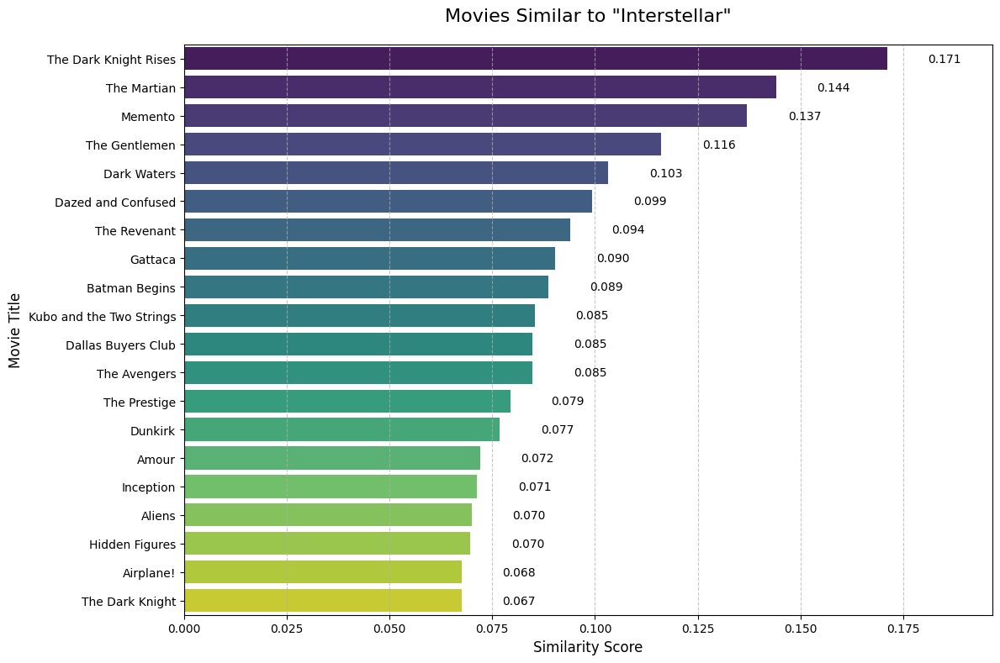

,Series_Title,Overview,Director,Star1,Star2,Star3,Similarity_Score
63,The Dark Knight Rises,Eight years after the Joker's reign of anarchy...,Christopher Nolan,Christian Bale,Tom Hardy,Anne Hathaway,0.171077
329,The Martian,An astronaut becomes stranded on Mars after hi...,Ridley Scott,Matt Damon,Jessica Chastain,Kristen Wiig,0.144051
69,Memento,A man with short-term memory loss attempts to ...,Christopher Nolan,Guy Pearce,Carrie-Anne Moss,Joe Pantoliano,0.137001
569,The Gentlemen,An American expat tries to sell off his highly...,Guy Ritchie,Matthew McConaughey,Charlie Hunnam,Michelle Dockery,0.116098
877,Dark Waters,A corporate defense attorney takes on an envir...,Todd Haynes,Mark Ruffalo,Anne Hathaway,Tim Robbins,0.103178
969,Dazed and Confused,The adventures of high school and junior high ...,Richard Linklater,Jason London,Wiley Wiggins,Matthew McConaughey,0.099302
343,The Revenant,A frontiersman on a fur trading expedition in ...,Alejandro G. Iñárritu,Leonardo DiCaprio,Tom Hardy,Will Poulter,0.094043
654,Gattaca,A genetically inferior man assumes the identit...,Andrew Niccol,Ethan Hawke,Uma Thurman,Jude Law,0.090385
155,Batman Begins,"After training with his mentor, Batman begins ...",Christopher Nolan,Christian Bale,Michael Caine,Ken Watanabe,0.088655
578,Kubo and the Two Strings,A young boy named Kubo must locate a magical s...,Travis Knight,Charlize Theron,Art Parkinson,Matthew McConaughey,0.085281


In [ ]:

run_movie_recommender(df, "Interstellar", 20)

In [ ]:
# Example usage
input_movie_name = "Interstellar"
recommended_movies_df = recommend_movies(input_movie_name, df, siamese_network, tokenizer, model)
print(recommended_movies_df)

      Series_Title  Cosine Similarity
0     Interstellar           1.000000
1  Children of Men           0.980552
2      The Martian           0.965036


In [ ]:
def get_optimal_recommendation(input_movie_name, df, siamese_network, tokenizer, model):
    """
    Compare recommendations from both approaches and return the first common movie
    or the top Siamese recommendation if there's no match.

    Parameters:
    input_movie_name (str): Movie title to get recommendations for
    df (pandas.DataFrame): DataFrame containing movie data
    siamese_network: The trained Siamese neural network
    tokenizer: BERT tokenizer for text processing
    model: BERT model for embeddings

    Returns:
    dict: Recommended movie information
    """
    # Get Siamese network recommendations
    siamese_recommendations = recommend_movies(input_movie_name, df, siamese_network, tokenizer, model)

    # Get content-based recommendations without visualization
    # Prepare features and calculate similarity
    similarity_matrix, indices = prepare_movie_features(df)
    content_based_recommendations = get_recommendations(input_movie_name, similarity_matrix, indices, df, top_n=20)

    # Extract movie titles from both recommendation sets
    siamese_titles = siamese_recommendations['Series_Title'].tolist()

    if isinstance(content_based_recommendations, pd.DataFrame):
        content_based_titles = content_based_recommendations['Series_Title'].tolist()
    else:
        # Handle the case where content-based returns an error message
        content_based_titles = []

    # Find common movies (excluding the input movie itself)
    common_movies = []
    for title in siamese_titles:
        if title in content_based_titles and title != input_movie_name:
            common_movies.append(title)

    # If there are common movies, return the first one
    if common_movies:
        # Get the similarity score from Siamese recommendations
        similarity = siamese_recommendations[siamese_recommendations['Series_Title'] == common_movies[0]]['Cosine Similarity'].values[0]
        return {
            "title": common_movies[0],
            "similarity_score": similarity,
            "source": "Both approaches"
        }

    # If no common movie exists, return the top Siamese recommendation (excluding the input movie)
    for title, similarity in zip(siamese_titles, siamese_recommendations['Cosine Similarity']):
        if title != input_movie_name:
            return {
                "title": title,
                "similarity_score": similarity,
                "source": "Siamese network"
            }

    # Fallback if nothing suitable found
    return None

# Example usage
if __name__ == "__main__":
    # Assume df, siamese_network, tokenizer, and model are already loaded
    movie_query = "Interstellar"

    recommendation = get_optimal_recommendation(movie_query, df, siamese_network, tokenizer, model)

    if recommendation:
        print(f"\nOptimal recommendation for '{movie_query}':")
        print(f"Recommended movie: {recommendation['title']}")
        print(f"Similarity score: {recommendation['similarity_score']:.4f}")
        print(f"Source: {recommendation['source']}")
    else:
        print(f"\nNo recommendations available for '{movie_query}'.")


Optimal recommendation for 'Interstellar':
Recommended movie: The Martian
Similarity score: 0.9650
Source: Both approaches


Top 20 movies similar to 'Watchmen':
                       Series_Title  Similarity_Score
         X-Men: Days of Future Past          0.098610
                                300          0.096108
                          Andhadhun          0.075592
                              Giant          0.056300
                    The Incredibles          0.055838
                    The Sixth Sense          0.054799
       Batman: Mask of the Phantasm          0.051062
                            The Kid          0.048402
           The Peanut Butter Falcon          0.048014
                        The Hustler          0.046950
                        Blue Velvet          0.043787
Interstate 60: Episodes of the Road          0.042228
         Back to the Future Part II          0.041480
    Who's Afraid of Virginia Woolf?          0.040929
                  Midnight in Paris          0.039548
                 Dallas Buyers Club          0.039280
                               Moon          

<ipython-input-12-6f28ab141b3a>:128: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  ax = sns.barplot(


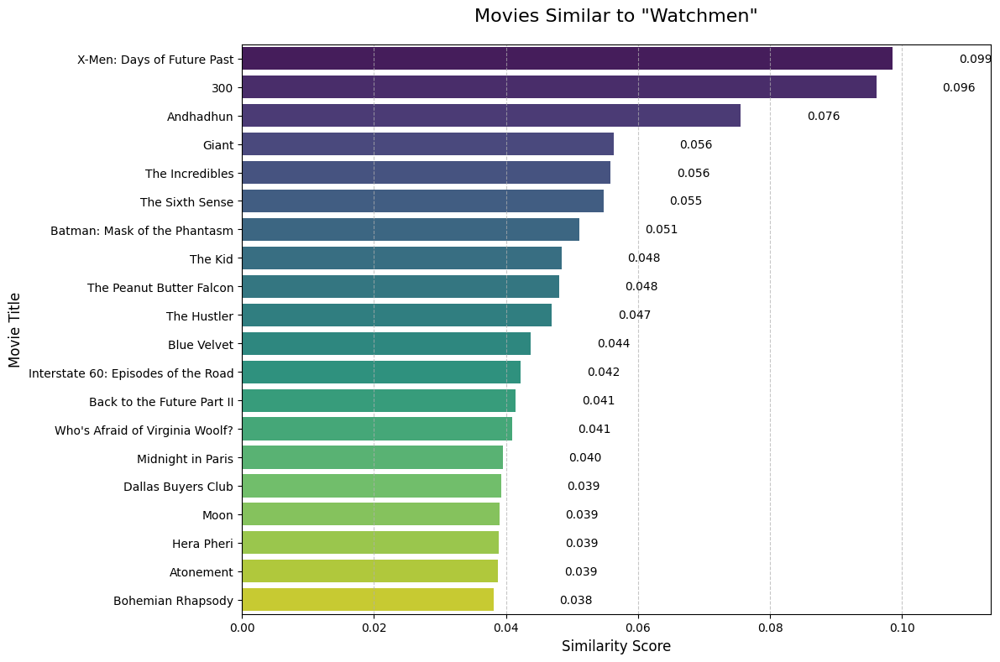

,Series_Title,Overview,Director,Star1,Star2,Star3,Similarity_Score
479,X-Men: Days of Future Past,The X-Men send Wolverine to the past in a desp...,Bryan Singer,Patrick Stewart,Ian McKellen,Hugh Jackman,0.098610
928,300,King Leonidas of Sparta and a force of 300 men...,Zack Snyder,Gerard Butler,Lena Headey,David Wenham,0.096108
86,Andhadhun,A series of mysterious events change the life ...,Sriram Raghavan,Ayushmann Khurrana,Tabu,Radhika Apte,0.075592
996,Giant,Sprawling epic covering the life of a Texas ca...,George Stevens,Elizabeth Taylor,Rock Hudson,James Dean,0.056300
378,The Incredibles,"A family of undercover superheroes, while tryi...",Brad Bird,Craig T. Nelson,Samuel L. Jackson,Holly Hunter,0.055838
248,The Sixth Sense,A boy who communicates with spirits seeks the ...,M. Night Shyamalan,Bruce Willis,Haley Joel Osment,Toni Collette,0.054799
665,Batman: Mask of the Phantasm,Batman is wrongly implicated in a series of mu...,Kevin Altieri,Boyd Kirkland,Frank Paur,Dan Riba,0.051062
127,The Kid,"The Tramp cares for an abandoned child, but ev...",Charles Chaplin,Charles Chaplin,Edna Purviance,Jackie Coogan,0.048402
884,The Peanut Butter Falcon,Zak runs away from his care home to make his d...,Tyler Nilson,Michael Schwartz,Zack Gottsagen,Ann Owens,0.048014
434,The Hustler,An up-and-coming pool player plays a long-time...,Robert Rossen,Paul Newman,Jackie Gleason,Piper Laurie,0.046950


In [ ]:

run_movie_recommender(df, "Watchmen", 20)

In [ ]:
# Example usage
input_movie_name = "Watchmen"
recommended_movies_df = recommend_movies(input_movie_name, df, siamese_network, tokenizer, model)
print(recommended_movies_df)

        Series_Title  Cosine Similarity
0           Watchmen           1.000000
1           The Game           0.973412
2  Blade Runner 2049           0.961790
3            Seppuku           0.942724
4           Oldeuboi           0.746616


In [ ]:
def get_optimal_recommendation(input_movie_name, df, siamese_network, tokenizer, model):
    """
    Compare recommendations from both approaches and return the first common movie
    or the top Siamese recommendation if there's no match.

    Parameters:
    input_movie_name (str): Movie title to get recommendations for
    df (pandas.DataFrame): DataFrame containing movie data
    siamese_network: The trained Siamese neural network
    tokenizer: BERT tokenizer for text processing
    model: BERT model for embeddings

    Returns:
    dict: Recommended movie information
    """
    # Get Siamese network recommendations
    siamese_recommendations = recommend_movies(input_movie_name, df, siamese_network, tokenizer, model)

    # Get content-based recommendations without visualization
    # Prepare features and calculate similarity
    similarity_matrix, indices = prepare_movie_features(df)
    content_based_recommendations = get_recommendations(input_movie_name, similarity_matrix, indices, df, top_n=20)

    # Extract movie titles from both recommendation sets
    siamese_titles = siamese_recommendations['Series_Title'].tolist()

    if isinstance(content_based_recommendations, pd.DataFrame):
        content_based_titles = content_based_recommendations['Series_Title'].tolist()
    else:
        # Handle the case where content-based returns an error message
        content_based_titles = []

    # Find common movies (excluding the input movie itself)
    common_movies = []
    for title in siamese_titles:
        if title in content_based_titles and title != input_movie_name:
            common_movies.append(title)

    # If there are common movies, return the first one
    if common_movies:
        # Get the similarity score from Siamese recommendations
        similarity = siamese_recommendations[siamese_recommendations['Series_Title'] == common_movies[0]]['Cosine Similarity'].values[0]
        return {
            "title": common_movies[0],
            "similarity_score": similarity,
            "source": "Both approaches"
        }

    # If no common movie exists, return the top Siamese recommendation (excluding the input movie)
    for title, similarity in zip(siamese_titles, siamese_recommendations['Cosine Similarity']):
        if title != input_movie_name:
            return {
                "title": title,
                "similarity_score": similarity,
                "source": "Siamese network"
            }

    # Fallback if nothing suitable found
    return None

# Example usage
if __name__ == "__main__":
    # Assume df, siamese_network, tokenizer, and model are already loaded
    movie_query = "Watchmen"

    recommendation = get_optimal_recommendation(movie_query, df, siamese_network, tokenizer, model)

    if recommendation:
        print(f"\nOptimal recommendation for '{movie_query}':")
        print(f"Recommended movie: {recommendation['title']}")
        print(f"Similarity score: {recommendation['similarity_score']:.4f}")
        print(f"Source: {recommendation['source']}")
    else:
        print(f"\nNo recommendations available for '{movie_query}'.")


Optimal recommendation for 'Watchmen':
Recommended movie: The Game
Similarity score: 0.9734
Source: Siamese network


Maryam Mirshahzadeh

Top 20 movies similar to 'La La Land':
                    Series_Title  Similarity_Score
                        Whiplash          0.106817
                 Boyz n the Hood          0.097374
                      Short Cuts          0.092387
                           Drive          0.087110
                   The Big Short          0.080834
                    Training Day          0.079162
                           Crash          0.075764
               Blade Runner 2049          0.075336
                        Die Hard          0.074680
               L.A. Confidential          0.072295
Once Upon a Time... in Hollywood          0.070144
                     Höstsonaten          0.070042
     The Broken Circle Breakdown          0.069286
                        The Help          0.064666
                  Mulholland Dr.          0.063652
                  Dil Chahta Hai          0.063042
          Straight Outta Compton          0.062612
                 Minority Report          0

<ipython-input-12-6f28ab141b3a>:128: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  ax = sns.barplot(


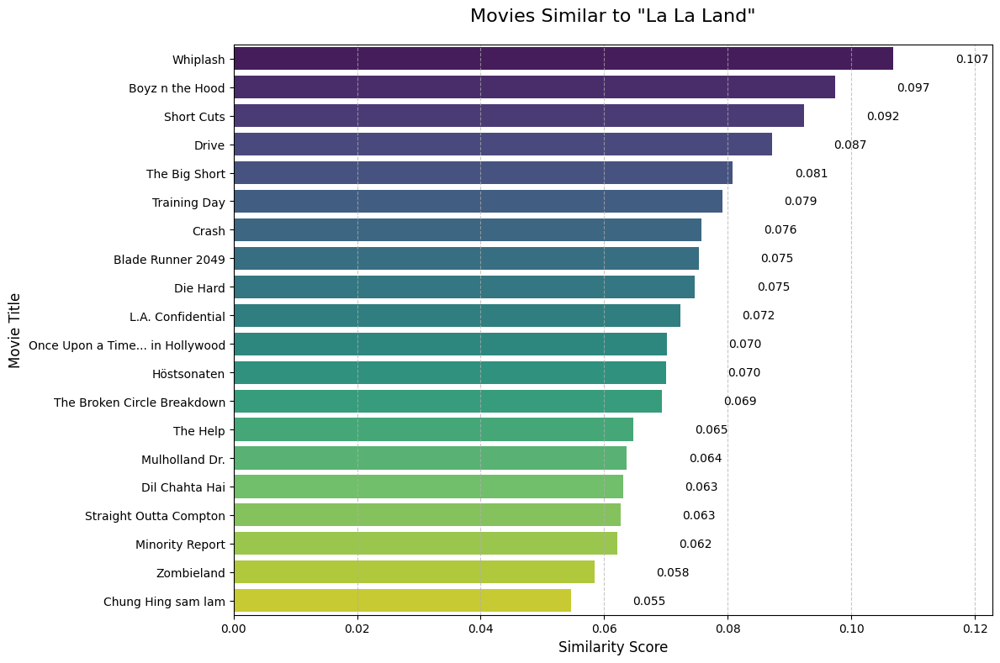

,Series_Title,Overview,Director,Star1,Star2,Star3,Similarity_Score
34,Whiplash,A promising young drummer enrolls at a cut-thr...,Damien Chazelle,Miles Teller,J.K. Simmons,Melissa Benoist,0.106817
669,Boyz n the Hood,Follows the lives of three young males living ...,John Singleton,Cuba Gooding Jr.,Laurence Fishburne,Hudhail Al-Amir,0.097374
817,Short Cuts,The day-to-day lives of several suburban Los A...,Robert Altman,Andie MacDowell,Julianne Moore,Tim Robbins,0.092387
621,Drive,A mysterious Hollywood stuntman and mechanic m...,Nicolas Winding Refn,Ryan Gosling,Carey Mulligan,Bryan Cranston,0.087110
600,The Big Short,In 2006-2007 a group of investors bet against ...,Adam McKay,Christian Bale,Steve Carell,Ryan Gosling,0.080834
802,Training Day,A rookie cop spends his first day as a Los Ang...,Antoine Fuqua,Denzel Washington,Ethan Hawke,Scott Glenn,0.079162
775,Crash,Los Angeles citizens with vastly separate live...,Paul Haggis,Don Cheadle,Sandra Bullock,Thandie Newton,0.075764
340,Blade Runner 2049,Young Blade Runner K's discovery of a long-bur...,Denis Villeneuve,Harrison Ford,Ryan Gosling,Ana de Armas,0.075336
171,Die Hard,An NYPD officer tries to save his wife and sev...,John McTiernan,Bruce Willis,Alan Rickman,Bonnie Bedelia,0.074680
162,L.A. Confidential,"As corruption grows in 1950s Los Angeles, thre...",Curtis Hanson,Kevin Spacey,Russell Crowe,Guy Pearce,0.072295


In [ ]:

run_movie_recommender(df, "La La Land", 20)

In [ ]:
# Example usage
input_movie_name = "La La Land"
recommended_movies_df = recommend_movies(input_movie_name, df, siamese_network, tokenizer, model)
print(recommended_movies_df)

                Series_Title  Cosine Similarity
0                 La La Land           1.000000
1                Sing Street           0.967609
2  Hedwig and the Angry Inch           0.939164


In [ ]:
def get_optimal_recommendation(input_movie_name, df, siamese_network, tokenizer, model):
    """
    Compare recommendations from both approaches and return the first common movie
    or the top Siamese recommendation if there's no match.

    Parameters:
    input_movie_name (str): Movie title to get recommendations for
    df (pandas.DataFrame): DataFrame containing movie data
    siamese_network: The trained Siamese neural network
    tokenizer: BERT tokenizer for text processing
    model: BERT model for embeddings

    Returns:
    dict: Recommended movie information
    """
    # Get Siamese network recommendations
    siamese_recommendations = recommend_movies(input_movie_name, df, siamese_network, tokenizer, model)

    # Get content-based recommendations without visualization
    # Prepare features and calculate similarity
    similarity_matrix, indices = prepare_movie_features(df)
    content_based_recommendations = get_recommendations(input_movie_name, similarity_matrix, indices, df, top_n=20)

    # Extract movie titles from both recommendation sets
    siamese_titles = siamese_recommendations['Series_Title'].tolist()

    if isinstance(content_based_recommendations, pd.DataFrame):
        content_based_titles = content_based_recommendations['Series_Title'].tolist()
    else:
        # Handle the case where content-based returns an error message
        content_based_titles = []

    # Find common movies (excluding the input movie itself)
    common_movies = []
    for title in siamese_titles:
        if title in content_based_titles and title != input_movie_name:
            common_movies.append(title)

    # If there are common movies, return the first one
    if common_movies:
        # Get the similarity score from Siamese recommendations
        similarity = siamese_recommendations[siamese_recommendations['Series_Title'] == common_movies[0]]['Cosine Similarity'].values[0]
        return {
            "title": common_movies[0],
            "similarity_score": similarity,
            "source": "Both approaches"
        }

    # If no common movie exists, return the top Siamese recommendation (excluding the input movie)
    for title, similarity in zip(siamese_titles, siamese_recommendations['Cosine Similarity']):
        if title != input_movie_name:
            return {
                "title": title,
                "similarity_score": similarity,
                "source": "Siamese network"
            }

    # Fallback if nothing suitable found
    return None

# Example usage
if __name__ == "__main__":
    # Assume df, siamese_network, tokenizer, and model are already loaded
    movie_query = "La La Land"

    recommendation = get_optimal_recommendation(movie_query, df, siamese_network, tokenizer, model)

    if recommendation:
        print(f"\nOptimal recommendation for '{movie_query}':")
        print(f"Recommended movie: {recommendation['title']}")
        print(f"Similarity score: {recommendation['similarity_score']:.4f}")
        print(f"Source: {recommendation['source']}")
    else:
        print(f"\nNo recommendations available for '{movie_query}'.")


Optimal recommendation for 'La La Land':
Recommended movie: Sing Street
Similarity score: 0.9676
Source: Siamese network


In [ ]:
# Example usage
input_movie_name = "The Broken Circle Breakdown"
recommended_movies_df = recommend_movies(input_movie_name, df, siamese_network, tokenizer, model)
print(recommended_movies_df)

                           Series_Title  Cosine Similarity
0           The Broken Circle Breakdown           1.000000
1                        Ba wang bie ji           0.974572
2  La leggenda del pianista sull'oceano           0.950606
3                                  Once           0.942763
4                        A Star Is Born           0.938469
5                         The Red Shoes           0.928747
6                             Gully Boy           0.916210


Top 20 movies similar to 'The Broken Circle Breakdown':
                                          Series_Title  Similarity_Score
                           Dilwale Dulhania Le Jayenge          0.088496
                                  (500) Days of Summer          0.073259
                                            La La Land          0.069286
                                          The Notebook          0.067836
                                               Titanic          0.064651
                                        Dil Chahta Hai          0.064558
                             Knockin' on Heaven's Door          0.063012
                                  Miracle in cell NO.7          0.062535
                                           Höstsonaten          0.056796
                                            Veer-Zaara          0.056200
                                    Chung Hing sam lam          0.055947
                                            Metropolis          0.05

<ipython-input-12-6f28ab141b3a>:128: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  ax = sns.barplot(


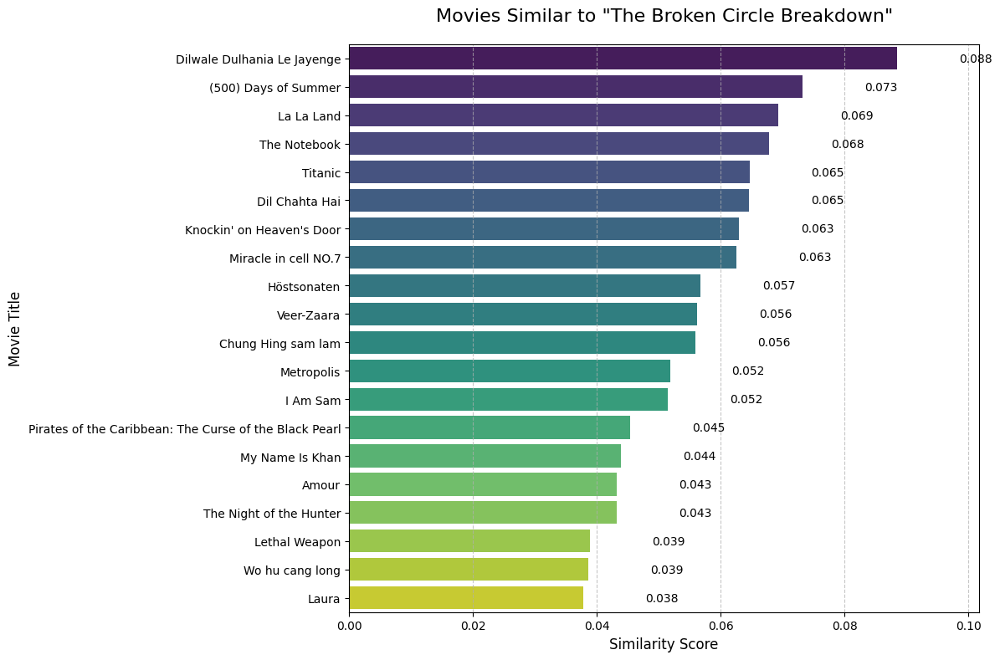

,Series_Title,Overview,Director,Star1,Star2,Star3,Similarity_Score
258,Dilwale Dulhania Le Jayenge,"When Raj meets Simran in Europe, it isn't love...",Aditya Chopra,Shah Rukh Khan,Kajol,Amrish Puri,0.088496
754,(500) Days of Summer,An offbeat romantic comedy about a woman who d...,Marc Webb,Zooey Deschanel,Joseph Gordon-Levitt,Geoffrey Arend,0.073259
327,La La Land,"While navigating their careers in Los Angeles,...",Damien Chazelle,Ryan Gosling,Emma Stone,Rosemarie DeWitt,0.069286
637,The Notebook,A poor yet passionate young man falls in love ...,Nick Cassavetes,Gena Rowlands,James Garner,Rachel McAdams,0.067836
652,Titanic,A seventeen-year-old aristocrat falls in love ...,James Cameron,Leonardo DiCaprio,Kate Winslet,Billy Zane,0.064651
240,Dil Chahta Hai,Three inseparable childhood friends are just o...,Farhan Akhtar,Aamir Khan,Saif Ali Khan,Akshaye Khanna,0.064558
390,Knockin' on Heaven's Door,Two terminally ill patients escape from a hosp...,Thomas Jahn,Til Schweiger,Jan Josef Liefers,Thierry van Werveke,0.063012
91,Miracle in cell NO.7,A story of love between a mentally-ill father ...,Mehmet Ada Öztekin,Aras Bulut Iynemli,Nisa Sofiya Aksongur,Deniz Baysal,0.062535
175,Höstsonaten,A married daughter who longs for her mother's ...,Ingmar Bergman,Ingrid Bergman,Liv Ullmann,Lena Nyman,0.056796
629,Veer-Zaara,"Veer-Zaara is a saga of love, separation, cour...",Yash Chopra,Shah Rukh Khan,Preity Zinta,Rani Mukerji,0.056200


In [ ]:

run_movie_recommender(df, "The Broken Circle Breakdown", 20)

In [ ]:
def get_optimal_recommendation(input_movie_name, df, siamese_network, tokenizer, model):
    """
    Compare recommendations from both approaches and return the first common movie
    or the top Siamese recommendation if there's no match.

    Parameters:
    input_movie_name (str): Movie title to get recommendations for
    df (pandas.DataFrame): DataFrame containing movie data
    siamese_network: The trained Siamese neural network
    tokenizer: BERT tokenizer for text processing
    model: BERT model for embeddings

    Returns:
    dict: Recommended movie information
    """
    # Get Siamese network recommendations
    siamese_recommendations = recommend_movies(input_movie_name, df, siamese_network, tokenizer, model)

    # Get content-based recommendations without visualization
    # Prepare features and calculate similarity
    similarity_matrix, indices = prepare_movie_features(df)
    content_based_recommendations = get_recommendations(input_movie_name, similarity_matrix, indices, df, top_n=20)

    # Extract movie titles from both recommendation sets
    siamese_titles = siamese_recommendations['Series_Title'].tolist()

    if isinstance(content_based_recommendations, pd.DataFrame):
        content_based_titles = content_based_recommendations['Series_Title'].tolist()
    else:
        # Handle the case where content-based returns an error message
        content_based_titles = []

    # Find common movies (excluding the input movie itself)
    common_movies = []
    for title in siamese_titles:
        if title in content_based_titles and title != input_movie_name:
            common_movies.append(title)

    # If there are common movies, return the first one
    if common_movies:
        # Get the similarity score from Siamese recommendations
        similarity = siamese_recommendations[siamese_recommendations['Series_Title'] == common_movies[0]]['Cosine Similarity'].values[0]
        return {
            "title": common_movies[0],
            "similarity_score": similarity,
            "source": "Both approaches"
        }

    # If no common movie exists, return the top Siamese recommendation (excluding the input movie)
    for title, similarity in zip(siamese_titles, siamese_recommendations['Cosine Similarity']):
        if title != input_movie_name:
            return {
                "title": title,
                "similarity_score": similarity,
                "source": "Siamese network"
            }

    # Fallback if nothing suitable found
    return None

# Example usage
if __name__ == "__main__":
    # Assume df, siamese_network, tokenizer, and model are already loaded
    movie_query = "The Broken Circle Breakdown"

    recommendation = get_optimal_recommendation(movie_query, df, siamese_network, tokenizer, model)

    if recommendation:
        print(f"\nOptimal recommendation for '{movie_query}':")
        print(f"Recommended movie: {recommendation['title']}")
        print(f"Similarity score: {recommendation['similarity_score']:.4f}")
        print(f"Source: {recommendation['source']}")
    else:
        print(f"\nNo recommendations available for '{movie_query}'.")


Optimal recommendation for 'The Broken Circle Breakdown':
Recommended movie: Ba wang bie ji
Similarity score: 0.9746
Source: Siamese network


Ali Hodavand

Top 20 movies similar to 'Papurika':
                                              Series_Title  Similarity_Score
                                         Tôkyô goddofâzâzu          0.196297
Shin seiki Evangelion Gekijô-ban: Air/Magokoro wo, kimi ni          0.148820
                                             Pâfekuto burû          0.091760
                                            The Terminator          0.075772
                                                  Whiplash          0.070084
                                                   Bin-jip          0.062436
                                                In America          0.054240
                                               Joyeux Noël          0.048555
                                     Män som hatar kvinnor          0.048490
                                        La planète sauvage          0.047386
                                         The King's Speech          0.045852
                                       

<ipython-input-12-6f28ab141b3a>:128: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  ax = sns.barplot(


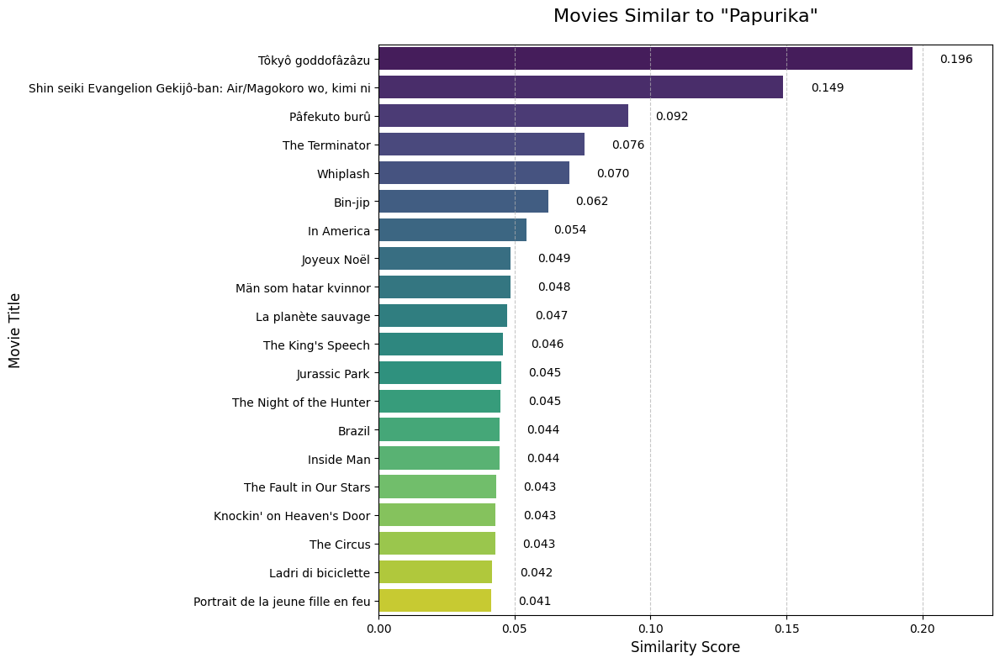

,Series_Title,Overview,Director,Star1,Star2,Star3,Similarity_Score
633,Tôkyô goddofâzâzu,"On Christmas Eve, three homeless people living...",Satoshi Kon,Shôgo Furuya,Tôru Emori,Yoshiaki Umegaki,0.196297
246,Shin seiki Evangelion Gekijô-ban: Air/Magokoro...,Concurrent theatrical ending of the TV series ...,Hideaki Anno,Kazuya Tsurumaki,Megumi Ogata,Megumi Hayashibara,0.148820
386,Pâfekuto burû,A pop singer gives up her career to become an ...,Satoshi Kon,Junko Iwao,Rica Matsumoto,Shinpachi Tsuji,0.091760
410,The Terminator,A human soldier is sent from 2029 to 1984 to s...,James Cameron,Arnold Schwarzenegger,Linda Hamilton,Michael Biehn,0.075772
34,Whiplash,A promising young drummer enrolls at a cut-thr...,Damien Chazelle,Miles Teller,J.K. Simmons,Melissa Benoist,0.070084
363,Bin-jip,A transient young man breaks into empty homes ...,Ki-duk Kim,Seung-Yun Lee,Hee Jae,Hyuk-ho Kwon,0.062436
787,In America,A family of Irish immigrants adjust to life on...,Jim Sheridan,Paddy Considine,Samantha Morton,Djimon Hounsou,0.054240
769,Joyeux Noël,"In December 1914, an unofficial Christmas truc...",Christian Carion,Diane Kruger,Benno Fürmann,Guillaume Canet,0.048555
611,Män som hatar kvinnor,A journalist is aided by a young female hacker...,Niels Arden Oplev,Michael Nyqvist,Noomi Rapace,Ewa Fröling,0.048490
694,La planète sauvage,"On a faraway planet where blue giants rule, op...",René Laloux,Barry Bostwick,Jennifer Drake,Eric Baugin,0.047386


In [ ]:

run_movie_recommender(df, "Papurika", 20)

In [ ]:
# Example usage
input_movie_name = "Papurika"
recommended_movies_df = recommend_movies(input_movie_name, df, siamese_network, tokenizer, model)
print(recommended_movies_df)

                  Series_Title  Cosine Similarity
0                     Papurika           1.000000
1  Ôkami kodomo no Ame to Yuki           0.981391
2               Kimi no na wa.           0.893528
3                  Waking Life           0.859779


In [ ]:
def get_optimal_recommendation(input_movie_name, df, siamese_network, tokenizer, model):
    """
    Compare recommendations from both approaches and return the first common movie
    or the top Siamese recommendation if there's no match.

    Parameters:
    input_movie_name (str): Movie title to get recommendations for
    df (pandas.DataFrame): DataFrame containing movie data
    siamese_network: The trained Siamese neural network
    tokenizer: BERT tokenizer for text processing
    model: BERT model for embeddings

    Returns:
    dict: Recommended movie information
    """
    # Get Siamese network recommendations
    siamese_recommendations = recommend_movies(input_movie_name, df, siamese_network, tokenizer, model)

    # Get content-based recommendations without visualization
    # Prepare features and calculate similarity
    similarity_matrix, indices = prepare_movie_features(df)
    content_based_recommendations = get_recommendations(input_movie_name, similarity_matrix, indices, df, top_n=20)

    # Extract movie titles from both recommendation sets
    siamese_titles = siamese_recommendations['Series_Title'].tolist()

    if isinstance(content_based_recommendations, pd.DataFrame):
        content_based_titles = content_based_recommendations['Series_Title'].tolist()
    else:
        # Handle the case where content-based returns an error message
        content_based_titles = []

    # Find common movies (excluding the input movie itself)
    common_movies = []
    for title in siamese_titles:
        if title in content_based_titles and title != input_movie_name:
            common_movies.append(title)

    # If there are common movies, return the first one
    if common_movies:
        # Get the similarity score from Siamese recommendations
        similarity = siamese_recommendations[siamese_recommendations['Series_Title'] == common_movies[0]]['Cosine Similarity'].values[0]
        return {
            "title": common_movies[0],
            "similarity_score": similarity,
            "source": "Both approaches"
        }

    # If no common movie exists, return the top Siamese recommendation (excluding the input movie)
    for title, similarity in zip(siamese_titles, siamese_recommendations['Cosine Similarity']):
        if title != input_movie_name:
            return {
                "title": title,
                "similarity_score": similarity,
                "source": "Siamese network"
            }

    # Fallback if nothing suitable found
    return None

# Example usage
if __name__ == "__main__":
    # Assume df, siamese_network, tokenizer, and model are already loaded
    movie_query = "Papurika"

    recommendation = get_optimal_recommendation(movie_query, df, siamese_network, tokenizer, model)

    if recommendation:
        print(f"\nOptimal recommendation for '{movie_query}':")
        print(f"Recommended movie: {recommendation['title']}")
        print(f"Similarity score: {recommendation['similarity_score']:.4f}")
        print(f"Source: {recommendation['source']}")
    else:
        print(f"\nNo recommendations available for '{movie_query}'.")


Optimal recommendation for 'Papurika':
Recommended movie: Ôkami kodomo no Ame to Yuki
Similarity score: 0.9814
Source: Siamese network


In [ ]:
# Example usage
input_movie_name = "Mulan"
recommended_movies_df = recommend_movies(input_movie_name, df, siamese_network, tokenizer, model)
print(recommended_movies_df)

                         Series_Title  Cosine Similarity
0                               Mulan           1.000000
1                     The Jungle Book           0.976612
2       Sen to Chihiro no kamikakushi           0.969455
3                              WALL·E           0.965957
4                                Coco           0.962078
5                 The Secret of Kells           0.916624
6                Hauru no ugoku shiro           0.916403
7             Kari-gurashi no Arietti           0.896904
8  Rupan sansei: Kariosutoro no shiro           0.850937


Top 20 movies similar to 'Mulan':
            Series_Title  Similarity_Score
                   Shrek          0.093045
              Chugyeokja          0.081520
                 Dunkirk          0.076396
   Death Note: Desu nôto          0.072696
             Ratatouille          0.070998
          Watership Down          0.068638
       A Little Princess          0.067688
                Drishyam          0.066300
                Sleepers          0.065536
        The Last Emperor          0.064512
            The Graduate          0.064279
               Searching          0.061393
Uri: The Surgical Strike          0.060327
                Rain Man          0.058502
The Theory of Everything          0.057702
        28 Days Later...          0.055163
      Hell or High Water          0.055002
                  Haider          0.054454
           All About Eve          0.054004
           Incredibles 2          0.053603


<ipython-input-12-6f28ab141b3a>:128: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  ax = sns.barplot(


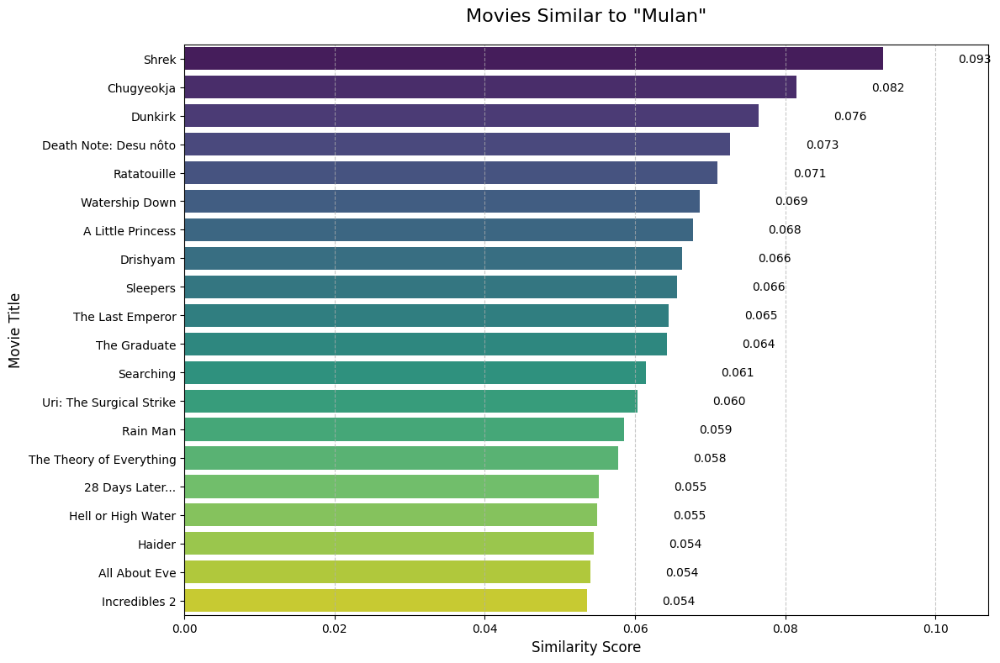

,Series_Title,Overview,Director,Star1,Star2,Star3,Similarity_Score
651,Shrek,A mean lord exiles fairytale creatures to the ...,Andrew Adamson,Vicky Jenson,Mike Myers,Eddie Murphy,0.093045
608,Chugyeokja,A disgraced ex-policeman who runs a small ring...,Hong-jin Na,Kim Yoon-seok,Jung-woo Ha,Yeong-hie Seo,0.081520
573,Dunkirk,"Allied soldiers from Belgium, the British Empi...",Christopher Nolan,Fionn Whitehead,Barry Keoghan,Mark Rylance,0.076396
762,Death Note: Desu nôto,A battle between the world's two greatest mind...,Shûsuke Kaneko,Tatsuya Fujiwara,Ken'ichi Matsuyama,Asaka Seto,0.072696
367,Ratatouille,A rat who can cook makes an unusual alliance w...,Brad Bird,Jan Pinkava,Brad Garrett,Lou Romano,0.070998
986,Watership Down,Hoping to escape destruction by human develope...,Martin Rosen,John Hubley,John Hurt,Richard Briers,0.068638
813,A Little Princess,A young girl is relegated to servitude at a bo...,Alfonso Cuarón,Liesel Matthews,Eleanor Bron,Liam Cunningham,0.067688
87,Drishyam,A man goes to extreme lengths to save his fami...,Jeethu Joseph,Mohanlal,Meena,Asha Sharath,0.066300
960,Sleepers,"After a prank goes disastrously wrong, a group...",Barry Levinson,Robert De Niro,Kevin Bacon,Brad Pitt,0.065536
831,The Last Emperor,The story of the final Emperor of China.,Bernardo Bertolucci,John Lone,Joan Chen,Peter O'Toole,0.064512


In [ ]:

run_movie_recommender(df, "Mulan", 20)

In [ ]:
def get_optimal_recommendation(input_movie_name, df, siamese_network, tokenizer, model):
    """
    Compare recommendations from both approaches and return the first common movie
    or the top Siamese recommendation if there's no match.

    Parameters:
    input_movie_name (str): Movie title to get recommendations for
    df (pandas.DataFrame): DataFrame containing movie data
    siamese_network: The trained Siamese neural network
    tokenizer: BERT tokenizer for text processing
    model: BERT model for embeddings

    Returns:
    dict: Recommended movie information
    """
    # Get Siamese network recommendations
    siamese_recommendations = recommend_movies(input_movie_name, df, siamese_network, tokenizer, model)

    # Get content-based recommendations without visualization
    # Prepare features and calculate similarity
    similarity_matrix, indices = prepare_movie_features(df)
    content_based_recommendations = get_recommendations(input_movie_name, similarity_matrix, indices, df, top_n=20)

    # Extract movie titles from both recommendation sets
    siamese_titles = siamese_recommendations['Series_Title'].tolist()

    if isinstance(content_based_recommendations, pd.DataFrame):
        content_based_titles = content_based_recommendations['Series_Title'].tolist()
    else:
        # Handle the case where content-based returns an error message
        content_based_titles = []

    # Find common movies (excluding the input movie itself)
    common_movies = []
    for title in siamese_titles:
        if title in content_based_titles and title != input_movie_name:
            common_movies.append(title)

    # If there are common movies, return the first one
    if common_movies:
        # Get the similarity score from Siamese recommendations
        similarity = siamese_recommendations[siamese_recommendations['Series_Title'] == common_movies[0]]['Cosine Similarity'].values[0]
        return {
            "title": common_movies[0],
            "similarity_score": similarity,
            "source": "Both approaches"
        }

    # If no common movie exists, return the top Siamese recommendation (excluding the input movie)
    for title, similarity in zip(siamese_titles, siamese_recommendations['Cosine Similarity']):
        if title != input_movie_name:
            return {
                "title": title,
                "similarity_score": similarity,
                "source": "Siamese network"
            }

    # Fallback if nothing suitable found
    return None

# Example usage
if __name__ == "__main__":
    # Assume df, siamese_network, tokenizer, and model are already loaded
    movie_query = "Mulan"

    recommendation = get_optimal_recommendation(movie_query, df, siamese_network, tokenizer, model)

    if recommendation:
        print(f"\nOptimal recommendation for '{movie_query}':")
        print(f"Recommended movie: {recommendation['title']}")
        print(f"Similarity score: {recommendation['similarity_score']:.4f}")
        print(f"Source: {recommendation['source']}")
    else:
        print(f"\nNo recommendations available for '{movie_query}'.")


Optimal recommendation for 'Mulan':
Recommended movie: The Jungle Book
Similarity score: 0.9766
Source: Siamese network


Amin Ahmadi

In [ ]:
# Example usage
input_movie_name = "Halloween"
recommended_movies_df = recommend_movies(input_movie_name, df, siamese_network, tokenizer, model)
print(recommended_movies_df)

               Series_Title  Cosine Similarity
0                 Halloween           1.000000
1  Night of the Living Dead           0.955441


<ipython-input-12-6f28ab141b3a>:104: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  recommendations['Similarity_Score'] = [i[1] for i in sim_scores]
<ipython-input-12-6f28ab141b3a>:128: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  ax = sns.barplot(


Top 20 movies similar to 'Halloween':
                                   Series_Title  Similarity_Score
                         Hannah and Her Sisters          0.118226
               The Man Who Shot Liberty Valance          0.104764
                 The Nightmare Before Christmas          0.098063
                         Sweet Smell of Success          0.096502
                                The Deer Hunter          0.085624
                                Out of the Past          0.075742
                               Some Like It Hot          0.073185
                             The Man from Earth          0.072521
                                      The Thing          0.067592
                One Flew Over the Cuckoo's Nest          0.066184
Das weiße Band - Eine deutsche Kindergeschichte          0.064642
                                  The Quiet Man          0.063437
                                   The Fugitive          0.061332
                                      

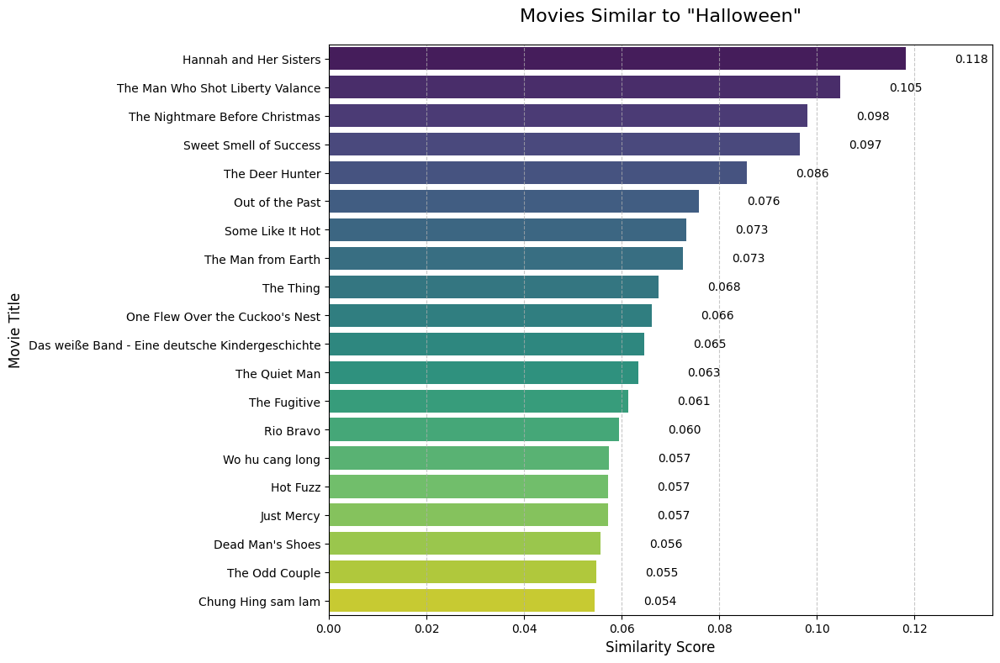

,Series_Title,Overview,Director,Star1,Star2,Star3,Similarity_Score
528,Hannah and Her Sisters,"Between two Thanksgivings two years apart, Han...",Woody Allen,Mia Farrow,Dianne Wiest,Michael Caine,0.118226
295,The Man Who Shot Liberty Valance,A senator returns to a western town for the fu...,John Ford,James Stewart,John Wayne,Vera Miles,0.104764
395,The Nightmare Before Christmas,"Jack Skellington, king of Halloween Town, disc...",Henry Selick,Danny Elfman,Chris Sarandon,Catherine O'Hara,0.098063
440,Sweet Smell of Success,Powerful but unethical Broadway columnist J.J....,Alexander Mackendrick,Burt Lancaster,Tony Curtis,Susan Harrison,0.096502
278,The Deer Hunter,An in-depth examination of the ways in which t...,Michael Cimino,Robert De Niro,Christopher Walken,John Cazale,0.085624
451,Out of the Past,A private eye escapes his past to run a gas st...,Jacques Tourneur,Robert Mitchum,Jane Greer,Kirk Douglas,0.075742
183,Some Like It Hot,"After two male musicians witness a mob hit, th...",Billy Wilder,Marilyn Monroe,Tony Curtis,Jack Lemmon,0.073185
495,The Man from Earth,An impromptu goodbye party for Professor John ...,Richard Schenkman,David Lee Smith,Tony Todd,John Billingsley,0.072521
271,The Thing,A research team in Antarctica is hunted by a s...,John Carpenter,Kurt Russell,Wilford Brimley,Keith David,0.067592
17,One Flew Over the Cuckoo's Nest,A criminal pleads insanity and is admitted to ...,Milos Forman,Jack Nicholson,Louise Fletcher,Michael Berryman,0.066184


In [ ]:
run_movie_recommender(df, "Halloween", 20)

In [ ]:
def get_optimal_recommendation(input_movie_name, df, siamese_network, tokenizer, model):
    """
    Compare recommendations from both approaches and return the first common movie
    or the top Siamese recommendation if there's no match.

    Parameters:
    input_movie_name (str): Movie title to get recommendations for
    df (pandas.DataFrame): DataFrame containing movie data
    siamese_network: The trained Siamese neural network
    tokenizer: BERT tokenizer for text processing
    model: BERT model for embeddings

    Returns:
    dict: Recommended movie information
    """
    # Get Siamese network recommendations
    siamese_recommendations = recommend_movies(input_movie_name, df, siamese_network, tokenizer, model)

    # Get content-based recommendations without visualization
    # Prepare features and calculate similarity
    similarity_matrix, indices = prepare_movie_features(df)
    content_based_recommendations = get_recommendations(input_movie_name, similarity_matrix, indices, df, top_n=20)

    # Extract movie titles from both recommendation sets
    siamese_titles = siamese_recommendations['Series_Title'].tolist()

    if isinstance(content_based_recommendations, pd.DataFrame):
        content_based_titles = content_based_recommendations['Series_Title'].tolist()
    else:
        # Handle the case where content-based returns an error message
        content_based_titles = []

    # Find common movies (excluding the input movie itself)
    common_movies = []
    for title in siamese_titles:
        if title in content_based_titles and title != input_movie_name:
            common_movies.append(title)

    # If there are common movies, return the first one
    if common_movies:
        # Get the similarity score from Siamese recommendations
        similarity = siamese_recommendations[siamese_recommendations['Series_Title'] == common_movies[0]]['Cosine Similarity'].values[0]
        return {
            "title": common_movies[0],
            "similarity_score": similarity,
            "source": "Both approaches"
        }

    # If no common movie exists, return the top Siamese recommendation (excluding the input movie)
    for title, similarity in zip(siamese_titles, siamese_recommendations['Cosine Similarity']):
        if title != input_movie_name:
            return {
                "title": title,
                "similarity_score": similarity,
                "source": "Siamese network"
            }

    # Fallback if nothing suitable found
    return None

# Example usage
if __name__ == "__main__":
    # Assume df, siamese_network, tokenizer, and model are already loaded
    movie_query = "Halloween"

    recommendation = get_optimal_recommendation(movie_query, df, siamese_network, tokenizer, model)

    if recommendation:
        print(f"\nOptimal recommendation for '{movie_query}':")
        print(f"Recommended movie: {recommendation['title']}")
        print(f"Similarity score: {recommendation['similarity_score']:.4f}")
        print(f"Source: {recommendation['source']}")
    else:
        print(f"\nNo recommendations available for '{movie_query}'.")


Optimal recommendation for 'Halloween':
Recommended movie: Night of the Living Dead
Similarity score: 0.9554
Source: Siamese network


In [ ]:
# Example usage
input_movie_name = "The Lives of Others"
recommended_movies_df = recommend_movies(input_movie_name, df, siamese_network, tokenizer, model)
print(recommended_movies_df)

          Series_Title  Cosine Similarity
0  The Lives of Others           1.000000
1            Gone Girl           0.983882
2       Mulholland Dr.           0.983366
3               Blowup           0.975696
4      The Sixth Sense           0.974600
5            Searching           0.954283
6     The Conversation           0.949522
7            Chinatown           0.948800
8          Blue Velvet           0.927306


Top 20 movies similar to 'The Lives of Others':
             Series_Title  Similarity_Score
                 Victoria          0.125172
              Funny Games          0.098578
Hedwig and the Angry Inch          0.091052
                Zwartboek          0.090081
                Atonement          0.086760
       Dancer in the Dark          0.081309
            Der Untergang          0.074888
             The 39 Steps          0.074628
                 Hot Fuzz          0.065167
                Nosferatu          0.064815
         Enter the Dragon          0.063143
             The Graduate          0.062385
             Seven Pounds          0.056413
     Ang-ma-reul bo-at-da          0.054744
         The Conversation          0.052549
                 Dogville          0.051929
            Donnie Brasco          0.051070
  Per un pugno di dollari          0.050090
                    Pride          0.049169
      Lucky Number Slevin          0.045139


<ipython-input-12-6f28ab141b3a>:128: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  ax = sns.barplot(


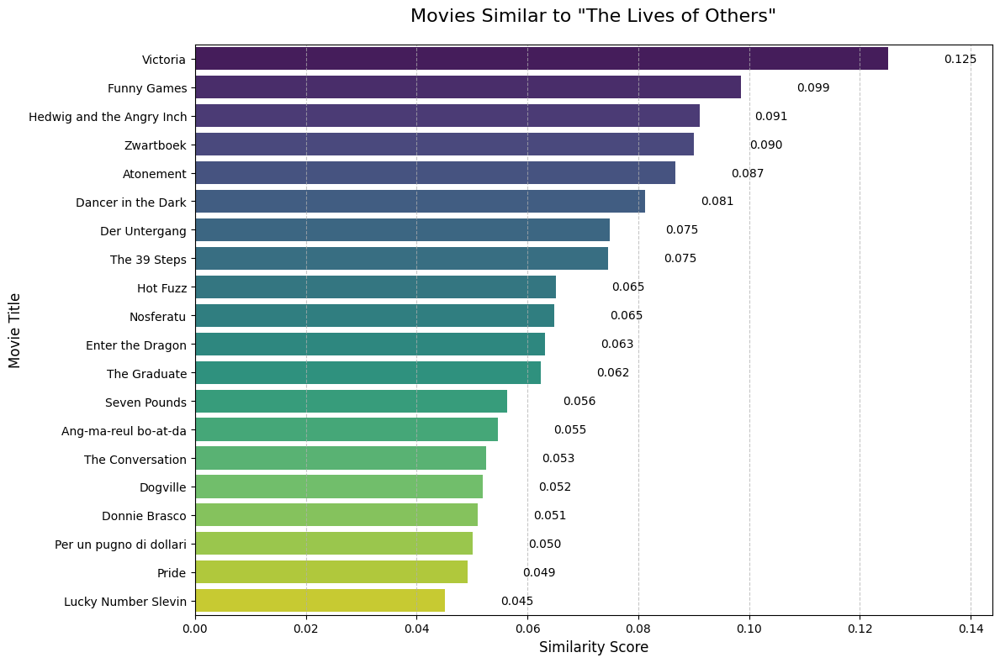

,Series_Title,Overview,Director,Star1,Star2,Star3,Similarity_Score
885,Victoria,A young Spanish woman who has recently moved t...,Sebastian Schipper,Laia Costa,Frederick Lau,Franz Rogowski,0.125172
958,Funny Games,"Two violent young men take a mother, father, a...",Michael Haneke,Susanne Lothar,Ulrich Mühe,Arno Frisch,0.098578
794,Hedwig and the Angry Inch,A gender-queer punk-rock singer from East Berl...,John Cameron Mitchell,John Cameron Mitchell,Miriam Shor,Stephen Trask,0.091052
772,Zwartboek,In the Nazi-occupied Netherlands during World ...,Paul Verhoeven,Carice van Houten,Sebastian Koch,Thom Hoffman,0.090081
620,Atonement,Thirteen-year-old fledgling writer Briony Tall...,Joe Wright,Keira Knightley,James McAvoy,Brenda Blethyn,0.086760
384,Dancer in the Dark,An East European girl travels to the United St...,Lars von Trier,Björk,Catherine Deneuve,David Morse,0.081309
157,Der Untergang,"Traudl Junge, the final secretary for Adolf Hi...",Oliver Hirschbiegel,Bruno Ganz,Alexandra Maria Lara,Ulrich Matthes,0.074888
999,The 39 Steps,A man in London tries to help a counter-espion...,Alfred Hitchcock,Robert Donat,Madeleine Carroll,Lucie Mannheim,0.074628
627,Hot Fuzz,A skilled London police officer is transferred...,Edgar Wright,Simon Pegg,Nick Frost,Martin Freeman,0.065167
568,Nosferatu,Vampire Count Orlok expresses interest in a ne...,F.W. Murnau,Max Schreck,Alexander Granach,Gustav von Wangenheim,0.064815


In [ ]:
run_movie_recommender(df, "The Lives of Others", 20)

In [ ]:
def get_optimal_recommendation(input_movie_name, df, siamese_network, tokenizer, model):
    """
    Compare recommendations from both approaches and return the first common movie
    or the top Siamese recommendation if there's no match.

    Parameters:
    input_movie_name (str): Movie title to get recommendations for
    df (pandas.DataFrame): DataFrame containing movie data
    siamese_network: The trained Siamese neural network
    tokenizer: BERT tokenizer for text processing
    model: BERT model for embeddings

    Returns:
    dict: Recommended movie information
    """
    # Get Siamese network recommendations
    siamese_recommendations = recommend_movies(input_movie_name, df, siamese_network, tokenizer, model)

    # Get content-based recommendations without visualization
    # Prepare features and calculate similarity
    similarity_matrix, indices = prepare_movie_features(df)
    content_based_recommendations = get_recommendations(input_movie_name, similarity_matrix, indices, df, top_n=20)

    # Extract movie titles from both recommendation sets
    siamese_titles = siamese_recommendations['Series_Title'].tolist()

    if isinstance(content_based_recommendations, pd.DataFrame):
        content_based_titles = content_based_recommendations['Series_Title'].tolist()
    else:
        # Handle the case where content-based returns an error message
        content_based_titles = []

    # Find common movies (excluding the input movie itself)
    common_movies = []
    for title in siamese_titles:
        if title in content_based_titles and title != input_movie_name:
            common_movies.append(title)

    # If there are common movies, return the first one
    if common_movies:
        # Get the similarity score from Siamese recommendations
        similarity = siamese_recommendations[siamese_recommendations['Series_Title'] == common_movies[0]]['Cosine Similarity'].values[0]
        return {
            "title": common_movies[0],
            "similarity_score": similarity,
            "source": "Both approaches"
        }

    # If no common movie exists, return the top Siamese recommendation (excluding the input movie)
    for title, similarity in zip(siamese_titles, siamese_recommendations['Cosine Similarity']):
        if title != input_movie_name:
            return {
                "title": title,
                "similarity_score": similarity,
                "source": "Siamese network"
            }

    # Fallback if nothing suitable found
    return None

# Example usage
if __name__ == "__main__":
    # Assume df, siamese_network, tokenizer, and model are already loaded
    movie_query = "The Lives of Others"

    recommendation = get_optimal_recommendation(movie_query, df, siamese_network, tokenizer, model)

    if recommendation:
        print(f"\nOptimal recommendation for '{movie_query}':")
        print(f"Recommended movie: {recommendation['title']}")
        print(f"Similarity score: {recommendation['similarity_score']:.4f}")
        print(f"Source: {recommendation['source']}")
    else:
        print(f"\nNo recommendations available for '{movie_query}'.")


Optimal recommendation for 'The Lives of Others':
Recommended movie: The Conversation
Similarity score: 0.9495
Source: Both approaches


Parsa Shirali

Top 20 movies similar to 'Mystic River':
                   Series_Title  Similarity_Score
            Million Dollar Baby          0.203958
  The Bridges of Madison County          0.188670
         The Outlaw Josey Wales          0.185808
                     Short Cuts          0.177911
                     Unforgiven          0.165079
       The Shawshank Redemption          0.154172
                    Gran Torino          0.135595
                    Stand by Me          0.128675
                      Apollo 13          0.126041
Il buono, il brutto, il cattivo          0.125882
           Escape from Alcatraz          0.122141
                       I Am Sam          0.120397
                    Dark Waters          0.110611
                    Frost/Nixon          0.108919
                       21 Grams          0.104275
     Per qualche dollaro in più          0.102972
              The Thin Red Line          0.102254
                 Kelly's Heroes          0.098565
         

<ipython-input-12-6f28ab141b3a>:128: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  ax = sns.barplot(


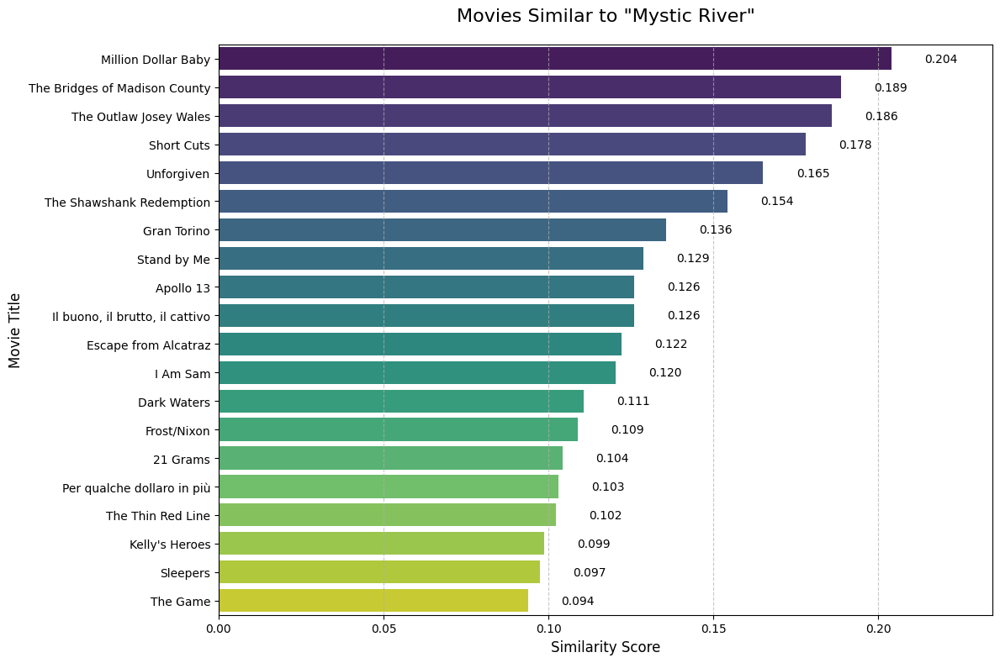

,Series_Title,Overview,Director,Star1,Star2,Star3,Similarity_Score
234,Million Dollar Baby,A determined woman works with a hardened boxin...,Clint Eastwood,Hilary Swank,Clint Eastwood,Morgan Freeman,0.203958
965,The Bridges of Madison County,Photographer Robert Kincaid wanders into the l...,Clint Eastwood,Clint Eastwood,Meryl Streep,Annie Corley,0.188670
691,The Outlaw Josey Wales,Missouri farmer Josey Wales joins a Confederat...,Clint Eastwood,Clint Eastwood,Sondra Locke,Chief Dan George,0.185808
817,Short Cuts,The day-to-day lives of several suburban Los A...,Robert Altman,Andie MacDowell,Julianne Moore,Tim Robbins,0.177911
167,Unforgiven,Retired Old West gunslinger William Munny relu...,Clint Eastwood,Clint Eastwood,Gene Hackman,Morgan Freeman,0.165079
0,The Shawshank Redemption,Two imprisoned men bond over a number of years...,Frank Darabont,Tim Robbins,Morgan Freeman,Bob Gunton,0.154172
225,Gran Torino,Disgruntled Korean War veteran Walt Kowalski s...,Clint Eastwood,Clint Eastwood,Bee Vang,Christopher Carley,0.135595
267,Stand by Me,"After the death of one of his friends, a write...",Rob Reiner,Wil Wheaton,River Phoenix,Corey Feldman,0.128675
966,Apollo 13,NASA must devise a strategy to return Apollo 1...,Ron Howard,Tom Hanks,Bill Paxton,Kevin Bacon,0.126041
12,"Il buono, il brutto, il cattivo",A bounty hunting scam joins two men in an unea...,Sergio Leone,Clint Eastwood,Eli Wallach,Lee Van Cleef,0.125882


In [ ]:
run_movie_recommender(df, "Mystic River", 20)

In [ ]:
# Example usage
input_movie_name = "Mystic River"
recommended_movies_df = recommend_movies(input_movie_name, df, siamese_network, tokenizer, model)
print(recommended_movies_df)

                       Series_Title  Cosine Similarity
0                      Mystic River           1.000000
1                        Inside Man           0.991328
2                      Contratiempo           0.986952
3                             Se7en           0.984735
4   The Girl with the Dragon Tattoo           0.981472
5                 Der Name der Rose           0.981045
6                              Rope           0.980497
7                        Wind River           0.980115
8                            Zodiac           0.977618
9                 The Hateful Eight           0.977503
10              Glengarry Glen Ross           0.973596
11              La migliore offerta           0.971683
12                        Prisoners           0.970804
13                      Le samouraï           0.968719
14                L.A. Confidential           0.968553
15              Anatomy of a Murder           0.967660
16                         Rashômon           0.967650
17        

In [ ]:
def get_optimal_recommendation(input_movie_name, df, siamese_network, tokenizer, model):
    """
    Compare recommendations from both approaches and return the first common movie
    or the top Siamese recommendation if there's no match.

    Parameters:
    input_movie_name (str): Movie title to get recommendations for
    df (pandas.DataFrame): DataFrame containing movie data
    siamese_network: The trained Siamese neural network
    tokenizer: BERT tokenizer for text processing
    model: BERT model for embeddings

    Returns:
    dict: Recommended movie information
    """
    # Get Siamese network recommendations
    siamese_recommendations = recommend_movies(input_movie_name, df, siamese_network, tokenizer, model)

    # Get content-based recommendations without visualization
    # Prepare features and calculate similarity
    similarity_matrix, indices = prepare_movie_features(df)
    content_based_recommendations = get_recommendations(input_movie_name, similarity_matrix, indices, df, top_n=20)

    # Extract movie titles from both recommendation sets
    siamese_titles = siamese_recommendations['Series_Title'].tolist()

    if isinstance(content_based_recommendations, pd.DataFrame):
        content_based_titles = content_based_recommendations['Series_Title'].tolist()
    else:
        # Handle the case where content-based returns an error message
        content_based_titles = []

    # Find common movies (excluding the input movie itself)
    common_movies = []
    for title in siamese_titles:
        if title in content_based_titles and title != input_movie_name:
            common_movies.append(title)

    # If there are common movies, return the first one
    if common_movies:
        # Get the similarity score from Siamese recommendations
        similarity = siamese_recommendations[siamese_recommendations['Series_Title'] == common_movies[0]]['Cosine Similarity'].values[0]
        return {
            "title": common_movies[0],
            "similarity_score": similarity,
            "source": "Both approaches"
        }

    # If no common movie exists, return the top Siamese recommendation (excluding the input movie)
    for title, similarity in zip(siamese_titles, siamese_recommendations['Cosine Similarity']):
        if title != input_movie_name:
            return {
                "title": title,
                "similarity_score": similarity,
                "source": "Siamese network"
            }

    # Fallback if nothing suitable found
    return None

# Example usage
if __name__ == "__main__":
    # Assume df, siamese_network, tokenizer, and model are already loaded
    movie_query = "Mystic River"

    recommendation = get_optimal_recommendation(movie_query, df, siamese_network, tokenizer, model)

    if recommendation:
        print(f"\nOptimal recommendation for '{movie_query}':")
        print(f"Recommended movie: {recommendation['title']}")
        print(f"Similarity score: {recommendation['similarity_score']:.4f}")
        print(f"Source: {recommendation['source']}")
    else:
        print(f"\nNo recommendations available for '{movie_query}'.")


Optimal recommendation for 'Mystic River':
Recommended movie: Inside Man
Similarity score: 0.9913
Source: Siamese network


Top 20 movies similar to 'Fargo':
                             Series_Title  Similarity_Score
                             Blood Simple          0.255154
                                True Grit          0.239733
               O Brother, Where Art Thou?          0.219445
                        Miller's Crossing          0.218678
                              Barton Fink          0.215036
                         The Big Lebowski          0.196387
                   No Country for Old Men          0.190868
Three Billboards Outside Ebbing, Missouri          0.097550
                      Mississippi Burning          0.093692
                                    Laura          0.066944
                   Hannah and Her Sisters          0.066262
                              Lord of War          0.065959
                            Roman Holiday          0.061355
                             Nightcrawler          0.054967
                               Badhaai ho          0.048781
      

<ipython-input-12-6f28ab141b3a>:128: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  ax = sns.barplot(


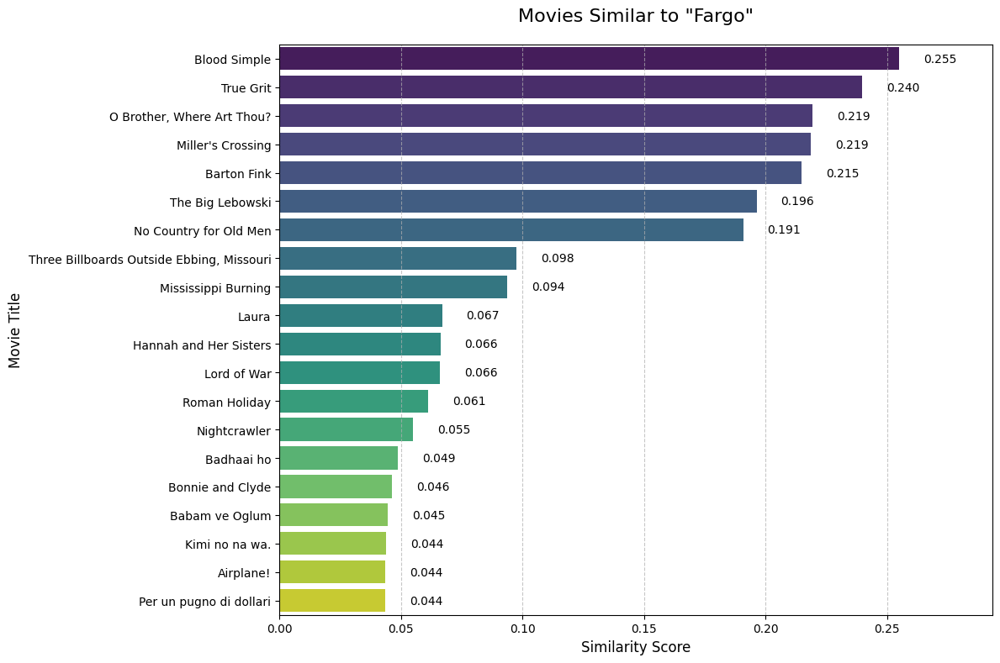

,Series_Title,Overview,Director,Star1,Star2,Star3,Similarity_Score
980,Blood Simple,The owner of a seedy small-town Texas bar disc...,Joel Coen,Ethan Coen,John Getz,Frances McDormand,0.255154
904,True Grit,A stubborn teenager enlists the help of a toug...,Ethan Coen,Joel Coen,Jeff Bridges,Matt Damon,0.239733
797,"O Brother, Where Art Thou?","In the deep south during the 1930s, three esca...",Joel Coen,Ethan Coen,George Clooney,John Turturro,0.219445
827,Miller's Crossing,"Tom Reagan, an advisor to a Prohibition-era cr...",Joel Coen,Ethan Coen,Gabriel Byrne,Albert Finney,0.218678
826,Barton Fink,A renowned New York playwright is enticed to C...,Joel Coen,Ethan Coen,John Turturro,John Goodman,0.215036
252,The Big Lebowski,"Jeff ""The Dude"" Lebowski, mistaken for a milli...",Joel Coen,Ethan Coen,Jeff Bridges,John Goodman,0.196387
232,No Country for Old Men,Violence and mayhem ensue after a hunter stumb...,Ethan Coen,Joel Coen,Tommy Lee Jones,Javier Bardem,0.190868
132,"Three Billboards Outside Ebbing, Missouri",A mother personally challenges the local autho...,Martin McDonagh,Frances McDormand,Woody Harrelson,Sam Rockwell,0.097550
676,Mississippi Burning,Two F.B.I. Agents with wildly different styles...,Alan Parker,Gene Hackman,Willem Dafoe,Frances McDormand,0.093692
453,Laura,A police detective falls in love with the woma...,Otto Preminger,Gene Tierney,Dana Andrews,Clifton Webb,0.066944


In [ ]:
run_movie_recommender(df, "Fargo", 20)

In [ ]:
# Example usage
input_movie_name = "Fargo"
recommended_movies_df = recommend_movies(input_movie_name, df, siamese_network, tokenizer, model)
print(recommended_movies_df)

                Series_Title  Cosine Similarity
0                      Fargo           1.000000
1               Training Day           0.980378
2               The Departed           0.979869
3                   Sleepers           0.977459
4   The Silence of the Lambs           0.977369
5                   21 Grams           0.976355
6                       Heat           0.974595
7                Funny Games           0.971632
8                      Joker           0.968398
9             Reservoir Dogs           0.968389
10         Miller's Crossing           0.966836
11              Nightcrawler           0.966298
12          The Untouchables           0.964523
13           Special Chabbis           0.962968
14             Carlito's Way           0.962223
15                     Crash           0.959492
16                  Drishyam           0.958523
17          Dead Man's Shoes           0.957477
18              Nueve reinas           0.950143
19                Lola rennt           0

In [ ]:
def get_optimal_recommendation(input_movie_name, df, siamese_network, tokenizer, model):
    """
    Compare recommendations from both approaches and return the first common movie
    or the top Siamese recommendation if there's no match.

    Parameters:
    input_movie_name (str): Movie title to get recommendations for
    df (pandas.DataFrame): DataFrame containing movie data
    siamese_network: The trained Siamese neural network
    tokenizer: BERT tokenizer for text processing
    model: BERT model for embeddings

    Returns:
    dict: Recommended movie information
    """
    # Get Siamese network recommendations
    siamese_recommendations = recommend_movies(input_movie_name, df, siamese_network, tokenizer, model)

    # Get content-based recommendations without visualization
    # Prepare features and calculate similarity
    similarity_matrix, indices = prepare_movie_features(df)
    content_based_recommendations = get_recommendations(input_movie_name, similarity_matrix, indices, df, top_n=20)

    # Extract movie titles from both recommendation sets
    siamese_titles = siamese_recommendations['Series_Title'].tolist()

    if isinstance(content_based_recommendations, pd.DataFrame):
        content_based_titles = content_based_recommendations['Series_Title'].tolist()
    else:
        # Handle the case where content-based returns an error message
        content_based_titles = []

    # Find common movies (excluding the input movie itself)
    common_movies = []
    for title in siamese_titles:
        if title in content_based_titles and title != input_movie_name:
            common_movies.append(title)

    # If there are common movies, return the first one
    if common_movies:
        # Get the similarity score from Siamese recommendations
        similarity = siamese_recommendations[siamese_recommendations['Series_Title'] == common_movies[0]]['Cosine Similarity'].values[0]
        return {
            "title": common_movies[0],
            "similarity_score": similarity,
            "source": "Both approaches"
        }

    # If no common movie exists, return the top Siamese recommendation (excluding the input movie)
    for title, similarity in zip(siamese_titles, siamese_recommendations['Cosine Similarity']):
        if title != input_movie_name:
            return {
                "title": title,
                "similarity_score": similarity,
                "source": "Siamese network"
            }

    # Fallback if nothing suitable found
    return None

# Example usage
if __name__ == "__main__":
    # Assume df, siamese_network, tokenizer, and model are already loaded
    movie_query = "Fargo"

    recommendation = get_optimal_recommendation(movie_query, df, siamese_network, tokenizer, model)

    if recommendation:
        print(f"\nOptimal recommendation for '{movie_query}':")
        print(f"Recommended movie: {recommendation['title']}")
        print(f"Similarity score: {recommendation['similarity_score']:.4f}")
        print(f"Source: {recommendation['source']}")
    else:
        print(f"\nNo recommendations available for '{movie_query}'.")


Optimal recommendation for 'Fargo':
Recommended movie: Miller's Crossing
Similarity score: 0.9668
Source: Both approaches


Amirhossein Ahmadi

In [ ]:
# Example usage
input_movie_name = "The Matrix"
recommended_movies_df = recommend_movies(input_movie_name, df, siamese_network, tokenizer, model)
print(recommended_movies_df)

                 Series_Title  Cosine Similarity
0                  The Matrix           1.000000
1  Terminator 2: Judgment Day           0.970288
2              The Terminator           0.961785


Top 20 movies similar to 'The Matrix':
                         Series_Title  Similarity_Score
      The Girl with the Dragon Tattoo          0.087218
                      Boyz n the Hood          0.076454
         Once Upon a Time in the West          0.073222
                            Spartacus          0.071563
Harry Potter and the Sorcerer's Stone          0.069570
                   Chung Hing sam lam          0.062461
                          Barton Fink          0.060813
                 Being John Malkovich          0.053900
                          Blue Velvet          0.050814
                      Brief Encounter          0.047406
                               Harvey          0.046162
                  The Boondock Saints          0.045713
                      The Truman Show          0.045358
                Män som hatar kvinnor          0.043898
       Dawn of the Planet of the Apes          0.042637
                                Ikiru          0.042283
         

<ipython-input-12-6f28ab141b3a>:128: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  ax = sns.barplot(


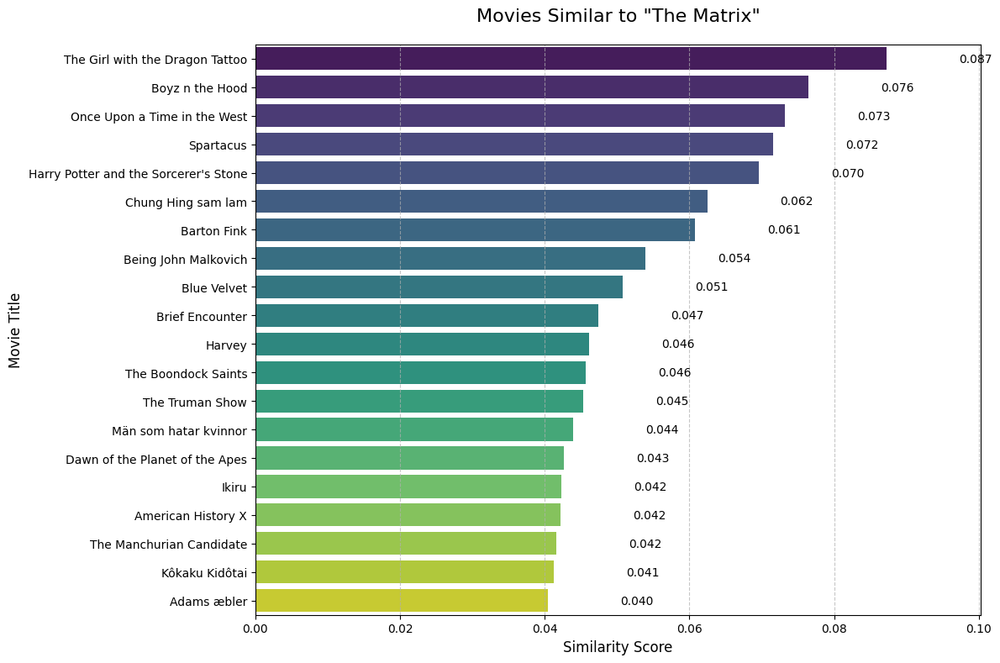

,Series_Title,Overview,Director,Star1,Star2,Star3,Similarity_Score
603,The Girl with the Dragon Tattoo,Journalist Mikael Blomkvist is aided in his se...,David Fincher,Daniel Craig,Rooney Mara,Christopher Plummer,0.087218
669,Boyz n the Hood,Follows the lives of three young males living ...,John Singleton,Cuba Gooding Jr.,Laurence Fishburne,Hudhail Al-Amir,0.076454
48,Once Upon a Time in the West,A mysterious stranger with a harmonica joins f...,Sergio Leone,Henry Fonda,Charles Bronson,Claudia Cardinale,0.073222
549,Spartacus,The slave Spartacus leads a violent revolt aga...,Stanley Kubrick,Kirk Douglas,Laurence Olivier,Jean Simmons,0.071563
947,Harry Potter and the Sorcerer's Stone,An orphaned boy enrolls in a school of wizardr...,Chris Columbus,Daniel Radcliffe,Rupert Grint,Richard Harris,0.069570
261,Chung Hing sam lam,Two melancholy Hong Kong policemen fall in lov...,Kar-Wai Wong,Brigitte Lin,Takeshi Kaneshiro,Tony Chiu-Wai Leung,0.062461
826,Barton Fink,A renowned New York playwright is enticed to C...,Joel Coen,Ethan Coen,John Turturro,John Goodman,0.060813
805,Being John Malkovich,A puppeteer discovers a portal that leads lite...,Spike Jonze,John Cusack,Cameron Diaz,Catherine Keener,0.053900
834,Blue Velvet,The discovery of a severed human ear found in ...,David Lynch,Isabella Rossellini,Kyle MacLachlan,Dennis Hopper,0.050814
452,Brief Encounter,"Meeting a stranger in a railway station, a wom...",David Lean,Celia Johnson,Trevor Howard,Stanley Holloway,0.047406


In [ ]:
run_movie_recommender(df, "The Matrix", 20)

In [ ]:
def get_optimal_recommendation(input_movie_name, df, siamese_network, tokenizer, model):
    """
    Compare recommendations from both approaches and return the first common movie
    or the top Siamese recommendation if there's no match.

    Parameters:
    input_movie_name (str): Movie title to get recommendations for
    df (pandas.DataFrame): DataFrame containing movie data
    siamese_network: The trained Siamese neural network
    tokenizer: BERT tokenizer for text processing
    model: BERT model for embeddings

    Returns:
    dict: Recommended movie information
    """
    # Get Siamese network recommendations
    siamese_recommendations = recommend_movies(input_movie_name, df, siamese_network, tokenizer, model)

    # Get content-based recommendations without visualization
    # Prepare features and calculate similarity
    similarity_matrix, indices = prepare_movie_features(df)
    content_based_recommendations = get_recommendations(input_movie_name, similarity_matrix, indices, df, top_n=20)

    # Extract movie titles from both recommendation sets
    siamese_titles = siamese_recommendations['Series_Title'].tolist()

    if isinstance(content_based_recommendations, pd.DataFrame):
        content_based_titles = content_based_recommendations['Series_Title'].tolist()
    else:
        # Handle the case where content-based returns an error message
        content_based_titles = []

    # Find common movies (excluding the input movie itself)
    common_movies = []
    for title in siamese_titles:
        if title in content_based_titles and title != input_movie_name:
            common_movies.append(title)

    # If there are common movies, return the first one
    if common_movies:
        # Get the similarity score from Siamese recommendations
        similarity = siamese_recommendations[siamese_recommendations['Series_Title'] == common_movies[0]]['Cosine Similarity'].values[0]
        return {
            "title": common_movies[0],
            "similarity_score": similarity,
            "source": "Both approaches"
        }

    # If no common movie exists, return the top Siamese recommendation (excluding the input movie)
    for title, similarity in zip(siamese_titles, siamese_recommendations['Cosine Similarity']):
        if title != input_movie_name:
            return {
                "title": title,
                "similarity_score": similarity,
                "source": "Siamese network"
            }

    # Fallback if nothing suitable found
    return None

# Example usage
if __name__ == "__main__":
    # Assume df, siamese_network, tokenizer, and model are already loaded
    movie_query = "The Matrix"

    recommendation = get_optimal_recommendation(movie_query, df, siamese_network, tokenizer, model)

    if recommendation:
        print(f"\nOptimal recommendation for '{movie_query}':")
        print(f"Recommended movie: {recommendation['title']}")
        print(f"Similarity score: {recommendation['similarity_score']:.4f}")
        print(f"Source: {recommendation['source']}")
    else:
        print(f"\nNo recommendations available for '{movie_query}'.")


Optimal recommendation for 'The Matrix':
Recommended movie: Terminator 2: Judgment Day
Similarity score: 0.9703
Source: Siamese network


Top 20 movies similar to 'Watchmen':
                       Series_Title  Similarity_Score
         X-Men: Days of Future Past          0.098610
                                300          0.096108
                          Andhadhun          0.075592
                              Giant          0.056300
                    The Incredibles          0.055838
                    The Sixth Sense          0.054799
       Batman: Mask of the Phantasm          0.051062
                            The Kid          0.048402
           The Peanut Butter Falcon          0.048014
                        The Hustler          0.046950
                        Blue Velvet          0.043787
Interstate 60: Episodes of the Road          0.042228
         Back to the Future Part II          0.041480
    Who's Afraid of Virginia Woolf?          0.040929
                  Midnight in Paris          0.039548
                 Dallas Buyers Club          0.039280
                               Moon          

<ipython-input-12-6f28ab141b3a>:128: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  ax = sns.barplot(


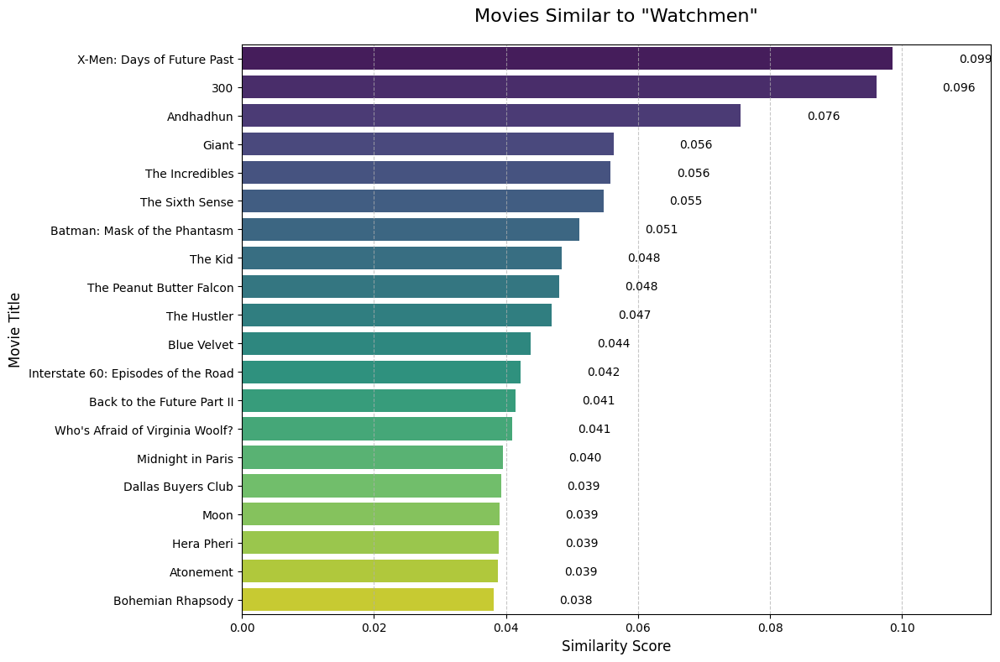

,Series_Title,Overview,Director,Star1,Star2,Star3,Similarity_Score
479,X-Men: Days of Future Past,The X-Men send Wolverine to the past in a desp...,Bryan Singer,Patrick Stewart,Ian McKellen,Hugh Jackman,0.098610
928,300,King Leonidas of Sparta and a force of 300 men...,Zack Snyder,Gerard Butler,Lena Headey,David Wenham,0.096108
86,Andhadhun,A series of mysterious events change the life ...,Sriram Raghavan,Ayushmann Khurrana,Tabu,Radhika Apte,0.075592
996,Giant,Sprawling epic covering the life of a Texas ca...,George Stevens,Elizabeth Taylor,Rock Hudson,James Dean,0.056300
378,The Incredibles,"A family of undercover superheroes, while tryi...",Brad Bird,Craig T. Nelson,Samuel L. Jackson,Holly Hunter,0.055838
248,The Sixth Sense,A boy who communicates with spirits seeks the ...,M. Night Shyamalan,Bruce Willis,Haley Joel Osment,Toni Collette,0.054799
665,Batman: Mask of the Phantasm,Batman is wrongly implicated in a series of mu...,Kevin Altieri,Boyd Kirkland,Frank Paur,Dan Riba,0.051062
127,The Kid,"The Tramp cares for an abandoned child, but ev...",Charles Chaplin,Charles Chaplin,Edna Purviance,Jackie Coogan,0.048402
884,The Peanut Butter Falcon,Zak runs away from his care home to make his d...,Tyler Nilson,Michael Schwartz,Zack Gottsagen,Ann Owens,0.048014
434,The Hustler,An up-and-coming pool player plays a long-time...,Robert Rossen,Paul Newman,Jackie Gleason,Piper Laurie,0.046950


In [ ]:
run_movie_recommender(df, "Watchmen", 20)

In [ ]:
# Example usage
input_movie_name = "Watchmen"
recommended_movies_df = recommend_movies(input_movie_name, df, siamese_network, tokenizer, model)
print(recommended_movies_df)

        Series_Title  Cosine Similarity
0           Watchmen           1.000000
1           The Game           0.989379
2            Seppuku           0.985796
3  Blade Runner 2049           0.980779
4           Oldeuboi           0.946780


In [ ]:
def get_optimal_recommendation(input_movie_name, df, siamese_network, tokenizer, model):
    """
    Compare recommendations from both approaches and return the first common movie
    or the top Siamese recommendation if there's no match.

    Parameters:
    input_movie_name (str): Movie title to get recommendations for
    df (pandas.DataFrame): DataFrame containing movie data
    siamese_network: The trained Siamese neural network
    tokenizer: BERT tokenizer for text processing
    model: BERT model for embeddings

    Returns:
    dict: Recommended movie information
    """
    # Get Siamese network recommendations
    siamese_recommendations = recommend_movies(input_movie_name, df, siamese_network, tokenizer, model)

    # Get content-based recommendations without visualization
    # Prepare features and calculate similarity
    similarity_matrix, indices = prepare_movie_features(df)
    content_based_recommendations = get_recommendations(input_movie_name, similarity_matrix, indices, df, top_n=20)

    # Extract movie titles from both recommendation sets
    siamese_titles = siamese_recommendations['Series_Title'].tolist()

    if isinstance(content_based_recommendations, pd.DataFrame):
        content_based_titles = content_based_recommendations['Series_Title'].tolist()
    else:
        # Handle the case where content-based returns an error message
        content_based_titles = []

    # Find common movies (excluding the input movie itself)
    common_movies = []
    for title in siamese_titles:
        if title in content_based_titles and title != input_movie_name:
            common_movies.append(title)

    # If there are common movies, return the first one
    if common_movies:
        # Get the similarity score from Siamese recommendations
        similarity = siamese_recommendations[siamese_recommendations['Series_Title'] == common_movies[0]]['Cosine Similarity'].values[0]
        return {
            "title": common_movies[0],
            "similarity_score": similarity,
            "source": "Both approaches"
        }

    # If no common movie exists, return the top Siamese recommendation (excluding the input movie)
    for title, similarity in zip(siamese_titles, siamese_recommendations['Cosine Similarity']):
        if title != input_movie_name:
            return {
                "title": title,
                "similarity_score": similarity,
                "source": "Siamese network"
            }

    # Fallback if nothing suitable found
    return None

# Example usage
if __name__ == "__main__":
    # Assume df, siamese_network, tokenizer, and model are already loaded
    movie_query = "Watchmen"

    recommendation = get_optimal_recommendation(movie_query, df, siamese_network, tokenizer, model)

    if recommendation:
        print(f"\nOptimal recommendation for '{movie_query}':")
        print(f"Recommended movie: {recommendation['title']}")
        print(f"Similarity score: {recommendation['similarity_score']:.4f}")
        print(f"Source: {recommendation['source']}")
    else:
        print(f"\nNo recommendations available for '{movie_query}'.")


Optimal recommendation for 'Watchmen':
Recommended movie: The Game
Similarity score: 0.9894
Source: Siamese network


Ali Biabangard

Top 20 movies similar to 'Zodiac':
              Series_Title  Similarity_Score
                 The Birds          0.149366
           Sherlock Holmes          0.104188
                     Se7en          0.093516
               Dirty Harry          0.093485
        Brokeback Mountain          0.089819
                  Badlands          0.085448
Captain America: Civil War          0.084000
       Catch Me If You Can          0.083478
              End of Watch          0.082244
            Shutter Island          0.080853
              The Avengers          0.078454
    Avengers: Infinity War          0.074823
                  Iron Man          0.073495
              A Bronx Tale          0.073312
                      Roma          0.072217
               October Sky          0.071629
              Nightcrawler          0.071595
               Dark Waters          0.071152
                 Prisoners          0.070495
                   Vertigo          0.069851


<ipython-input-11-6f28ab141b3a>:128: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  ax = sns.barplot(


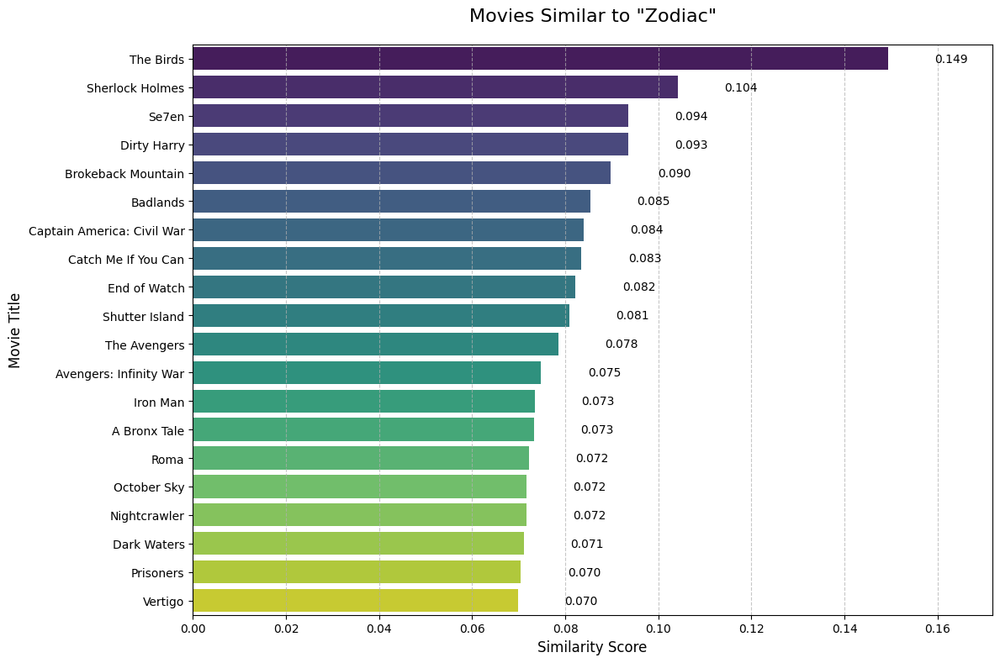

,Series_Title,Overview,Director,Star1,Star2,Star3,Similarity_Score
862,The Birds,A wealthy San Francisco socialite pursues a po...,Alfred Hitchcock,Rod Taylor,Tippi Hedren,Jessica Tandy,0.149366
914,Sherlock Holmes,Detective Sherlock Holmes and his stalwart par...,Guy Ritchie,Robert Downey Jr.,Jude Law,Rachel McAdams,0.104188
27,Se7en,"Two detectives, a rookie and a veteran, hunt a...",David Fincher,Morgan Freeman,Brad Pitt,Kevin Spacey,0.093516
853,Dirty Harry,"When a madman calling himself ""the Scorpio Kil...",Don Siegel,Clint Eastwood,Andrew Robinson,Harry Guardino,0.093485
773,Brokeback Mountain,The story of a forbidden and secretive relatio...,Ang Lee,Jake Gyllenhaal,Heath Ledger,Michelle Williams,0.089819
696,Badlands,An impressionable teenage girl from a dead-end...,Terrence Malick,Martin Sheen,Sissy Spacek,Warren Oates,0.085448
583,Captain America: Civil War,Political involvement in the Avengers' affairs...,Anthony Russo,Joe Russo,Chris Evans,Robert Downey Jr.,0.084000
243,Catch Me If You Can,"Barely 21 yet, Frank is a skilled forger who h...",Steven Spielberg,Leonardo DiCaprio,Tom Hanks,Christopher Walken,0.083478
901,End of Watch,"Shot documentary-style, this film follows the ...",David Ayer,Jake Gyllenhaal,Michael Peña,Anna Kendrick,0.082244
145,Shutter Island,"In 1954, a U.S. Marshal investigates the disap...",Martin Scorsese,Leonardo DiCaprio,Emily Mortimer,Mark Ruffalo,0.080853


In [ ]:
run_movie_recommender(df, "Zodiac", 20)

In [ ]:
# Example usage
input_movie_name = "Zodiac"
recommended_movies_df = recommend_movies(input_movie_name, df, siamese_network, tokenizer, model)
print(recommended_movies_df)

                       Series_Title  Cosine Similarity
0                            Zodiac           1.000000
1                 The Hateful Eight           0.990683
2   The Girl with the Dragon Tattoo           0.989685
3                      Mystic River           0.980573
4                 L.A. Confidential           0.978627
5          In the Heat of the Night           0.977979
6                        Inside Man           0.977947
7                 Der Name der Rose           0.976111
8                             Se7en           0.975809
9                        Wind River           0.969271
10              Glengarry Glen Ross           0.967277
11                        Prisoners           0.962710
12                   Gone Baby Gone           0.958425
13                Tengoku to jigoku           0.958390
14              La migliore offerta           0.957811
15            Män som hatar kvinnor           0.956179
16                      Primal Fear           0.955127
17        

In [ ]:
def get_optimal_recommendation(input_movie_name, df, siamese_network, tokenizer, model):
    """
    Compare recommendations from both approaches and return the first common movie
    or the top Siamese recommendation if there's no match.

    Parameters:
    input_movie_name (str): Movie title to get recommendations for
    df (pandas.DataFrame): DataFrame containing movie data
    siamese_network: The trained Siamese neural network
    tokenizer: BERT tokenizer for text processing
    model: BERT model for embeddings

    Returns:
    dict: Recommended movie information
    """
    # Get Siamese network recommendations
    siamese_recommendations = recommend_movies(input_movie_name, df, siamese_network, tokenizer, model)

    # Get content-based recommendations without visualization
    # Prepare features and calculate similarity
    similarity_matrix, indices = prepare_movie_features(df)
    content_based_recommendations = get_recommendations(input_movie_name, similarity_matrix, indices, df, top_n=20)

    # Extract movie titles from both recommendation sets
    siamese_titles = siamese_recommendations['Series_Title'].tolist()

    if isinstance(content_based_recommendations, pd.DataFrame):
        content_based_titles = content_based_recommendations['Series_Title'].tolist()
    else:
        # Handle the case where content-based returns an error message
        content_based_titles = []

    # Find common movies (excluding the input movie itself)
    common_movies = []
    for title in siamese_titles:
        if title in content_based_titles and title != input_movie_name:
            common_movies.append(title)

    # If there are common movies, return the first one
    if common_movies:
        # Get the similarity score from Siamese recommendations
        similarity = siamese_recommendations[siamese_recommendations['Series_Title'] == common_movies[0]]['Cosine Similarity'].values[0]
        return {
            "title": common_movies[0],
            "similarity_score": similarity,
            "source": "Both approaches"
        }

    # If no common movie exists, return the top Siamese recommendation (excluding the input movie)
    for title, similarity in zip(siamese_titles, siamese_recommendations['Cosine Similarity']):
        if title != input_movie_name:
            return {
                "title": title,
                "similarity_score": similarity,
                "source": "Siamese network"
            }

    # Fallback if nothing suitable found
    return None

# Example usage
if __name__ == "__main__":
    # Assume df, siamese_network, tokenizer, and model are already loaded
    movie_query = "Zodiac"

    recommendation = get_optimal_recommendation(movie_query, df, siamese_network, tokenizer, model)

    if recommendation:
        print(f"\nOptimal recommendation for '{movie_query}':")
        print(f"Recommended movie: {recommendation['title']}")
        print(f"Similarity score: {recommendation['similarity_score']:.4f}")
        print(f"Source: {recommendation['source']}")
    else:
        print(f"\nNo recommendations available for '{movie_query}'.")


Optimal recommendation for 'Zodiac':
Recommended movie: Se7en
Similarity score: 0.9758
Source: Both approaches


In [ ]:
# Example usage
input_movie_name = "Goodfellas"
recommended_movies_df = recommend_movies(input_movie_name, df, siamese_network, tokenizer, model)
print(recommended_movies_df)

                          Series_Title  Cosine Similarity
0                           Goodfellas           1.000000
1                                 Blow           0.974221
2                            Spotlight           0.965011
3   Butch Cassidy and the Sundance Kid           0.952520
4                             Papillon           0.949864
5                              Serpico           0.946267
6                    Dog Day Afternoon           0.945698
7                        Donnie Brasco           0.938288
8                     Midnight Express           0.937703
9            In the Name of the Father           0.937032
10                 Catch Me If You Can           0.923271
11             The Wolf of Wall Street           0.912219
12                        The Irishman           0.910832
13                   American Gangster           0.908196
14                          Changeling           0.905067
15                          Just Mercy           0.899864


Top 20 movies similar to 'Goodfellas':
                      Series_Title  Similarity_Score
                      The Irishman          0.240554
                       Raging Bull          0.211900
           The Wolf of Wall Street          0.176876
                         The Sting          0.146092
                            Casino          0.136774
            The Godfather: Part II          0.132277
                      A Bronx Tale          0.096597
                        Green Book          0.094380
                The King of Comedy          0.091585
                      Pulp Fiction          0.090701
                     Donnie Brasco          0.086807
                    On Golden Pond          0.086375
                 Dial M for Murder          0.083752
                         In Bruges          0.079236
                       Taxi Driver          0.079154
Butch Cassidy and the Sundance Kid          0.078235
                          Le passé          0.076517
       

<ipython-input-11-6f28ab141b3a>:128: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  ax = sns.barplot(


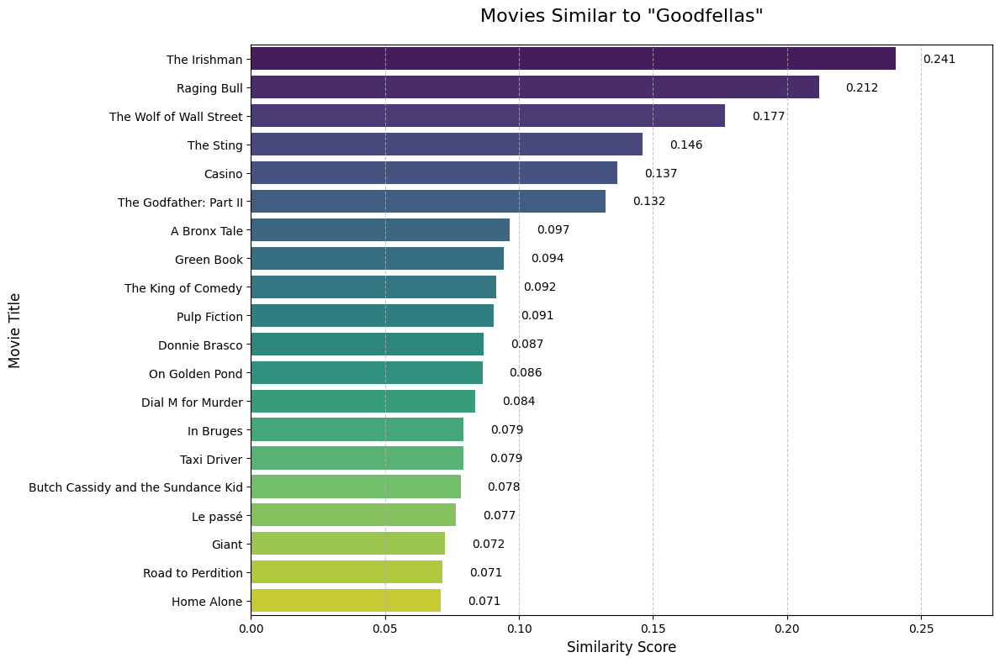

,Series_Title,Overview,Director,Star1,Star2,Star3,Similarity_Score
484,The Irishman,An old man recalls his time painting houses fo...,Martin Scorsese,Robert De Niro,Al Pacino,Joe Pesci,0.240554
173,Raging Bull,"The life of boxer Jake LaMotta, whose violence...",Martin Scorsese,Robert De Niro,Cathy Moriarty,Joe Pesci,0.211900
147,The Wolf of Wall Street,"Based on the true story of Jordan Belfort, fro...",Martin Scorsese,Leonardo DiCaprio,Jonah Hill,Margot Robbie,0.176876
112,The Sting,Two grifters team up to pull off the ultimate ...,George Roy Hill,Paul Newman,Robert Redford,Robert Shaw,0.146092
165,Casino,"A tale of greed, deception, money, power, and ...",Martin Scorsese,Robert De Niro,Sharon Stone,Joe Pesci,0.136774
3,The Godfather: Part II,The early life and career of Vito Corleone in ...,Francis Ford Coppola,Al Pacino,Robert De Niro,Robert Duvall,0.132277
664,A Bronx Tale,A father becomes worried when a local gangster...,Robert De Niro,Robert De Niro,Chazz Palminteri,Lillo Brancato,0.096597
131,Green Book,A working-class Italian-American bouncer becom...,Peter Farrelly,Viggo Mortensen,Mahershala Ali,Linda Cardellini,0.094380
687,The King of Comedy,Rupert Pupkin is a passionate yet unsuccessful...,Martin Scorsese,Robert De Niro,Jerry Lewis,Diahnne Abbott,0.091585
6,Pulp Fiction,"The lives of two mob hitmen, a boxer, a gangst...",Quentin Tarantino,John Travolta,Uma Thurman,Samuel L. Jackson,0.090701


In [ ]:
run_movie_recommender(df, "Goodfellas", 20)

In [ ]:
def get_optimal_recommendation(input_movie_name, df, siamese_network, tokenizer, model):
    """
    Compare recommendations from both approaches and return the first common movie
    or the top Siamese recommendation if there's no match.

    Parameters:
    input_movie_name (str): Movie title to get recommendations for
    df (pandas.DataFrame): DataFrame containing movie data
    siamese_network: The trained Siamese neural network
    tokenizer: BERT tokenizer for text processing
    model: BERT model for embeddings

    Returns:
    dict: Recommended movie information
    """
    # Get Siamese network recommendations
    siamese_recommendations = recommend_movies(input_movie_name, df, siamese_network, tokenizer, model)

    # Get content-based recommendations without visualization
    # Prepare features and calculate similarity
    similarity_matrix, indices = prepare_movie_features(df)
    content_based_recommendations = get_recommendations(input_movie_name, similarity_matrix, indices, df, top_n=20)

    # Extract movie titles from both recommendation sets
    siamese_titles = siamese_recommendations['Series_Title'].tolist()

    if isinstance(content_based_recommendations, pd.DataFrame):
        content_based_titles = content_based_recommendations['Series_Title'].tolist()
    else:
        # Handle the case where content-based returns an error message
        content_based_titles = []

    # Find common movies (excluding the input movie itself)
    common_movies = []
    for title in siamese_titles:
        if title in content_based_titles and title != input_movie_name:
            common_movies.append(title)

    # If there are common movies, return the first one
    if common_movies:
        # Get the similarity score from Siamese recommendations
        similarity = siamese_recommendations[siamese_recommendations['Series_Title'] == common_movies[0]]['Cosine Similarity'].values[0]
        return {
            "title": common_movies[0],
            "similarity_score": similarity,
            "source": "Both approaches"
        }

    # If no common movie exists, return the top Siamese recommendation (excluding the input movie)
    for title, similarity in zip(siamese_titles, siamese_recommendations['Cosine Similarity']):
        if title != input_movie_name:
            return {
                "title": title,
                "similarity_score": similarity,
                "source": "Siamese network"
            }

    # Fallback if nothing suitable found
    return None

# Example usage
if __name__ == "__main__":
    # Assume df, siamese_network, tokenizer, and model are already loaded
    movie_query = "Goodfellas"

    recommendation = get_optimal_recommendation(movie_query, df, siamese_network, tokenizer, model)

    if recommendation:
        print(f"\nOptimal recommendation for '{movie_query}':")
        print(f"Recommended movie: {recommendation['title']}")
        print(f"Similarity score: {recommendation['similarity_score']:.4f}")
        print(f"Source: {recommendation['source']}")
    else:
        print(f"\nNo recommendations available for '{movie_query}'.")


Optimal recommendation for 'Goodfellas':
Recommended movie: Butch Cassidy and the Sundance Kid
Similarity score: 0.9525
Source: Both approaches


Amin Rafiee

Top 20 movies similar to 'Mystic River':
                   Series_Title  Similarity_Score
            Million Dollar Baby          0.203958
  The Bridges of Madison County          0.188670
         The Outlaw Josey Wales          0.185808
                     Short Cuts          0.177911
                     Unforgiven          0.165079
       The Shawshank Redemption          0.154172
                    Gran Torino          0.135595
                    Stand by Me          0.128675
                      Apollo 13          0.126041
Il buono, il brutto, il cattivo          0.125882
           Escape from Alcatraz          0.122141
                       I Am Sam          0.120397
                    Dark Waters          0.110611
                    Frost/Nixon          0.108919
                       21 Grams          0.104275
     Per qualche dollaro in più          0.102972
              The Thin Red Line          0.102254
                 Kelly's Heroes          0.098565
         

<ipython-input-11-6f28ab141b3a>:128: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  ax = sns.barplot(


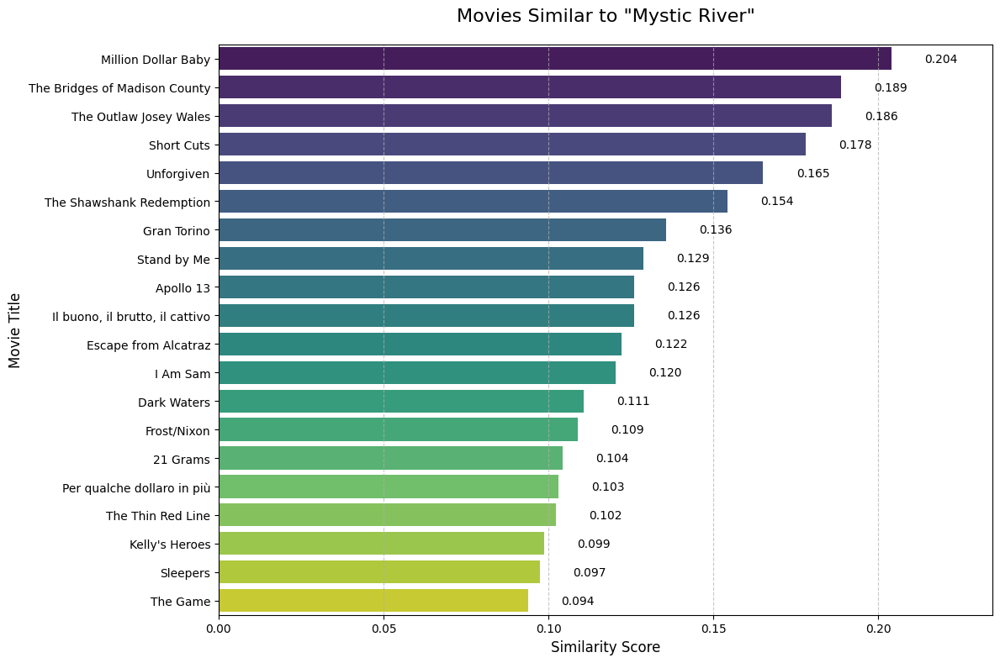

,Series_Title,Overview,Director,Star1,Star2,Star3,Similarity_Score
234,Million Dollar Baby,A determined woman works with a hardened boxin...,Clint Eastwood,Hilary Swank,Clint Eastwood,Morgan Freeman,0.203958
965,The Bridges of Madison County,Photographer Robert Kincaid wanders into the l...,Clint Eastwood,Clint Eastwood,Meryl Streep,Annie Corley,0.188670
691,The Outlaw Josey Wales,Missouri farmer Josey Wales joins a Confederat...,Clint Eastwood,Clint Eastwood,Sondra Locke,Chief Dan George,0.185808
817,Short Cuts,The day-to-day lives of several suburban Los A...,Robert Altman,Andie MacDowell,Julianne Moore,Tim Robbins,0.177911
167,Unforgiven,Retired Old West gunslinger William Munny relu...,Clint Eastwood,Clint Eastwood,Gene Hackman,Morgan Freeman,0.165079
0,The Shawshank Redemption,Two imprisoned men bond over a number of years...,Frank Darabont,Tim Robbins,Morgan Freeman,Bob Gunton,0.154172
225,Gran Torino,Disgruntled Korean War veteran Walt Kowalski s...,Clint Eastwood,Clint Eastwood,Bee Vang,Christopher Carley,0.135595
267,Stand by Me,"After the death of one of his friends, a write...",Rob Reiner,Wil Wheaton,River Phoenix,Corey Feldman,0.128675
966,Apollo 13,NASA must devise a strategy to return Apollo 1...,Ron Howard,Tom Hanks,Bill Paxton,Kevin Bacon,0.126041
12,"Il buono, il brutto, il cattivo",A bounty hunting scam joins two men in an unea...,Sergio Leone,Clint Eastwood,Eli Wallach,Lee Van Cleef,0.125882


In [ ]:
run_movie_recommender(df, "Mystic River", 20)

In [ ]:
# Example usage
input_movie_name = "Mystic River"
recommended_movies_df = recommend_movies(input_movie_name, df, siamese_network, tokenizer, model)
print(recommended_movies_df)

                       Series_Title  Cosine Similarity
0                      Mystic River           1.000000
1                             Se7en           0.989764
2                        Inside Man           0.977117
3                    Gone Baby Gone           0.964034
4                 The Hateful Eight           0.958636
5                              Rope           0.955617
6               La migliore offerta           0.954128
7                            Zodiac           0.949931
8   The Girl with the Dragon Tattoo           0.949642
9               Glengarry Glen Ross           0.948767
10                Der Name der Rose           0.948276
11                      Le samouraï           0.945841
12                   Salinui chueok           0.945756
13                L.A. Confidential           0.944514
14              Anatomy of a Murder           0.942394
15         In the Heat of the Night           0.939664
16      Witness for the Prosecution           0.938521
17        

In [ ]:
def get_optimal_recommendation(input_movie_name, df, siamese_network, tokenizer, model):
    """
    Compare recommendations from both approaches and return the first common movie
    or the top Siamese recommendation if there's no match.

    Parameters:
    input_movie_name (str): Movie title to get recommendations for
    df (pandas.DataFrame): DataFrame containing movie data
    siamese_network: The trained Siamese neural network
    tokenizer: BERT tokenizer for text processing
    model: BERT model for embeddings

    Returns:
    dict: Recommended movie information
    """
    # Get Siamese network recommendations
    siamese_recommendations = recommend_movies(input_movie_name, df, siamese_network, tokenizer, model)

    # Get content-based recommendations without visualization
    # Prepare features and calculate similarity
    similarity_matrix, indices = prepare_movie_features(df)
    content_based_recommendations = get_recommendations(input_movie_name, similarity_matrix, indices, df, top_n=20)

    # Extract movie titles from both recommendation sets
    siamese_titles = siamese_recommendations['Series_Title'].tolist()

    if isinstance(content_based_recommendations, pd.DataFrame):
        content_based_titles = content_based_recommendations['Series_Title'].tolist()
    else:
        # Handle the case where content-based returns an error message
        content_based_titles = []

    # Find common movies (excluding the input movie itself)
    common_movies = []
    for title in siamese_titles:
        if title in content_based_titles and title != input_movie_name:
            common_movies.append(title)

    # If there are common movies, return the first one
    if common_movies:
        # Get the similarity score from Siamese recommendations
        similarity = siamese_recommendations[siamese_recommendations['Series_Title'] == common_movies[0]]['Cosine Similarity'].values[0]
        return {
            "title": common_movies[0],
            "similarity_score": similarity,
            "source": "Both approaches"
        }

    # If no common movie exists, return the top Siamese recommendation (excluding the input movie)
    for title, similarity in zip(siamese_titles, siamese_recommendations['Cosine Similarity']):
        if title != input_movie_name:
            return {
                "title": title,
                "similarity_score": similarity,
                "source": "Siamese network"
            }

    # Fallback if nothing suitable found
    return None

# Example usage
if __name__ == "__main__":
    # Assume df, siamese_network, tokenizer, and model are already loaded
    movie_query = "Mystic River"

    recommendation = get_optimal_recommendation(movie_query, df, siamese_network, tokenizer, model)

    if recommendation:
        print(f"\nOptimal recommendation for '{movie_query}':")
        print(f"Recommended movie: {recommendation['title']}")
        print(f"Similarity score: {recommendation['similarity_score']:.4f}")
        print(f"Source: {recommendation['source']}")
    else:
        print(f"\nNo recommendations available for '{movie_query}'.")


Optimal recommendation for 'Mystic River':
Recommended movie: Se7en
Similarity score: 0.9898
Source: Siamese network


Top 20 movies similar to 'Goodfellas':
                      Series_Title  Similarity_Score
                      The Irishman          0.240554
                       Raging Bull          0.211900
           The Wolf of Wall Street          0.176876
                         The Sting          0.146092
                            Casino          0.136774
            The Godfather: Part II          0.132277
                      A Bronx Tale          0.096597
                        Green Book          0.094380
                The King of Comedy          0.091585
                      Pulp Fiction          0.090701
                     Donnie Brasco          0.086807
                    On Golden Pond          0.086375
                 Dial M for Murder          0.083752
                         In Bruges          0.079236
                       Taxi Driver          0.079154
Butch Cassidy and the Sundance Kid          0.078235
                          Le passé          0.076517
       

<ipython-input-11-6f28ab141b3a>:128: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  ax = sns.barplot(


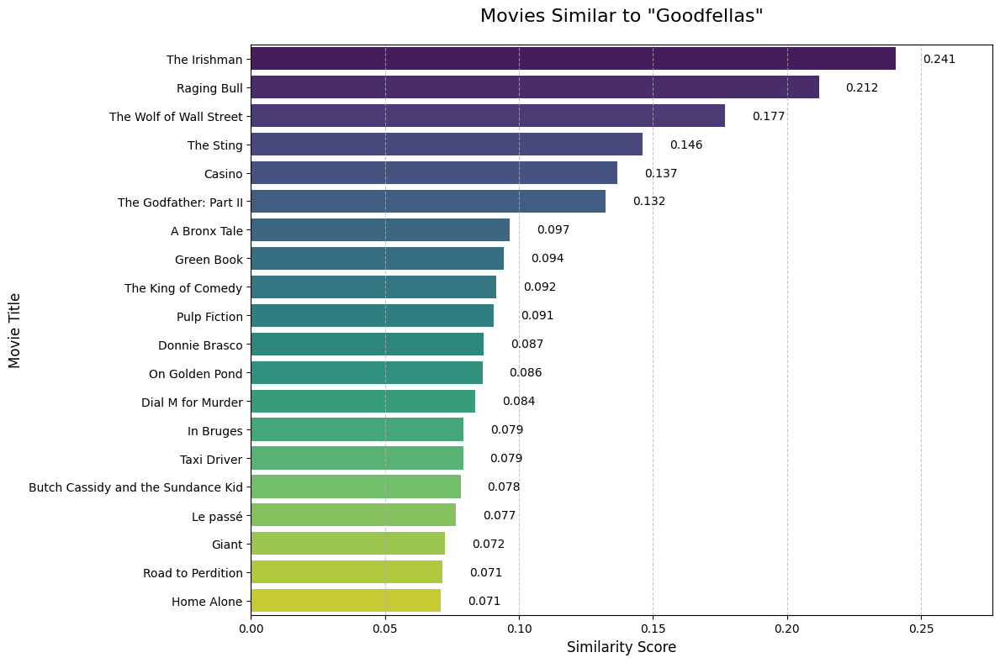

,Series_Title,Overview,Director,Star1,Star2,Star3,Similarity_Score
484,The Irishman,An old man recalls his time painting houses fo...,Martin Scorsese,Robert De Niro,Al Pacino,Joe Pesci,0.240554
173,Raging Bull,"The life of boxer Jake LaMotta, whose violence...",Martin Scorsese,Robert De Niro,Cathy Moriarty,Joe Pesci,0.211900
147,The Wolf of Wall Street,"Based on the true story of Jordan Belfort, fro...",Martin Scorsese,Leonardo DiCaprio,Jonah Hill,Margot Robbie,0.176876
112,The Sting,Two grifters team up to pull off the ultimate ...,George Roy Hill,Paul Newman,Robert Redford,Robert Shaw,0.146092
165,Casino,"A tale of greed, deception, money, power, and ...",Martin Scorsese,Robert De Niro,Sharon Stone,Joe Pesci,0.136774
3,The Godfather: Part II,The early life and career of Vito Corleone in ...,Francis Ford Coppola,Al Pacino,Robert De Niro,Robert Duvall,0.132277
664,A Bronx Tale,A father becomes worried when a local gangster...,Robert De Niro,Robert De Niro,Chazz Palminteri,Lillo Brancato,0.096597
131,Green Book,A working-class Italian-American bouncer becom...,Peter Farrelly,Viggo Mortensen,Mahershala Ali,Linda Cardellini,0.094380
687,The King of Comedy,Rupert Pupkin is a passionate yet unsuccessful...,Martin Scorsese,Robert De Niro,Jerry Lewis,Diahnne Abbott,0.091585
6,Pulp Fiction,"The lives of two mob hitmen, a boxer, a gangst...",Quentin Tarantino,John Travolta,Uma Thurman,Samuel L. Jackson,0.090701


In [ ]:
run_movie_recommender(df, "Goodfellas", 20)

In [ ]:
# Example usage
input_movie_name = "Goodfellas"
recommended_movies_df = recommend_movies(input_movie_name, df, siamese_network, tokenizer, model)
print(recommended_movies_df)

                          Series_Title  Cosine Similarity
0                           Goodfellas           1.000000
1                           Changeling           0.948662
2                                 Blow           0.946348
3                    Dog Day Afternoon           0.945818
4                  Catch Me If You Can           0.920232
5                              Serpico           0.916406
6   Butch Cassidy and the Sundance Kid           0.908900
7                    American Gangster           0.905091
8            In the Name of the Father           0.904257
9                        Donnie Brasco           0.900618
10             The Wolf of Wall Street           0.895416
11                    Midnight Express           0.894604
12                        The Irishman           0.882185
13                            Papillon           0.876566
14                          Just Mercy           0.845390
15                           Spotlight           0.820366


In [ ]:
def get_optimal_recommendation(input_movie_name, df, siamese_network, tokenizer, model):
    """
    Compare recommendations from both approaches and return the first common movie
    or the top Siamese recommendation if there's no match.

    Parameters:
    input_movie_name (str): Movie title to get recommendations for
    df (pandas.DataFrame): DataFrame containing movie data
    siamese_network: The trained Siamese neural network
    tokenizer: BERT tokenizer for text processing
    model: BERT model for embeddings

    Returns:
    dict: Recommended movie information
    """
    # Get Siamese network recommendations
    siamese_recommendations = recommend_movies(input_movie_name, df, siamese_network, tokenizer, model)

    # Get content-based recommendations without visualization
    # Prepare features and calculate similarity
    similarity_matrix, indices = prepare_movie_features(df)
    content_based_recommendations = get_recommendations(input_movie_name, similarity_matrix, indices, df, top_n=20)

    # Extract movie titles from both recommendation sets
    siamese_titles = siamese_recommendations['Series_Title'].tolist()

    if isinstance(content_based_recommendations, pd.DataFrame):
        content_based_titles = content_based_recommendations['Series_Title'].tolist()
    else:
        # Handle the case where content-based returns an error message
        content_based_titles = []

    # Find common movies (excluding the input movie itself)
    common_movies = []
    for title in siamese_titles:
        if title in content_based_titles and title != input_movie_name:
            common_movies.append(title)

    # If there are common movies, return the first one
    if common_movies:
        # Get the similarity score from Siamese recommendations
        similarity = siamese_recommendations[siamese_recommendations['Series_Title'] == common_movies[0]]['Cosine Similarity'].values[0]
        return {
            "title": common_movies[0],
            "similarity_score": similarity,
            "source": "Both approaches"
        }

    # If no common movie exists, return the top Siamese recommendation (excluding the input movie)
    for title, similarity in zip(siamese_titles, siamese_recommendations['Cosine Similarity']):
        if title != input_movie_name:
            return {
                "title": title,
                "similarity_score": similarity,
                "source": "Siamese network"
            }

    # Fallback if nothing suitable found
    return None

# Example usage
if __name__ == "__main__":
    # Assume df, siamese_network, tokenizer, and model are already loaded
    movie_query = "Goodfellas"

    recommendation = get_optimal_recommendation(movie_query, df, siamese_network, tokenizer, model)

    if recommendation:
        print(f"\nOptimal recommendation for '{movie_query}':")
        print(f"Recommended movie: {recommendation['title']}")
        print(f"Similarity score: {recommendation['similarity_score']:.4f}")
        print(f"Source: {recommendation['source']}")
    else:
        print(f"\nNo recommendations available for '{movie_query}'.")


Optimal recommendation for 'Goodfellas':
Recommended movie: Butch Cassidy and the Sundance Kid
Similarity score: 0.9089
Source: Both approaches


Mohammad hossein sameti

Top 20 movies similar to 'Donnie Darko':
           Series_Title  Similarity_Score
     Brokeback Mountain          0.097099
           Nightcrawler          0.089177
        Minority Report          0.083788
    Singin' in the Rain          0.081542
  Judgment at Nuremberg          0.078034
            October Sky          0.077434
              Prisoners          0.076208
     Dances with Wolves          0.075968
           End of Watch          0.071171
                 Zodiac          0.066398
  Rebel Without a Cause          0.057678
                 Harvey          0.056403
           Philadelphia          0.053505
               Drishyam          0.052112
              Repulsion          0.051666
      Where Eagles Dare          0.051063
              Stalag 17          0.050482
Who Framed Roger Rabbit          0.050449
              True Grit          0.050102
       The Intouchables          0.049683


<ipython-input-11-6f28ab141b3a>:128: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  ax = sns.barplot(


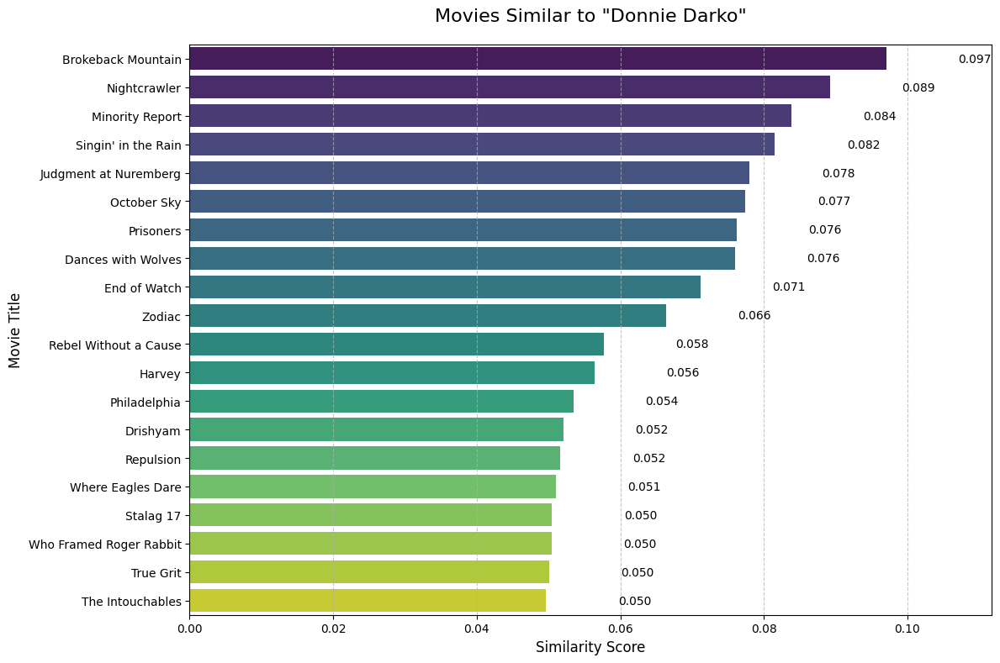

,Series_Title,Overview,Director,Star1,Star2,Star3,Similarity_Score
773,Brokeback Mountain,The story of a forbidden and secretive relatio...,Ang Lee,Jake Gyllenhaal,Heath Ledger,Michelle Williams,0.097099
474,Nightcrawler,"When Louis Bloom, a con man desperate for work...",Dan Gilroy,Jake Gyllenhaal,Rene Russo,Bill Paxton,0.089177
951,Minority Report,In a future where a special police unit is abl...,Steven Spielberg,Tom Cruise,Colin Farrell,Samantha Morton,0.083788
120,Singin' in the Rain,A silent film production company and cast make...,Stanley Donen,Gene Kelly,Gene Kelly,Donald O'Connor,0.081542
182,Judgment at Nuremberg,"In 1948, an American court in occupied Germany...",Stanley Kramer,Spencer Tracy,Burt Lancaster,Richard Widmark,0.078034
650,October Sky,"The true story of Homer Hickam, a coal miner's...",Joe Johnston,Jake Gyllenhaal,Chris Cooper,Laura Dern,0.077434
222,Prisoners,When Keller Dover's daughter and her friend go...,Denis Villeneuve,Hugh Jackman,Jake Gyllenhaal,Viola Davis,0.076208
402,Dances with Wolves,"Lieutenant John Dunbar, assigned to a remote w...",Kevin Costner,Kevin Costner,Mary McDonnell,Graham Greene,0.075968
901,End of Watch,"Shot documentary-style, this film follows the ...",David Ayer,Jake Gyllenhaal,Michael Peña,Anna Kendrick,0.071171
767,Zodiac,"In the late 1960s/early 1970s, a San Francisco...",David Fincher,Jake Gyllenhaal,Robert Downey Jr.,Mark Ruffalo,0.066398


In [ ]:
run_movie_recommender(df, "Donnie Darko", 20)

In [ ]:
# Example usage
input_movie_name = "Donnie Darko"
recommended_movies_df = recommend_movies(input_movie_name, df, siamese_network, tokenizer, model)
print(recommended_movies_df)

    Series_Title  Cosine Similarity
0   Donnie Darko           1.000000
1   The Prestige           0.942647
2           Moon           0.928128
3        Solaris           0.926585
4  Abre los ojos           0.925202


In [ ]:
def get_optimal_recommendation(input_movie_name, df, siamese_network, tokenizer, model):
    """
    Compare recommendations from both approaches and return the first common movie
    or the top Siamese recommendation if there's no match.

    Parameters:
    input_movie_name (str): Movie title to get recommendations for
    df (pandas.DataFrame): DataFrame containing movie data
    siamese_network: The trained Siamese neural network
    tokenizer: BERT tokenizer for text processing
    model: BERT model for embeddings

    Returns:
    dict: Recommended movie information
    """
    # Get Siamese network recommendations
    siamese_recommendations = recommend_movies(input_movie_name, df, siamese_network, tokenizer, model)

    # Get content-based recommendations without visualization
    # Prepare features and calculate similarity
    similarity_matrix, indices = prepare_movie_features(df)
    content_based_recommendations = get_recommendations(input_movie_name, similarity_matrix, indices, df, top_n=20)

    # Extract movie titles from both recommendation sets
    siamese_titles = siamese_recommendations['Series_Title'].tolist()

    if isinstance(content_based_recommendations, pd.DataFrame):
        content_based_titles = content_based_recommendations['Series_Title'].tolist()
    else:
        # Handle the case where content-based returns an error message
        content_based_titles = []

    # Find common movies (excluding the input movie itself)
    common_movies = []
    for title in siamese_titles:
        if title in content_based_titles and title != input_movie_name:
            common_movies.append(title)

    # If there are common movies, return the first one
    if common_movies:
        # Get the similarity score from Siamese recommendations
        similarity = siamese_recommendations[siamese_recommendations['Series_Title'] == common_movies[0]]['Cosine Similarity'].values[0]
        return {
            "title": common_movies[0],
            "similarity_score": similarity,
            "source": "Both approaches"
        }

    # If no common movie exists, return the top Siamese recommendation (excluding the input movie)
    for title, similarity in zip(siamese_titles, siamese_recommendations['Cosine Similarity']):
        if title != input_movie_name:
            return {
                "title": title,
                "similarity_score": similarity,
                "source": "Siamese network"
            }

    # Fallback if nothing suitable found
    return None

# Example usage
if __name__ == "__main__":
    # Assume df, siamese_network, tokenizer, and model are already loaded
    movie_query = "Donnie Darko"

    recommendation = get_optimal_recommendation(movie_query, df, siamese_network, tokenizer, model)

    if recommendation:
        print(f"\nOptimal recommendation for '{movie_query}':")
        print(f"Recommended movie: {recommendation['title']}")
        print(f"Similarity score: {recommendation['similarity_score']:.4f}")
        print(f"Source: {recommendation['source']}")
    else:
        print(f"\nNo recommendations available for '{movie_query}'.")


Optimal recommendation for 'Donnie Darko':
Recommended movie: The Prestige
Similarity score: 0.9426
Source: Siamese network


Top 20 movies similar to 'Se7en':
                       Series_Title  Similarity_Score
The Curious Case of Benjamin Button          0.168024
                         Fight Club          0.153059
                     Gone Baby Gone          0.145515
                                Saw          0.135937
           The Silence of the Lambs          0.123957
                           Sleepers          0.100421
                Million Dollar Baby          0.099726
                             Zodiac          0.093516
                    American Beauty          0.092339
               Ang-ma-reul bo-at-da          0.092185
           The Shawshank Redemption          0.091356
                     Ocean's Eleven          0.086709
          The Count of Monte Cristo          0.085735
                               Jaws          0.082890
                  L.A. Confidential          0.082667
                         Unforgiven          0.080717
                Lucky Number Slevin          0.0

<ipython-input-11-6f28ab141b3a>:128: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  ax = sns.barplot(


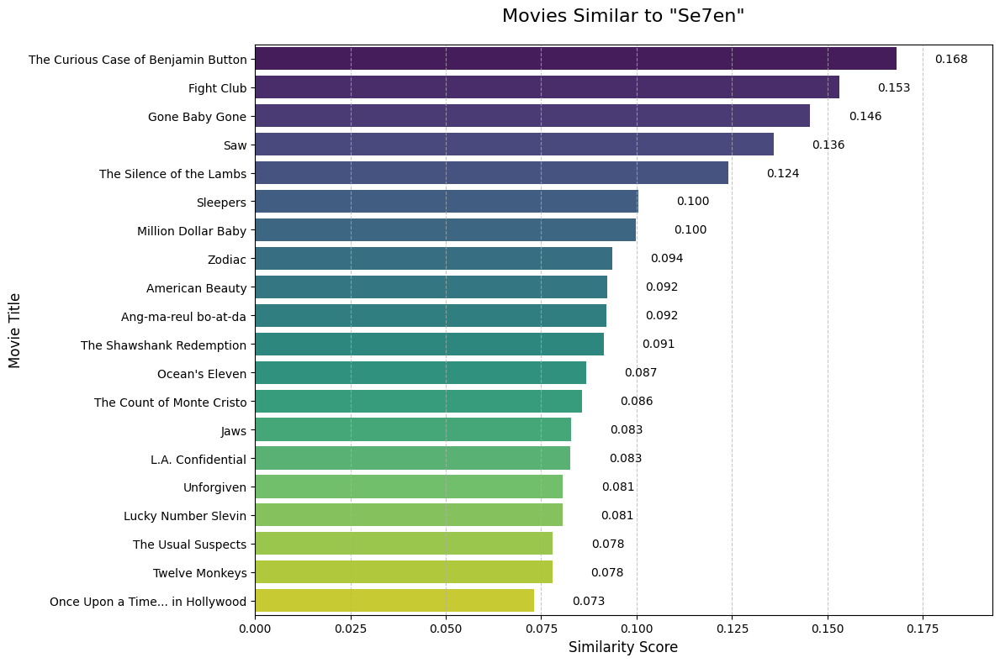

,Series_Title,Overview,Director,Star1,Star2,Star3,Similarity_Score
628,The Curious Case of Benjamin Button,"Tells the story of Benjamin Button, a man who ...",David Fincher,Brad Pitt,Cate Blanchett,Tilda Swinton,0.168024
9,Fight Club,An insomniac office worker and a devil-may-car...,David Fincher,Brad Pitt,Edward Norton,Meat Loaf,0.153059
922,Gone Baby Gone,Two Boston area detectives investigate a littl...,Ben Affleck,Morgan Freeman,Ed Harris,Casey Affleck,0.145515
932,Saw,Two strangers awaken in a room with no recolle...,James Wan,Cary Elwes,Leigh Whannell,Danny Glover,0.135937
28,The Silence of the Lambs,A young F.B.I. cadet must receive the help of ...,Jonathan Demme,Jodie Foster,Anthony Hopkins,Lawrence A. Bonney,0.123957
960,Sleepers,"After a prank goes disastrously wrong, a group...",Barry Levinson,Robert De Niro,Kevin Bacon,Brad Pitt,0.100421
234,Million Dollar Baby,A determined woman works with a hardened boxin...,Clint Eastwood,Hilary Swank,Clint Eastwood,Morgan Freeman,0.099726
767,Zodiac,"In the late 1960s/early 1970s, a San Francisco...",David Fincher,Jake Gyllenhaal,Robert Downey Jr.,Mark Ruffalo,0.093516
98,American Beauty,A sexually frustrated suburban father has a mi...,Sam Mendes,Kevin Spacey,Annette Bening,Thora Birch,0.092339
602,Ang-ma-reul bo-at-da,A secret agent exacts revenge on a serial kill...,Jee-woon Kim,Lee Byung-Hun,Choi Min-sik,Jeon Gook-Hwan,0.092185


In [ ]:
run_movie_recommender(df, "Se7en", 20)

In [ ]:
# Example usage
input_movie_name = "Se7en"
recommended_movies_df = recommend_movies(input_movie_name, df, siamese_network, tokenizer, model)
print(recommended_movies_df)

                       Series_Title  Cosine Similarity
0                             Se7en           1.000000
1                 The Hateful Eight           0.985175
2                 L.A. Confidential           0.980403
3                              Rope           0.980216
4                    Gone Baby Gone           0.979745
5                            Zodiac           0.973574
6                         Prisoners           0.973107
7                        Inside Man           0.971911
8   The Girl with the Dragon Tattoo           0.956964
9               Glengarry Glen Ross           0.955951
10                Tengoku to jigoku           0.946813
11                         Rashômon           0.946168
12                     Mystic River           0.943712
13                   Salinui chueok           0.943019
14                       Wind River           0.930881
15                      Le samouraï           0.926658
16                         Drishyam           0.925897
17        

In [ ]:
def get_optimal_recommendation(input_movie_name, df, siamese_network, tokenizer, model):
    """
    Compare recommendations from both approaches and return the first common movie
    or the top Siamese recommendation if there's no match.

    Parameters:
    input_movie_name (str): Movie title to get recommendations for
    df (pandas.DataFrame): DataFrame containing movie data
    siamese_network: The trained Siamese neural network
    tokenizer: BERT tokenizer for text processing
    model: BERT model for embeddings

    Returns:
    dict: Recommended movie information
    """
    # Get Siamese network recommendations
    siamese_recommendations = recommend_movies(input_movie_name, df, siamese_network, tokenizer, model)

    # Get content-based recommendations without visualization
    # Prepare features and calculate similarity
    similarity_matrix, indices = prepare_movie_features(df)
    content_based_recommendations = get_recommendations(input_movie_name, similarity_matrix, indices, df, top_n=20)

    # Extract movie titles from both recommendation sets
    siamese_titles = siamese_recommendations['Series_Title'].tolist()

    if isinstance(content_based_recommendations, pd.DataFrame):
        content_based_titles = content_based_recommendations['Series_Title'].tolist()
    else:
        # Handle the case where content-based returns an error message
        content_based_titles = []

    # Find common movies (excluding the input movie itself)
    common_movies = []
    for title in siamese_titles:
        if title in content_based_titles and title != input_movie_name:
            common_movies.append(title)

    # If there are common movies, return the first one
    if common_movies:
        # Get the similarity score from Siamese recommendations
        similarity = siamese_recommendations[siamese_recommendations['Series_Title'] == common_movies[0]]['Cosine Similarity'].values[0]
        return {
            "title": common_movies[0],
            "similarity_score": similarity,
            "source": "Both approaches"
        }

    # If no common movie exists, return the top Siamese recommendation (excluding the input movie)
    for title, similarity in zip(siamese_titles, siamese_recommendations['Cosine Similarity']):
        if title != input_movie_name:
            return {
                "title": title,
                "similarity_score": similarity,
                "source": "Siamese network"
            }

    # Fallback if nothing suitable found
    return None

# Example usage
if __name__ == "__main__":
    # Assume df, siamese_network, tokenizer, and model are already loaded
    movie_query = "Se7en"

    recommendation = get_optimal_recommendation(movie_query, df, siamese_network, tokenizer, model)

    if recommendation:
        print(f"\nOptimal recommendation for '{movie_query}':")
        print(f"Recommended movie: {recommendation['title']}")
        print(f"Similarity score: {recommendation['similarity_score']:.4f}")
        print(f"Source: {recommendation['source']}")
    else:
        print(f"\nNo recommendations available for '{movie_query}'.")


Optimal recommendation for 'Se7en':
Recommended movie: L.A. Confidential
Similarity score: 0.9804
Source: Both approaches


Mahshid AliAkbari

Top 20 movies similar to 'The Broken Circle Breakdown':
                                          Series_Title  Similarity_Score
                           Dilwale Dulhania Le Jayenge          0.088496
                                  (500) Days of Summer          0.073259
                                            La La Land          0.069286
                                          The Notebook          0.067836
                                               Titanic          0.064651
                                        Dil Chahta Hai          0.064558
                             Knockin' on Heaven's Door          0.063012
                                  Miracle in cell NO.7          0.062535
                                           Höstsonaten          0.056796
                                            Veer-Zaara          0.056200
                                    Chung Hing sam lam          0.055947
                                            Metropolis          0.05

<ipython-input-11-6f28ab141b3a>:128: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  ax = sns.barplot(


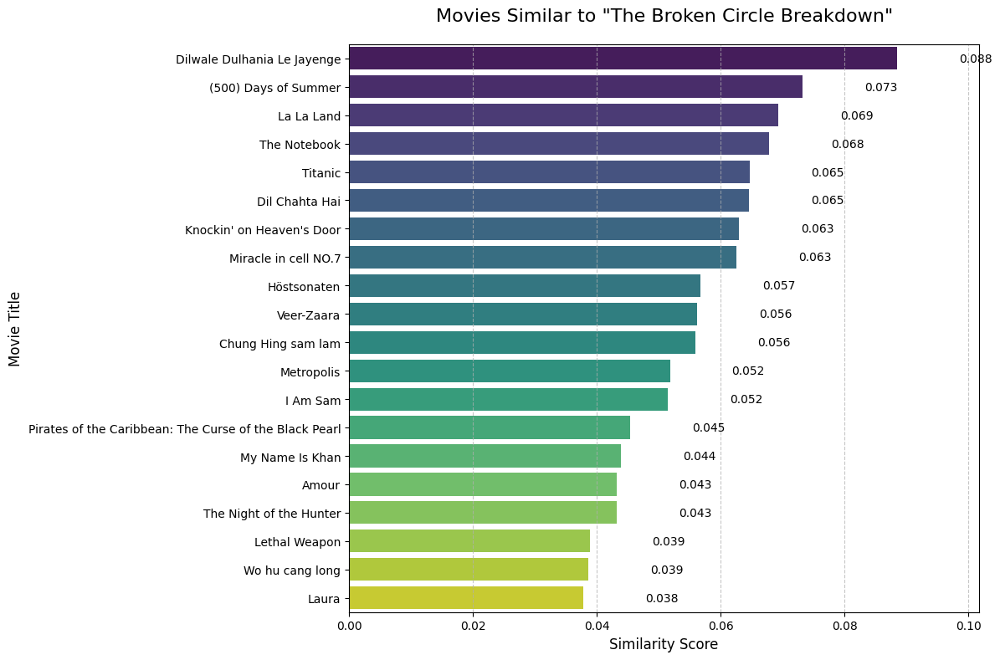

,Series_Title,Overview,Director,Star1,Star2,Star3,Similarity_Score
258,Dilwale Dulhania Le Jayenge,"When Raj meets Simran in Europe, it isn't love...",Aditya Chopra,Shah Rukh Khan,Kajol,Amrish Puri,0.088496
754,(500) Days of Summer,An offbeat romantic comedy about a woman who d...,Marc Webb,Zooey Deschanel,Joseph Gordon-Levitt,Geoffrey Arend,0.073259
327,La La Land,"While navigating their careers in Los Angeles,...",Damien Chazelle,Ryan Gosling,Emma Stone,Rosemarie DeWitt,0.069286
637,The Notebook,A poor yet passionate young man falls in love ...,Nick Cassavetes,Gena Rowlands,James Garner,Rachel McAdams,0.067836
652,Titanic,A seventeen-year-old aristocrat falls in love ...,James Cameron,Leonardo DiCaprio,Kate Winslet,Billy Zane,0.064651
240,Dil Chahta Hai,Three inseparable childhood friends are just o...,Farhan Akhtar,Aamir Khan,Saif Ali Khan,Akshaye Khanna,0.064558
390,Knockin' on Heaven's Door,Two terminally ill patients escape from a hosp...,Thomas Jahn,Til Schweiger,Jan Josef Liefers,Thierry van Werveke,0.063012
91,Miracle in cell NO.7,A story of love between a mentally-ill father ...,Mehmet Ada Öztekin,Aras Bulut Iynemli,Nisa Sofiya Aksongur,Deniz Baysal,0.062535
175,Höstsonaten,A married daughter who longs for her mother's ...,Ingmar Bergman,Ingrid Bergman,Liv Ullmann,Lena Nyman,0.056796
629,Veer-Zaara,"Veer-Zaara is a saga of love, separation, cour...",Yash Chopra,Shah Rukh Khan,Preity Zinta,Rani Mukerji,0.056200


In [ ]:
run_movie_recommender(df, "The Broken Circle Breakdown", 20)

In [ ]:
# Example usage
input_movie_name = "The Broken Circle Breakdown"
recommended_movies_df = recommend_movies(input_movie_name, df, siamese_network, tokenizer, model)
print(recommended_movies_df)

                           Series_Title  Cosine Similarity
0           The Broken Circle Breakdown           1.000000
1  La leggenda del pianista sull'oceano           0.936589
2                                  Once           0.913591
3                         The Red Shoes           0.879751
4                             Gully Boy           0.868150
5                        A Star Is Born           0.851540
6                        Ba wang bie ji           0.832207


In [ ]:
def get_optimal_recommendation(input_movie_name, df, siamese_network, tokenizer, model):
    """
    Compare recommendations from both approaches and return the first common movie
    or the top Siamese recommendation if there's no match.

    Parameters:
    input_movie_name (str): Movie title to get recommendations for
    df (pandas.DataFrame): DataFrame containing movie data
    siamese_network: The trained Siamese neural network
    tokenizer: BERT tokenizer for text processing
    model: BERT model for embeddings

    Returns:
    dict: Recommended movie information
    """
    # Get Siamese network recommendations
    siamese_recommendations = recommend_movies(input_movie_name, df, siamese_network, tokenizer, model)

    # Get content-based recommendations without visualization
    # Prepare features and calculate similarity
    similarity_matrix, indices = prepare_movie_features(df)
    content_based_recommendations = get_recommendations(input_movie_name, similarity_matrix, indices, df, top_n=20)

    # Extract movie titles from both recommendation sets
    siamese_titles = siamese_recommendations['Series_Title'].tolist()

    if isinstance(content_based_recommendations, pd.DataFrame):
        content_based_titles = content_based_recommendations['Series_Title'].tolist()
    else:
        # Handle the case where content-based returns an error message
        content_based_titles = []

    # Find common movies (excluding the input movie itself)
    common_movies = []
    for title in siamese_titles:
        if title in content_based_titles and title != input_movie_name:
            common_movies.append(title)

    # If there are common movies, return the first one
    if common_movies:
        # Get the similarity score from Siamese recommendations
        similarity = siamese_recommendations[siamese_recommendations['Series_Title'] == common_movies[0]]['Cosine Similarity'].values[0]
        return {
            "title": common_movies[0],
            "similarity_score": similarity,
            "source": "Both approaches"
        }

    # If no common movie exists, return the top Siamese recommendation (excluding the input movie)
    for title, similarity in zip(siamese_titles, siamese_recommendations['Cosine Similarity']):
        if title != input_movie_name:
            return {
                "title": title,
                "similarity_score": similarity,
                "source": "Siamese network"
            }

    # Fallback if nothing suitable found
    return None

# Example usage
if __name__ == "__main__":
    # Assume df, siamese_network, tokenizer, and model are already loaded
    movie_query = "The Broken Circle Breakdown"

    recommendation = get_optimal_recommendation(movie_query, df, siamese_network, tokenizer, model)

    if recommendation:
        print(f"\nOptimal recommendation for '{movie_query}':")
        print(f"Recommended movie: {recommendation['title']}")
        print(f"Similarity score: {recommendation['similarity_score']:.4f}")
        print(f"Source: {recommendation['source']}")
    else:
        print(f"\nNo recommendations available for '{movie_query}'.")


Optimal recommendation for 'The Broken Circle Breakdown':
Recommended movie: La leggenda del pianista sull'oceano
Similarity score: 0.9366
Source: Siamese network


Top 20 movies similar to 'Sing Street':
                  Series_Title  Similarity_Score
                          Once          0.156220
     Hedwig and the Angry Inch          0.091863
                    The Circus          0.072306
Dawn of the Planet of the Apes          0.071072
                Omoide no Mânî          0.066452
            The Blues Brothers          0.065359
               Wo hu cang long          0.061583
                         Alien          0.057176
                 Almost Famous          0.054549
                   Sling Blade          0.051361
                     Halloween          0.051045
    Per qualche dollaro in più          0.050857
        Straight Outta Compton          0.049778
 4 luni, 3 saptamâni si 2 zile          0.049157
                Cool Hand Luke          0.048407
            The Man from Earth          0.048354
           The Grapes of Wrath          0.048338
                  The Exorcist          0.047365
                The Blind Sid

<ipython-input-11-6f28ab141b3a>:128: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  ax = sns.barplot(


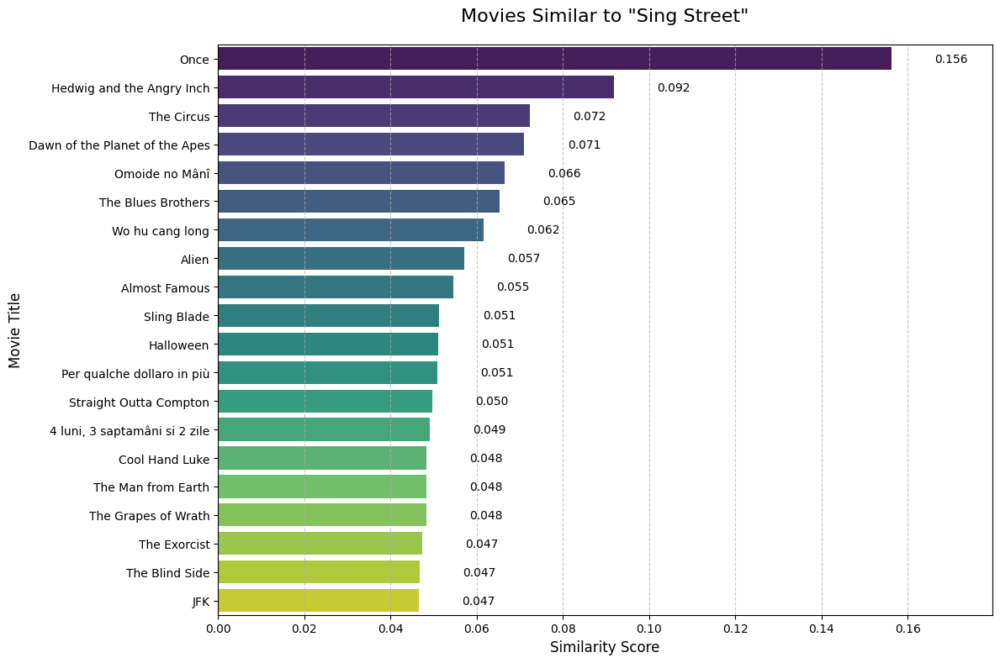

,Series_Title,Overview,Director,Star1,Star2,Star3,Similarity_Score
617,Once,A modern-day musical about a busker and an imm...,John Carney,Glen Hansard,Markéta Irglová,Hugh Walsh,0.156220
794,Hedwig and the Angry Inch,A gender-queer punk-rock singer from East Berl...,John Cameron Mitchell,John Cameron Mitchell,Miriam Shor,Stephen Trask,0.091863
318,The Circus,The Tramp finds work and the girl of his dream...,Charles Chaplin,Charles Chaplin,Merna Kennedy,Al Ernest Garcia,0.072306
898,Dawn of the Planet of the Apes,A growing nation of genetically evolved apes l...,Matt Reeves,Gary Oldman,Keri Russell,Andy Serkis,0.071072
728,Omoide no Mânî,"Due to 12 y.o. Anna's asthma, she's sent to st...",James Simone,Hiromasa Yonebayashi,Sara Takatsuki,Kasumi Arimura,0.066452
532,The Blues Brothers,"Jake Blues, just released from prison, puts to...",John Landis,John Belushi,Dan Aykroyd,Cab Calloway,0.065359
645,Wo hu cang long,A young Chinese warrior steals a sword from a ...,Ang Lee,Yun-Fat Chow,Michelle Yeoh,Ziyi Zhang,0.061583
75,Alien,After a space merchant vessel receives an unkn...,Ridley Scott,Sigourney Weaver,Tom Skerritt,John Hurt,0.057176
514,Almost Famous,A high-school boy is given the chance to write...,Cameron Crowe,Billy Crudup,Patrick Fugit,Kate Hudson,0.054549
391,Sling Blade,"Karl Childers, a simple man hospitalized since...",Billy Bob Thornton,Billy Bob Thornton,Dwight Yoakam,J.T. Walsh,0.051361


In [ ]:
run_movie_recommender(df, "Sing Street", 20)

In [ ]:
# Example usage
input_movie_name = "Sing Street"
recommended_movies_df = recommend_movies(input_movie_name, df, siamese_network, tokenizer, model)
print(recommended_movies_df)

                Series_Title  Cosine Similarity
0                Sing Street           1.000000
1  Hedwig and the Angry Inch           0.983404
2                 La La Land           0.954395


In [ ]:
def get_optimal_recommendation(input_movie_name, df, siamese_network, tokenizer, model):
    """
    Compare recommendations from both approaches and return the first common movie
    or the top Siamese recommendation if there's no match.

    Parameters:
    input_movie_name (str): Movie title to get recommendations for
    df (pandas.DataFrame): DataFrame containing movie data
    siamese_network: The trained Siamese neural network
    tokenizer: BERT tokenizer for text processing
    model: BERT model for embeddings

    Returns:
    dict: Recommended movie information
    """
    # Get Siamese network recommendations
    siamese_recommendations = recommend_movies(input_movie_name, df, siamese_network, tokenizer, model)

    # Get content-based recommendations without visualization
    # Prepare features and calculate similarity
    similarity_matrix, indices = prepare_movie_features(df)
    content_based_recommendations = get_recommendations(input_movie_name, similarity_matrix, indices, df, top_n=20)

    # Extract movie titles from both recommendation sets
    siamese_titles = siamese_recommendations['Series_Title'].tolist()

    if isinstance(content_based_recommendations, pd.DataFrame):
        content_based_titles = content_based_recommendations['Series_Title'].tolist()
    else:
        # Handle the case where content-based returns an error message
        content_based_titles = []

    # Find common movies (excluding the input movie itself)
    common_movies = []
    for title in siamese_titles:
        if title in content_based_titles and title != input_movie_name:
            common_movies.append(title)

    # If there are common movies, return the first one
    if common_movies:
        # Get the similarity score from Siamese recommendations
        similarity = siamese_recommendations[siamese_recommendations['Series_Title'] == common_movies[0]]['Cosine Similarity'].values[0]
        return {
            "title": common_movies[0],
            "similarity_score": similarity,
            "source": "Both approaches"
        }

    # If no common movie exists, return the top Siamese recommendation (excluding the input movie)
    for title, similarity in zip(siamese_titles, siamese_recommendations['Cosine Similarity']):
        if title != input_movie_name:
            return {
                "title": title,
                "similarity_score": similarity,
                "source": "Siamese network"
            }

    # Fallback if nothing suitable found
    return None

# Example usage
if __name__ == "__main__":
    # Assume df, siamese_network, tokenizer, and model are already loaded
    movie_query = "Sing Street"

    recommendation = get_optimal_recommendation(movie_query, df, siamese_network, tokenizer, model)

    if recommendation:
        print(f"\nOptimal recommendation for '{movie_query}':")
        print(f"Recommended movie: {recommendation['title']}")
        print(f"Similarity score: {recommendation['similarity_score']:.4f}")
        print(f"Source: {recommendation['source']}")
    else:
        print(f"\nNo recommendations available for '{movie_query}'.")


Optimal recommendation for 'Sing Street':
Recommended movie: Hedwig and the Angry Inch
Similarity score: 0.9834
Source: Both approaches


Bahareh Rahimi

Top 20 movies similar to 'Witness for the Prosecution':
           Series_Title  Similarity_Score
       Le dîner de cons          0.104157
                Sabrina          0.086768
The Night of the Hunter          0.083157
       The Lost Weekend          0.078547
            Sling Blade          0.078223
       Double Indemnity          0.075529
          The Gold Rush          0.072843
           Sunset Blvd.          0.071871
             The Circus          0.070834
             Wind River          0.070709
          The Apartment          0.070665
    Anatomy of a Murder          0.069671
        My Cousin Vinny          0.069640
                Aladdin          0.068771
       Some Like It Hot          0.068681
              Stalag 17          0.068666
           Modern Times          0.067762
                The Kid          0.066547
           The Thin Man          0.062820
        Ace in the Hole          0.060401


<ipython-input-11-6f28ab141b3a>:128: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  ax = sns.barplot(


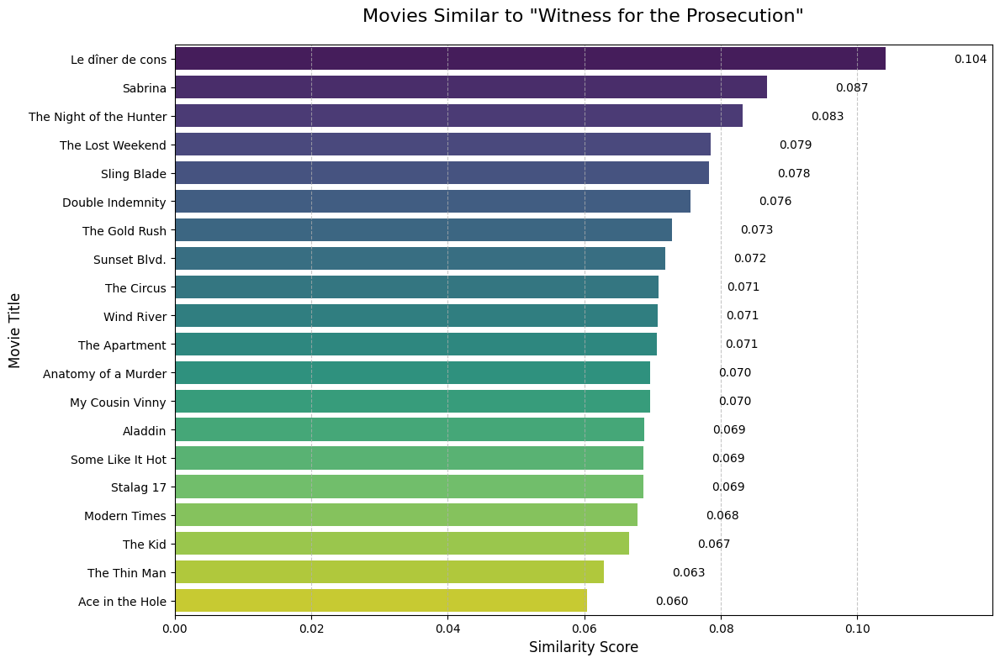

,Series_Title,Overview,Director,Star1,Star2,Star3,Similarity_Score
808,Le dîner de cons,"A few friends have a weekly fools' dinner, whe...",Francis Veber,Thierry Lhermitte,Jacques Villeret,Francis Huster,0.104157
870,Sabrina,A playboy becomes interested in the daughter o...,Billy Wilder,Humphrey Bogart,Audrey Hepburn,William Holden,0.086768
442,The Night of the Hunter,A religious fanatic marries a gullible widow w...,Charles Laughton,Robert Mitchum,Shelley Winters,Lillian Gish,0.083157
561,The Lost Weekend,The desperate life of a chronic alcoholic is f...,Billy Wilder,Ray Milland,Jane Wyman,Phillip Terry,0.078547
391,Sling Blade,"Karl Childers, a simple man hospitalized since...",Billy Bob Thornton,Billy Bob Thornton,Dwight Yoakam,J.T. Walsh,0.078223
123,Double Indemnity,An insurance representative lets himself be ta...,Billy Wilder,Fred MacMurray,Barbara Stanwyck,Edward G. Robinson,0.075529
193,The Gold Rush,A prospector goes to the Klondike in search of...,Charles Chaplin,Charles Chaplin,Mack Swain,Tom Murray,0.072843
82,Sunset Blvd.,A screenwriter develops a dangerous relationsh...,Billy Wilder,William Holden,Gloria Swanson,Erich von Stroheim,0.071871
318,The Circus,The Tramp finds work and the girl of his dream...,Charles Chaplin,Charles Chaplin,Merna Kennedy,Al Ernest Garcia,0.070834
723,Wind River,A veteran hunter helps an FBI agent investigat...,Taylor Sheridan,Kelsey Asbille,Jeremy Renner,Julia Jones,0.070709


In [ ]:
run_movie_recommender(df, "Witness for the Prosecution", 20)

In [ ]:
# Example usage
input_movie_name = "Witness for the Prosecution"
recommended_movies_df = recommend_movies(input_movie_name, df, siamese_network, tokenizer, model)
print(recommended_movies_df)

                       Series_Title  Cosine Similarity
0       Witness for the Prosecution           1.000000
1               La migliore offerta           0.988834
2               Anatomy of a Murder           0.983827
3                 Der Name der Rose           0.978614
4                          Rashômon           0.977415
5          In the Heat of the Night           0.971000
6               Glengarry Glen Ross           0.968565
7                        Inside Man           0.967487
8                        Wind River           0.963089
9                       Le samouraï           0.961228
10                     Contratiempo           0.958717
11  The Girl with the Dragon Tattoo           0.956196
12                        Prisoners           0.955652
13                             Rope           0.952330
14                      Primal Fear           0.944891
15            Män som hatar kvinnor           0.931018
16                   Gone Baby Gone           0.912908
17        

In [ ]:
def get_optimal_recommendation(input_movie_name, df, siamese_network, tokenizer, model):
    """
    Compare recommendations from both approaches and return the first common movie
    or the top Siamese recommendation if there's no match.

    Parameters:
    input_movie_name (str): Movie title to get recommendations for
    df (pandas.DataFrame): DataFrame containing movie data
    siamese_network: The trained Siamese neural network
    tokenizer: BERT tokenizer for text processing
    model: BERT model for embeddings

    Returns:
    dict: Recommended movie information
    """
    # Get Siamese network recommendations
    siamese_recommendations = recommend_movies(input_movie_name, df, siamese_network, tokenizer, model)

    # Get content-based recommendations without visualization
    # Prepare features and calculate similarity
    similarity_matrix, indices = prepare_movie_features(df)
    content_based_recommendations = get_recommendations(input_movie_name, similarity_matrix, indices, df, top_n=20)

    # Extract movie titles from both recommendation sets
    siamese_titles = siamese_recommendations['Series_Title'].tolist()

    if isinstance(content_based_recommendations, pd.DataFrame):
        content_based_titles = content_based_recommendations['Series_Title'].tolist()
    else:
        # Handle the case where content-based returns an error message
        content_based_titles = []

    # Find common movies (excluding the input movie itself)
    common_movies = []
    for title in siamese_titles:
        if title in content_based_titles and title != input_movie_name:
            common_movies.append(title)

    # If there are common movies, return the first one
    if common_movies:
        # Get the similarity score from Siamese recommendations
        similarity = siamese_recommendations[siamese_recommendations['Series_Title'] == common_movies[0]]['Cosine Similarity'].values[0]
        return {
            "title": common_movies[0],
            "similarity_score": similarity,
            "source": "Both approaches"
        }

    # If no common movie exists, return the top Siamese recommendation (excluding the input movie)
    for title, similarity in zip(siamese_titles, siamese_recommendations['Cosine Similarity']):
        if title != input_movie_name:
            return {
                "title": title,
                "similarity_score": similarity,
                "source": "Siamese network"
            }

    # Fallback if nothing suitable found
    return None

# Example usage
if __name__ == "__main__":
    # Assume df, siamese_network, tokenizer, and model are already loaded
    movie_query = "Witness for the Prosecution"

    recommendation = get_optimal_recommendation(movie_query, df, siamese_network, tokenizer, model)

    if recommendation:
        print(f"\nOptimal recommendation for '{movie_query}':")
        print(f"Recommended movie: {recommendation['title']}")
        print(f"Similarity score: {recommendation['similarity_score']:.4f}")
        print(f"Source: {recommendation['source']}")
    else:
        print(f"\nNo recommendations available for '{movie_query}'.")


Optimal recommendation for 'Witness for the Prosecution':
Recommended movie: Anatomy of a Murder
Similarity score: 0.9838
Source: Both approaches


Top 20 movies similar to 'Magnolia':
                       Series_Title  Similarity_Score
                      Boogie Nights          0.163472
                There Will Be Blood          0.125163
                     A Few Good Men          0.112778
                         Short Cuts          0.108505
                           Rushmore          0.090904
                    Children of Men          0.087484
                  The Hateful Eight          0.083382
                      The Machinist          0.081847
                   The Last Samurai          0.078954
Le charme discret de la bourgeoisie          0.076362
                   Edge of Tomorrow          0.075674
      Mission: Impossible - Fallout          0.074673
                       Isle of Dogs          0.073628
                   Moonrise Kingdom          0.073598
                             Jagten          0.072963
                             Festen          0.072141
                    Minority Report          

<ipython-input-11-6f28ab141b3a>:128: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  ax = sns.barplot(


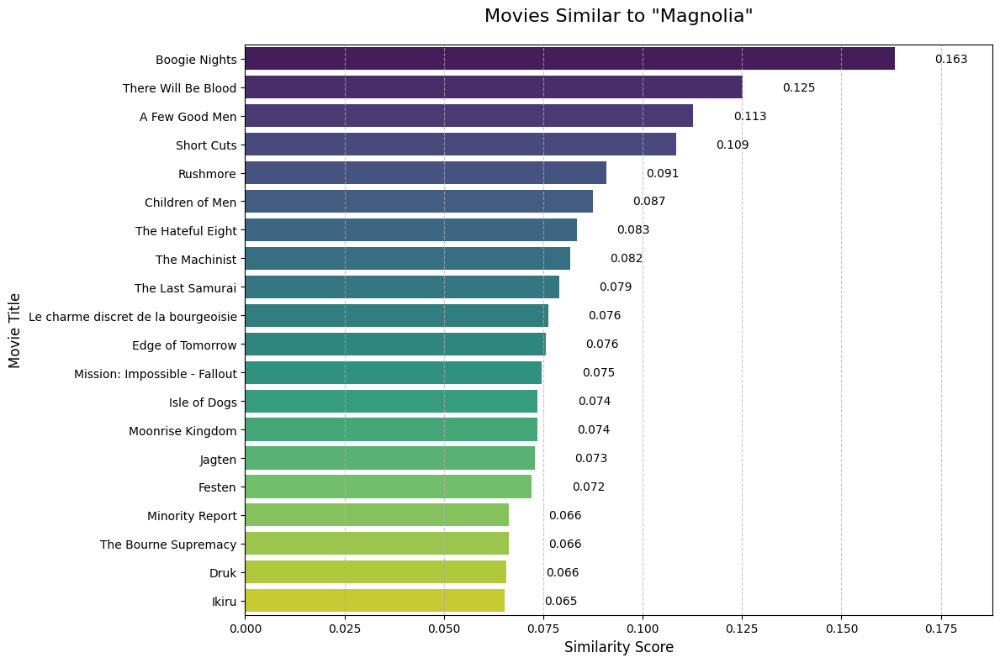

,Series_Title,Overview,Director,Star1,Star2,Star3,Similarity_Score
517,Boogie Nights,"Back when sex was safe, pleasure was a busines...",Paul Thomas Anderson,Mark Wahlberg,Julianne Moore,Burt Reynolds,0.163472
149,There Will Be Blood,"A story of family, religion, hatred, oil and m...",Paul Thomas Anderson,Daniel Day-Lewis,Paul Dano,Ciarán Hinds,0.125163
824,A Few Good Men,Military lawyer Lieutenant Daniel Kaffee defen...,Rob Reiner,Tom Cruise,Jack Nicholson,Demi Moore,0.112778
817,Short Cuts,The day-to-day lives of several suburban Los A...,Robert Altman,Andie MacDowell,Julianne Moore,Tim Robbins,0.108505
803,Rushmore,The extracurricular king of Rushmore Preparato...,Wes Anderson,Jason Schwartzman,Bill Murray,Olivia Williams,0.090904
513,Children of Men,"In 2027, in a chaotic world in which women hav...",Alfonso Cuarón,Julianne Moore,Clive Owen,Chiwetel Ejiofor,0.087484
584,The Hateful Eight,"In the dead of a Wyoming winter, a bounty hunt...",Quentin Tarantino,Samuel L. Jackson,Kurt Russell,Jennifer Jason Leigh,0.083382
778,The Machinist,An industrial worker who hasn't slept in a yea...,Brad Anderson,Christian Bale,Jennifer Jason Leigh,Aitana Sánchez-Gijón,0.081847
784,The Last Samurai,An American military advisor embraces the Samu...,Edward Zwick,Tom Cruise,Ken Watanabe,Billy Connolly,0.078954
539,Le charme discret de la bourgeoisie,"A surreal, virtually plotless series of dreams...",Luis Buñuel,Fernando Rey,Delphine Seyrig,Paul Frankeur,0.076362


In [ ]:
run_movie_recommender(df, "Magnolia", 20)

In [ ]:
# Example usage
input_movie_name = "Magnolia"
recommended_movies_df = recommend_movies(input_movie_name, df, siamese_network, tokenizer, model)
print(recommended_movies_df)

                            Series_Title  Cosine Similarity
0                               Magnolia           1.000000
1                           Seven Pounds           0.976344
2                    Requiem for a Dream           0.971759
3                        Ordinary People           0.964699
4                  Cat on a Hot Tin Roof           0.964009
5                               The Help           0.962032
6                   Synecdoche, New York           0.961907
7                     La grande bellezza           0.959488
8                   Fried Green Tomatoes           0.958211
9               The Shawshank Redemption           0.956954
10                                Gifted           0.956568
11                        Vozvrashchenie           0.953090
12                          East of Eden           0.950601
13                         Short Term 12           0.950590
14                               Boyhood           0.949724
15                     Y tu mamá también

In [ ]:
def get_optimal_recommendation(input_movie_name, df, siamese_network, tokenizer, model):
    """
    Compare recommendations from both approaches and return the first common movie
    or the top Siamese recommendation if there's no match.

    Parameters:
    input_movie_name (str): Movie title to get recommendations for
    df (pandas.DataFrame): DataFrame containing movie data
    siamese_network: The trained Siamese neural network
    tokenizer: BERT tokenizer for text processing
    model: BERT model for embeddings

    Returns:
    dict: Recommended movie information
    """
    # Get Siamese network recommendations
    siamese_recommendations = recommend_movies(input_movie_name, df, siamese_network, tokenizer, model)

    # Get content-based recommendations without visualization
    # Prepare features and calculate similarity
    similarity_matrix, indices = prepare_movie_features(df)
    content_based_recommendations = get_recommendations(input_movie_name, similarity_matrix, indices, df, top_n=20)

    # Extract movie titles from both recommendation sets
    siamese_titles = siamese_recommendations['Series_Title'].tolist()

    if isinstance(content_based_recommendations, pd.DataFrame):
        content_based_titles = content_based_recommendations['Series_Title'].tolist()
    else:
        # Handle the case where content-based returns an error message
        content_based_titles = []

    # Find common movies (excluding the input movie itself)
    common_movies = []
    for title in siamese_titles:
        if title in content_based_titles and title != input_movie_name:
            common_movies.append(title)

    # If there are common movies, return the first one
    if common_movies:
        # Get the similarity score from Siamese recommendations
        similarity = siamese_recommendations[siamese_recommendations['Series_Title'] == common_movies[0]]['Cosine Similarity'].values[0]
        return {
            "title": common_movies[0],
            "similarity_score": similarity,
            "source": "Both approaches"
        }

    # If no common movie exists, return the top Siamese recommendation (excluding the input movie)
    for title, similarity in zip(siamese_titles, siamese_recommendations['Cosine Similarity']):
        if title != input_movie_name:
            return {
                "title": title,
                "similarity_score": similarity,
                "source": "Siamese network"
            }

    # Fallback if nothing suitable found
    return None

# Example usage
if __name__ == "__main__":
    # Assume df, siamese_network, tokenizer, and model are already loaded
    movie_query = "Magnolia"

    recommendation = get_optimal_recommendation(movie_query, df, siamese_network, tokenizer, model)

    if recommendation:
        print(f"\nOptimal recommendation for '{movie_query}':")
        print(f"Recommended movie: {recommendation['title']}")
        print(f"Similarity score: {recommendation['similarity_score']:.4f}")
        print(f"Source: {recommendation['source']}")
    else:
        print(f"\nNo recommendations available for '{movie_query}'.")


Optimal recommendation for 'Magnolia':
Recommended movie: Seven Pounds
Similarity score: 0.9763
Source: Siamese network


Amirhossein Ghasemi

In [ ]:
# Example usage
input_movie_name = "God's Own Country"
recommended_movies_df = recommend_movies(input_movie_name, df, siamese_network, tokenizer, model)
print(recommended_movies_df)

                         Series_Title  Cosine Similarity
0                   God's Own Country           1.000000
1                      Gegen die Wand           0.946832
2                Call Me by Your Name           0.944940
3                      Before Sunrise           0.941281
4               Sense and Sensibility           0.939920
5                     Brief Encounter           0.931980
6                        Little Women           0.929784
7                 Hiroshima mon amour           0.927991
8                   Pride & Prejudice           0.925914
9                     Before Midnight           0.924614
10                              Dev.D           0.922908
11                      Belle de jour           0.922505
12                 Brokeback Mountain           0.906767
13             The Fault in Our Stars           0.903096
14  Portrait de la jeune fille en feu           0.902045
15                             Hævnen           0.898811
16    The Perks of Being a Wall

Top 20 movies similar to 'God's Own Country':
                  Series_Title  Similarity_Score
                      Dead Man          0.092863
    Terminator 2: Judgment Day          0.069347
             Finding Neverland          0.062298
      The Theory of Everything          0.062175
                Koe no katachi          0.060957
   What's Eating Gilbert Grape          0.060741
                 Donnie Brasco          0.059724
                       Warrior          0.059667
                   The Killing          0.056541
Fear and Loathing in Las Vegas          0.056067
                       Ed Wood          0.055350
                 Walk the Line          0.053932
              Le dîner de cons          0.053363
           Edward Scissorhands          0.052956
                       Boyhood          0.052081
                          Blow          0.051036
            Brokeback Mountain          0.051031
                   Toy Story 4          0.050848
              The Lost 

<ipython-input-11-6f28ab141b3a>:128: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  ax = sns.barplot(


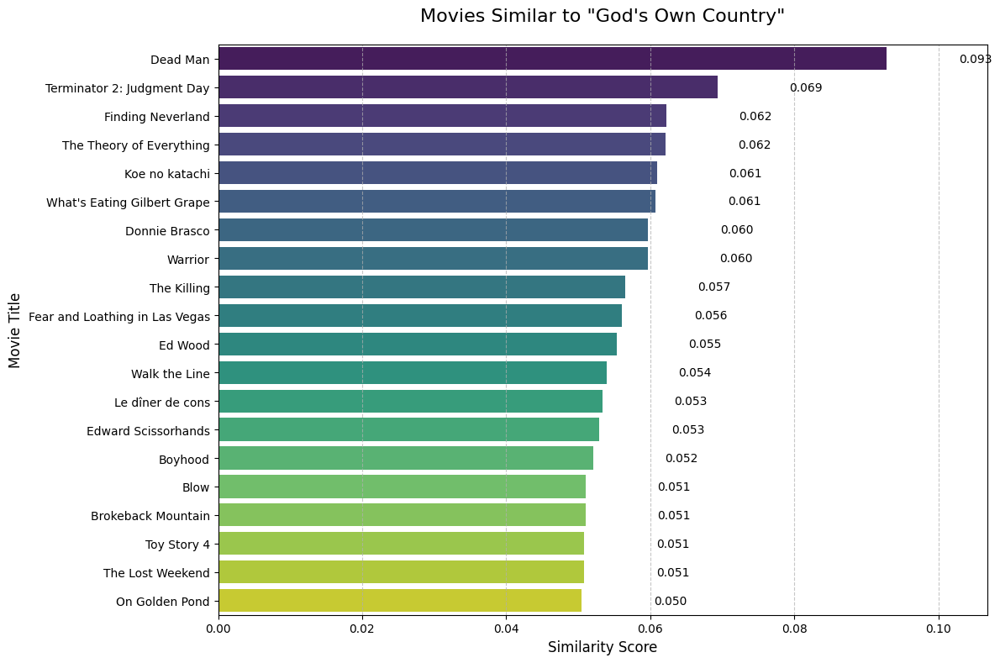

,Series_Title,Overview,Director,Star1,Star2,Star3,Similarity_Score
964,Dead Man,"On the run after murdering a man, accountant W...",Jim Jarmusch,Johnny Depp,Gary Farmer,Crispin Glover,0.092863
44,Terminator 2: Judgment Day,"A cyborg, identical to the one who failed to k...",James Cameron,Arnold Schwarzenegger,Linda Hamilton,Edward Furlong,0.069347
940,Finding Neverland,The story of Sir J.M. Barrie's friendship with...,Marc Forster,Johnny Depp,Kate Winslet,Julie Christie,0.062298
729,The Theory of Everything,A look at the relationship between the famous ...,James Marsh,Eddie Redmayne,Felicity Jones,Tom Prior,0.062175
197,Koe no katachi,A young man is ostracized by his classmates af...,Naoko Yamada,Miyu Irino,Saori Hayami,Aoi Yûki,0.060957
658,What's Eating Gilbert Grape,A young man in a small Midwestern town struggl...,Lasse Hallström,Johnny Depp,Leonardo DiCaprio,Juliette Lewis,0.060741
809,Donnie Brasco,An FBI undercover agent infiltrates the mob an...,Mike Newell,Al Pacino,Johnny Depp,Michael Madsen,0.059724
144,Warrior,The youngest son of an alcoholic former boxer ...,Gavin O'Connor,Tom Hardy,Nick Nolte,Joel Edgerton,0.059667
441,The Killing,Crook Johnny Clay assembles a five man team to...,Stanley Kubrick,Sterling Hayden,Coleen Gray,Vince Edwards,0.056541
957,Fear and Loathing in Las Vegas,An oddball journalist and his psychopathic law...,Terry Gilliam,Johnny Depp,Benicio Del Toro,Tobey Maguire,0.056067


In [ ]:
run_movie_recommender(df, "God's Own Country", 20)

In [ ]:
def get_optimal_recommendation(input_movie_name, df, siamese_network, tokenizer, model):
    """
    Compare recommendations from both approaches and return the first common movie
    or the top Siamese recommendation if there's no match.

    Parameters:
    input_movie_name (str): Movie title to get recommendations for
    df (pandas.DataFrame): DataFrame containing movie data
    siamese_network: The trained Siamese neural network
    tokenizer: BERT tokenizer for text processing
    model: BERT model for embeddings

    Returns:
    dict: Recommended movie information
    """
    # Get Siamese network recommendations
    siamese_recommendations = recommend_movies(input_movie_name, df, siamese_network, tokenizer, model)

    # Get content-based recommendations without visualization
    # Prepare features and calculate similarity
    similarity_matrix, indices = prepare_movie_features(df)
    content_based_recommendations = get_recommendations(input_movie_name, similarity_matrix, indices, df, top_n=20)

    # Extract movie titles from both recommendation sets
    siamese_titles = siamese_recommendations['Series_Title'].tolist()

    if isinstance(content_based_recommendations, pd.DataFrame):
        content_based_titles = content_based_recommendations['Series_Title'].tolist()
    else:
        # Handle the case where content-based returns an error message
        content_based_titles = []

    # Find common movies (excluding the input movie itself)
    common_movies = []
    for title in siamese_titles:
        if title in content_based_titles and title != input_movie_name:
            common_movies.append(title)

    # If there are common movies, return the first one
    if common_movies:
        # Get the similarity score from Siamese recommendations
        similarity = siamese_recommendations[siamese_recommendations['Series_Title'] == common_movies[0]]['Cosine Similarity'].values[0]
        return {
            "title": common_movies[0],
            "similarity_score": similarity,
            "source": "Both approaches"
        }

    # If no common movie exists, return the top Siamese recommendation (excluding the input movie)
    for title, similarity in zip(siamese_titles, siamese_recommendations['Cosine Similarity']):
        if title != input_movie_name:
            return {
                "title": title,
                "similarity_score": similarity,
                "source": "Siamese network"
            }

    # Fallback if nothing suitable found
    return None

# Example usage
if __name__ == "__main__":
    # Assume df, siamese_network, tokenizer, and model are already loaded
    movie_query = "God's Own Country"

    recommendation = get_optimal_recommendation(movie_query, df, siamese_network, tokenizer, model)

    if recommendation:
        print(f"\nOptimal recommendation for '{movie_query}':")
        print(f"Recommended movie: {recommendation['title']}")
        print(f"Similarity score: {recommendation['similarity_score']:.4f}")
        print(f"Source: {recommendation['source']}")
    else:
        print(f"\nNo recommendations available for '{movie_query}'.")


Optimal recommendation for 'God's Own Country':
Recommended movie: Brokeback Mountain
Similarity score: 0.9068
Source: Both approaches


Hamed Karami

Top 20 movies similar to 'Close Encounters of the Third Kind':
              Series_Title  Similarity_Score
                      Jaws          0.178323
    Les quatre cents coups          0.121611
              Jules et Jim          0.106568
         Empire of the Sun          0.081330
          The Color Purple          0.074193
                About Time          0.072487
E.T. the Extra-Terrestrial          0.071943
       Saving Private Ryan          0.067863
             Before Sunset          0.066608
           The Incredibles          0.065881
                  The Game          0.065713
           Minority Report          0.062595
   Raiders of the Lost Ark          0.062321
       Catch Me If You Can          0.062059
          Schindler's List          0.060905
               After Hours          0.057183
                  Coraline          0.055451
             Jurassic Park          0.055340
                     Logan          0.053140
                 The Sting          0

<ipython-input-11-6f28ab141b3a>:128: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  ax = sns.barplot(


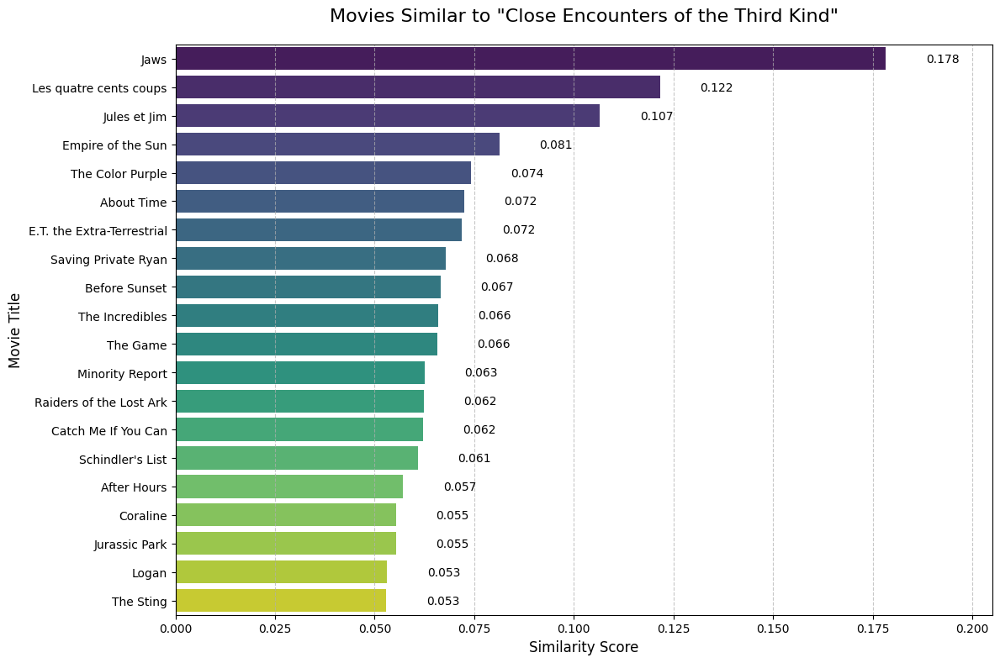

,Series_Title,Overview,Director,Star1,Star2,Star3,Similarity_Score
415,Jaws,When a killer shark unleashes chaos on a beach...,Steven Spielberg,Roy Scheider,Robert Shaw,Richard Dreyfuss,0.178323
299,Les quatre cents coups,"A young boy, left without attention, delves in...",François Truffaut,Jean-Pierre Léaud,Albert Rémy,Claire Maurier,0.121611
706,Jules et Jim,Decades of a love triangle concerning two frie...,François Truffaut,Jeanne Moreau,Oskar Werner,Henri Serre,0.106568
832,Empire of the Sun,A young English boy struggles to survive under...,Steven Spielberg,Christian Bale,John Malkovich,Miranda Richardson,0.081330
682,The Color Purple,A black Southern woman struggles to find her i...,Steven Spielberg,Danny Glover,Whoopi Goldberg,Oprah Winfrey,0.074193
593,About Time,"At the age of 21, Tim discovers he can travel ...",Richard Curtis,Domhnall Gleeson,Rachel McAdams,Bill Nighy,0.072487
688,E.T. the Extra-Terrestrial,A troubled child summons the courage to help a...,Steven Spielberg,Henry Thomas,Drew Barrymore,Peter Coyote,0.071943
24,Saving Private Ryan,"Following the Normandy Landings, a group of U....",Steven Spielberg,Tom Hanks,Matt Damon,Tom Sizemore,0.067863
237,Before Sunset,"Nine years after Jesse and Celine first met, t...",Richard Linklater,Ethan Hawke,Julie Delpy,Vernon Dobtcheff,0.066608
378,The Incredibles,"A family of undercover superheroes, while tryi...",Brad Bird,Craig T. Nelson,Samuel L. Jackson,Holly Hunter,0.065881


In [ ]:
run_movie_recommender(df, "Close Encounters of the Third Kind", 20)

In [ ]:
# Example usage
input_movie_name = "Close Encounters of the Third Kind"
recommended_movies_df = recommend_movies(input_movie_name, df, siamese_network, tokenizer, model)
print(recommended_movies_df)

                         Series_Title  Cosine Similarity
0  Close Encounters of the Third Kind           1.000000
1                              Brazil           0.978114
2                          Metropolis           0.954202
3       The Day the Earth Stood Still           0.937694
4                             Arrival           0.934185
5                             Stalker           0.924467


In [ ]:
def get_optimal_recommendation(input_movie_name, df, siamese_network, tokenizer, model):
    """
    Compare recommendations from both approaches and return the first common movie
    or the top Siamese recommendation if there's no match.

    Parameters:
    input_movie_name (str): Movie title to get recommendations for
    df (pandas.DataFrame): DataFrame containing movie data
    siamese_network: The trained Siamese neural network
    tokenizer: BERT tokenizer for text processing
    model: BERT model for embeddings

    Returns:
    dict: Recommended movie information
    """
    # Get Siamese network recommendations
    siamese_recommendations = recommend_movies(input_movie_name, df, siamese_network, tokenizer, model)

    # Get content-based recommendations without visualization
    # Prepare features and calculate similarity
    similarity_matrix, indices = prepare_movie_features(df)
    content_based_recommendations = get_recommendations(input_movie_name, similarity_matrix, indices, df, top_n=20)

    # Extract movie titles from both recommendation sets
    siamese_titles = siamese_recommendations['Series_Title'].tolist()

    if isinstance(content_based_recommendations, pd.DataFrame):
        content_based_titles = content_based_recommendations['Series_Title'].tolist()
    else:
        # Handle the case where content-based returns an error message
        content_based_titles = []

    # Find common movies (excluding the input movie itself)
    common_movies = []
    for title in siamese_titles:
        if title in content_based_titles and title != input_movie_name:
            common_movies.append(title)

    # If there are common movies, return the first one
    if common_movies:
        # Get the similarity score from Siamese recommendations
        similarity = siamese_recommendations[siamese_recommendations['Series_Title'] == common_movies[0]]['Cosine Similarity'].values[0]
        return {
            "title": common_movies[0],
            "similarity_score": similarity,
            "source": "Both approaches"
        }

    # If no common movie exists, return the top Siamese recommendation (excluding the input movie)
    for title, similarity in zip(siamese_titles, siamese_recommendations['Cosine Similarity']):
        if title != input_movie_name:
            return {
                "title": title,
                "similarity_score": similarity,
                "source": "Siamese network"
            }

    # Fallback if nothing suitable found
    return None

# Example usage
if __name__ == "__main__":
    # Assume df, siamese_network, tokenizer, and model are already loaded
    movie_query = "Close Encounters of the Third Kind"

    recommendation = get_optimal_recommendation(movie_query, df, siamese_network, tokenizer, model)

    if recommendation:
        print(f"\nOptimal recommendation for '{movie_query}':")
        print(f"Recommended movie: {recommendation['title']}")
        print(f"Similarity score: {recommendation['similarity_score']:.4f}")
        print(f"Source: {recommendation['source']}")
    else:
        print(f"\nNo recommendations available for '{movie_query}'.")


Optimal recommendation for 'Close Encounters of the Third Kind':
Recommended movie: Brazil
Similarity score: 0.9781
Source: Siamese network


Elaheh Chaghari

In [ ]:
# Example usage
input_movie_name = "Office Space"
recommended_movies_df = recommend_movies(input_movie_name, df, siamese_network, tokenizer, model)
print(recommended_movies_df)

                                         Series_Title  Cosine Similarity
0                                        Office Space           1.000000
1                            Ferris Bueller's Day Off           0.986830
2                                        The Hangover           0.981649
3                                  Dazed and Confused           0.978526
4                                      The Odd Couple           0.975456
5                                              Clerks           0.974469
6                                           Airplane!           0.972922
7                 Le charme discret de la bourgeoisie           0.960937
8                                    Le dîner de cons           0.955673
9                                       Life of Brian           0.939616
10                                 Young Frankenstein           0.934406
11                                              Zelig           0.924404
12  Dr. Strangelove or: How I Learned to Stop Worr.

Top 20 movies similar to 'Office Space':
                                Series_Title  Similarity_Score
                              The Iron Giant          0.111273
                          La planète sauvage          0.089766
                            A Beautiful Mind          0.084651
              The Boy in the Striped Pyjamas          0.078617
                          Dallas Buyers Club          0.074960
                           Kill Bill: Vol. 2          0.073630
                       Trois couleurs: Rouge          0.071158
               Sunrise: A Song of Two Humans          0.070882
                Kakushi-toride no san-akunin          0.069322
                                 The Sandlot          0.067462
Harry Potter and the Deathly Hallows: Part 2          0.062799
                                 Frost/Nixon          0.062233
                                       Naked          0.061862
Harry Potter and the Deathly Hallows: Part 1          0.060984
              

<ipython-input-11-6f28ab141b3a>:128: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  ax = sns.barplot(


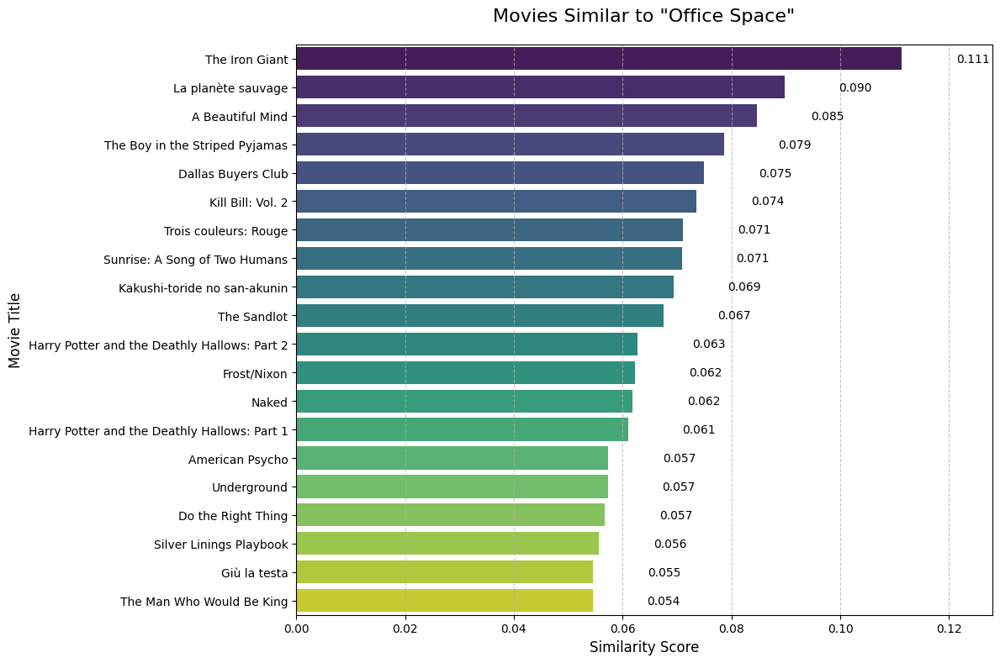

,Series_Title,Overview,Director,Star1,Star2,Star3,Similarity_Score
389,The Iron Giant,A young boy befriends a giant robot from outer...,Brad Bird,Eli Marienthal,Harry Connick Jr.,Jennifer Aniston,0.111273
694,La planète sauvage,"On a faraway planet where blue giants rule, op...",René Laloux,Barry Bostwick,Jennifer Drake,Eric Baugin,0.089766
159,A Beautiful Mind,"After John Nash, a brilliant but asocial mathe...",Ron Howard,Russell Crowe,Ed Harris,Jennifer Connelly,0.084651
616,The Boy in the Striped Pyjamas,"Through the innocent eyes of Bruno, the eight-...",Mark Herman,Asa Butterfield,David Thewlis,Rupert Friend,0.078617
359,Dallas Buyers Club,"In 1985 Dallas, electrician and hustler Ron Wo...",Jean-Marc Vallée,Matthew McConaughey,Jennifer Garner,Jared Leto,0.074960
369,Kill Bill: Vol. 2,The Bride continues her quest of vengeance aga...,Quentin Tarantino,Uma Thurman,David Carradine,Michael Madsen,0.073630
260,Trois couleurs: Rouge,A model discovers a retired judge is keen on i...,Krzysztof Kieslowski,Irène Jacob,Jean-Louis Trintignant,Frédérique Feder,0.071158
319,Sunrise: A Song of Two Humans,An allegorical tale about a man fighting the g...,F.W. Murnau,George O'Brien,Janet Gaynor,Margaret Livingston,0.070882
301,Kakushi-toride no san-akunin,"Lured by gold, two greedy peasants unknowingly...",Akira Kurosawa,Toshirô Mifune,Misa Uehara,Minoru Chiaki,0.069322
660,The Sandlot,"In the summer of 1962, a new kid in town is ta...",David Mickey Evans,Tom Guiry,Mike Vitar,Art LaFleur,0.067462


In [ ]:
run_movie_recommender(df, "Office Space", 20)

In [ ]:
def get_optimal_recommendation(input_movie_name, df, siamese_network, tokenizer, model):
    """
    Compare recommendations from both approaches and return the first common movie
    or the top Siamese recommendation if there's no match.

    Parameters:
    input_movie_name (str): Movie title to get recommendations for
    df (pandas.DataFrame): DataFrame containing movie data
    siamese_network: The trained Siamese neural network
    tokenizer: BERT tokenizer for text processing
    model: BERT model for embeddings

    Returns:
    dict: Recommended movie information
    """
    # Get Siamese network recommendations
    siamese_recommendations = recommend_movies(input_movie_name, df, siamese_network, tokenizer, model)

    # Get content-based recommendations without visualization
    # Prepare features and calculate similarity
    similarity_matrix, indices = prepare_movie_features(df)
    content_based_recommendations = get_recommendations(input_movie_name, similarity_matrix, indices, df, top_n=20)

    # Extract movie titles from both recommendation sets
    siamese_titles = siamese_recommendations['Series_Title'].tolist()

    if isinstance(content_based_recommendations, pd.DataFrame):
        content_based_titles = content_based_recommendations['Series_Title'].tolist()
    else:
        # Handle the case where content-based returns an error message
        content_based_titles = []

    # Find common movies (excluding the input movie itself)
    common_movies = []
    for title in siamese_titles:
        if title in content_based_titles and title != input_movie_name:
            common_movies.append(title)

    # If there are common movies, return the first one
    if common_movies:
        # Get the similarity score from Siamese recommendations
        similarity = siamese_recommendations[siamese_recommendations['Series_Title'] == common_movies[0]]['Cosine Similarity'].values[0]
        return {
            "title": common_movies[0],
            "similarity_score": similarity,
            "source": "Both approaches"
        }

    # If no common movie exists, return the top Siamese recommendation (excluding the input movie)
    for title, similarity in zip(siamese_titles, siamese_recommendations['Cosine Similarity']):
        if title != input_movie_name:
            return {
                "title": title,
                "similarity_score": similarity,
                "source": "Siamese network"
            }

    # Fallback if nothing suitable found
    return None

# Example usage
if __name__ == "__main__":
    # Assume df, siamese_network, tokenizer, and model are already loaded
    movie_query = "Office Space"

    recommendation = get_optimal_recommendation(movie_query, df, siamese_network, tokenizer, model)

    if recommendation:
        print(f"\nOptimal recommendation for '{movie_query}':")
        print(f"Recommended movie: {recommendation['title']}")
        print(f"Similarity score: {recommendation['similarity_score']:.4f}")
        print(f"Source: {recommendation['source']}")
    else:
        print(f"\nNo recommendations available for '{movie_query}'.")


Optimal recommendation for 'Office Space':
Recommended movie: Ferris Bueller's Day Off
Similarity score: 0.9868
Source: Siamese network


Mahsa Rezaee

In [ ]:
# Example usage
input_movie_name = "American Psycho"
recommended_movies_df = recommend_movies(input_movie_name, df, siamese_network, tokenizer, model)
print(recommended_movies_df)

                                 Series_Title  Cosine Similarity
0                             American Psycho           1.000000
1                                  Knives Out           0.983286
2                                   The Sting           0.977959
3                               Do lok tin si           0.976390
4                                 Adams æbler           0.976142
5                                  Paper Moon           0.971939
6                                 After Hours           0.971739
7                            The Long Goodbye           0.970516
8                                 Down by Law           0.969608
9                                   In Bruges           0.966151
10                            Rang De Basanti           0.964734
11                             Dom za vesanje           0.960055
12  Three Billboards Outside Ebbing, Missouri           0.954519
13                         The King of Comedy           0.953812
14                       

Top 20 movies similar to 'American Psycho':
              Series_Title  Similarity_Score
        North by Northwest          0.104446
         American Gangster          0.101677
             Batman Begins          0.094453
           Midnight Cowboy          0.077926
     The Dark Knight Rises          0.077194
               Toy Story 4          0.077113
            Mulholland Dr.          0.076856
         Empire of the Sun          0.074899
               Taxi Driver          0.071071
      Synecdoche, New York          0.070451
             The Machinist          0.064900
               The Visitor          0.064544
                   Yip Man          0.062127
              The Prestige          0.062055
               The Fighter          0.059069
    The Godfather: Part II          0.058688
    Les quatre cents coups          0.058469
              Mary and Max          0.058166
                        8½          0.058146
Die Hard: With a Vengeance          0.057611


<ipython-input-11-6f28ab141b3a>:128: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  ax = sns.barplot(


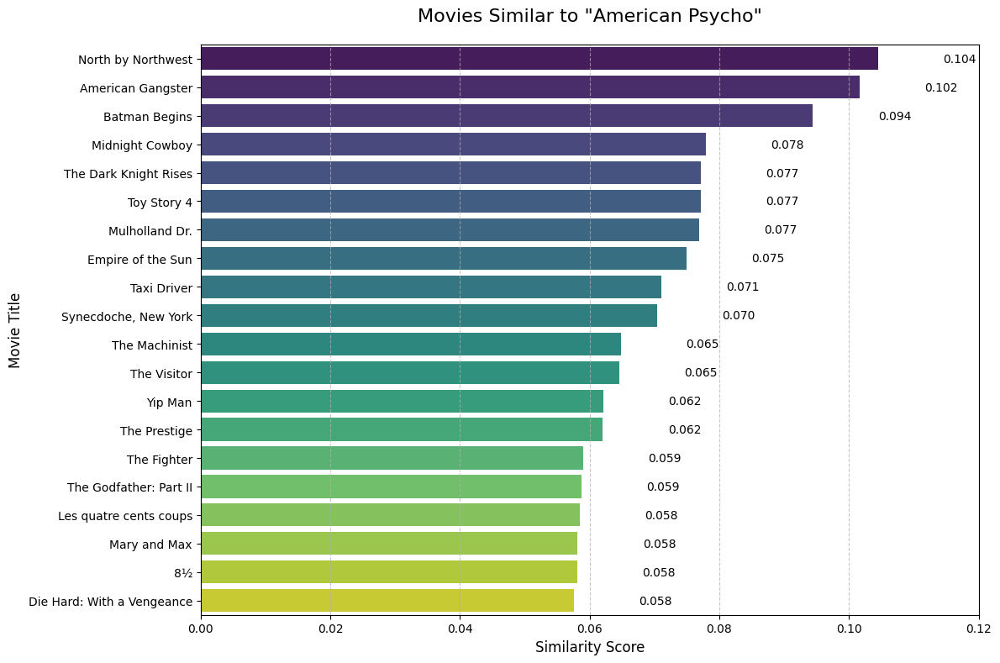

,Series_Title,Overview,Director,Star1,Star2,Star3,Similarity_Score
118,North by Northwest,A New York City advertising executive goes on ...,Alfred Hitchcock,Cary Grant,Eva Marie Saint,James Mason,0.104446
622,American Gangster,An outcast New York City cop is charged with b...,Ridley Scott,Denzel Washington,Russell Crowe,Chiwetel Ejiofor,0.101677
155,Batman Begins,"After training with his mentor, Batman begins ...",Christopher Nolan,Christian Bale,Michael Caine,Ken Watanabe,0.094453
699,Midnight Cowboy,A naive hustler travels from Texas to New York...,John Schlesinger,Dustin Hoffman,Jon Voight,Sylvia Miles,0.077926
63,The Dark Knight Rises,Eight years after the Joker's reign of anarchy...,Christopher Nolan,Christian Bale,Tom Hardy,Anne Hathaway,0.077194
596,Toy Story 4,"When a new toy called ""Forky"" joins Woody and ...",Josh Cooley,Tom Hanks,Tim Allen,Annie Potts,0.077113
515,Mulholland Dr.,After a car wreck on the winding Mulholland Dr...,David Lynch,Naomi Watts,Laura Harring,Justin Theroux,0.076856
832,Empire of the Sun,A young English boy struggles to survive under...,Steven Spielberg,Christian Bale,John Malkovich,Miranda Richardson,0.074899
111,Taxi Driver,A mentally unstable veteran works as a nightti...,Martin Scorsese,Robert De Niro,Jodie Foster,Cybill Shepherd,0.071071
933,"Synecdoche, New York","A theatre director struggles with his work, an...",Charlie Kaufman,Philip Seymour Hoffman,Samantha Morton,Michelle Williams,0.070451


In [ ]:
run_movie_recommender(df, "American Psycho", 20)

In [ ]:
def get_optimal_recommendation(input_movie_name, df, siamese_network, tokenizer, model):
    """
    Compare recommendations from both approaches and return the first common movie
    or the top Siamese recommendation if there's no match.

    Parameters:
    input_movie_name (str): Movie title to get recommendations for
    df (pandas.DataFrame): DataFrame containing movie data
    siamese_network: The trained Siamese neural network
    tokenizer: BERT tokenizer for text processing
    model: BERT model for embeddings

    Returns:
    dict: Recommended movie information
    """
    # Get Siamese network recommendations
    siamese_recommendations = recommend_movies(input_movie_name, df, siamese_network, tokenizer, model)

    # Get content-based recommendations without visualization
    # Prepare features and calculate similarity
    similarity_matrix, indices = prepare_movie_features(df)
    content_based_recommendations = get_recommendations(input_movie_name, similarity_matrix, indices, df, top_n=20)

    # Extract movie titles from both recommendation sets
    siamese_titles = siamese_recommendations['Series_Title'].tolist()

    if isinstance(content_based_recommendations, pd.DataFrame):
        content_based_titles = content_based_recommendations['Series_Title'].tolist()
    else:
        # Handle the case where content-based returns an error message
        content_based_titles = []

    # Find common movies (excluding the input movie itself)
    common_movies = []
    for title in siamese_titles:
        if title in content_based_titles and title != input_movie_name:
            common_movies.append(title)

    # If there are common movies, return the first one
    if common_movies:
        # Get the similarity score from Siamese recommendations
        similarity = siamese_recommendations[siamese_recommendations['Series_Title'] == common_movies[0]]['Cosine Similarity'].values[0]
        return {
            "title": common_movies[0],
            "similarity_score": similarity,
            "source": "Both approaches"
        }

    # If no common movie exists, return the top Siamese recommendation (excluding the input movie)
    for title, similarity in zip(siamese_titles, siamese_recommendations['Cosine Similarity']):
        if title != input_movie_name:
            return {
                "title": title,
                "similarity_score": similarity,
                "source": "Siamese network"
            }

    # Fallback if nothing suitable found
    return None

# Example usage
if __name__ == "__main__":
    # Assume df, siamese_network, tokenizer, and model are already loaded
    movie_query = "American Psycho"

    recommendation = get_optimal_recommendation(movie_query, df, siamese_network, tokenizer, model)

    if recommendation:
        print(f"\nOptimal recommendation for '{movie_query}':")
        print(f"Recommended movie: {recommendation['title']}")
        print(f"Similarity score: {recommendation['similarity_score']:.4f}")
        print(f"Source: {recommendation['source']}")
    else:
        print(f"\nNo recommendations available for '{movie_query}'.")


Optimal recommendation for 'American Psycho':
Recommended movie: Knives Out
Similarity score: 0.9833
Source: Siamese network


Saber Sabzi

Based on Bad movies

In [ ]:
# Example usage
input_movie_name = "The Irishman"
recommended_movies_df = recommend_movies(input_movie_name, df, siamese_network, tokenizer, model)
print(recommended_movies_df)

                          Series_Title  Cosine Similarity
0                         The Irishman           1.000000
1                             Papillon           0.980011
2                     Midnight Express           0.979071
3                    American Gangster           0.973161
4                                 Blow           0.971896
5                           Changeling           0.971792
6                    Dog Day Afternoon           0.967924
7   Butch Cassidy and the Sundance Kid           0.965866
8                              Serpico           0.965595
9                  Catch Me If You Can           0.959934
10                       Donnie Brasco           0.954839
11           In the Name of the Father           0.954652
12                          Just Mercy           0.950383
13                           Spotlight           0.945935
14             The Wolf of Wall Street           0.943505
15                          Goodfellas           0.922812


Top 20 movies similar to 'The Irishman':
           Series_Title  Similarity_Score
            Raging Bull          0.242803
             Goodfellas          0.240554
                 Casino          0.178901
 The Godfather: Part II          0.146893
                   Heat          0.136548
       Scent of a Woman          0.129916
           A Bronx Tale          0.126350
     The King of Comedy          0.119793
             Home Alone          0.116175
            Taxi Driver          0.103535
    Glengarry Glen Ross          0.093589
        My Cousin Vinny          0.088498
     Back to the Future          0.088054
          Donnie Brasco          0.084216
The Godfather: Part III          0.083025
         Shutter Island          0.082327
           The Departed          0.082257
               Scarface          0.081660
          The Godfather          0.080119
       The Untouchables          0.079631


<ipython-input-11-6f28ab141b3a>:128: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  ax = sns.barplot(


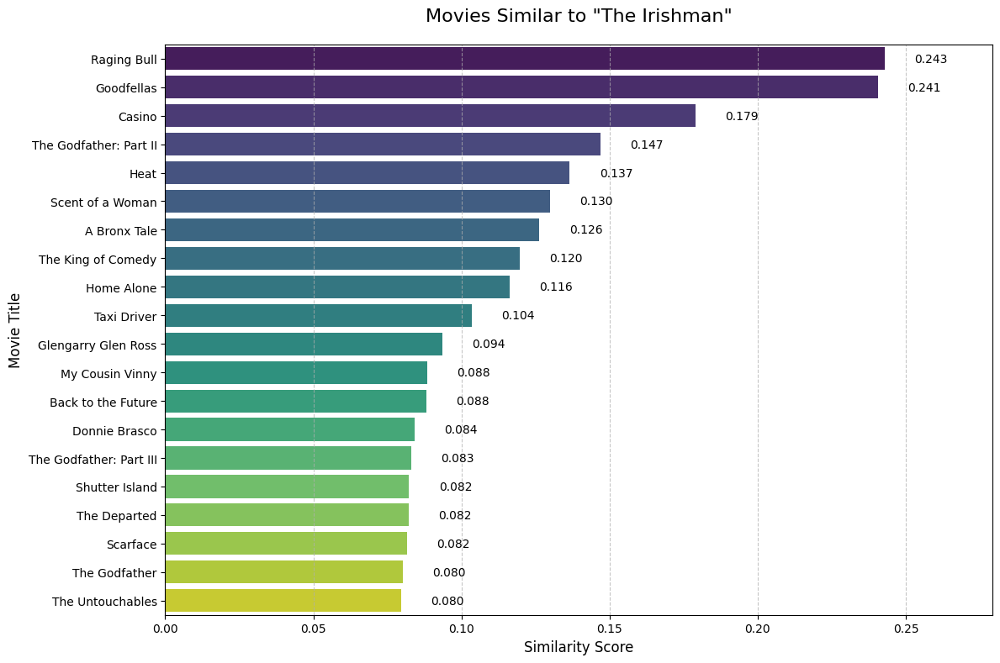

,Series_Title,Overview,Director,Star1,Star2,Star3,Similarity_Score
173,Raging Bull,"The life of boxer Jake LaMotta, whose violence...",Martin Scorsese,Robert De Niro,Cathy Moriarty,Joe Pesci,0.242803
15,Goodfellas,The story of Henry Hill and his life in the mo...,Martin Scorsese,Robert De Niro,Ray Liotta,Joe Pesci,0.240554
165,Casino,"A tale of greed, deception, money, power, and ...",Martin Scorsese,Robert De Niro,Sharon Stone,Joe Pesci,0.178901
3,The Godfather: Part II,The early life and career of Vito Corleone in ...,Francis Ford Coppola,Al Pacino,Robert De Niro,Robert Duvall,0.146893
164,Heat,A group of professional bank robbers start to ...,Michael Mann,Al Pacino,Robert De Niro,Val Kilmer,0.136548
398,Scent of a Woman,A prep school student needing money agrees to ...,Martin Brest,Al Pacino,Chris O'Donnell,James Rebhorn,0.129916
664,A Bronx Tale,A father becomes worried when a local gangster...,Robert De Niro,Robert De Niro,Chazz Palminteri,Lillo Brancato,0.126350
687,The King of Comedy,Rupert Pupkin is a passionate yet unsuccessful...,Martin Scorsese,Robert De Niro,Jerry Lewis,Diahnne Abbott,0.119793
973,Home Alone,An eight-year-old troublemaker must protect hi...,Chris Columbus,Macaulay Culkin,Joe Pesci,Daniel Stern,0.116175
111,Taxi Driver,A mentally unstable veteran works as a nightti...,Martin Scorsese,Robert De Niro,Jodie Foster,Cybill Shepherd,0.103535


In [ ]:
run_movie_recommender(df, "The Irishman", 20)

In [ ]:
def get_optimal_recommendation(input_movie_name, df, siamese_network, tokenizer, model):
    """
    Compare recommendations from both approaches and return the first common movie
    or the top Siamese recommendation if there's no match.

    Parameters:
    input_movie_name (str): Movie title to get recommendations for
    df (pandas.DataFrame): DataFrame containing movie data
    siamese_network: The trained Siamese neural network
    tokenizer: BERT tokenizer for text processing
    model: BERT model for embeddings

    Returns:
    dict: Recommended movie information
    """
    # Get Siamese network recommendations
    siamese_recommendations = recommend_movies(input_movie_name, df, siamese_network, tokenizer, model)

    # Get content-based recommendations without visualization
    # Prepare features and calculate similarity
    similarity_matrix, indices = prepare_movie_features(df)
    content_based_recommendations = get_recommendations(input_movie_name, similarity_matrix, indices, df, top_n=20)

    # Extract movie titles from both recommendation sets
    siamese_titles = siamese_recommendations['Series_Title'].tolist()

    if isinstance(content_based_recommendations, pd.DataFrame):
        content_based_titles = content_based_recommendations['Series_Title'].tolist()
    else:
        # Handle the case where content-based returns an error message
        content_based_titles = []

    # Find common movies (excluding the input movie itself)
    common_movies = []
    for title in siamese_titles:
        if title in content_based_titles and title != input_movie_name:
            common_movies.append(title)

    # If there are common movies, return the first one
    if common_movies:
        # Get the similarity score from Siamese recommendations
        similarity = siamese_recommendations[siamese_recommendations['Series_Title'] == common_movies[0]]['Cosine Similarity'].values[0]
        return {
            "title": common_movies[0],
            "similarity_score": similarity,
            "source": "Both approaches"
        }

    # If no common movie exists, return the top Siamese recommendation (excluding the input movie)
    for title, similarity in zip(siamese_titles, siamese_recommendations['Cosine Similarity']):
        if title != input_movie_name:
            return {
                "title": title,
                "similarity_score": similarity,
                "source": "Siamese network"
            }

    # Fallback if nothing suitable found
    return None

# Example usage
if __name__ == "__main__":
    # Assume df, siamese_network, tokenizer, and model are already loaded
    movie_query = "The Irishman"

    recommendation = get_optimal_recommendation(movie_query, df, siamese_network, tokenizer, model)

    if recommendation:
        print(f"\nOptimal recommendation for '{movie_query}':")
        print(f"Recommended movie: {recommendation['title']}")
        print(f"Similarity score: {recommendation['similarity_score']:.4f}")
        print(f"Source: {recommendation['source']}")
    else:
        print(f"\nNo recommendations available for '{movie_query}'.")


Optimal recommendation for 'The Irishman':
Recommended movie: Donnie Brasco
Similarity score: 0.9548
Source: Both approaches


Saeed Ranjbar

Top 20 movies similar to 'Seppuku':
                             Series_Title  Similarity_Score
                                  Yôjinbô          0.198629
                                  Sanjuro          0.144782
                                      Ran          0.112276
                                Kagemusha          0.104038
                        Tengoku to jigoku          0.101257
                              Kumonosu-jô          0.056563
                                    Shrek          0.050763
Three Billboards Outside Ebbing, Missouri          0.049233
                        The Invisible Man          0.047593
                              Höstsonaten          0.045899
                         Mimi wo sumaseba          0.042406
                                  Control          0.041847
                                 Kokuhaku          0.041344
                         The Long Goodbye          0.039792
                       Viskningar och rop          0.038818
    

<ipython-input-11-6f28ab141b3a>:128: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  ax = sns.barplot(


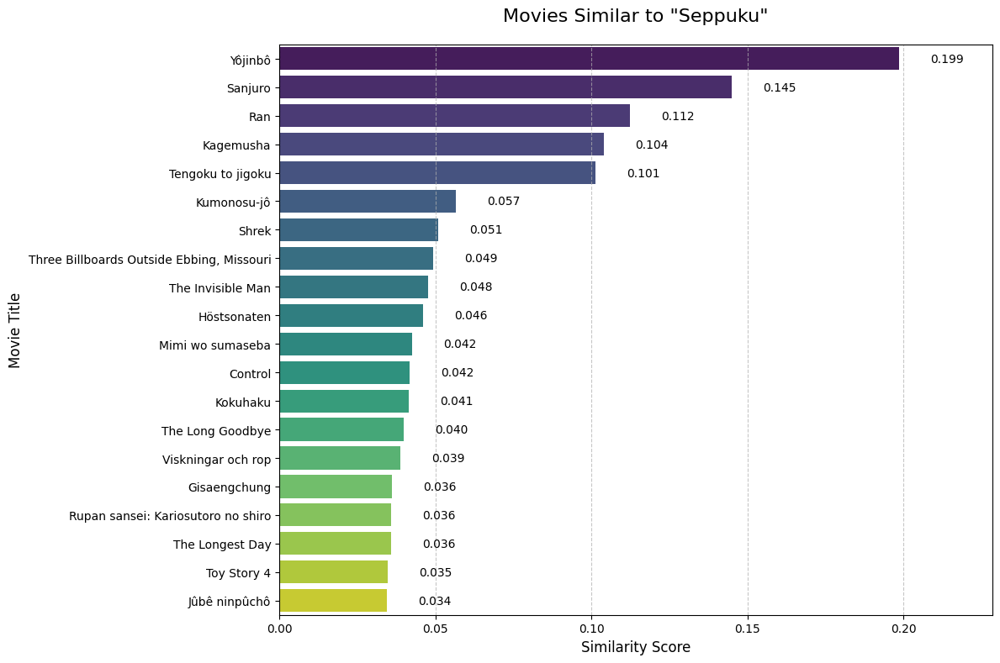

,Series_Title,Overview,Director,Star1,Star2,Star3,Similarity_Score
181,Yôjinbô,A crafty ronin comes to a town divided by two ...,Akira Kurosawa,Toshirô Mifune,Eijirô Tôno,Tatsuya Nakadai,0.198629
294,Sanjuro,A crafty samurai helps a young man and his fel...,Akira Kurosawa,Toshirô Mifune,Tatsuya Nakadai,Keiju Kobayashi,0.144782
172,Ran,"In Medieval Japan, an elderly warlord retires,...",Akira Kurosawa,Tatsuya Nakadai,Akira Terao,Jinpachi Nezu,0.112276
412,Kagemusha,A petty thief with an utter resemblance to a s...,Akira Kurosawa,Tatsuya Nakadai,Tsutomu Yamazaki,Ken'ichi Hagiwara,0.104038
77,Tengoku to jigoku,An executive of a shoe company becomes a victi...,Akira Kurosawa,Toshirô Mifune,Yutaka Sada,Tatsuya Nakadai,0.101257
303,Kumonosu-jô,"A war-hardened general, egged on by his ambiti...",Akira Kurosawa,Toshirô Mifune,Minoru Chiaki,Isuzu Yamada,0.056563
651,Shrek,A mean lord exiles fairytale creatures to the ...,Andrew Adamson,Vicky Jenson,Mike Myers,Eddie Murphy,0.050763
132,"Three Billboards Outside Ebbing, Missouri",A mother personally challenges the local autho...,Martin McDonagh,Frances McDormand,Woody Harrelson,Sam Rockwell,0.049233
876,The Invisible Man,"A scientist finds a way of becoming invisible,...",James Whale,Claude Rains,Gloria Stuart,William Harrigan,0.047593
175,Höstsonaten,A married daughter who longs for her mother's ...,Ingmar Bergman,Ingrid Bergman,Liv Ullmann,Lena Nyman,0.045899


In [ ]:
run_movie_recommender(df, "Seppuku", 20)

In [ ]:
# Example usage
input_movie_name = "Seppuku"
recommended_movies_df = recommend_movies(input_movie_name, df, siamese_network, tokenizer, model)
print(recommended_movies_df)

        Series_Title  Cosine Similarity
0            Seppuku           1.000000
1           The Game           0.968332
2           Watchmen           0.963668
3  Blade Runner 2049           0.948509
4           Oldeuboi           0.920475


In [ ]:
def get_optimal_recommendation(input_movie_name, df, siamese_network, tokenizer, model):
    """
    Compare recommendations from both approaches and return the first common movie
    or the top Siamese recommendation if there's no match.

    Parameters:
    input_movie_name (str): Movie title to get recommendations for
    df (pandas.DataFrame): DataFrame containing movie data
    siamese_network: The trained Siamese neural network
    tokenizer: BERT tokenizer for text processing
    model: BERT model for embeddings

    Returns:
    dict: Recommended movie information
    """
    # Get Siamese network recommendations
    siamese_recommendations = recommend_movies(input_movie_name, df, siamese_network, tokenizer, model)

    # Get content-based recommendations without visualization
    # Prepare features and calculate similarity
    similarity_matrix, indices = prepare_movie_features(df)
    content_based_recommendations = get_recommendations(input_movie_name, similarity_matrix, indices, df, top_n=20)

    # Extract movie titles from both recommendation sets
    siamese_titles = siamese_recommendations['Series_Title'].tolist()

    if isinstance(content_based_recommendations, pd.DataFrame):
        content_based_titles = content_based_recommendations['Series_Title'].tolist()
    else:
        # Handle the case where content-based returns an error message
        content_based_titles = []

    # Find common movies (excluding the input movie itself)
    common_movies = []
    for title in siamese_titles:
        if title in content_based_titles and title != input_movie_name:
            common_movies.append(title)

    # If there are common movies, return the first one
    if common_movies:
        # Get the similarity score from Siamese recommendations
        similarity = siamese_recommendations[siamese_recommendations['Series_Title'] == common_movies[0]]['Cosine Similarity'].values[0]
        return {
            "title": common_movies[0],
            "similarity_score": similarity,
            "source": "Both approaches"
        }

    # If no common movie exists, return the top Siamese recommendation (excluding the input movie)
    for title, similarity in zip(siamese_titles, siamese_recommendations['Cosine Similarity']):
        if title != input_movie_name:
            return {
                "title": title,
                "similarity_score": similarity,
                "source": "Siamese network"
            }

    # Fallback if nothing suitable found
    return None

# Example usage
if __name__ == "__main__":
    # Assume df, siamese_network, tokenizer, and model are already loaded
    movie_query = "Seppuku"

    recommendation = get_optimal_recommendation(movie_query, df, siamese_network, tokenizer, model)

    if recommendation:
        print(f"\nOptimal recommendation for '{movie_query}':")
        print(f"Recommended movie: {recommendation['title']}")
        print(f"Similarity score: {recommendation['similarity_score']:.4f}")
        print(f"Source: {recommendation['source']}")
    else:
        print(f"\nNo recommendations available for '{movie_query}'.")


Optimal recommendation for 'Seppuku':
Recommended movie: The Game
Similarity score: 0.9683
Source: Siamese network


In [ ]:
# Example usage
input_movie_name = "Aliens"
recommended_movies_df = recommend_movies(input_movie_name, df, siamese_network, tokenizer, model)
print(recommended_movies_df)

                                  Series_Title  Cosine Similarity
0                                       Aliens           1.000000
1                                    Mad Max 2           0.985603
2                                     Predator           0.973200
3   Star Wars: Episode VII - The Force Awakens           0.971060
4                             Edge of Tomorrow           0.970929
5                                    Inception           0.961797
6                                    Star Trek           0.956850
7                       Avengers: Infinity War           0.953542
8                            The Fifth Element           0.951149
9                           Mad Max: Fury Road           0.949575
10                                    Iron Man           0.946056
11                                    Serenity           0.945015
12                                   Rogue One           0.943862
13                                The Avengers           0.939278
14        

Top 20 movies similar to 'Aliens':
           Series_Title  Similarity_Score
                  Alien          0.170618
                 Avatar          0.129524
                Titanic          0.099810
         The Terminator          0.096768
           Ghostbusters          0.093928
         Hidden Figures          0.077897
                Gravity          0.076937
                   Room          0.076195
   Shichinin no samurai          0.070773
                   Rush          0.070051
           Interstellar          0.069945
         Reservoir Dogs          0.067299
        The Right Stuff          0.065722
           Blade Runner          0.064247
                Gattaca          0.064099
         The Iron Giant          0.063778
When Harry Met Sally...          0.063760
         Paths of Glory          0.061893
                 WALL·E          0.059576
              Mad Max 2          0.057036


<ipython-input-11-6f28ab141b3a>:128: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  ax = sns.barplot(


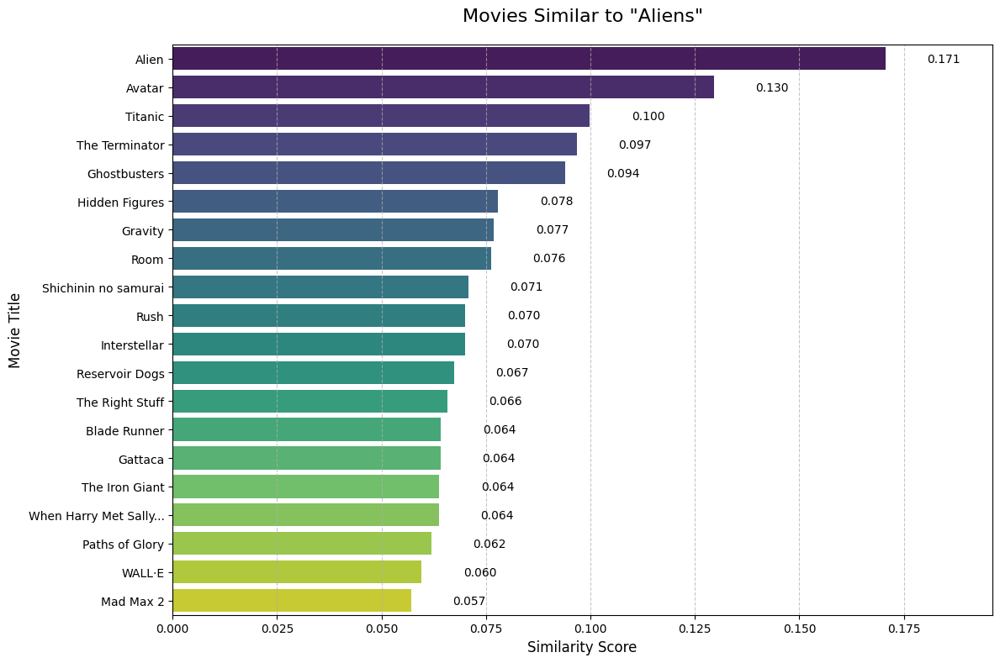

,Series_Title,Overview,Director,Star1,Star2,Star3,Similarity_Score
75,Alien,After a space merchant vessel receives an unkn...,Ridley Scott,Sigourney Weaver,Tom Skerritt,John Hurt,0.170618
623,Avatar,A paraplegic Marine dispatched to the moon Pan...,James Cameron,Sam Worthington,Zoe Saldana,Sigourney Weaver,0.129524
652,Titanic,A seventeen-year-old aristocrat falls in love ...,James Cameron,Leonardo DiCaprio,Kate Winslet,Billy Zane,0.099810
410,The Terminator,A human soldier is sent from 2029 to 1984 to s...,James Cameron,Arnold Schwarzenegger,Linda Hamilton,Michael Biehn,0.096768
685,Ghostbusters,Three former parapsychology professors set up ...,Ivan Reitman,Bill Murray,Dan Aykroyd,Sigourney Weaver,0.093928
575,Hidden Figures,The story of a team of female African-American...,Theodore Melfi,Taraji P. Henson,Octavia Spencer,Janelle Monáe,0.077897
745,Gravity,Two astronauts work together to survive after ...,Alfonso Cuarón,Sandra Bullock,George Clooney,Ed Harris,0.076937
203,Room,"Held captive for 7 years in an enclosed space,...",Lenny Abrahamson,Brie Larson,Jacob Tremblay,Sean Bridgers,0.076195
31,Shichinin no samurai,A poor village under attack by bandits recruit...,Akira Kurosawa,Toshirô Mifune,Takashi Shimura,Keiko Tsushima,0.070773
216,Rush,The merciless 1970s rivalry between Formula On...,Ron Howard,Daniel Brühl,Chris Hemsworth,Olivia Wilde,0.070051


In [ ]:
run_movie_recommender(df, "Aliens", 20)

In [ ]:
def get_optimal_recommendation(input_movie_name, df, siamese_network, tokenizer, model):
    """
    Compare recommendations from both approaches and return the first common movie
    or the top Siamese recommendation if there's no match.

    Parameters:
    input_movie_name (str): Movie title to get recommendations for
    df (pandas.DataFrame): DataFrame containing movie data
    siamese_network: The trained Siamese neural network
    tokenizer: BERT tokenizer for text processing
    model: BERT model for embeddings

    Returns:
    dict: Recommended movie information
    """
    # Get Siamese network recommendations
    siamese_recommendations = recommend_movies(input_movie_name, df, siamese_network, tokenizer, model)

    # Get content-based recommendations without visualization
    # Prepare features and calculate similarity
    similarity_matrix, indices = prepare_movie_features(df)
    content_based_recommendations = get_recommendations(input_movie_name, similarity_matrix, indices, df, top_n=20)

    # Extract movie titles from both recommendation sets
    siamese_titles = siamese_recommendations['Series_Title'].tolist()

    if isinstance(content_based_recommendations, pd.DataFrame):
        content_based_titles = content_based_recommendations['Series_Title'].tolist()
    else:
        # Handle the case where content-based returns an error message
        content_based_titles = []

    # Find common movies (excluding the input movie itself)
    common_movies = []
    for title in siamese_titles:
        if title in content_based_titles and title != input_movie_name:
            common_movies.append(title)

    # If there are common movies, return the first one
    if common_movies:
        # Get the similarity score from Siamese recommendations
        similarity = siamese_recommendations[siamese_recommendations['Series_Title'] == common_movies[0]]['Cosine Similarity'].values[0]
        return {
            "title": common_movies[0],
            "similarity_score": similarity,
            "source": "Both approaches"
        }

    # If no common movie exists, return the top Siamese recommendation (excluding the input movie)
    for title, similarity in zip(siamese_titles, siamese_recommendations['Cosine Similarity']):
        if title != input_movie_name:
            return {
                "title": title,
                "similarity_score": similarity,
                "source": "Siamese network"
            }

    # Fallback if nothing suitable found
    return None

# Example usage
if __name__ == "__main__":
    # Assume df, siamese_network, tokenizer, and model are already loaded
    movie_query = "Aliens"

    recommendation = get_optimal_recommendation(movie_query, df, siamese_network, tokenizer, model)

    if recommendation:
        print(f"\nOptimal recommendation for '{movie_query}':")
        print(f"Recommended movie: {recommendation['title']}")
        print(f"Similarity score: {recommendation['similarity_score']:.4f}")
        print(f"Source: {recommendation['source']}")
    else:
        print(f"\nNo recommendations available for '{movie_query}'.")


Optimal recommendation for 'Aliens':
Recommended movie: Mad Max 2
Similarity score: 0.9856
Source: Both approaches


Behnood obodiyat

In [ ]:
# Example usage
input_movie_name = "Deadpool"
recommended_movies_df = recommend_movies(input_movie_name, df, siamese_network, tokenizer, model)
print(recommended_movies_df)

                     Series_Title  Cosine Similarity
0                        Deadpool           1.000000
1         Guardians of the Galaxy           0.980836
2              The Blues Brothers           0.968398
3    Kingsman: The Secret Service           0.964435
4                  Thor: Ragnarok           0.963187
5                     The General           0.945547
6  Guardians of the Galaxy Vol. 2           0.945491
7               Bajrangi Bhaijaan           0.944472
8                      Deadpool 2           0.943786
9                          Sholay           0.931842


Top 20 movies similar to 'Deadpool':
                   Series_Title  Similarity_Score
                     Deadpool 2          0.214260
The Perks of Being a Wallflower          0.087805
                       Sin City          0.083045
                       Stardust          0.081210
                      Mad Max 2          0.078231
                  Trainspotting          0.073980
                  Carlito's Way          0.073059
                          Queen          0.073024
             Mad Max: Fury Road          0.072080
                      Moneyball          0.068603
      The Count of Monte Cristo          0.068113
                 The Lego Movie          0.067128
              Blade Runner 2049          0.064074
                        Memento          0.057307
                    The Killing          0.052335
               The Big Lebowski          0.051704
                     Paper Moon          0.051649
                 X: First Class          0.046850
             

<ipython-input-11-6f28ab141b3a>:128: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  ax = sns.barplot(


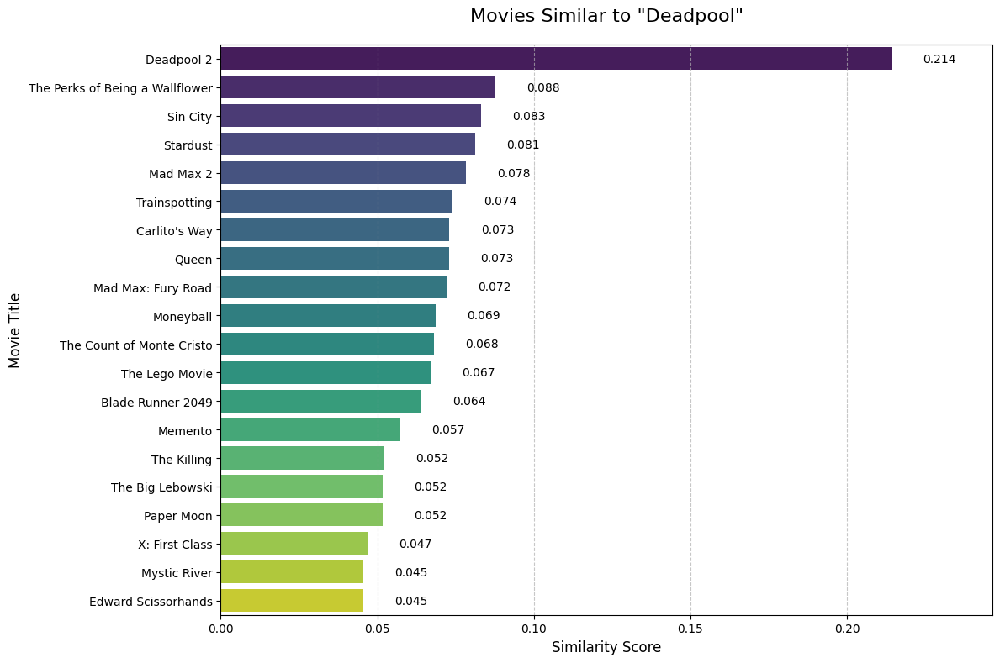

,Series_Title,Overview,Director,Star1,Star2,Star3,Similarity_Score
722,Deadpool 2,Foul-mouthed mutant mercenary Wade Wilson (a.k...,David Leitch,Ryan Reynolds,Josh Brolin,Morena Baccarin,0.214260
344,The Perks of Being a Wallflower,An introvert freshman is taken under the wings...,Stephen Chbosky,Logan Lerman,Emma Watson,Ezra Miller,0.087805
364,Sin City,A movie that explores the dark and miserable t...,Frank Miller,Quentin Tarantino,Robert Rodriguez,Mickey Rourke,0.083045
919,Stardust,In a countryside town bordering on a magical l...,Matthew Vaughn,Charlie Cox,Claire Danes,Sienna Miller,0.081210
982,Mad Max 2,"In the post-apocalyptic Australian wasteland, ...",George Miller,Mel Gibson,Bruce Spence,Michael Preston,0.078231
254,Trainspotting,"Renton, deeply immersed in the Edinburgh drug ...",Danny Boyle,Ewan McGregor,Ewen Bremner,Jonny Lee Miller,0.073980
523,Carlito's Way,"A Puerto Rican former convict, just released f...",Brian De Palma,Al Pacino,Sean Penn,Penelope Ann Miller,0.073059
137,Queen,A Delhi girl from a traditional family sets ou...,Vikas Bahl,Kangana Ranaut,Rajkummar Rao,Lisa Haydon,0.073024
223,Mad Max: Fury Road,"In a post-apocalyptic wasteland, a woman rebel...",George Miller,Tom Hardy,Charlize Theron,Nicholas Hoult,0.072080
910,Moneyball,Oakland A's general manager Billy Beane's succ...,Bennett Miller,Brad Pitt,Robin Wright,Jonah Hill,0.068603


In [ ]:
run_movie_recommender(df, "Deadpool", 20)

In [ ]:
def get_optimal_recommendation(input_movie_name, df, siamese_network, tokenizer, model):
    """
    Compare recommendations from both approaches and return the first common movie
    or the top Siamese recommendation if there's no match.

    Parameters:
    input_movie_name (str): Movie title to get recommendations for
    df (pandas.DataFrame): DataFrame containing movie data
    siamese_network: The trained Siamese neural network
    tokenizer: BERT tokenizer for text processing
    model: BERT model for embeddings

    Returns:
    dict: Recommended movie information
    """
    # Get Siamese network recommendations
    siamese_recommendations = recommend_movies(input_movie_name, df, siamese_network, tokenizer, model)

    # Get content-based recommendations without visualization
    # Prepare features and calculate similarity
    similarity_matrix, indices = prepare_movie_features(df)
    content_based_recommendations = get_recommendations(input_movie_name, similarity_matrix, indices, df, top_n=20)

    # Extract movie titles from both recommendation sets
    siamese_titles = siamese_recommendations['Series_Title'].tolist()

    if isinstance(content_based_recommendations, pd.DataFrame):
        content_based_titles = content_based_recommendations['Series_Title'].tolist()
    else:
        # Handle the case where content-based returns an error message
        content_based_titles = []

    # Find common movies (excluding the input movie itself)
    common_movies = []
    for title in siamese_titles:
        if title in content_based_titles and title != input_movie_name:
            common_movies.append(title)

    # If there are common movies, return the first one
    if common_movies:
        # Get the similarity score from Siamese recommendations
        similarity = siamese_recommendations[siamese_recommendations['Series_Title'] == common_movies[0]]['Cosine Similarity'].values[0]
        return {
            "title": common_movies[0],
            "similarity_score": similarity,
            "source": "Both approaches"
        }

    # If no common movie exists, return the top Siamese recommendation (excluding the input movie)
    for title, similarity in zip(siamese_titles, siamese_recommendations['Cosine Similarity']):
        if title != input_movie_name:
            return {
                "title": title,
                "similarity_score": similarity,
                "source": "Siamese network"
            }

    # Fallback if nothing suitable found
    return None

# Example usage
if __name__ == "__main__":
    # Assume df, siamese_network, tokenizer, and model are already loaded
    movie_query = "Deadpool"

    recommendation = get_optimal_recommendation(movie_query, df, siamese_network, tokenizer, model)

    if recommendation:
        print(f"\nOptimal recommendation for '{movie_query}':")
        print(f"Recommended movie: {recommendation['title']}")
        print(f"Similarity score: {recommendation['similarity_score']:.4f}")
        print(f"Source: {recommendation['source']}")
    else:
        print(f"\nNo recommendations available for '{movie_query}'.")


Optimal recommendation for 'Deadpool':
Recommended movie: Deadpool 2
Similarity score: 0.9438
Source: Both approaches


Asal Khaef

Based on bad movies

Top 20 movies similar to 'The Fall':
                          Series_Title  Similarity_Score
                          Nightcrawler          0.090723
                       Le Petit Prince          0.072397
                        Mulholland Dr.          0.068720
            The Muppet Christmas Carol          0.063264
                            Short Cuts          0.063227
                          Training Day          0.054176
                            La La Land          0.052295
                                 Crash          0.051851
                              Die Hard          0.051109
          M.S. Dhoni: The Untold Story          0.049591
                     L.A. Confidential          0.049477
      Once Upon a Time... in Hollywood          0.048004
                       Boyz n the Hood          0.046665
                             Halloween          0.046429
Harry Potter and the Half-Blood Prince          0.044861
                              Big Fish          0.0

<ipython-input-11-6f28ab141b3a>:128: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  ax = sns.barplot(


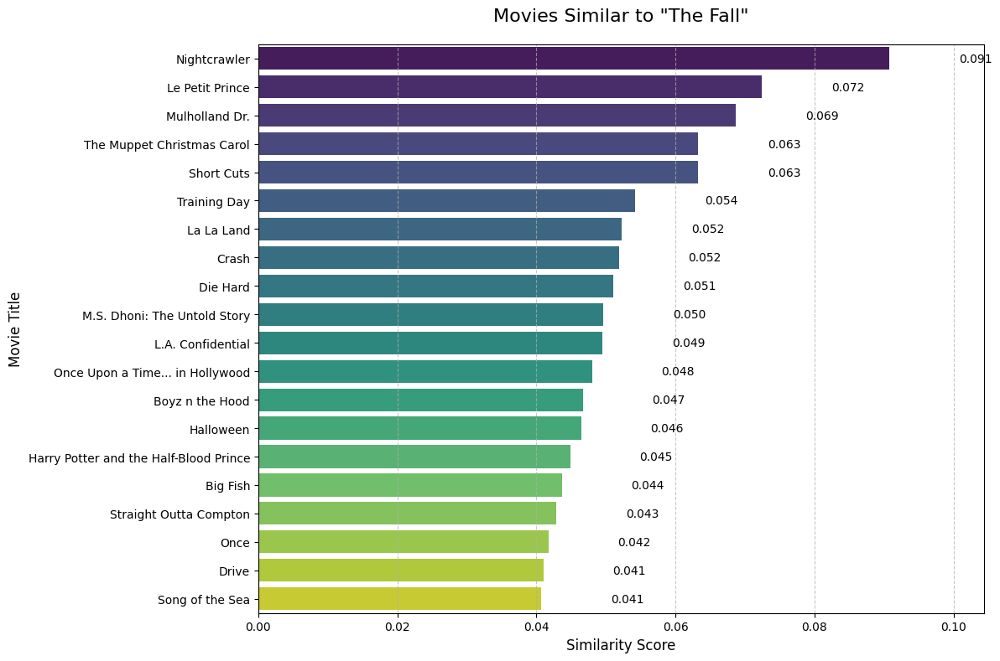

,Series_Title,Overview,Director,Star1,Star2,Star3,Similarity_Score
474,Nightcrawler,"When Louis Bloom, a con man desperate for work...",Dan Gilroy,Jake Gyllenhaal,Rene Russo,Bill Paxton,0.090723
741,Le Petit Prince,A little girl lives in a very grown-up world w...,Mark Osborne,Jeff Bridges,Mackenzie Foy,Rachel McAdams,0.072397
515,Mulholland Dr.,After a car wreck on the winding Mulholland Dr...,David Lynch,Naomi Watts,Laura Harring,Justin Theroux,0.068720
819,The Muppet Christmas Carol,The Muppet characters tell their version of th...,Brian Henson,Michael Caine,Kermit the Frog,Dave Goelz,0.063264
817,Short Cuts,The day-to-day lives of several suburban Los A...,Robert Altman,Andie MacDowell,Julianne Moore,Tim Robbins,0.063227
802,Training Day,A rookie cop spends his first day as a Los Ang...,Antoine Fuqua,Denzel Washington,Ethan Hawke,Scott Glenn,0.054176
327,La La Land,"While navigating their careers in Los Angeles,...",Damien Chazelle,Ryan Gosling,Emma Stone,Rosemarie DeWitt,0.052295
775,Crash,Los Angeles citizens with vastly separate live...,Paul Haggis,Don Cheadle,Sandra Bullock,Thandie Newton,0.051851
171,Die Hard,An NYPD officer tries to save his wife and sev...,John McTiernan,Bruce Willis,Alan Rickman,Bonnie Bedelia,0.051109
579,M.S. Dhoni: The Untold Story,The untold story of Mahendra Singh Dhoni's jou...,Neeraj Pandey,Sushant Singh Rajput,Kiara Advani,Anupam Kher,0.049591


In [ ]:
run_movie_recommender(df, "The Fall", 20)

In [ ]:
# Example usage
input_movie_name = "The Fall"
recommended_movies_df = recommend_movies(input_movie_name, df, siamese_network, tokenizer, model)
print(recommended_movies_df)

                                   Series_Title  Cosine Similarity
0                                      The Fall           1.000000
1                                    Life of Pi           0.979721
2                            La montaña sagrada           0.973548
3                                      Dead Man           0.958332
4                                      Big Fish           0.951575
5  Harry Potter and the Deathly Hallows: Part 2           0.882953


In [ ]:
def get_optimal_recommendation(input_movie_name, df, siamese_network, tokenizer, model):
    """
    Compare recommendations from both approaches and return the first common movie
    or the top Siamese recommendation if there's no match.

    Parameters:
    input_movie_name (str): Movie title to get recommendations for
    df (pandas.DataFrame): DataFrame containing movie data
    siamese_network: The trained Siamese neural network
    tokenizer: BERT tokenizer for text processing
    model: BERT model for embeddings

    Returns:
    dict: Recommended movie information
    """
    # Get Siamese network recommendations
    siamese_recommendations = recommend_movies(input_movie_name, df, siamese_network, tokenizer, model)

    # Get content-based recommendations without visualization
    # Prepare features and calculate similarity
    similarity_matrix, indices = prepare_movie_features(df)
    content_based_recommendations = get_recommendations(input_movie_name, similarity_matrix, indices, df, top_n=20)

    # Extract movie titles from both recommendation sets
    siamese_titles = siamese_recommendations['Series_Title'].tolist()

    if isinstance(content_based_recommendations, pd.DataFrame):
        content_based_titles = content_based_recommendations['Series_Title'].tolist()
    else:
        # Handle the case where content-based returns an error message
        content_based_titles = []

    # Find common movies (excluding the input movie itself)
    common_movies = []
    for title in siamese_titles:
        if title in content_based_titles and title != input_movie_name:
            common_movies.append(title)

    # If there are common movies, return the first one
    if common_movies:
        # Get the similarity score from Siamese recommendations
        similarity = siamese_recommendations[siamese_recommendations['Series_Title'] == common_movies[0]]['Cosine Similarity'].values[0]
        return {
            "title": common_movies[0],
            "similarity_score": similarity,
            "source": "Both approaches"
        }

    # If no common movie exists, return the top Siamese recommendation (excluding the input movie)
    for title, similarity in zip(siamese_titles, siamese_recommendations['Cosine Similarity']):
        if title != input_movie_name:
            return {
                "title": title,
                "similarity_score": similarity,
                "source": "Siamese network"
            }

    # Fallback if nothing suitable found
    return None

# Example usage
if __name__ == "__main__":
    # Assume df, siamese_network, tokenizer, and model are already loaded
    movie_query = "The Fall"

    recommendation = get_optimal_recommendation(movie_query, df, siamese_network, tokenizer, model)

    if recommendation:
        print(f"\nOptimal recommendation for '{movie_query}':")
        print(f"Recommended movie: {recommendation['title']}")
        print(f"Similarity score: {recommendation['similarity_score']:.4f}")
        print(f"Source: {recommendation['source']}")
    else:
        print(f"\nNo recommendations available for '{movie_query}'.")


Optimal recommendation for 'The Fall':
Recommended movie: Big Fish
Similarity score: 0.9516
Source: Both approaches


Pedram kazemi

Top 20 movies similar to '12 Angry Men':
                      Series_Title  Similarity_Score
                    On Golden Pond          0.113869
               The Grapes of Wrath          0.093849
                           Serpico          0.092925
                           Network          0.090940
The Taking of Pelham One Two Three          0.090724
                       The Verdict          0.090555
                 On the Waterfront          0.089137
      Once Upon a Time in the West          0.086777
                The Man from Earth          0.077010
                 Dog Day Afternoon          0.075430
    The Nightmare Before Christmas          0.074389
                 Road to Perdition          0.064919
                            Amélie          0.060235
Indiana Jones and the Last Crusade          0.055240
                        Goodfellas          0.053742
                 L.A. Confidential          0.053694
      Guess Who's Coming to Dinner          0.050424
     

<ipython-input-11-6f28ab141b3a>:128: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  ax = sns.barplot(


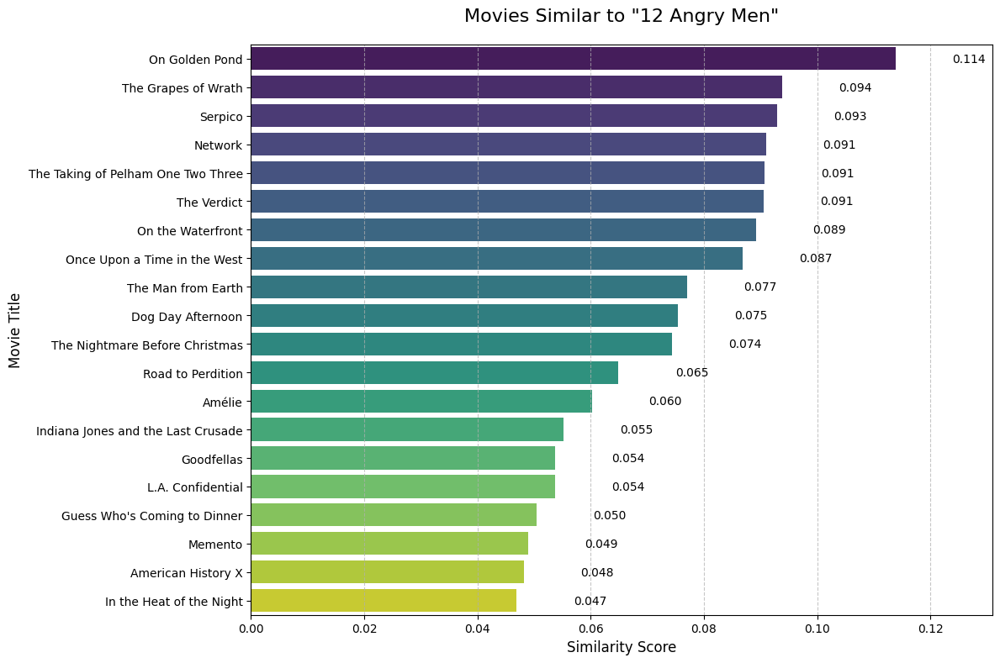

,Series_Title,Overview,Director,Star1,Star2,Star3,Similarity_Score
981,On Golden Pond,Norman is a curmudgeon with an estranged relat...,Mark Rydell,Katharine Hepburn,Henry Fonda,Jane Fonda,0.113869
457,The Grapes of Wrath,A poor Midwest family is forced off their land...,John Ford,Henry Fonda,Jane Darwell,John Carradine,0.093849
849,Serpico,An honest New York cop named Frank Serpico blo...,Sidney Lumet,Al Pacino,John Randolph,Jack Kehoe,0.092925
280,Network,A television network cynically exploits a dera...,Sidney Lumet,Faye Dunaway,William Holden,Peter Finch,0.090940
847,The Taking of Pelham One Two Three,"In New York, armed men hijack a subway car and...",Joseph Sargent,Walter Matthau,Robert Shaw,Martin Balsam,0.090724
838,The Verdict,A lawyer sees the chance to salvage his career...,Sidney Lumet,Paul Newman,Charlotte Rampling,Jack Warden,0.090555
305,On the Waterfront,An ex-prize fighter turned longshoreman strugg...,Elia Kazan,Marlon Brando,Karl Malden,Lee J. Cobb,0.089137
48,Once Upon a Time in the West,A mysterious stranger with a harmonica joins f...,Sergio Leone,Henry Fonda,Charles Bronson,Claudia Cardinale,0.086777
495,The Man from Earth,An impromptu goodbye party for Professor John ...,Richard Schenkman,David Lee Smith,Tony Todd,John Billingsley,0.077010
416,Dog Day Afternoon,Three amateur bank robbers plan to hold up a b...,Sidney Lumet,Al Pacino,John Cazale,Penelope Allen,0.075430


In [ ]:
run_movie_recommender(df, "12 Angry Men", 20)

In [ ]:
# Example usage
input_movie_name = "12 Angry Men"
recommended_movies_df = recommend_movies(input_movie_name, df, siamese_network, tokenizer, model)
print(recommended_movies_df)

                   Series_Title  Cosine Similarity
0                  12 Angry Men           1.000000
1        Les quatre cents coups           0.993662
2                   Un prophète           0.989624
3                      Leviafan           0.988399
4                      La haine           0.988031
5             À bout de souffle           0.987821
6                Cool Hand Luke           0.984885
7       Bir Zamanlar Anadolu'da           0.982321
8            Once Were Warriors           0.981985
9         To Kill a Mockingbird           0.978877
10              This Is England           0.976844
11                 Lilja 4-ever           0.969796
12                     Dogville           0.969698
13                The Godfather           0.968075
14              Boyz n the Hood           0.967129
15               Cidade de Deus           0.964773
16               Manbiki kazoku           0.959337
17  Once Upon a Time in America           0.958621
18                        Drive

In [ ]:
def get_optimal_recommendation(input_movie_name, df, siamese_network, tokenizer, model):
    """
    Compare recommendations from both approaches and return the first common movie
    or the top Siamese recommendation if there's no match.

    Parameters:
    input_movie_name (str): Movie title to get recommendations for
    df (pandas.DataFrame): DataFrame containing movie data
    siamese_network: The trained Siamese neural network
    tokenizer: BERT tokenizer for text processing
    model: BERT model for embeddings

    Returns:
    dict: Recommended movie information
    """
    # Get Siamese network recommendations
    siamese_recommendations = recommend_movies(input_movie_name, df, siamese_network, tokenizer, model)

    # Get content-based recommendations without visualization
    # Prepare features and calculate similarity
    similarity_matrix, indices = prepare_movie_features(df)
    content_based_recommendations = get_recommendations(input_movie_name, similarity_matrix, indices, df, top_n=20)

    # Extract movie titles from both recommendation sets
    siamese_titles = siamese_recommendations['Series_Title'].tolist()

    if isinstance(content_based_recommendations, pd.DataFrame):
        content_based_titles = content_based_recommendations['Series_Title'].tolist()
    else:
        # Handle the case where content-based returns an error message
        content_based_titles = []

    # Find common movies (excluding the input movie itself)
    common_movies = []
    for title in siamese_titles:
        if title in content_based_titles and title != input_movie_name:
            common_movies.append(title)

    # If there are common movies, return the first one
    if common_movies:
        # Get the similarity score from Siamese recommendations
        similarity = siamese_recommendations[siamese_recommendations['Series_Title'] == common_movies[0]]['Cosine Similarity'].values[0]
        return {
            "title": common_movies[0],
            "similarity_score": similarity,
            "source": "Both approaches"
        }

    # If no common movie exists, return the top Siamese recommendation (excluding the input movie)
    for title, similarity in zip(siamese_titles, siamese_recommendations['Cosine Similarity']):
        if title != input_movie_name:
            return {
                "title": title,
                "similarity_score": similarity,
                "source": "Siamese network"
            }

    # Fallback if nothing suitable found
    return None

# Example usage
if __name__ == "__main__":
    # Assume df, siamese_network, tokenizer, and model are already loaded
    movie_query = "12 Angry Men"

    recommendation = get_optimal_recommendation(movie_query, df, siamese_network, tokenizer, model)

    if recommendation:
        print(f"\nOptimal recommendation for '{movie_query}':")
        print(f"Recommended movie: {recommendation['title']}")
        print(f"Similarity score: {recommendation['similarity_score']:.4f}")
        print(f"Source: {recommendation['source']}")
    else:
        print(f"\nNo recommendations available for '{movie_query}'.")


Optimal recommendation for '12 Angry Men':
Recommended movie: Les quatre cents coups
Similarity score: 0.9937
Source: Siamese network


Ali Moshrefi

Based on Bad movies

Top 20 movies similar to 'The Intouchables':
                      Series_Title  Similarity_Score
                           Rebecca          0.100490
                      Philadelphia          0.068178
            Les quatre cents coups          0.066202
                            Sleuth          0.061128
                    Doctor Zhivago          0.060190
                           Titanic          0.057325
                         Spartacus          0.055076
                     Abre los ojos          0.052608
                      Jules et Jim          0.052063
                           Gravity          0.050022
                      Donnie Darko          0.049683
               Le notti di Cabiria          0.046866
                             Mommy          0.045954
              Les yeux sans visage          0.043331
       Ôkami kodomo no Ame to Yuki          0.043118
                     Les choristes          0.042945
                          21 Grams          0.042771
C

<ipython-input-11-6f28ab141b3a>:128: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  ax = sns.barplot(


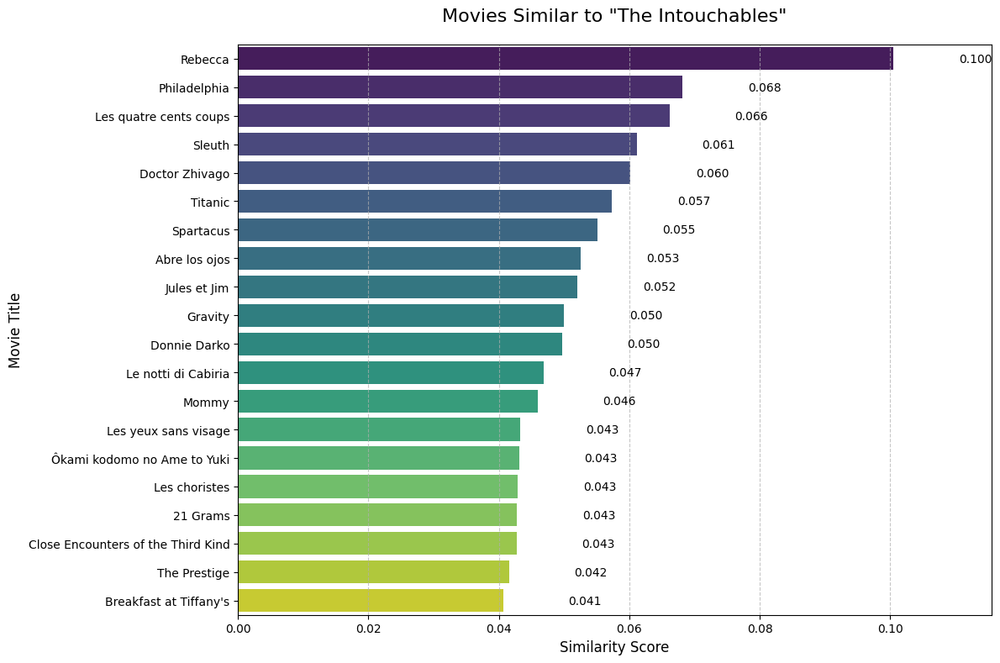

,Series_Title,Overview,Director,Star1,Star2,Star3,Similarity_Score
312,Rebecca,A self-conscious woman juggles adjusting to he...,Alfred Hitchcock,Laurence Olivier,Joan Fontaine,George Sanders,0.100490
818,Philadelphia,When a man with HIV is fired by his law firm b...,Jonathan Demme,Tom Hanks,Denzel Washington,Roberta Maxwell,0.068178
299,Les quatre cents coups,"A young boy, left without attention, delves in...",François Truffaut,Jean-Pierre Léaud,Albert Rémy,Claire Maurier,0.066202
420,Sleuth,A man who loves games and theater invites his ...,Joseph L. Mankiewicz,Laurence Olivier,Michael Caine,Alec Cawthorne,0.061128
430,Doctor Zhivago,"The life of a Russian physician and poet who, ...",David Lean,Omar Sharif,Julie Christie,Geraldine Chaplin,0.060190
652,Titanic,A seventeen-year-old aristocrat falls in love ...,James Cameron,Leonardo DiCaprio,Kate Winslet,Billy Zane,0.057325
549,Spartacus,The slave Spartacus leads a violent revolt aga...,Stanley Kubrick,Kirk Douglas,Laurence Olivier,Jean Simmons,0.055076
804,Abre los ojos,A very handsome man finds the love of his life...,Alejandro Amenábar,Eduardo Noriega,Penélope Cruz,Chete Lera,0.052608
706,Jules et Jim,Decades of a love triangle concerning two frie...,François Truffaut,Jeanne Moreau,Oskar Werner,Henri Serre,0.052063
745,Gravity,Two astronauts work together to survive after ...,Alfonso Cuarón,Sandra Bullock,George Clooney,Ed Harris,0.050022


In [ ]:
run_movie_recommender(df, "The Intouchables", 20)

In [ ]:
# Example usage
input_movie_name = "The Intouchables"
recommended_movies_df = recommend_movies(input_movie_name, df, siamese_network, tokenizer, model)
print(recommended_movies_df)

       Series_Title  Cosine Similarity
0  The Intouchables           1.000000
1             Pride           0.977994
2     The Big Short           0.973728
3        Il postino           0.962366
4        Green Book           0.960133
5         Philomena           0.945230
6           Ed Wood           0.925642


In [ ]:
def get_optimal_recommendation(input_movie_name, df, siamese_network, tokenizer, model):
    """
    Compare recommendations from both approaches and return the first common movie
    or the top Siamese recommendation if there's no match.

    Parameters:
    input_movie_name (str): Movie title to get recommendations for
    df (pandas.DataFrame): DataFrame containing movie data
    siamese_network: The trained Siamese neural network
    tokenizer: BERT tokenizer for text processing
    model: BERT model for embeddings

    Returns:
    dict: Recommended movie information
    """
    # Get Siamese network recommendations
    siamese_recommendations = recommend_movies(input_movie_name, df, siamese_network, tokenizer, model)

    # Get content-based recommendations without visualization
    # Prepare features and calculate similarity
    similarity_matrix, indices = prepare_movie_features(df)
    content_based_recommendations = get_recommendations(input_movie_name, similarity_matrix, indices, df, top_n=20)

    # Extract movie titles from both recommendation sets
    siamese_titles = siamese_recommendations['Series_Title'].tolist()

    if isinstance(content_based_recommendations, pd.DataFrame):
        content_based_titles = content_based_recommendations['Series_Title'].tolist()
    else:
        # Handle the case where content-based returns an error message
        content_based_titles = []

    # Find common movies (excluding the input movie itself)
    common_movies = []
    for title in siamese_titles:
        if title in content_based_titles and title != input_movie_name:
            common_movies.append(title)

    # If there are common movies, return the first one
    if common_movies:
        # Get the similarity score from Siamese recommendations
        similarity = siamese_recommendations[siamese_recommendations['Series_Title'] == common_movies[0]]['Cosine Similarity'].values[0]
        return {
            "title": common_movies[0],
            "similarity_score": similarity,
            "source": "Both approaches"
        }

    # If no common movie exists, return the top Siamese recommendation (excluding the input movie)
    for title, similarity in zip(siamese_titles, siamese_recommendations['Cosine Similarity']):
        if title != input_movie_name:
            return {
                "title": title,
                "similarity_score": similarity,
                "source": "Siamese network"
            }

    # Fallback if nothing suitable found
    return None

# Example usage
if __name__ == "__main__":
    # Assume df, siamese_network, tokenizer, and model are already loaded
    movie_query = "The Intouchables"

    recommendation = get_optimal_recommendation(movie_query, df, siamese_network, tokenizer, model)

    if recommendation:
        print(f"\nOptimal recommendation for '{movie_query}':")
        print(f"Recommended movie: {recommendation['title']}")
        print(f"Similarity score: {recommendation['similarity_score']:.4f}")
        print(f"Source: {recommendation['source']}")
    else:
        print(f"\nNo recommendations available for '{movie_query}'.")


Optimal recommendation for 'The Intouchables':
Recommended movie: Pride
Similarity score: 0.9780
Source: Siamese network


Mohammad Alipoor

Based on Bad movies

Top 20 movies similar to 'Captain America: Civil War':
                             Series_Title  Similarity_Score
                        Avengers: Endgame          0.427370
                   Avengers: Infinity War          0.417578
      Captain America: The Winter Soldier          0.297472
                             The Avengers          0.162302
                             Nightcrawler          0.112560
                          Sherlock Holmes          0.094198
                                 Iron Man          0.089136
                                   Gifted          0.088007
                               Knives Out          0.084803
                                   Zodiac          0.084000
                  Star Trek Into Darkness          0.076406
                             The Irishman          0.074227
Tropa de Elite 2: O Inimigo Agora é Outro          0.073266
           The Nightmare Before Christmas          0.069122
                       The Lion in Winter    

<ipython-input-11-6f28ab141b3a>:128: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  ax = sns.barplot(


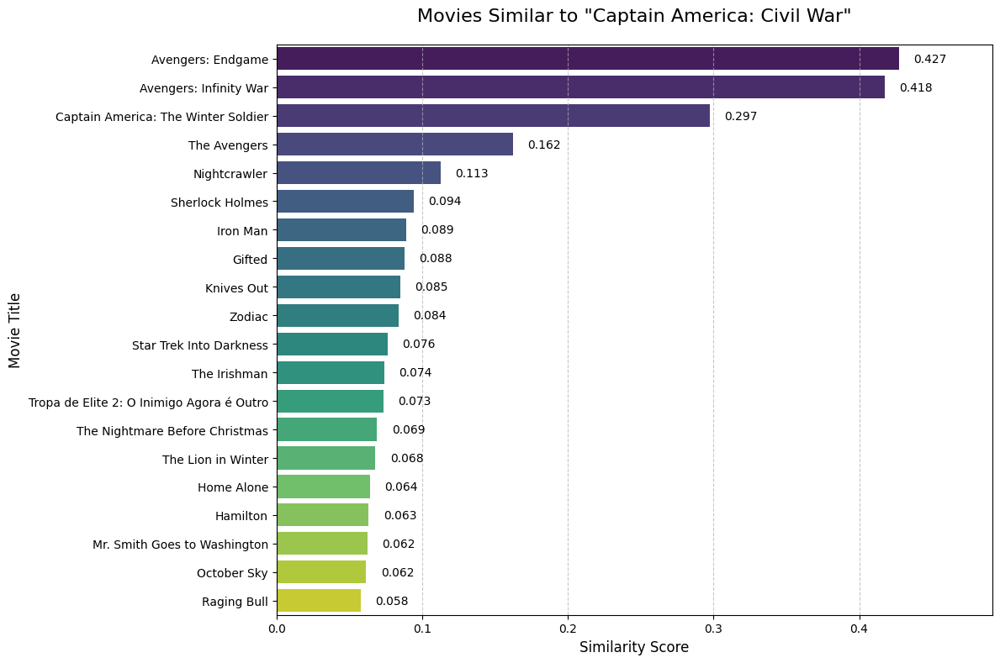

,Series_Title,Overview,Director,Star1,Star2,Star3,Similarity_Score
59,Avengers: Endgame,After the devastating events of Avengers: Infi...,Anthony Russo,Joe Russo,Robert Downey Jr.,Chris Evans,0.427370
60,Avengers: Infinity War,The Avengers and their allies must be willing ...,Anthony Russo,Joe Russo,Robert Downey Jr.,Chris Hemsworth,0.417578
737,Captain America: The Winter Soldier,As Steve Rogers struggles to embrace his role ...,Anthony Russo,Joe Russo,Chris Evans,Samuel L. Jackson,0.297472
357,The Avengers,Earth's mightiest heroes must come together an...,Joss Whedon,Robert Downey Jr.,Chris Evans,Scarlett Johansson,0.162302
474,Nightcrawler,"When Louis Bloom, a con man desperate for work...",Dan Gilroy,Jake Gyllenhaal,Rene Russo,Bill Paxton,0.112560
914,Sherlock Holmes,Detective Sherlock Holmes and his stalwart par...,Guy Ritchie,Robert Downey Jr.,Jude Law,Rachel McAdams,0.094198
502,Iron Man,"After being held captive in an Afghan cave, bi...",Jon Favreau,Robert Downey Jr.,Gwyneth Paltrow,Terrence Howard,0.089136
883,Gifted,"Frank, a single man raising his child prodigy ...",Marc Webb,Chris Evans,Mckenna Grace,Lindsay Duncan,0.088007
463,Knives Out,A detective investigates the death of a patria...,Rian Johnson,Daniel Craig,Chris Evans,Ana de Armas,0.084803
767,Zodiac,"In the late 1960s/early 1970s, a San Francisco...",David Fincher,Jake Gyllenhaal,Robert Downey Jr.,Mark Ruffalo,0.084000


In [ ]:
run_movie_recommender(df, "Captain America: Civil War", 20)

In [ ]:
# Example usage
input_movie_name = "Captain America: Civil War"
recommended_movies_df = recommend_movies(input_movie_name, df, siamese_network, tokenizer, model)
print(recommended_movies_df)

                                  Series_Title  Cosine Similarity
0                   Captain America: Civil War           1.000000
1                             Edge of Tomorrow           0.936419
2                                       Aliens           0.929682
3                                    Mad Max 2           0.917652
4                                     Predator           0.914714
5                                    Star Trek           0.909712
6   Star Wars: Episode VII - The Force Awakens           0.903316
7                                    Rogue One           0.896199
8              Star Trek II: The Wrath of Khan           0.895156
9                       Avengers: Infinity War           0.894933
10                           The Fifth Element           0.893907
11                                   Inception           0.885201
12                                    Iron Man           0.884976
13                          Mad Max: Fury Road           0.858851
14        

In [ ]:
def get_optimal_recommendation(input_movie_name, df, siamese_network, tokenizer, model):
    """
    Compare recommendations from both approaches and return the first common movie
    or the top Siamese recommendation if there's no match.

    Parameters:
    input_movie_name (str): Movie title to get recommendations for
    df (pandas.DataFrame): DataFrame containing movie data
    siamese_network: The trained Siamese neural network
    tokenizer: BERT tokenizer for text processing
    model: BERT model for embeddings

    Returns:
    dict: Recommended movie information
    """
    # Get Siamese network recommendations
    siamese_recommendations = recommend_movies(input_movie_name, df, siamese_network, tokenizer, model)

    # Get content-based recommendations without visualization
    # Prepare features and calculate similarity
    similarity_matrix, indices = prepare_movie_features(df)
    content_based_recommendations = get_recommendations(input_movie_name, similarity_matrix, indices, df, top_n=20)

    # Extract movie titles from both recommendation sets
    siamese_titles = siamese_recommendations['Series_Title'].tolist()

    if isinstance(content_based_recommendations, pd.DataFrame):
        content_based_titles = content_based_recommendations['Series_Title'].tolist()
    else:
        # Handle the case where content-based returns an error message
        content_based_titles = []

    # Find common movies (excluding the input movie itself)
    common_movies = []
    for title in siamese_titles:
        if title in content_based_titles and title != input_movie_name:
            common_movies.append(title)

    # If there are common movies, return the first one
    if common_movies:
        # Get the similarity score from Siamese recommendations
        similarity = siamese_recommendations[siamese_recommendations['Series_Title'] == common_movies[0]]['Cosine Similarity'].values[0]
        return {
            "title": common_movies[0],
            "similarity_score": similarity,
            "source": "Both approaches"
        }

    # If no common movie exists, return the top Siamese recommendation (excluding the input movie)
    for title, similarity in zip(siamese_titles, siamese_recommendations['Cosine Similarity']):
        if title != input_movie_name:
            return {
                "title": title,
                "similarity_score": similarity,
                "source": "Siamese network"
            }

    # Fallback if nothing suitable found
    return None

# Example usage
if __name__ == "__main__":
    # Assume df, siamese_network, tokenizer, and model are already loaded
    movie_query = "Captain America: Civil War"

    recommendation = get_optimal_recommendation(movie_query, df, siamese_network, tokenizer, model)

    if recommendation:
        print(f"\nOptimal recommendation for '{movie_query}':")
        print(f"Recommended movie: {recommendation['title']}")
        print(f"Similarity score: {recommendation['similarity_score']:.4f}")
        print(f"Source: {recommendation['source']}")
    else:
        print(f"\nNo recommendations available for '{movie_query}'.")


Optimal recommendation for 'Captain America: Civil War':
Recommended movie: Avengers: Infinity War
Similarity score: 0.8949
Source: Both approaches


Ali Sorkhe , Reza Charrakh already done

Alireza Baratian

Based on Bad movies

In [18]:
# Example usage
input_movie_name = "The Odd Couple"
recommended_movies_df = recommend_movies(input_movie_name, df, siamese_network, tokenizer, model)
print(recommended_movies_df)

                                         Series_Title  Cosine Similarity
0                                      The Odd Couple           1.000000
1                                        The Hangover           0.988690
2                            Ferris Bueller's Day Off           0.988476
3                                           Airplane!           0.981588
4                                        Office Space           0.973671
5                 Le charme discret de la bourgeoisie           0.972623
6                                              Clerks           0.971475
7                                  Dazed and Confused           0.971187
8                                       Life of Brian           0.967372
9                                               Zelig           0.965815
10                                 Young Frankenstein           0.939784
11  Dr. Strangelove or: How I Learned to Stop Worr...           0.938005
12                                   Le dîner de co

Top 20 movies similar to 'The Odd Couple':
                       Series_Title  Similarity_Score
                      The Apartment          0.130296
                            Charade          0.104712
 The Taking of Pelham One Two Three          0.104672
                Glengarry Glen Ross          0.100252
                Mississippi Burning          0.090451
                                JFK          0.090334
                     Night on Earth          0.089141
                   Some Like It Hot          0.082646
                Singin' in the Rain          0.078586
                         Short Cuts          0.072442
                     Dil Chahta Hai          0.071183
                    Rosemary's Baby          0.068690
Willy Wonka & the Chocolate Factory          0.066305
                   Edge of Tomorrow          0.064874
                           Victoria          0.061932
                          Inception          0.059893
   The Treasure of the Sierra Madre    

<ipython-input-11-6f28ab141b3a>:128: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  ax = sns.barplot(


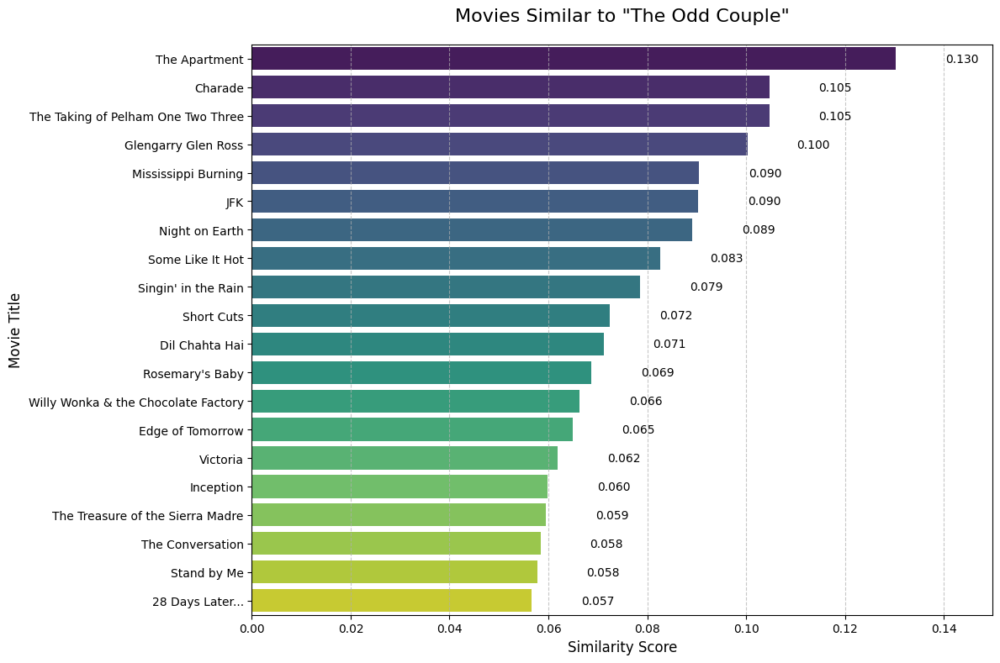

,Series_Title,Overview,Director,Star1,Star2,Star3,Similarity_Score
117,The Apartment,A man tries to rise in his company by letting ...,Billy Wilder,Jack Lemmon,Shirley MacLaine,Fred MacMurray,0.130296
547,Charade,Romance and suspense ensue in Paris as a woman...,Stanley Donen,Cary Grant,Audrey Hepburn,Walter Matthau,0.104712
847,The Taking of Pelham One Two Three,"In New York, armed men hijack a subway car and...",Joseph Sargent,Walter Matthau,Robert Shaw,Martin Balsam,0.104672
823,Glengarry Glen Ross,An examination of the machinations behind the ...,James Foley,Al Pacino,Jack Lemmon,Alec Baldwin,0.100252
676,Mississippi Burning,Two F.B.I. Agents with wildly different styles...,Alan Parker,Gene Hackman,Willem Dafoe,Frances McDormand,0.090451
400,JFK,New Orleans District Attorney Jim Garrison dis...,Oliver Stone,Kevin Costner,Gary Oldman,Jack Lemmon,0.090334
667,Night on Earth,An anthology of 5 different cab drivers in 5 A...,Jim Jarmusch,Winona Ryder,Gena Rowlands,Lisanne Falk,0.089141
183,Some Like It Hot,"After two male musicians witness a mob hit, th...",Billy Wilder,Marilyn Monroe,Tony Curtis,Jack Lemmon,0.082646
120,Singin' in the Rain,A silent film production company and cast make...,Stanley Donen,Gene Kelly,Gene Kelly,Donald O'Connor,0.078586
817,Short Cuts,The day-to-day lives of several suburban Los A...,Robert Altman,Andie MacDowell,Julianne Moore,Tim Robbins,0.072442


In [19]:
run_movie_recommender(df, "The Odd Couple", 20)

In [20]:
def get_optimal_recommendation(input_movie_name, df, siamese_network, tokenizer, model):
    """
    Compare recommendations from both approaches and return the first common movie
    or the top Siamese recommendation if there's no match.

    Parameters:
    input_movie_name (str): Movie title to get recommendations for
    df (pandas.DataFrame): DataFrame containing movie data
    siamese_network: The trained Siamese neural network
    tokenizer: BERT tokenizer for text processing
    model: BERT model for embeddings

    Returns:
    dict: Recommended movie information
    """
    # Get Siamese network recommendations
    siamese_recommendations = recommend_movies(input_movie_name, df, siamese_network, tokenizer, model)

    # Get content-based recommendations without visualization
    # Prepare features and calculate similarity
    similarity_matrix, indices = prepare_movie_features(df)
    content_based_recommendations = get_recommendations(input_movie_name, similarity_matrix, indices, df, top_n=20)

    # Extract movie titles from both recommendation sets
    siamese_titles = siamese_recommendations['Series_Title'].tolist()

    if isinstance(content_based_recommendations, pd.DataFrame):
        content_based_titles = content_based_recommendations['Series_Title'].tolist()
    else:
        # Handle the case where content-based returns an error message
        content_based_titles = []

    # Find common movies (excluding the input movie itself)
    common_movies = []
    for title in siamese_titles:
        if title in content_based_titles and title != input_movie_name:
            common_movies.append(title)

    # If there are common movies, return the first one
    if common_movies:
        # Get the similarity score from Siamese recommendations
        similarity = siamese_recommendations[siamese_recommendations['Series_Title'] == common_movies[0]]['Cosine Similarity'].values[0]
        return {
            "title": common_movies[0],
            "similarity_score": similarity,
            "source": "Both approaches"
        }

    # If no common movie exists, return the top Siamese recommendation (excluding the input movie)
    for title, similarity in zip(siamese_titles, siamese_recommendations['Cosine Similarity']):
        if title != input_movie_name:
            return {
                "title": title,
                "similarity_score": similarity,
                "source": "Siamese network"
            }

    # Fallback if nothing suitable found
    return None

# Example usage
if __name__ == "__main__":
    # Assume df, siamese_network, tokenizer, and model are already loaded
    movie_query = "The Odd Couple"

    recommendation = get_optimal_recommendation(movie_query, df, siamese_network, tokenizer, model)

    if recommendation:
        print(f"\nOptimal recommendation for '{movie_query}':")
        print(f"Recommended movie: {recommendation['title']}")
        print(f"Similarity score: {recommendation['similarity_score']:.4f}")
        print(f"Source: {recommendation['source']}")
    else:
        print(f"\nNo recommendations available for '{movie_query}'.")


Optimal recommendation for 'The Odd Couple':
Recommended movie: The Hangover
Similarity score: 0.9887
Source: Siamese network


Amirrea Monemian

Based on Bad Movie

In [22]:
# Example usage
input_movie_name = "Mad Max: Fury Road"
recommended_movies_df = recommend_movies(input_movie_name, df, siamese_network, tokenizer, model)
print(recommended_movies_df)

                                  Series_Title  Cosine Similarity
0                           Mad Max: Fury Road           1.000000
1                                     Predator           0.995623
2                                    Inception           0.993198
3                                    Mad Max 2           0.990505
4                                Jurassic Park           0.990341
5                   X-Men: Days of Future Past           0.989910
6              Star Trek II: The Wrath of Khan           0.989318
7                                    Rogue One           0.989289
8                            The Fifth Element           0.988895
9                      Star Trek Into Darkness           0.988524
10                                    Iron Man           0.988241
11                                The Avengers           0.987452
12                              X: First Class           0.986604
13                                    Serenity           0.984715
14        

Top 20 movies similar to 'Mad Max: Fury Road':
                                  Series_Title  Similarity_Score
                                     Mad Max 2          0.237813
                      Kubo and the Two Strings          0.133467
                         Män som hatar kvinnor          0.081736
                                  Delicatessen          0.074736
                                      Deadpool          0.072080
                                Das Experiment          0.067812
                           Saving Private Ryan          0.066808
Star Wars: Episode V - The Empire Strikes Back          0.064622
                                  The Revenant          0.064031
                         The Dark Knight Rises          0.062001
                                       Warrior          0.055903
                         Rebel Without a Cause          0.053977
                                 The Gold Rush          0.053404
                              The Great Esc

<ipython-input-11-6f28ab141b3a>:128: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  ax = sns.barplot(


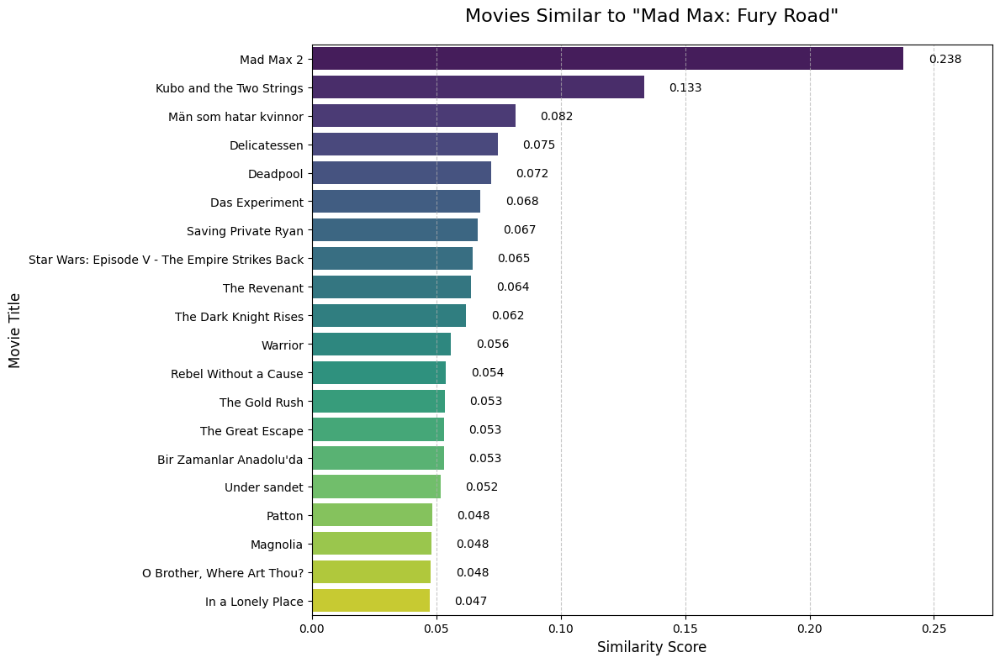

,Series_Title,Overview,Director,Star1,Star2,Star3,Similarity_Score
982,Mad Max 2,"In the post-apocalyptic Australian wasteland, ...",George Miller,Mel Gibson,Bruce Spence,Michael Preston,0.237813
578,Kubo and the Two Strings,A young boy named Kubo must locate a magical s...,Travis Knight,Charlize Theron,Art Parkinson,Matthew McConaughey,0.133467
611,Män som hatar kvinnor,A journalist is aided by a young female hacker...,Niels Arden Oplev,Michael Nyqvist,Noomi Rapace,Ewa Fröling,0.081736
972,Delicatessen,Post-apocalyptic surrealist black comedy about...,Marc Caro,Jean-Pierre Jeunet,Marie-Laure Dougnac,Dominique Pinon,0.074736
348,Deadpool,A wisecracking mercenary gets experimented on ...,Tim Miller,Ryan Reynolds,Morena Baccarin,T.J. Miller,0.072080
792,Das Experiment,"For two weeks, 20 male participants are hired ...",Oliver Hirschbiegel,Moritz Bleibtreu,Christian Berkel,Oliver Stokowski,0.067812
24,Saving Private Ryan,"Following the Normandy Landings, a group of U....",Steven Spielberg,Tom Hanks,Matt Damon,Tom Sizemore,0.066808
16,Star Wars: Episode V - The Empire Strikes Back,After the Rebels are brutally overpowered by t...,Irvin Kershner,Mark Hamill,Harrison Ford,Carrie Fisher,0.064622
343,The Revenant,A frontiersman on a fur trading expedition in ...,Alejandro G. Iñárritu,Leonardo DiCaprio,Tom Hardy,Will Poulter,0.064031
63,The Dark Knight Rises,Eight years after the Joker's reign of anarchy...,Christopher Nolan,Christian Bale,Tom Hardy,Anne Hathaway,0.062001


In [23]:
run_movie_recommender(df, "Mad Max: Fury Road", 20)

In [24]:
def get_optimal_recommendation(input_movie_name, df, siamese_network, tokenizer, model):
    """
    Compare recommendations from both approaches and return the first common movie
    or the top Siamese recommendation if there's no match.

    Parameters:
    input_movie_name (str): Movie title to get recommendations for
    df (pandas.DataFrame): DataFrame containing movie data
    siamese_network: The trained Siamese neural network
    tokenizer: BERT tokenizer for text processing
    model: BERT model for embeddings

    Returns:
    dict: Recommended movie information
    """
    # Get Siamese network recommendations
    siamese_recommendations = recommend_movies(input_movie_name, df, siamese_network, tokenizer, model)

    # Get content-based recommendations without visualization
    # Prepare features and calculate similarity
    similarity_matrix, indices = prepare_movie_features(df)
    content_based_recommendations = get_recommendations(input_movie_name, similarity_matrix, indices, df, top_n=20)

    # Extract movie titles from both recommendation sets
    siamese_titles = siamese_recommendations['Series_Title'].tolist()

    if isinstance(content_based_recommendations, pd.DataFrame):
        content_based_titles = content_based_recommendations['Series_Title'].tolist()
    else:
        # Handle the case where content-based returns an error message
        content_based_titles = []

    # Find common movies (excluding the input movie itself)
    common_movies = []
    for title in siamese_titles:
        if title in content_based_titles and title != input_movie_name:
            common_movies.append(title)

    # If there are common movies, return the first one
    if common_movies:
        # Get the similarity score from Siamese recommendations
        similarity = siamese_recommendations[siamese_recommendations['Series_Title'] == common_movies[0]]['Cosine Similarity'].values[0]
        return {
            "title": common_movies[0],
            "similarity_score": similarity,
            "source": "Both approaches"
        }

    # If no common movie exists, return the top Siamese recommendation (excluding the input movie)
    for title, similarity in zip(siamese_titles, siamese_recommendations['Cosine Similarity']):
        if title != input_movie_name:
            return {
                "title": title,
                "similarity_score": similarity,
                "source": "Siamese network"
            }

    # Fallback if nothing suitable found
    return None

# Example usage
if __name__ == "__main__":
    # Assume df, siamese_network, tokenizer, and model are already loaded
    movie_query = "Mad Max: Fury Road"

    recommendation = get_optimal_recommendation(movie_query, df, siamese_network, tokenizer, model)

    if recommendation:
        print(f"\nOptimal recommendation for '{movie_query}':")
        print(f"Recommended movie: {recommendation['title']}")
        print(f"Similarity score: {recommendation['similarity_score']:.4f}")
        print(f"Source: {recommendation['source']}")
    else:
        print(f"\nNo recommendations available for '{movie_query}'.")


Optimal recommendation for 'Mad Max: Fury Road':
Recommended movie: Mad Max 2
Similarity score: 0.9905
Source: Both approaches


Parisa Mohammadi

Based on Bad movies

In [26]:
# Example usage
input_movie_name = "Terminator 2: Judgment Day"
recommended_movies_df = recommend_movies(input_movie_name, df, siamese_network, tokenizer, model)
print(recommended_movies_df)

                 Series_Title  Cosine Similarity
0  Terminator 2: Judgment Day           1.000000
1                  The Matrix           0.986816
2              The Terminator           0.962684


Top 20 movies similar to 'Terminator 2: Judgment Day':
                    Series_Title  Similarity_Score
                  The Terminator          0.304963
                  Kôkaku Kidôtai          0.129713
                        Predator          0.123969
              American History X          0.115882
                      Deadpool 2          0.102448
                         Warrior          0.097081
             Singin' in the Rain          0.093933
       Hedwig and the Angry Inch          0.082002
           The Day of the Jackal          0.073770
                         Ed Wood          0.071939
            Being John Malkovich          0.069806
               God's Own Country          0.069347
                 La vita è bella          0.062534
                      Goldfinger          0.057557
                       Searching          0.056309
                         Titanic          0.055552
The Man Who Shot Liberty Valance          0.053927
      La double vie de Véro

<ipython-input-11-6f28ab141b3a>:128: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  ax = sns.barplot(


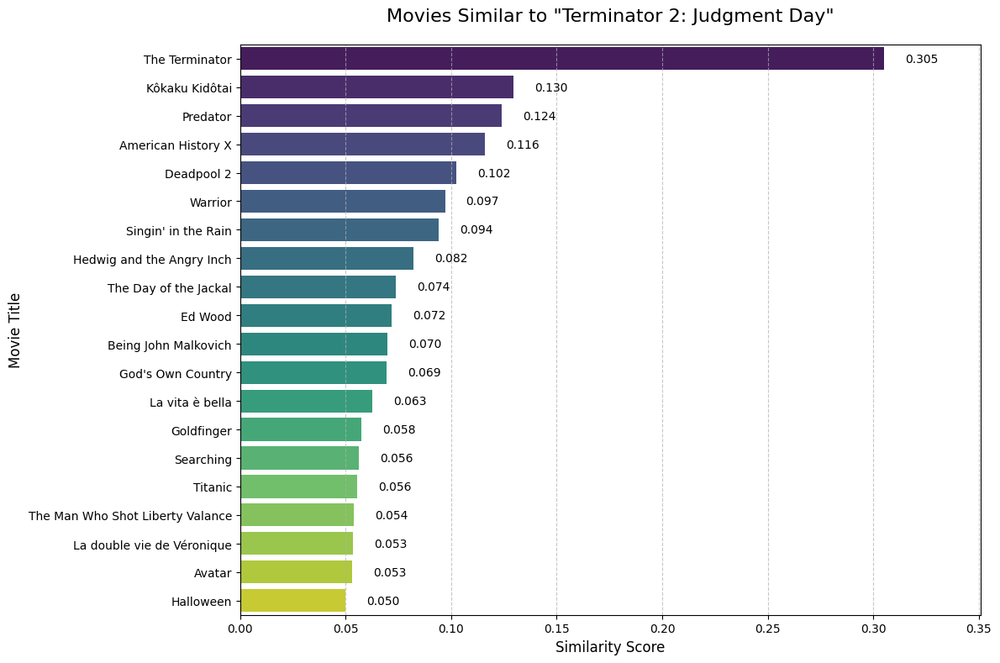

,Series_Title,Overview,Director,Star1,Star2,Star3,Similarity_Score
410,The Terminator,A human soldier is sent from 2029 to 1984 to s...,James Cameron,Arnold Schwarzenegger,Linda Hamilton,Michael Biehn,0.304963
394,Kôkaku Kidôtai,A cyborg policewoman and her partner hunt a my...,Mamoru Oshii,Atsuko Tanaka,Iemasa Kayumi,Akio Ôtsuka,0.129713
677,Predator,A team of commandos on a mission in a Central ...,John McTiernan,Arnold Schwarzenegger,Carl Weathers,Kevin Peter Hall,0.123969
40,American History X,A former neo-nazi skinhead tries to prevent hi...,Tony Kaye,Edward Norton,Edward Furlong,Beverly D'Angelo,0.115882
722,Deadpool 2,Foul-mouthed mutant mercenary Wade Wilson (a.k...,David Leitch,Ryan Reynolds,Josh Brolin,Morena Baccarin,0.102448
144,Warrior,The youngest son of an alcoholic former boxer ...,Gavin O'Connor,Tom Hardy,Nick Nolte,Joel Edgerton,0.097081
120,Singin' in the Rain,A silent film production company and cast make...,Stanley Donen,Gene Kelly,Gene Kelly,Donald O'Connor,0.093933
794,Hedwig and the Angry Inch,A gender-queer punk-rock singer from East Berl...,John Cameron Mitchell,John Cameron Mitchell,Miriam Shor,Stephen Trask,0.082002
695,The Day of the Jackal,"A professional assassin codenamed ""Jackal"" plo...",Fred Zinnemann,Edward Fox,Terence Alexander,Michel Auclair,0.073770
657,Ed Wood,Ambitious but troubled movie director Edward D...,Tim Burton,Johnny Depp,Martin Landau,Sarah Jessica Parker,0.071939


In [27]:
run_movie_recommender(df, "Terminator 2: Judgment Day", 20)

In [28]:
def get_optimal_recommendation(input_movie_name, df, siamese_network, tokenizer, model):
    """
    Compare recommendations from both approaches and return the first common movie
    or the top Siamese recommendation if there's no match.

    Parameters:
    input_movie_name (str): Movie title to get recommendations for
    df (pandas.DataFrame): DataFrame containing movie data
    siamese_network: The trained Siamese neural network
    tokenizer: BERT tokenizer for text processing
    model: BERT model for embeddings

    Returns:
    dict: Recommended movie information
    """
    # Get Siamese network recommendations
    siamese_recommendations = recommend_movies(input_movie_name, df, siamese_network, tokenizer, model)

    # Get content-based recommendations without visualization
    # Prepare features and calculate similarity
    similarity_matrix, indices = prepare_movie_features(df)
    content_based_recommendations = get_recommendations(input_movie_name, similarity_matrix, indices, df, top_n=20)

    # Extract movie titles from both recommendation sets
    siamese_titles = siamese_recommendations['Series_Title'].tolist()

    if isinstance(content_based_recommendations, pd.DataFrame):
        content_based_titles = content_based_recommendations['Series_Title'].tolist()
    else:
        # Handle the case where content-based returns an error message
        content_based_titles = []

    # Find common movies (excluding the input movie itself)
    common_movies = []
    for title in siamese_titles:
        if title in content_based_titles and title != input_movie_name:
            common_movies.append(title)

    # If there are common movies, return the first one
    if common_movies:
        # Get the similarity score from Siamese recommendations
        similarity = siamese_recommendations[siamese_recommendations['Series_Title'] == common_movies[0]]['Cosine Similarity'].values[0]
        return {
            "title": common_movies[0],
            "similarity_score": similarity,
            "source": "Both approaches"
        }

    # If no common movie exists, return the top Siamese recommendation (excluding the input movie)
    for title, similarity in zip(siamese_titles, siamese_recommendations['Cosine Similarity']):
        if title != input_movie_name:
            return {
                "title": title,
                "similarity_score": similarity,
                "source": "Siamese network"
            }

    # Fallback if nothing suitable found
    return None

# Example usage
if __name__ == "__main__":
    # Assume df, siamese_network, tokenizer, and model are already loaded
    movie_query = "Terminator 2: Judgment Day"

    recommendation = get_optimal_recommendation(movie_query, df, siamese_network, tokenizer, model)

    if recommendation:
        print(f"\nOptimal recommendation for '{movie_query}':")
        print(f"Recommended movie: {recommendation['title']}")
        print(f"Similarity score: {recommendation['similarity_score']:.4f}")
        print(f"Source: {recommendation['source']}")
    else:
        print(f"\nNo recommendations available for '{movie_query}'.")


Optimal recommendation for 'Terminator 2: Judgment Day':
Recommended movie: The Terminator
Similarity score: 0.9627
Source: Both approaches


Fatemeh Neshatdoost

Based on bad movies

In [29]:
# Example usage
input_movie_name = "Room"
recommended_movies_df = recommend_movies(input_movie_name, df, siamese_network, tokenizer, model)
print(recommended_movies_df)

                Series_Title  Cosine Similarity
0                       Room           1.000000
1                  Die Welle           0.960016
2             Das Experiment           0.957687
3              Amores perros           0.931047
4              The Machinist           0.923040
5                    Persona           0.920751
6                  Cape Fear           0.920504
7                     Misery           0.918620
8               Le locataire           0.904599
9                       Pink           0.895877
10  The Manchurian Candidate           0.894285
11            A Few Good Men           0.853110
12                Black Swan           0.841209
13                  Kokuhaku           0.833250


Top 20 movies similar to 'Room':
            Series_Title  Similarity_Score
                  Wonder          0.115473
              Just Mercy          0.110068
           Short Term 12          0.101408
         Rang De Basanti          0.099430
                Iron Man          0.097078
            The Notebook          0.082541
       Kramer vs. Kramer          0.081295
            Blade Runner          0.078493
       Tengoku to jigoku          0.077458
          Manbiki kazoku          0.076996
                  Aliens          0.076195
          V for Vendetta          0.073161
           Carlito's Way          0.068284
          The Iron Giant          0.067847
     Fanny och Alexander          0.067403
             Joyeux Noël          0.063966
       Empire of the Sun          0.056395
The Grand Budapest Hotel          0.054671
          Hidden Figures          0.054670
   Män som hatar kvinnor          0.052639


<ipython-input-11-6f28ab141b3a>:128: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  ax = sns.barplot(


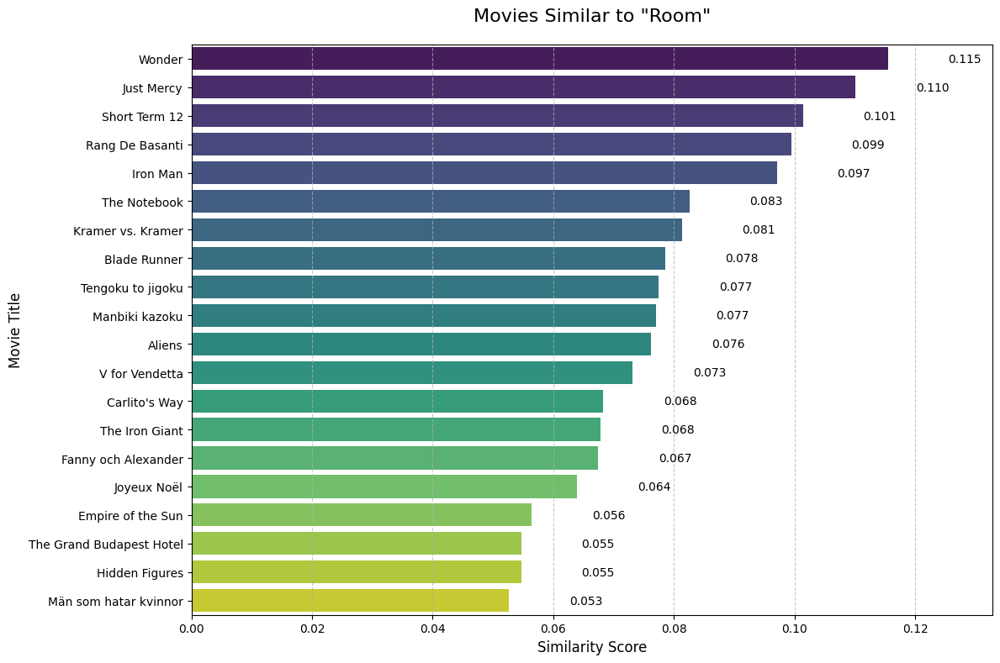

,Series_Title,Overview,Director,Star1,Star2,Star3,Similarity_Score
333,Wonder,"Based on the New York Times bestseller, this m...",Stephen Chbosky,Jacob Tremblay,Owen Wilson,Izabela Vidovic,0.115473
882,Just Mercy,World-renowned civil rights defense attorney B...,Destin Daniel Cretton,Michael B. Jordan,Jamie Foxx,Brie Larson,0.110068
336,Short Term 12,A 20-something supervising staff member of a r...,Destin Daniel Cretton,Brie Larson,Frantz Turner,John Gallagher Jr.,0.101408
153,Rang De Basanti,The story of six young Indians who assist an E...,Rakeysh Omprakash Mehra,Aamir Khan,Soha Ali Khan,Siddharth,0.099430
502,Iron Man,"After being held captive in an Afghan cave, bi...",Jon Favreau,Robert Downey Jr.,Gwyneth Paltrow,Terrence Howard,0.097078
637,The Notebook,A poor yet passionate young man falls in love ...,Nick Cassavetes,Gena Rowlands,James Garner,Rachel McAdams,0.082541
689,Kramer vs. Kramer,"Ted Kramer's wife leaves him, allowing for a l...",Robert Benton,Dustin Hoffman,Meryl Streep,Jane Alexander,0.081295
275,Blade Runner,A blade runner must pursue and terminate four ...,Ridley Scott,Harrison Ford,Rutger Hauer,Sean Young,0.078493
77,Tengoku to jigoku,An executive of a shoe company becomes a victi...,Akira Kurosawa,Toshirô Mifune,Yutaka Sada,Tatsuya Nakadai,0.077458
465,Manbiki kazoku,A family of small-time crooks take in a child ...,Hirokazu Koreeda,Lily Franky,Sakura Andô,Kirin Kiki,0.076996


In [30]:
run_movie_recommender(df, "Room", 20)

In [31]:
def get_optimal_recommendation(input_movie_name, df, siamese_network, tokenizer, model):
    """
    Compare recommendations from both approaches and return the first common movie
    or the top Siamese recommendation if there's no match.

    Parameters:
    input_movie_name (str): Movie title to get recommendations for
    df (pandas.DataFrame): DataFrame containing movie data
    siamese_network: The trained Siamese neural network
    tokenizer: BERT tokenizer for text processing
    model: BERT model for embeddings

    Returns:
    dict: Recommended movie information
    """
    # Get Siamese network recommendations
    siamese_recommendations = recommend_movies(input_movie_name, df, siamese_network, tokenizer, model)

    # Get content-based recommendations without visualization
    # Prepare features and calculate similarity
    similarity_matrix, indices = prepare_movie_features(df)
    content_based_recommendations = get_recommendations(input_movie_name, similarity_matrix, indices, df, top_n=20)

    # Extract movie titles from both recommendation sets
    siamese_titles = siamese_recommendations['Series_Title'].tolist()

    if isinstance(content_based_recommendations, pd.DataFrame):
        content_based_titles = content_based_recommendations['Series_Title'].tolist()
    else:
        # Handle the case where content-based returns an error message
        content_based_titles = []

    # Find common movies (excluding the input movie itself)
    common_movies = []
    for title in siamese_titles:
        if title in content_based_titles and title != input_movie_name:
            common_movies.append(title)

    # If there are common movies, return the first one
    if common_movies:
        # Get the similarity score from Siamese recommendations
        similarity = siamese_recommendations[siamese_recommendations['Series_Title'] == common_movies[0]]['Cosine Similarity'].values[0]
        return {
            "title": common_movies[0],
            "similarity_score": similarity,
            "source": "Both approaches"
        }

    # If no common movie exists, return the top Siamese recommendation (excluding the input movie)
    for title, similarity in zip(siamese_titles, siamese_recommendations['Cosine Similarity']):
        if title != input_movie_name:
            return {
                "title": title,
                "similarity_score": similarity,
                "source": "Siamese network"
            }

    # Fallback if nothing suitable found
    return None

# Example usage
if __name__ == "__main__":
    # Assume df, siamese_network, tokenizer, and model are already loaded
    movie_query = "Room"

    recommendation = get_optimal_recommendation(movie_query, df, siamese_network, tokenizer, model)

    if recommendation:
        print(f"\nOptimal recommendation for '{movie_query}':")
        print(f"Recommended movie: {recommendation['title']}")
        print(f"Similarity score: {recommendation['similarity_score']:.4f}")
        print(f"Source: {recommendation['source']}")
    else:
        print(f"\nNo recommendations available for '{movie_query}'.")


Optimal recommendation for 'Room':
Recommended movie: Die Welle
Similarity score: 0.9600
Source: Siamese network


Mehrdad Tarkesh

In [32]:
# Example usage
input_movie_name = "The Red Shoes"
recommended_movies_df = recommend_movies(input_movie_name, df, siamese_network, tokenizer, model)
print(recommended_movies_df)

                           Series_Title  Cosine Similarity
0                         The Red Shoes           1.000000
1                             Gully Boy           0.960930
2  La leggenda del pianista sull'oceano           0.954106
3                        Ba wang bie ji           0.947314
4                        A Star Is Born           0.936849
5           The Broken Circle Breakdown           0.923168
6                                  Once           0.906519


Top 20 movies similar to 'The Red Shoes':
           Series_Title  Similarity_Score
            Peeping Tom          0.110649
                 Sleuth          0.086287
             The Artist          0.071141
           Billy Elliot          0.070237
    Catch Me If You Can          0.067780
         X: First Class          0.066168
           The Thin Man          0.064285
        The Jungle Book          0.060833
           The Graduate          0.057632
                Control          0.057152
       12 Years a Slave          0.053671
             Black Swan          0.051849
         Days of Heaven          0.050367
         Dom za vesanje          0.050187
         Babam ve Oglum          0.050087
Per un pugno di dollari          0.048792
                 Avatar          0.047036
       Mimi wo sumaseba          0.046727
          All That Jazz          0.046480
 Breakfast at Tiffany's          0.041656


<ipython-input-11-6f28ab141b3a>:128: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  ax = sns.barplot(


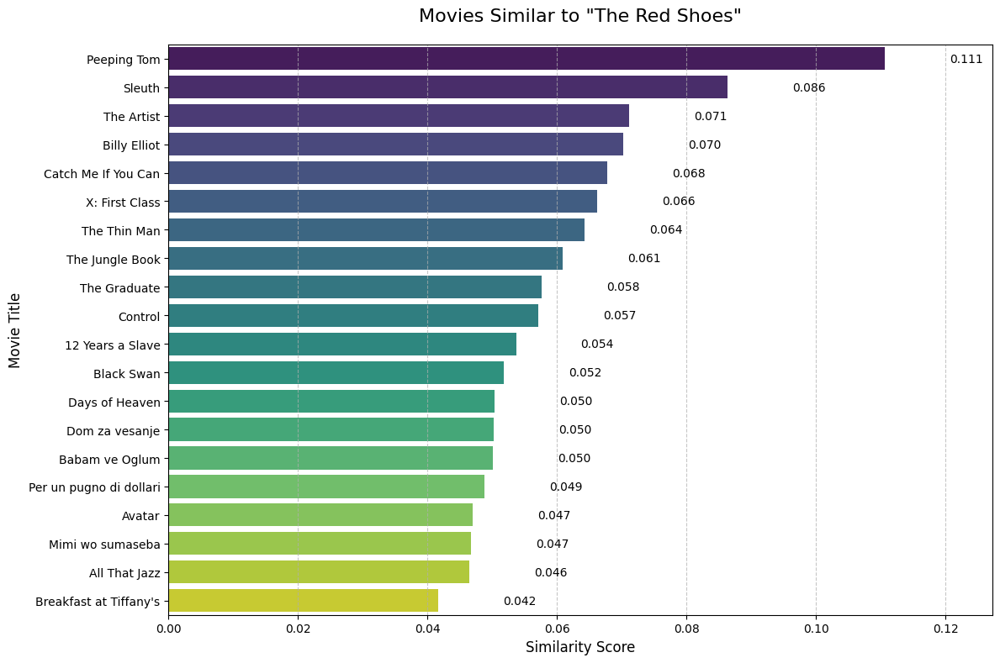

,Series_Title,Overview,Director,Star1,Star2,Star3,Similarity_Score
864,Peeping Tom,"A young man murders women, using a movie camer...",Michael Powell,Karlheinz Böhm,Anna Massey,Moira Shearer,0.110649
420,Sleuth,A man who loves games and theater invites his ...,Joseph L. Mankiewicz,Laurence Olivier,Michael Caine,Alec Cawthorne,0.086287
481,The Artist,An egomaniacal film star develops a relationsh...,Michel Hazanavicius,Jean Dujardin,Bérénice Bejo,John Goodman,0.071141
793,Billy Elliot,A talented young boy becomes torn between his ...,Stephen Daldry,Jamie Bell,Julie Walters,Jean Heywood,0.070237
243,Catch Me If You Can,"Barely 21 yet, Frank is a skilled forger who h...",Steven Spielberg,Leonardo DiCaprio,Tom Hanks,Christopher Walken,0.067780
749,X: First Class,"In the 1960s, superpowered humans Charles Xavi...",Matthew Vaughn,James McAvoy,Michael Fassbender,Jennifer Lawrence,0.066168
460,The Thin Man,Former detective Nick Charles and his wealthy ...,W.S. Van Dyke,William Powell,Myrna Loy,Maureen O'Sullivan,0.064285
992,The Jungle Book,Bagheera the Panther and Baloo the Bear have a...,Wolfgang Reitherman,Phil Harris,Sebastian Cabot,Louis Prima,0.060833
427,The Graduate,A disillusioned college graduate finds himself...,Mike Nichols,Dustin Hoffman,Anne Bancroft,Katharine Ross,0.057632
770,Control,"A profile of Ian Curtis, the enigmatic singer ...",Anton Corbijn,Sam Riley,Samantha Morton,Craig Parkinson,0.057152


In [33]:
run_movie_recommender(df, "The Red Shoes", 20)

In [34]:
def get_optimal_recommendation(input_movie_name, df, siamese_network, tokenizer, model):
    """
    Compare recommendations from both approaches and return the first common movie
    or the top Siamese recommendation if there's no match.

    Parameters:
    input_movie_name (str): Movie title to get recommendations for
    df (pandas.DataFrame): DataFrame containing movie data
    siamese_network: The trained Siamese neural network
    tokenizer: BERT tokenizer for text processing
    model: BERT model for embeddings

    Returns:
    dict: Recommended movie information
    """
    # Get Siamese network recommendations
    siamese_recommendations = recommend_movies(input_movie_name, df, siamese_network, tokenizer, model)

    # Get content-based recommendations without visualization
    # Prepare features and calculate similarity
    similarity_matrix, indices = prepare_movie_features(df)
    content_based_recommendations = get_recommendations(input_movie_name, similarity_matrix, indices, df, top_n=20)

    # Extract movie titles from both recommendation sets
    siamese_titles = siamese_recommendations['Series_Title'].tolist()

    if isinstance(content_based_recommendations, pd.DataFrame):
        content_based_titles = content_based_recommendations['Series_Title'].tolist()
    else:
        # Handle the case where content-based returns an error message
        content_based_titles = []

    # Find common movies (excluding the input movie itself)
    common_movies = []
    for title in siamese_titles:
        if title in content_based_titles and title != input_movie_name:
            common_movies.append(title)

    # If there are common movies, return the first one
    if common_movies:
        # Get the similarity score from Siamese recommendations
        similarity = siamese_recommendations[siamese_recommendations['Series_Title'] == common_movies[0]]['Cosine Similarity'].values[0]
        return {
            "title": common_movies[0],
            "similarity_score": similarity,
            "source": "Both approaches"
        }

    # If no common movie exists, return the top Siamese recommendation (excluding the input movie)
    for title, similarity in zip(siamese_titles, siamese_recommendations['Cosine Similarity']):
        if title != input_movie_name:
            return {
                "title": title,
                "similarity_score": similarity,
                "source": "Siamese network"
            }

    # Fallback if nothing suitable found
    return None

# Example usage
if __name__ == "__main__":
    # Assume df, siamese_network, tokenizer, and model are already loaded
    movie_query = "The Red Shoes"

    recommendation = get_optimal_recommendation(movie_query, df, siamese_network, tokenizer, model)

    if recommendation:
        print(f"\nOptimal recommendation for '{movie_query}':")
        print(f"Recommended movie: {recommendation['title']}")
        print(f"Similarity score: {recommendation['similarity_score']:.4f}")
        print(f"Source: {recommendation['source']}")
    else:
        print(f"\nNo recommendations available for '{movie_query}'.")


Optimal recommendation for 'The Red Shoes':
Recommended movie: Gully Boy
Similarity score: 0.9609
Source: Siamese network


Top 20 movies similar to 'Rebecca':
                 Series_Title  Similarity_Score
                      Vertigo          0.151618
                       Sleuth          0.132820
            Dial M for Murder          0.132311
                     Le passé          0.128971
                    Spartacus          0.102461
             The Intouchables          0.100490
                    Notorious          0.095947
                   Forushande          0.095876
Sunrise: A Song of Two Humans          0.087797
           North by Northwest          0.086509
                        Gilda          0.085005
         Strangers on a Train          0.075048
                All About Eve          0.074919
                  Rear Window          0.071710
                         Rope          0.070747
            The Lady Vanishes          0.069839
  Dà hóng denglong gaogao guà          0.063612
                     Lifeboat          0.063251
           Dead Poets Society          0.062788
    

<ipython-input-11-6f28ab141b3a>:128: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  ax = sns.barplot(


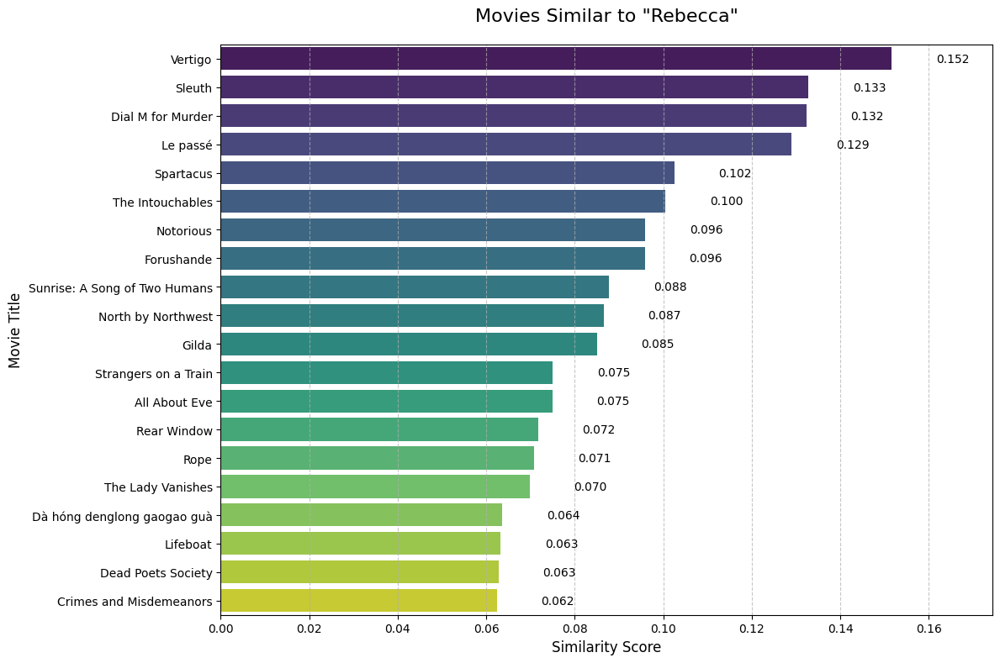

,Series_Title,Overview,Director,Star1,Star2,Star3,Similarity_Score
119,Vertigo,A former police detective juggles wrestling wi...,Alfred Hitchcock,James Stewart,Kim Novak,Barbara Bel Geddes,0.151618
420,Sleuth,A man who loves games and theater invites his ...,Joseph L. Mankiewicz,Laurence Olivier,Michael Caine,Alec Cawthorne,0.132820
187,Dial M for Murder,A former tennis player tries to arrange his wi...,Alfred Hitchcock,Ray Milland,Grace Kelly,Robert Cummings,0.132311
588,Le passé,An Iranian man deserts his French wife and her...,Asghar Farhadi,Bérénice Bejo,Tahar Rahim,Ali Mosaffa,0.128971
549,Spartacus,The slave Spartacus leads a violent revolt aga...,Stanley Kubrick,Kirk Douglas,Laurence Olivier,Jean Simmons,0.102461
35,The Intouchables,After he becomes a quadriplegic from a paragli...,Olivier Nakache,Éric Toledano,François Cluzet,Omar Sy,0.100490
559,Notorious,A woman is asked to spy on a group of Nazi fri...,Alfred Hitchcock,Cary Grant,Ingrid Bergman,Claude Rains,0.095947
572,Forushande,"While both participating in a production of ""D...",Asghar Farhadi,Shahab Hosseini,Taraneh Alidoosti,Babak Karimi,0.095876
319,Sunrise: A Song of Two Humans,An allegorical tale about a man fighting the g...,F.W. Murnau,George O'Brien,Janet Gaynor,Margaret Livingston,0.087797
118,North by Northwest,A New York City advertising executive goes on ...,Alfred Hitchcock,Cary Grant,Eva Marie Saint,James Mason,0.086509


In [35]:
run_movie_recommender(df, "Rebecca", 20)

In [36]:
# Example usage
input_movie_name = "Rebecca"
recommended_movies_df = recommend_movies(input_movie_name, df, siamese_network, tokenizer, model)
print(recommended_movies_df)

                      Series_Title  Cosine Similarity
0                          Rebecca           1.000000
1                        Atonement           0.987290
2           El secreto de sus ojos           0.970843
3                   Hable con ella           0.937003
4  Un long dimanche de fiançailles           0.920516
5            Trois couleurs: Rouge           0.910810


In [37]:
def get_optimal_recommendation(input_movie_name, df, siamese_network, tokenizer, model):
    """
    Compare recommendations from both approaches and return the first common movie
    or the top Siamese recommendation if there's no match.

    Parameters:
    input_movie_name (str): Movie title to get recommendations for
    df (pandas.DataFrame): DataFrame containing movie data
    siamese_network: The trained Siamese neural network
    tokenizer: BERT tokenizer for text processing
    model: BERT model for embeddings

    Returns:
    dict: Recommended movie information
    """
    # Get Siamese network recommendations
    siamese_recommendations = recommend_movies(input_movie_name, df, siamese_network, tokenizer, model)

    # Get content-based recommendations without visualization
    # Prepare features and calculate similarity
    similarity_matrix, indices = prepare_movie_features(df)
    content_based_recommendations = get_recommendations(input_movie_name, similarity_matrix, indices, df, top_n=20)

    # Extract movie titles from both recommendation sets
    siamese_titles = siamese_recommendations['Series_Title'].tolist()

    if isinstance(content_based_recommendations, pd.DataFrame):
        content_based_titles = content_based_recommendations['Series_Title'].tolist()
    else:
        # Handle the case where content-based returns an error message
        content_based_titles = []

    # Find common movies (excluding the input movie itself)
    common_movies = []
    for title in siamese_titles:
        if title in content_based_titles and title != input_movie_name:
            common_movies.append(title)

    # If there are common movies, return the first one
    if common_movies:
        # Get the similarity score from Siamese recommendations
        similarity = siamese_recommendations[siamese_recommendations['Series_Title'] == common_movies[0]]['Cosine Similarity'].values[0]
        return {
            "title": common_movies[0],
            "similarity_score": similarity,
            "source": "Both approaches"
        }

    # If no common movie exists, return the top Siamese recommendation (excluding the input movie)
    for title, similarity in zip(siamese_titles, siamese_recommendations['Cosine Similarity']):
        if title != input_movie_name:
            return {
                "title": title,
                "similarity_score": similarity,
                "source": "Siamese network"
            }

    # Fallback if nothing suitable found
    return None

# Example usage
if __name__ == "__main__":
    # Assume df, siamese_network, tokenizer, and model are already loaded
    movie_query = "Rebecca"

    recommendation = get_optimal_recommendation(movie_query, df, siamese_network, tokenizer, model)

    if recommendation:
        print(f"\nOptimal recommendation for '{movie_query}':")
        print(f"Recommended movie: {recommendation['title']}")
        print(f"Similarity score: {recommendation['similarity_score']:.4f}")
        print(f"Source: {recommendation['source']}")
    else:
        print(f"\nNo recommendations available for '{movie_query}'.")


Optimal recommendation for 'Rebecca':
Recommended movie: Atonement
Similarity score: 0.9873
Source: Siamese network


Arezu Sabri

Based on bad movies

In [38]:
# Example usage
input_movie_name = "Ghostbusters"
recommended_movies_df = recommend_movies(input_movie_name, df, siamese_network, tokenizer, model)
print(recommended_movies_df)

   Series_Title  Cosine Similarity
0  Ghostbusters           1.000000
1  Evil Dead II           0.965355
2       Kung fu           0.953240


Top 20 movies similar to 'Ghostbusters':
                Series_Title  Similarity_Score
                      Avatar          0.165737
          The Blues Brothers          0.116580
                       Alien          0.101695
                      Aliens          0.093928
   The Man Who Would Be King          0.073289
             OMG: Oh My God!          0.062676
               Groundhog Day          0.061292
  The Shop Around the Corner          0.057329
                    Rushmore          0.055905
               Andrei Rublev          0.054908
               The Gold Rush          0.054826
              Vozvrashchenie          0.053529
                 After Hours          0.053444
               Pâfekuto burû          0.053305
                   Happiness          0.053298
Batman: Mask of the Phantasm          0.052828
                 Adams æbler          0.052640
                    Iron Man          0.051718
      The Remains of the Day          0.051372
                   

<ipython-input-11-6f28ab141b3a>:128: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  ax = sns.barplot(


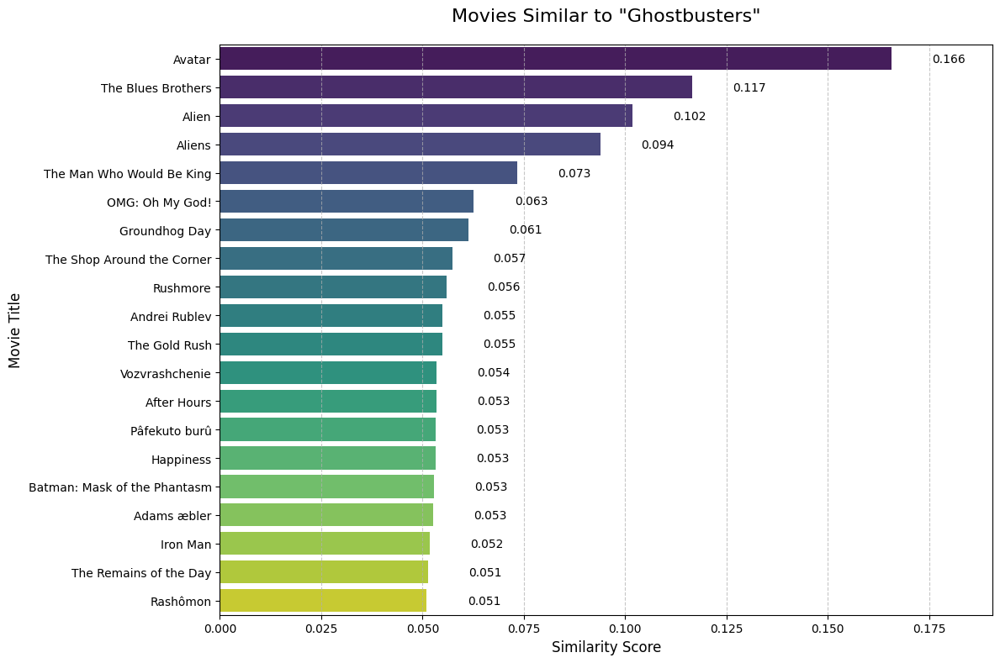

,Series_Title,Overview,Director,Star1,Star2,Star3,Similarity_Score
623,Avatar,A paraplegic Marine dispatched to the moon Pan...,James Cameron,Sam Worthington,Zoe Saldana,Sigourney Weaver,0.165737
532,The Blues Brothers,"Jake Blues, just released from prison, puts to...",John Landis,John Belushi,Dan Aykroyd,Cab Calloway,0.116580
75,Alien,After a space merchant vessel receives an unkn...,Ridley Scott,Sigourney Weaver,Tom Skerritt,John Hurt,0.101695
106,Aliens,Fifty-seven years after surviving an apocalypt...,James Cameron,Sigourney Weaver,Michael Biehn,Carrie Henn,0.093928
692,The Man Who Would Be King,Two British former soldiers decide to set them...,John Huston,Sean Connery,Michael Caine,Christopher Plummer,0.073289
208,OMG: Oh My God!,A shopkeeper takes God to court when his shop ...,Umesh Shukla,Paresh Rawal,Akshay Kumar,Mithun Chakraborty,0.062676
396,Groundhog Day,A weatherman finds himself inexplicably living...,Harold Ramis,Bill Murray,Andie MacDowell,Chris Elliott,0.061292
311,The Shop Around the Corner,Two employees at a gift shop can barely stand ...,Ernst Lubitsch,Margaret Sullavan,James Stewart,Frank Morgan,0.057329
803,Rushmore,The extracurricular king of Rushmore Preparato...,Wes Anderson,Jason Schwartzman,Bill Murray,Olivia Williams,0.055905
290,Andrei Rublev,"The life, times and afflictions of the fifteen...",Andrei Tarkovsky,Anatoliy Solonitsyn,Ivan Lapikov,Nikolay Grinko,0.054908


In [39]:
run_movie_recommender(df, "Ghostbusters", 20)

In [40]:
def get_optimal_recommendation(input_movie_name, df, siamese_network, tokenizer, model):
    """
    Compare recommendations from both approaches and return the first common movie
    or the top Siamese recommendation if there's no match.

    Parameters:
    input_movie_name (str): Movie title to get recommendations for
    df (pandas.DataFrame): DataFrame containing movie data
    siamese_network: The trained Siamese neural network
    tokenizer: BERT tokenizer for text processing
    model: BERT model for embeddings

    Returns:
    dict: Recommended movie information
    """
    # Get Siamese network recommendations
    siamese_recommendations = recommend_movies(input_movie_name, df, siamese_network, tokenizer, model)

    # Get content-based recommendations without visualization
    # Prepare features and calculate similarity
    similarity_matrix, indices = prepare_movie_features(df)
    content_based_recommendations = get_recommendations(input_movie_name, similarity_matrix, indices, df, top_n=20)

    # Extract movie titles from both recommendation sets
    siamese_titles = siamese_recommendations['Series_Title'].tolist()

    if isinstance(content_based_recommendations, pd.DataFrame):
        content_based_titles = content_based_recommendations['Series_Title'].tolist()
    else:
        # Handle the case where content-based returns an error message
        content_based_titles = []

    # Find common movies (excluding the input movie itself)
    common_movies = []
    for title in siamese_titles:
        if title in content_based_titles and title != input_movie_name:
            common_movies.append(title)

    # If there are common movies, return the first one
    if common_movies:
        # Get the similarity score from Siamese recommendations
        similarity = siamese_recommendations[siamese_recommendations['Series_Title'] == common_movies[0]]['Cosine Similarity'].values[0]
        return {
            "title": common_movies[0],
            "similarity_score": similarity,
            "source": "Both approaches"
        }

    # If no common movie exists, return the top Siamese recommendation (excluding the input movie)
    for title, similarity in zip(siamese_titles, siamese_recommendations['Cosine Similarity']):
        if title != input_movie_name:
            return {
                "title": title,
                "similarity_score": similarity,
                "source": "Siamese network"
            }

    # Fallback if nothing suitable found
    return None

# Example usage
if __name__ == "__main__":
    # Assume df, siamese_network, tokenizer, and model are already loaded
    movie_query = "Ghostbusters"

    recommendation = get_optimal_recommendation(movie_query, df, siamese_network, tokenizer, model)

    if recommendation:
        print(f"\nOptimal recommendation for '{movie_query}':")
        print(f"Recommended movie: {recommendation['title']}")
        print(f"Similarity score: {recommendation['similarity_score']:.4f}")
        print(f"Source: {recommendation['source']}")
    else:
        print(f"\nNo recommendations available for '{movie_query}'.")


Optimal recommendation for 'Ghostbusters':
Recommended movie: Evil Dead II
Similarity score: 0.9654
Source: Siamese network


Manan Amiri

In [41]:
# Example usage
input_movie_name = "Watership Down"
recommended_movies_df = recommend_movies(input_movie_name, df, siamese_network, tokenizer, model)
print(recommended_movies_df)

               Series_Title  Cosine Similarity
0            Watership Down           1.000000
1           Song of the Sea           0.967084
2             The Lion King           0.943220
3  Kaguyahime no monogatari           0.934092
4           Le Petit Prince           0.928489
5    Tenkû no shiro Rapyuta           0.870235
6         Majo no takkyûbin           0.851702


Top 20 movies similar to 'Watership Down':
                    Series_Title  Similarity_Score
                 Midnight Cowboy          0.107470
                The Great Escape          0.093041
       The Man Who Would Be King          0.088112
                           Moana          0.085611
              The Blues Brothers          0.081904
    Planes, Trains & Automobiles          0.078966
                     Barton Fink          0.071039
                   Do lok tin si          0.070535
                     Toy Story 2          0.070040
                           Mulan          0.068638
              The Man from Earth          0.068549
                           Alien          0.068434
                       Mad Max 2          0.068175
                     Raging Bull          0.067985
                     Down by Law          0.067917
                The Elephant Man          0.067915
The Man Who Shot Liberty Valance          0.066509
      Die Hard: With a Vengeance       

<ipython-input-11-6f28ab141b3a>:128: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  ax = sns.barplot(


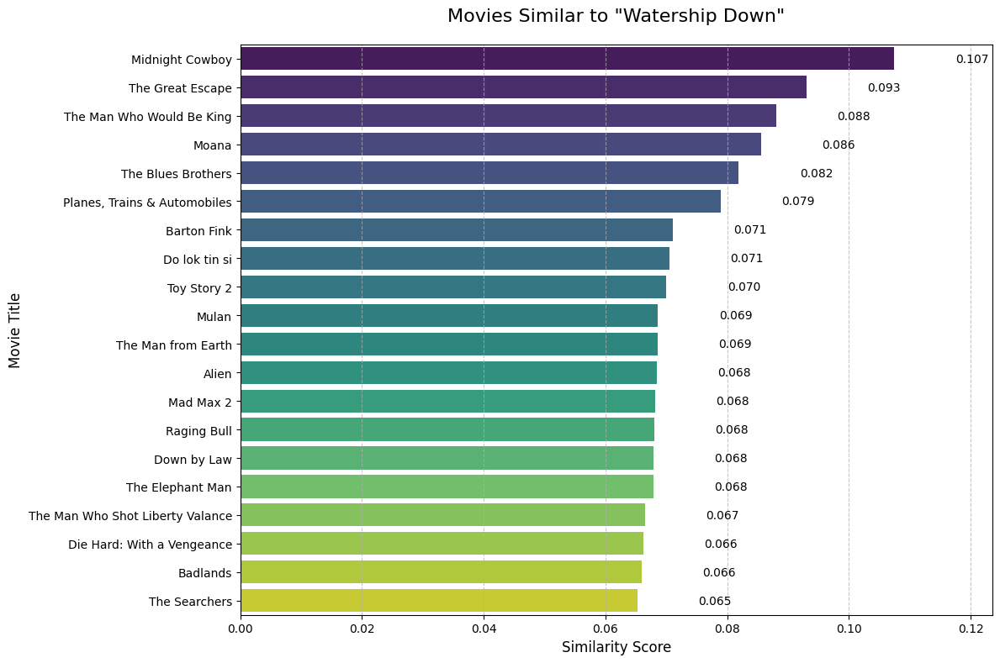

,Series_Title,Overview,Director,Star1,Star2,Star3,Similarity_Score
699,Midnight Cowboy,A naive hustler travels from Texas to New York...,John Schlesinger,Dustin Hoffman,Jon Voight,Sylvia Miles,0.107470
179,The Great Escape,Allied prisoners of war plan for several hundr...,John Sturges,Steve McQueen,James Garner,Richard Attenborough,0.093041
692,The Man Who Would Be King,Two British former soldiers decide to set them...,John Huston,Sean Connery,Michael Caine,Christopher Plummer,0.088112
892,Moana,"In Ancient Polynesia, when a terrible curse in...",Ron Clements,John Musker,Don Hall,Chris Williams,0.085611
532,The Blues Brothers,"Jake Blues, just released from prison, puts to...",John Landis,John Belushi,Dan Aykroyd,Cab Calloway,0.081904
978,"Planes, Trains & Automobiles",A man must struggle to travel home for Thanksg...,John Hughes,Steve Martin,John Candy,Laila Robins,0.078966
826,Barton Fink,A renowned New York playwright is enticed to C...,Joel Coen,Ethan Coen,John Turturro,John Goodman,0.071039
814,Do lok tin si,This Hong Kong-set crime drama follows the liv...,Kar-Wai Wong,Leon Lai,Michelle Reis,Takeshi Kaneshiro,0.070535
516,Toy Story 2,"When Woody is stolen by a toy collector, Buzz ...",John Lasseter,Ash Brannon,Lee Unkrich,Tom Hanks,0.070040
956,Mulan,"To save her father from death in the army, a y...",Tony Bancroft,Barry Cook,Ming-Na Wen,Eddie Murphy,0.068638


In [42]:
run_movie_recommender(df, "Watership Down", 20)

In [43]:
def get_optimal_recommendation(input_movie_name, df, siamese_network, tokenizer, model):
    """
    Compare recommendations from both approaches and return the first common movie
    or the top Siamese recommendation if there's no match.

    Parameters:
    input_movie_name (str): Movie title to get recommendations for
    df (pandas.DataFrame): DataFrame containing movie data
    siamese_network: The trained Siamese neural network
    tokenizer: BERT tokenizer for text processing
    model: BERT model for embeddings

    Returns:
    dict: Recommended movie information
    """
    # Get Siamese network recommendations
    siamese_recommendations = recommend_movies(input_movie_name, df, siamese_network, tokenizer, model)

    # Get content-based recommendations without visualization
    # Prepare features and calculate similarity
    similarity_matrix, indices = prepare_movie_features(df)
    content_based_recommendations = get_recommendations(input_movie_name, similarity_matrix, indices, df, top_n=20)

    # Extract movie titles from both recommendation sets
    siamese_titles = siamese_recommendations['Series_Title'].tolist()

    if isinstance(content_based_recommendations, pd.DataFrame):
        content_based_titles = content_based_recommendations['Series_Title'].tolist()
    else:
        # Handle the case where content-based returns an error message
        content_based_titles = []

    # Find common movies (excluding the input movie itself)
    common_movies = []
    for title in siamese_titles:
        if title in content_based_titles and title != input_movie_name:
            common_movies.append(title)

    # If there are common movies, return the first one
    if common_movies:
        # Get the similarity score from Siamese recommendations
        similarity = siamese_recommendations[siamese_recommendations['Series_Title'] == common_movies[0]]['Cosine Similarity'].values[0]
        return {
            "title": common_movies[0],
            "similarity_score": similarity,
            "source": "Both approaches"
        }

    # If no common movie exists, return the top Siamese recommendation (excluding the input movie)
    for title, similarity in zip(siamese_titles, siamese_recommendations['Cosine Similarity']):
        if title != input_movie_name:
            return {
                "title": title,
                "similarity_score": similarity,
                "source": "Siamese network"
            }

    # Fallback if nothing suitable found
    return None

# Example usage
if __name__ == "__main__":
    # Assume df, siamese_network, tokenizer, and model are already loaded
    movie_query = "Watership Down"

    recommendation = get_optimal_recommendation(movie_query, df, siamese_network, tokenizer, model)

    if recommendation:
        print(f"\nOptimal recommendation for '{movie_query}':")
        print(f"Recommended movie: {recommendation['title']}")
        print(f"Similarity score: {recommendation['similarity_score']:.4f}")
        print(f"Source: {recommendation['source']}")
    else:
        print(f"\nNo recommendations available for '{movie_query}'.")


Optimal recommendation for 'Watership Down':
Recommended movie: Song of the Sea
Similarity score: 0.9671
Source: Siamese network
